In [2]:
import os
import sys
sys.path.append('/homes/s17ouala/Bureau/Sanssauvegarde/Complement/Koopman reduction/LearningKoopman')
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
from sklearn.decomposition import PCA
from sklearn import preprocessing
from scipy.integrate import odeint
from model_aug_koopman import Aug_Koopman_Model, Multi_INT_net, Aug_Koopman_ModelQP, get_initial_condition
from sklearn.preprocessing import MinMaxScaler
from mpl_toolkits.mplot3d import Axes3D
import pickle
file_name_results = 'QP_Sinus'
output_file_folder = '/homes/s17ouala/Bureau/Sanssauvegarde/Complement/Koopman reduction/LearningKoopman/Identification/Models_And_Outputs/' + file_name_results +'/'
try:
    os.makedirs(output_file_folder)    
    print("Directory " , output_file_folder ,  " Created ")
except FileExistsError:
    print("Directory " , output_file_folder ,  " already exists, overwriting results")  

Directory  /homes/s17ouala/Bureau/Sanssauvegarde/Complement/Koopman reduction/LearningKoopman/Identification/Models_And_Outputs/QP_Sinus/  Created 


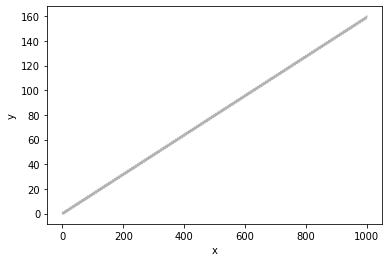

In [3]:
np.random.seed(42)
dim = 1
true_t = np.linspace(0, 1000, 10000+1)
true_y = true_t/(2*np.pi) + np.sin(true_t)
plt.plot(true_t, true_y, "k", lw=1.5, alpha=0.3)
plt.xlabel("x")
plt.ylabel("y")
# In[]
# data
dt   = true_t[1]-true_t[0]
S_train = true_y[:500].reshape(1,-1,1)
S_test  = true_y[500:].reshape(1,-1,1)
T_train = true_t[:500].reshape(1,-1,1)
T_test  = true_t[500:].reshape(1,-1,1)
Batch_size = S_train.shape[1]
X_train = S_train[0,:,:]
X_test  = S_test[:,:,:]
nb_Batch   = int(X_train.shape[0]/Batch_size)
X_train = torch.from_numpy(X_train.reshape(nb_Batch,Batch_size,dim)).double()
T_train = torch.from_numpy(T_train.reshape(nb_Batch,Batch_size,dim)).double()
batch_size_test = 500#X_test.shape[1]
nb_batch_test   = int(X_test.shape[1]/batch_size_test)
X_test  = torch.from_numpy(X_test[:,:-1,:].reshape(nb_batch_test,batch_size_test,-1)).double()
T_test  = torch.from_numpy(T_test[:,:-1,:].reshape(nb_batch_test,batch_size_test,-1)).double()

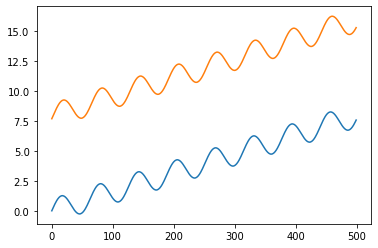

In [4]:
plt.plot(X_train[0,:,0])
plt.plot(X_test[0,:500,0])

In [5]:
# NN params
dim_aug = 2
dim = 1
params = {}
params['description']='simple_QP_model_'+str(dim_aug+dim)
params['dim_input']=dim
params['dim_output']=dim_aug
params['dt_integration'] = dt
params['nb_Batch'] = nb_Batch
params['ntrain']=[100000,1]
params['dim_latent'] = dim_aug-dim
params['Imag_Eigen'] = True
params['Batch_size'] = Batch_size
params['transition_layers'] = 2
params['bi_linear_layers']  = 0
params['dim_hidden_linear'] = 0
params['transition_layers2'] = 0
params['transition_layers']  = 0
params['bi_linear_layers']   = 0
params['dim_hidden_linear']  = 0

In [6]:
# Learning params
params_learn = {}
params_learn['train_dir']    = '/home/saidouala/Documents/KoopmanReduction/Output_models/'
params_learn['train_repo']   = params['description']
params_learn['lr']           = .1
params_learn['len_seq_pred'] = 300
params_learn['Pretrained']   = False

In [7]:
periodic_kernel = Aug_Koopman_Model(params)
model = Aug_Koopman_ModelQP(params,periodic_kernel)
model_Multi_RINN = Multi_INT_net(params,model)
criterion = torch.nn.MSELoss(reduction='elementwise_mean')
optimizer = torch.optim.Adam(model.parameters(),lr = params_learn['lr'])
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, factor = 0.9, patience=10, verbose=True, min_lr = 0.0000001)

In [8]:
# Learning loop
if params_learn['Pretrained']:
    model.load_state_dict(torch.load(output_file_folder + file_name_results + '.pt'))
else:
    aug_inp_count = []
    for t in range(params['ntrain'][0]):
            for b in range(nb_Batch):
                    inp_conc = torch.cat((X_train[b,:,:],model.Periodic_kernel.y_aug[b,:,:]),dim = -1)
                    pred, grad, phi = model(inp_conc[:-1,:],T_train[0,1:,:],T_train[0,:-1,:])[:3]
                    preds, error1 = [pred], [criterion(pred[:,:], inp_conc[1:,:])]#, [criterion(pred[:-1,dim:], inp_conc[1:,dim:])]
    #                for i in range(1,3,1):
    #                    pred, grad, phi = model(inp_conc[:-1,:],T_train[0,1:,:]*i,T_train[0,:-1,:])[:3]
    #                    preds, error2 = [pred], criterion(pred[:-i,:][::i], inp_conc[:-1,:][i:,:][::i])#, [criterion(pred[::2,:][:-1,dim:], inp_conc[1:,dim:])]
    #                    error1.append(error2)
                    loss = torch.stack(error1).sum() #+ 1000*torch.stack(error_aug).mean()
                    loss = loss
                    optimizer.zero_grad()
                    # Zero gradients, perform a backward pass, and update the weights.
                    loss.backward(retain_graph=True)
                    for param_group in optimizer.param_groups:
                        print(param_group['lr'],t,b,loss) 
                    optimizer.step()
            scheduler.step(loss)
    torch.save(model.state_dict(), output_file_folder + file_name_results + '.pt')

0.1 0 0 tensor(11698.9553, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 1 0 tensor(5728.9412, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 2 0 tensor(708.4282, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 3 0 tensor(4201.3509, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 4 0 tensor(6994.3795, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 5 0 tensor(5253.0882, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 6 0 tensor(2064.8446, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 7 0 tensor(368.5815, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 8 0 tensor(840.5458, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 9 0 tensor(2131.6403, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 10 0 tensor(2765.4591, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 11 0 tensor(2402.4804, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 12 0 tensor(1589.7024, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 13 0 tensor(963.2727, dtype=torch.float64, grad_fn=<SumBackward0>)
0.1 1

0.08100000000000002 107 0 tensor(2.4869, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 108 0 tensor(2.4962, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 109 0 tensor(2.4964, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 110 0 tensor(2.4850, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 111 0 tensor(2.4571, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 112 0 tensor(2.4172, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 113 0 tensor(2.3934, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 114 0 tensor(2.4042, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 115 0 tensor(2.4233, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 116 0 tensor(2.4108, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 117 0 tensor(2.3706, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 118 0 tensor(2.3447, dtype=torch.f

0.08100000000000002 220 0 tensor(2.0132, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 221 0 tensor(2.0090, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 222 0 tensor(2.0051, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 223 0 tensor(2.0013, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 224 0 tensor(1.9977, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 225 0 tensor(1.9941, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 226 0 tensor(1.9903, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 227 0 tensor(1.9861, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 228 0 tensor(1.9816, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 229 0 tensor(1.9767, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 230 0 tensor(1.9718, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 231 0 tensor(1.9675, dtype=torch.f

0.08100000000000002 316 0 tensor(1.4397, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 317 0 tensor(1.4316, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 318 0 tensor(1.4230, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 319 0 tensor(1.4145, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 320 0 tensor(1.4063, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 321 0 tensor(1.3979, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 322 0 tensor(1.3896, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 323 0 tensor(1.3819, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 324 0 tensor(1.3749, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 325 0 tensor(1.3680, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 326 0 tensor(1.3596, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 327 0 tensor(1.3493, dtype=torch.f

0.08100000000000002 414 0 tensor(0.6285, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 415 0 tensor(0.6201, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 416 0 tensor(0.6122, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 417 0 tensor(0.6043, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 418 0 tensor(0.5958, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 419 0 tensor(0.5867, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 420 0 tensor(0.5784, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 421 0 tensor(0.5715, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 422 0 tensor(0.5656, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 423 0 tensor(0.5590, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 424 0 tensor(0.5510, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 425 0 tensor(0.5426, dtype=torch.f

0.08100000000000002 513 0 tensor(0.1530, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 514 0 tensor(0.1522, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 515 0 tensor(0.1518, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 516 0 tensor(0.1512, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 517 0 tensor(0.1501, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 518 0 tensor(0.1477, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 519 0 tensor(0.1438, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 520 0 tensor(0.1396, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 521 0 tensor(0.1369, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 522 0 tensor(0.1359, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 523 0 tensor(0.1345, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 524 0 tensor(0.1310, dtype=torch.f

0.08100000000000002 611 0 tensor(0.0316, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 612 0 tensor(0.0321, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 613 0 tensor(0.0322, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 614 0 tensor(0.0318, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 615 0 tensor(0.0307, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 616 0 tensor(0.0294, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 617 0 tensor(0.0281, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 618 0 tensor(0.0269, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 619 0 tensor(0.0259, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 620 0 tensor(0.0252, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 621 0 tensor(0.0248, dtype=torch.float64, grad_fn=<SumBackward0>)
0.08100000000000002 622 0 tensor(0.0246, dtype=torch.f

0.07290000000000002 710 0 tensor(0.0036, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 711 0 tensor(0.0035, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 712 0 tensor(0.0034, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 713 0 tensor(0.0034, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 714 0 tensor(0.0033, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 715 0 tensor(0.0032, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 716 0 tensor(0.0032, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 717 0 tensor(0.0031, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 718 0 tensor(0.0031, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 719 0 tensor(0.0030, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 720 0 tensor(0.0029, dtype=torch.float64, grad_fn=<SumBackward0>)
0.07290000000000002 721 0 tensor(0.0029, dtype=torch.f

0.05904900000000002 806 0 tensor(0.0006, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 807 0 tensor(0.0007, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 808 0 tensor(0.0006, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 809 0 tensor(0.0006, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 810 0 tensor(0.0006, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 811 0 tensor(0.0006, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 812 0 tensor(0.0005, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 813 0 tensor(0.0005, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 814 0 tensor(0.0005, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 815 0 tensor(0.0005, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 816 0 tensor(0.0005, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 817 0 tensor(0.0005, dtype=torch.f

0.05904900000000002 905 0 tensor(8.8277e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 906 0 tensor(8.6608e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 907 0 tensor(8.4970e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 908 0 tensor(8.3363e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 909 0 tensor(8.1785e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 910 0 tensor(8.0234e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 911 0 tensor(7.8711e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 912 0 tensor(7.7216e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 913 0 tensor(7.5748e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 914 0 tensor(7.4307e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 915 0 tensor(7.2892e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900

0.05904900000000002 1004 0 tensor(1.2251e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1005 0 tensor(1.1998e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1006 0 tensor(1.1750e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1007 0 tensor(1.1507e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1008 0 tensor(1.1269e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1009 0 tensor(1.1035e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1010 0 tensor(1.0806e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1011 0 tensor(1.0582e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1012 0 tensor(1.0362e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1013 0 tensor(1.0147e-05, dtype=torch.float64, grad_fn=<SumBackward0>)
0.05904900000000002 1014 0 tensor(9.9359e-06, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03874204890000002 1102 0 tensor(2.3435e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1103 0 tensor(2.6180e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1104 0 tensor(2.2356e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1105 0 tensor(2.2738e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1106 0 tensor(2.3317e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1107 0 tensor(2.0340e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1108 0 tensor(2.1792e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1109 0 tensor(2.0708e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1110 0 tensor(1.9270e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1111 0 tensor(2.0437e-06, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1112 0 tensor(1.8739e-06, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03874204890000002 1201 0 tensor(4.6227e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1202 0 tensor(4.5521e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1203 0 tensor(4.4822e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1204 0 tensor(4.4134e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1205 0 tensor(4.3458e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1206 0 tensor(4.2790e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1207 0 tensor(4.2132e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1208 0 tensor(4.1485e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1209 0 tensor(4.0845e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1210 0 tensor(4.0216e-07, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1211 0 tensor(3.9596e-07, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03874204890000002 1300 0 tensor(9.4604e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1301 0 tensor(9.3043e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1302 0 tensor(9.1506e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1303 0 tensor(8.9994e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1304 0 tensor(8.8505e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1305 0 tensor(8.7041e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1306 0 tensor(8.5599e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1307 0 tensor(8.4180e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1308 0 tensor(8.2783e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1309 0 tensor(8.1409e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1310 0 tensor(8.0056e-08, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03874204890000002 1399 0 tensor(1.7128e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1400 0 tensor(1.6824e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1401 0 tensor(1.6525e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1402 0 tensor(1.6231e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1403 0 tensor(1.5943e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1404 0 tensor(1.5659e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1405 0 tensor(1.5380e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1406 0 tensor(1.5106e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1407 0 tensor(1.4836e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1408 0 tensor(1.4571e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1409 0 tensor(1.4311e-08, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03874204890000002 1498 0 tensor(2.7273e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1499 0 tensor(2.6753e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1500 0 tensor(2.6243e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1501 0 tensor(2.5742e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1502 0 tensor(2.5251e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1503 0 tensor(2.4768e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1504 0 tensor(2.4295e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1505 0 tensor(2.3830e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1506 0 tensor(2.3374e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1507 0 tensor(2.2926e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1508 0 tensor(2.2486e-09, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03874204890000002 1597 0 tensor(3.7946e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1598 0 tensor(3.7171e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1599 0 tensor(3.6411e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1600 0 tensor(3.5667e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1601 0 tensor(3.4937e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1602 0 tensor(3.4221e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1603 0 tensor(3.3520e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1604 0 tensor(3.2832e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1605 0 tensor(3.2159e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1606 0 tensor(3.1498e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03874204890000002 1607 0 tensor(3.0851e-10, dtype=torch.float64, grad_fn=<SumBackward0>)

0.03486784401000002 1696 0 tensor(1.0192e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03486784401000002 1697 0 tensor(1.2106e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03486784401000002 1698 0 tensor(2.6658e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03486784401000002 1699 0 tensor(3.4424e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03486784401000002 1700 0 tensor(3.1250e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  1701: reducing learning rate of group 0 to 3.1381e-02.
0.03138105960900001 1701 0 tensor(2.0119e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03138105960900001 1702 0 tensor(4.3700e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03138105960900001 1703 0 tensor(1.3732e-09, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03138105960900001 1704 0 tensor(1.2096e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03138105960900001 1705 0 tensor(1.4407e-08, dtype=torch.float64, grad_fn=<SumBackward0>)
0.03138105960900001 1706 0 t

0.028242953648100012 1794 0 tensor(9.7587e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1795 0 tensor(9.7047e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1796 0 tensor(8.7943e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1797 0 tensor(8.6930e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1798 0 tensor(9.0686e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1799 0 tensor(8.6694e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1800 0 tensor(8.1110e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1801 0 tensor(8.2348e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1802 0 tensor(8.3164e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1803 0 tensor(7.8674e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1804 0 tensor(7.5989e-12, dtype=torch.float64, grad_fn=<Sum

0.028242953648100012 1893 0 tensor(1.6365e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1894 0 tensor(1.6078e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1895 0 tensor(1.5795e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1896 0 tensor(1.5517e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1897 0 tensor(1.5244e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1898 0 tensor(1.4975e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1899 0 tensor(1.4711e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1900 0 tensor(1.4451e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1901 0 tensor(1.4196e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1902 0 tensor(1.3945e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1903 0 tensor(1.3699e-12, dtype=torch.float64, grad_fn=<Sum

0.028242953648100012 1991 0 tensor(2.7228e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1992 0 tensor(2.6719e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1993 0 tensor(2.6219e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1994 0 tensor(2.5727e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1995 0 tensor(2.5245e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1996 0 tensor(2.4771e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1997 0 tensor(2.4306e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1998 0 tensor(2.3850e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 1999 0 tensor(2.3402e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2000 0 tensor(2.2961e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2001 0 tensor(2.2529e-13, dtype=torch.float64, grad_fn=<Sum

0.028242953648100012 2090 0 tensor(3.9519e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2091 0 tensor(3.8732e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2092 0 tensor(3.7959e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2093 0 tensor(3.7202e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2094 0 tensor(3.6460e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2095 0 tensor(3.5731e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2096 0 tensor(3.5017e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2097 0 tensor(3.4317e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2098 0 tensor(3.3630e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2099 0 tensor(3.2957e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2100 0 tensor(3.2296e-14, dtype=torch.float64, grad_fn=<Sum

0.028242953648100012 2189 0 tensor(5.0580e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2190 0 tensor(4.9508e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2191 0 tensor(4.8460e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2192 0 tensor(4.7436e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2193 0 tensor(4.6437e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2194 0 tensor(4.5466e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2195 0 tensor(4.4532e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2196 0 tensor(4.3648e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2197 0 tensor(4.2846e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2198 0 tensor(4.2186e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
0.028242953648100012 2199 0 tensor(4.1794e-15, dtype=torch.float64, grad_fn=<Sum

0.01853020188851842 2288 0 tensor(9.7920e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2289 0 tensor(9.9657e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2290 0 tensor(9.0020e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2291 0 tensor(9.4133e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2292 0 tensor(9.2365e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2293 0 tensor(8.6156e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2294 0 tensor(8.9794e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2295 0 tensor(8.6308e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2296 0 tensor(8.2834e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2297 0 tensor(8.5252e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2298 0 tensor(8.1319e-16, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01853020188851842 2387 0 tensor(2.1426e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2388 0 tensor(2.1103e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2389 0 tensor(2.0784e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2390 0 tensor(2.0470e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2391 0 tensor(2.0161e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2392 0 tensor(1.9856e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2393 0 tensor(1.9555e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2394 0 tensor(1.9259e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2395 0 tensor(1.8967e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2396 0 tensor(1.8680e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2397 0 tensor(1.8396e-16, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01853020188851842 2486 0 tensor(4.5471e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2487 0 tensor(4.4744e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2488 0 tensor(4.4028e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2489 0 tensor(4.3322e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2490 0 tensor(4.2628e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2491 0 tensor(4.1945e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2492 0 tensor(4.1271e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2493 0 tensor(4.0609e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2494 0 tensor(3.9956e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2495 0 tensor(3.9314e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2496 0 tensor(3.8682e-17, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01853020188851842 2585 0 tensor(8.7845e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2586 0 tensor(8.6356e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2587 0 tensor(8.4890e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2588 0 tensor(8.3449e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2589 0 tensor(8.2031e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2590 0 tensor(8.0637e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2591 0 tensor(7.9265e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2592 0 tensor(7.7916e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2593 0 tensor(7.6589e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2594 0 tensor(7.5284e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2595 0 tensor(7.4001e-18, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01853020188851842 2684 0 tensor(1.5365e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2685 0 tensor(1.5088e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2686 0 tensor(1.4817e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2687 0 tensor(1.4550e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2688 0 tensor(1.4288e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2689 0 tensor(1.4031e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2690 0 tensor(1.3778e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2691 0 tensor(1.3530e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2692 0 tensor(1.3285e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2693 0 tensor(1.3045e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2694 0 tensor(1.2810e-18, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01853020188851842 2783 0 tensor(2.4188e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2784 0 tensor(2.3727e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2785 0 tensor(2.3275e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2786 0 tensor(2.2831e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2787 0 tensor(2.2395e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2788 0 tensor(2.1968e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2789 0 tensor(2.1548e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2790 0 tensor(2.1136e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2791 0 tensor(2.0732e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2792 0 tensor(2.0335e-19, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2793 0 tensor(1.9945e-19, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01853020188851842 2882 0 tensor(3.4055e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2883 0 tensor(3.3368e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2884 0 tensor(3.2693e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2885 0 tensor(3.2032e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2886 0 tensor(3.1385e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2887 0 tensor(3.0750e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2888 0 tensor(3.0127e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2889 0 tensor(2.9517e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2890 0 tensor(2.8918e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2891 0 tensor(2.8332e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01853020188851842 2892 0 tensor(2.7757e-20, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01667718169966658 2981 0 tensor(2.5412e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01667718169966658 2982 0 tensor(5.7563e-21, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01667718169966658 2983 0 tensor(9.0306e-21, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01667718169966658 2984 0 tensor(2.6144e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01667718169966658 2985 0 tensor(3.8707e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01667718169966658 2986 0 tensor(3.5815e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01667718169966658 2987 0 tensor(2.1277e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  2988: reducing learning rate of group 0 to 1.5009e-02.
0.015009463529699923 2988 0 tensor(7.5564e-21, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 2989 0 tensor(4.2963e-21, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 2990 0 tensor(1.0584e-20, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 2991

0.015009463529699923 3080 0 tensor(7.6905e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3081 0 tensor(7.5503e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3082 0 tensor(7.4097e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3083 0 tensor(7.2759e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3084 0 tensor(7.1482e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3085 0 tensor(7.0210e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3086 0 tensor(6.8923e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3087 0 tensor(6.7657e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3088 0 tensor(6.6443e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3089 0 tensor(6.5265e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3090 0 tensor(6.4087e-22, dtype=torch.float64, grad_fn=<Sum

0.015009463529699923 3179 0 tensor(1.2130e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3180 0 tensor(1.1899e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3181 0 tensor(1.1672e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3182 0 tensor(1.1450e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3183 0 tensor(1.1232e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3184 0 tensor(1.1020e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3185 0 tensor(1.0809e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3186 0 tensor(1.0602e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3187 0 tensor(1.0400e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3188 0 tensor(1.0201e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3189 0 tensor(1.0005e-22, dtype=torch.float64, grad_fn=<Sum

0.015009463529699923 3277 0 tensor(1.7522e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3278 0 tensor(1.7173e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3279 0 tensor(1.6825e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3280 0 tensor(1.6487e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3281 0 tensor(1.6152e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3282 0 tensor(1.5828e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3283 0 tensor(1.5511e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3284 0 tensor(1.5199e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3285 0 tensor(1.4894e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3286 0 tensor(1.4588e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
0.015009463529699923 3287 0 tensor(1.4296e-23, dtype=torch.float64, grad_fn=<Sum

0.013508517176729932 3376 0 tensor(3.6910e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3377 0 tensor(2.3621e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3378 0 tensor(3.1055e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3379 0 tensor(4.6448e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3380 0 tensor(5.2919e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3381 0 tensor(4.4789e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3382 0 tensor(3.0205e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3383 0 tensor(2.1350e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3384 0 tensor(2.3173e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3385 0 tensor(3.0842e-24, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3386 0 tensor(3.5666e-24, dtype=torch.float64, grad_fn=<Sum

0.013508517176729932 3475 0 tensor(3.3621e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3476 0 tensor(3.2875e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3477 0 tensor(3.2305e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3478 0 tensor(3.1579e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3479 0 tensor(3.0946e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3480 0 tensor(3.0297e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3481 0 tensor(2.9785e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3482 0 tensor(2.9172e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3483 0 tensor(2.8646e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3484 0 tensor(2.8028e-25, dtype=torch.float64, grad_fn=<SumBackward0>)
0.013508517176729932 3485 0 tensor(2.7409e-25, dtype=torch.float64, grad_fn=<Sum

0.01215766545905694 3574 0 tensor(7.2641e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3575 0 tensor(7.8925e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3576 0 tensor(7.0007e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3577 0 tensor(5.4401e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3578 0 tensor(4.5967e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3579 0 tensor(4.8702e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3580 0 tensor(5.5673e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3581 0 tensor(5.8584e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3582 0 tensor(5.4358e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3583 0 tensor(4.6209e-26, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3584 0 tensor(4.0602e-26, dtype=torch.float64, grad_fn=<SumBackward0>)

0.01215766545905694 3672 0 tensor(8.2380e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3673 0 tensor(8.0446e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3674 0 tensor(7.8780e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3675 0 tensor(7.8462e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3676 0 tensor(7.5549e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3677 0 tensor(7.5793e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3678 0 tensor(7.4157e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3679 0 tensor(7.2335e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3680 0 tensor(7.1466e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3681 0 tensor(6.9536e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.01215766545905694 3682 0 tensor(6.8134e-27, dtype=torch.float64, grad_fn=<SumBackward0>)

0.010941898913151246 3770 0 tensor(2.3443e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3771 0 tensor(2.2823e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3772 0 tensor(2.2971e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3773 0 tensor(2.3596e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3774 0 tensor(2.3721e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3775 0 tensor(2.3233e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3776 0 tensor(2.1593e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3777 0 tensor(2.1525e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3778 0 tensor(2.1926e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3779 0 tensor(2.1913e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.010941898913151246 3780 0 tensor(2.1634e-27, dtype=torch.float64, grad_fn=<Sum

0.00886293811965251 3869 0 tensor(1.5527e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3870 0 tensor(1.5096e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3871 0 tensor(1.5195e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3872 0 tensor(1.5146e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3873 0 tensor(1.5116e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3874 0 tensor(1.5349e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3875 0 tensor(1.5428e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3876 0 tensor(1.4977e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3877 0 tensor(1.5226e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3878 0 tensor(1.5259e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00886293811965251 3879 0 tensor(1.4930e-27, dtype=torch.float64, grad_fn=<SumBackward0>)

0.005233476330273611 3968 0 tensor(1.3744e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3969 0 tensor(1.4240e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3970 0 tensor(1.4210e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3971 0 tensor(1.4114e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3972 0 tensor(1.4048e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3973 0 tensor(1.4086e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3974 0 tensor(1.4228e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3975 0 tensor(1.4157e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3976 0 tensor(1.4265e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3977 0 tensor(1.4058e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.005233476330273611 3978 0 tensor(1.3815e-27, dtype=torch.float64, grad_fn=<Sum

0.003433683820292517 4067 0 tensor(1.3770e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.003433683820292517 4068 0 tensor(1.4138e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.003433683820292517 4069 0 tensor(1.4011e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.003433683820292517 4070 0 tensor(1.3641e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4071: reducing learning rate of group 0 to 3.0903e-03.
0.0030903154382632653 4071 0 tensor(1.3732e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0030903154382632653 4072 0 tensor(1.3877e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0030903154382632653 4073 0 tensor(1.3811e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0030903154382632653 4074 0 tensor(1.3869e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0030903154382632653 4075 0 tensor(1.3740e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0030903154382632653 4076 0 tensor(1.3686e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0030903154

0.0013302794647291152 4166 0 tensor(1.3778e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4167 0 tensor(1.3786e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4168 0 tensor(1.3627e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4169 0 tensor(1.3641e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4170 0 tensor(1.3667e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4171 0 tensor(1.3644e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4172 0 tensor(1.3788e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0013302794647291152 4173 0 tensor(1.3789e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4174: reducing learning rate of group 0 to 1.1973e-03.
0.0011972515182562037 4174 0 tensor(1.3776e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0011972515182562037 4175 0 tensor(1.3848e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.001197

0.0005153775207320121 4265 0 tensor(1.3587e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4266 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4267 0 tensor(1.3588e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4268 0 tensor(1.3594e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4269 0 tensor(1.3591e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4270 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4271 0 tensor(1.3739e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0005153775207320121 4272 0 tensor(1.3741e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4273: reducing learning rate of group 0 to 4.6384e-04.
0.00046383976865881093 4273 0 tensor(1.3741e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00046383976865881093 4274 0 tensor(1.3741e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.0004

0.00019966781110160382 4364 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4365 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4366 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4367 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4368 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4369 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4370 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00019966781110160382 4371 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4372: reducing learning rate of group 0 to 1.7970e-04.
0.00017970102999144343 4372 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
0.00017970102999144343 4373 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>

7.7355401014543e-05 4463 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4464 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4465 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4466 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4467 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4468 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4469 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
7.7355401014543e-05 4470 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4471: reducing learning rate of group 0 to 6.9620e-05.
6.96198609130887e-05 4471 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.96198609130887e-05 4472 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.96198609130887e-05 4473 

2.9969067287845354e-05 4562 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4563 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4564 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4565 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4566 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4567 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4568 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.9969067287845354e-05 4569 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4570: reducing learning rate of group 0 to 2.6972e-05.
2.697216055906082e-05 4570 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.697216055906082e-05 4571 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)


1.1610630703530954e-05 4661 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4662 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4663 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4664 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4665 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4666 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4667 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.1610630703530954e-05 4668 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4669: reducing learning rate of group 0 to 1.0450e-05.
1.0449567633177859e-05 4669 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0449567633177859e-05 4670 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>

4.498196224760377e-06 4759 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4760 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4761 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4762 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4763 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4764 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4765 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4766 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.498196224760377e-06 4767 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4768: reducing learning rate of group 0 to 4.0484e-06.
4.048376602284339e-06 4768 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
4.048376

1.7426933810146194e-06 4858 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4859 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4860 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4861 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4862 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4863 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4864 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4865 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.7426933810146194e-06 4866 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4867: reducing learning rate of group 0 to 1.5684e-06.
1.5684240429131575e-06 4867 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>

6.751551218497471e-07 4957 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4958 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4959 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4960 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4961 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4962 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4963 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4964 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.751551218497471e-07 4965 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  4966: reducing learning rate of group 0 to 6.0764e-07.
6.076396096647724e-07 4966 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
6.076396

2.615689274578837e-07 5056 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5057 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5058 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5059 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5060 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5061 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5062 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5063 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.615689274578837e-07 5064 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
Epoch  5065: reducing learning rate of group 0 to 2.3541e-07.
2.354120347120953e-07 5065 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
2.354120

1.0133716178293884e-07 5155 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5156 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5157 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5158 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5159 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5160 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5161 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5162 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5163 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5164 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5165 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5254 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5255 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5256 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5257 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5258 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5259 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5260 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5261 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5262 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5263 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5264 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5353 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5354 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5355 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5356 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5357 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5358 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5359 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5360 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5361 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5362 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5363 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5451 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5452 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5453 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5454 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5455 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5456 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5457 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5458 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5459 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5460 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5461 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5550 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5551 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5552 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5553 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5554 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5555 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5556 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5557 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5558 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5559 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5560 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5649 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5650 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5651 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5652 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5653 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5654 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5655 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5656 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5657 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5658 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5659 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5748 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5749 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5750 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5751 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5752 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5753 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5754 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5755 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5756 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5757 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5758 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5847 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5848 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5849 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5850 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5851 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5852 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5853 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5854 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5855 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5856 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5857 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 5946 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5947 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5948 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5949 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5950 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5951 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5952 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5953 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5954 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5955 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 5956 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6045 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6046 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6047 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6048 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6049 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6050 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6051 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6052 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6053 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6054 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6055 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6144 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6145 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6146 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6147 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6148 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6149 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6150 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6151 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6152 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6153 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6154 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6242 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6243 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6244 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6245 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6246 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6247 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6248 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6249 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6250 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6251 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6252 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6341 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6342 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6343 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6344 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6345 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6346 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6347 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6348 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6349 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6350 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6351 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6440 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6441 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6442 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6443 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6444 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6445 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6446 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6447 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6448 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6449 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6450 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6539 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6540 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6541 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6542 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6543 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6544 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6545 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6546 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6547 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6548 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6549 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6638 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6639 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6640 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6641 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6642 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6643 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6644 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6645 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6646 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6647 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6648 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6737 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6738 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6739 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6740 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6741 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6742 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6743 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6744 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6745 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6746 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6747 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6835 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6836 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6837 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6838 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6839 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6840 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6841 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6842 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6843 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6844 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6845 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 6934 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6935 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6936 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6937 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6938 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6939 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6940 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6941 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6942 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6943 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 6944 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7033 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7034 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7035 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7036 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7037 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7038 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7039 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7040 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7041 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7042 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7043 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7131 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7132 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7133 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7134 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7135 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7136 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7137 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7138 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7139 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7140 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7141 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7230 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7231 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7232 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7233 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7234 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7235 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7236 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7237 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7238 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7239 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7240 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7329 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7330 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7331 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7332 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7333 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7334 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7335 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7336 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7337 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7338 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7339 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7428 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7429 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7430 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7431 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7432 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7433 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7434 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7435 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7436 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7437 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7438 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7527 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7528 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7529 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7530 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7531 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7532 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7533 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7534 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7535 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7536 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7537 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7626 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7627 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7628 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7629 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7630 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7631 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7632 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7633 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7634 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7635 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7636 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7725 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7726 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7727 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7728 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7729 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7730 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7731 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7732 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7733 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7734 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7735 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7824 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7825 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7826 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7827 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7828 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7829 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7830 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7831 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7832 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7833 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7834 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 7923 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7924 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7925 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7926 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7927 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7928 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7929 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7930 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7931 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7932 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 7933 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8022 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8023 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8024 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8025 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8026 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8027 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8028 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8029 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8030 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8031 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8032 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8121 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8122 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8123 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8124 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8125 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8126 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8127 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8128 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8129 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8130 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8131 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8220 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8221 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8222 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8223 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8224 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8225 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8226 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8227 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8228 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8229 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8230 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8319 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8320 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8321 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8322 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8323 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8324 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8325 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8326 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8327 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8328 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8329 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8418 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8419 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8420 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8421 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8422 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8423 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8424 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8425 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8426 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8427 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8428 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8517 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8518 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8519 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8520 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8521 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8522 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8523 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8524 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8525 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8526 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8527 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8615 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8616 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8617 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8618 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8619 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8620 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8621 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8622 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8623 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8624 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8625 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8714 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8715 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8716 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8717 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8718 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8719 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8720 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8721 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8722 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8723 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8724 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8813 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8814 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8815 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8816 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8817 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8818 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8819 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8820 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8821 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8822 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8823 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 8912 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8913 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8914 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8915 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8916 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8917 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8918 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8919 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8920 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8921 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 8922 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9011 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9012 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9013 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9014 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9015 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9016 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9017 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9018 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9019 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9020 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9021 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9110 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9111 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9112 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9113 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9114 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9115 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9116 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9117 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9118 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9119 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9120 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9209 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9210 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9211 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9212 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9213 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9214 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9215 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9216 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9217 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9218 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9219 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9308 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9309 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9310 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9311 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9312 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9313 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9314 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9315 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9316 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9317 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9318 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9405 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9406 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9407 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9408 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9409 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9410 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9411 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9412 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9413 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9414 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9415 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9504 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9505 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9506 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9507 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9508 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9509 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9510 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9511 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9512 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9513 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9514 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9603 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9604 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9605 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9606 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9607 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9608 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9609 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9610 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9611 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9612 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9613 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9702 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9703 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9704 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9705 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9706 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9707 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9708 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9709 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9710 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9711 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9712 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9801 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9802 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9803 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9804 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9805 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9806 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9807 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9808 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9809 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9810 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9811 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9900 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9901 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9902 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9903 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9904 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9905 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9906 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9907 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9908 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9909 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 9910 0 tensor(1.3576e-27, dtype=torch

1.0133716178293884e-07 9999 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10000 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10001 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10002 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10003 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10004 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10005 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10006 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10007 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10008 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10009 0 tensor(1.3576e-27, d

1.0133716178293884e-07 10098 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10099 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10100 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10101 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10102 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10103 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10104 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10105 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10106 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10107 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10108 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10197 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10198 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10199 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10200 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10201 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10202 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10203 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10204 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10205 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10206 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10207 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10296 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10297 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10298 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10299 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10300 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10301 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10302 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10303 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10304 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10305 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10306 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10394 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10395 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10396 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10397 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10398 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10399 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10400 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10401 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10402 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10403 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10404 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10513 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10514 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10515 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10516 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10517 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10518 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10519 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10520 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10521 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10522 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10523 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10612 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10613 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10614 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10615 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10616 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10617 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10618 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10619 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10620 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10621 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10622 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10711 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10712 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10713 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10714 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10715 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10716 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10717 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10718 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10719 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10720 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10721 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10810 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10811 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10812 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10813 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10814 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10815 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10816 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10817 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10818 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10819 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10820 0 tensor(1.3576e-27, 

1.0133716178293884e-07 10909 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10910 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10911 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10912 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10913 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10914 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10915 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10916 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10917 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10918 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 10919 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11008 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11009 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11010 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11011 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11012 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11013 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11014 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11015 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11016 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11017 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11018 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11107 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11108 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11109 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11110 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11111 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11112 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11113 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11114 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11115 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11116 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11117 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11206 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11207 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11208 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11209 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11210 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11211 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11212 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11213 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11214 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11215 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11216 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11305 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11306 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11307 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11308 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11309 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11310 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11311 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11312 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11313 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11314 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11315 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11401 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11402 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11403 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11404 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11405 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11406 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11407 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11408 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11409 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11410 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11411 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11500 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11501 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11502 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11503 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11504 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11505 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11506 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11507 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11508 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11509 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11510 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11599 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11600 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11601 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11602 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11603 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11604 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11605 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11606 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11607 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11608 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11609 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11698 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11699 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11700 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11701 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11702 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11703 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11704 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11705 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11706 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11707 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11708 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11796 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11797 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11798 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11799 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11800 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11801 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11802 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11803 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11804 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11805 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11806 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11895 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11896 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11897 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11898 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11899 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11900 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11901 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11902 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11903 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11904 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11905 0 tensor(1.3576e-27, 

1.0133716178293884e-07 11994 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11995 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11996 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11997 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11998 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 11999 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12000 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12001 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12002 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12003 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12004 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12093 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12094 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12095 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12096 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12097 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12098 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12099 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12100 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12101 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12102 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12103 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12192 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12193 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12194 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12195 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12196 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12197 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12198 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12199 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12200 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12201 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12202 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12291 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12292 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12293 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12294 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12295 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12296 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12297 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12298 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12299 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12300 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12301 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12390 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12391 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12392 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12393 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12394 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12395 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12396 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12397 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12398 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12399 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12400 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12489 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12490 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12491 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12492 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12493 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12494 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12495 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12496 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12497 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12498 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12499 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12588 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12589 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12590 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12591 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12592 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12593 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12594 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12595 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12596 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12597 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12598 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12687 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12688 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12689 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12690 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12691 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12692 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12693 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12694 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12695 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12696 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12697 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12786 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12787 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12788 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12789 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12790 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12791 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12792 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12793 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12794 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12795 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12796 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12885 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12886 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12887 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12888 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12889 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12890 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12891 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12892 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12893 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12894 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12895 0 tensor(1.3576e-27, 

1.0133716178293884e-07 12984 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12985 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12986 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12987 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12988 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12989 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12990 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12991 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12992 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12993 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 12994 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13083 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13084 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13085 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13086 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13087 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13088 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13089 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13090 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13091 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13092 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13093 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13182 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13183 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13184 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13185 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13186 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13187 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13188 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13189 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13190 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13191 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13192 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13280 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13281 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13282 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13283 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13284 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13285 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13286 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13287 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13288 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13289 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13290 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13379 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13380 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13381 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13382 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13383 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13384 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13385 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13386 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13387 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13388 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13389 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13477 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13478 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13479 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13480 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13481 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13482 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13483 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13484 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13485 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13486 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13487 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13576 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13577 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13578 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13579 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13580 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13581 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13582 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13583 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13584 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13585 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13586 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13675 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13676 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13677 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13678 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13679 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13680 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13681 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13682 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13683 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13684 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13685 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13774 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13775 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13776 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13777 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13778 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13779 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13780 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13781 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13782 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13783 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13784 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13873 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13874 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13875 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13876 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13877 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13878 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13879 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13880 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13881 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13882 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13883 0 tensor(1.3576e-27, 

1.0133716178293884e-07 13972 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13973 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13974 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13975 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13976 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13977 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13978 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13979 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13980 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13981 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 13982 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14071 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14072 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14073 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14074 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14075 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14076 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14077 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14078 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14079 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14080 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14081 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14170 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14171 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14172 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14173 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14174 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14175 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14176 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14177 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14178 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14179 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14180 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14269 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14270 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14271 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14272 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14273 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14274 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14275 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14276 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14277 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14278 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14279 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14368 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14369 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14370 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14371 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14372 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14373 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14374 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14375 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14376 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14377 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14378 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14467 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14468 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14469 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14470 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14471 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14472 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14473 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14474 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14475 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14476 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14477 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14566 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14567 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14568 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14569 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14570 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14571 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14572 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14573 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14574 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14575 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14576 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14665 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14666 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14667 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14668 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14669 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14670 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14671 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14672 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14673 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14674 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14675 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14764 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14765 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14766 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14767 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14768 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14769 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14770 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14771 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14772 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14773 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14774 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14863 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14864 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14865 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14866 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14867 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14868 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14869 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14870 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14871 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14872 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14873 0 tensor(1.3576e-27, 

1.0133716178293884e-07 14962 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14963 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14964 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14965 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14966 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14967 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14968 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14969 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14970 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14971 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 14972 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15061 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15062 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15063 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15064 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15065 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15066 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15067 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15068 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15069 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15070 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15071 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15160 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15161 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15162 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15163 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15164 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15165 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15166 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15167 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15168 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15169 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15170 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15259 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15260 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15261 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15262 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15263 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15264 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15265 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15266 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15267 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15268 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15269 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15358 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15359 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15360 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15361 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15362 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15363 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15364 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15365 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15366 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15367 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15368 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15457 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15458 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15459 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15460 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15461 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15462 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15463 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15464 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15465 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15466 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15467 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15556 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15557 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15558 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15559 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15560 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15561 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15562 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15563 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15564 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15565 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15566 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15655 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15656 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15657 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15658 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15659 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15660 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15661 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15662 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15663 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15664 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15665 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15754 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15755 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15756 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15757 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15758 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15759 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15760 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15761 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15762 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15763 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15764 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15852 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15853 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15854 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15855 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15856 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15857 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15858 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15859 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15860 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15861 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15862 0 tensor(1.3576e-27, 

1.0133716178293884e-07 15951 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15952 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15953 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15954 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15955 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15956 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15957 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15958 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15959 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15960 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 15961 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16050 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16051 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16052 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16053 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16054 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16055 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16056 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16057 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16058 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16059 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16060 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16149 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16150 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16151 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16152 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16153 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16154 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16155 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16156 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16157 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16158 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16159 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16248 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16249 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16250 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16251 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16252 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16253 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16254 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16255 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16256 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16257 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16258 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16347 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16348 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16349 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16350 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16351 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16352 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16353 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16354 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16355 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16356 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16357 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16446 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16447 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16448 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16449 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16450 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16451 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16452 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16453 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16454 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16455 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16456 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16544 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16545 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16546 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16547 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16548 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16549 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16550 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16551 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16552 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16553 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16554 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16642 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16643 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16644 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16645 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16646 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16647 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16648 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16649 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16650 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16651 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16652 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16741 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16742 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16743 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16744 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16745 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16746 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16747 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16748 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16749 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16750 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16751 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16840 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16841 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16842 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16843 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16844 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16845 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16846 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16847 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16848 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16849 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16850 0 tensor(1.3576e-27, 

1.0133716178293884e-07 16939 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16940 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16941 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16942 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16943 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16944 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16945 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16946 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16947 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16948 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 16949 0 tensor(1.3576e-27, 

1.0133716178293884e-07 17038 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17039 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17040 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17041 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17042 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17043 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17044 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17045 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17046 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17047 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17048 0 tensor(1.3576e-27, 

1.0133716178293884e-07 17137 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17138 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17139 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17140 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17141 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17142 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17143 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17144 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17145 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17146 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17147 0 tensor(1.3576e-27, 

1.0133716178293884e-07 17236 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17237 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17238 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17239 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17240 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17241 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17242 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17243 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17244 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17245 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17246 0 tensor(1.3576e-27, 

1.0133716178293884e-07 17335 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17336 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17337 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17338 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17339 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17340 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17341 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17342 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17343 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17344 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17345 0 tensor(1.3576e-27, 

1.0133716178293884e-07 17434 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17435 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17436 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17437 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17438 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17439 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17440 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17441 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17442 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17443 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17444 0 tensor(1.3575e-27, 

1.0133716178293884e-07 17533 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17534 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17535 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17536 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17537 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17538 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17539 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17540 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17541 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17542 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17543 0 tensor(1.3576e-27, 

1.0133716178293884e-07 17632 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17633 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17634 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17635 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17636 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17637 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17638 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17639 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17640 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17641 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17642 0 tensor(1.3575e-27, 

1.0133716178293884e-07 17731 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17732 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17733 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17734 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17735 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17736 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17737 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17738 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17739 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17740 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17741 0 tensor(1.3575e-27, 

1.0133716178293884e-07 17830 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17831 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17832 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17833 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17834 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17835 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17836 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17837 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17838 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17839 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17840 0 tensor(1.3575e-27, 

1.0133716178293884e-07 17929 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17930 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17931 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17932 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17933 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17934 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17935 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17936 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17937 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17938 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 17939 0 tensor(1.3576e-27, 

1.0133716178293884e-07 18028 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18029 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18030 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18031 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18032 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18033 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18034 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18035 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18036 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18037 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18038 0 tensor(1.3575e-27, 

1.0133716178293884e-07 18127 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18128 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18129 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18130 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18131 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18132 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18133 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18134 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18135 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18136 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18137 0 tensor(1.3577e-27, 

1.0133716178293884e-07 18225 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18226 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18227 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18228 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18229 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18230 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18231 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18232 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18233 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18234 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18235 0 tensor(1.3577e-27, 

1.0133716178293884e-07 18324 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18325 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18326 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18327 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18328 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18329 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18330 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18331 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18332 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18333 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18334 0 tensor(1.3577e-27, 

1.0133716178293884e-07 18423 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18424 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18425 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18426 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18427 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18428 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18429 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18430 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18431 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18432 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18433 0 tensor(1.3576e-27, 

1.0133716178293884e-07 18522 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18523 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18524 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18525 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18526 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18527 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18528 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18529 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18530 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18531 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18532 0 tensor(1.3575e-27, 

1.0133716178293884e-07 18621 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18622 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18623 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18624 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18625 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18626 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18627 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18628 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18629 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18630 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18631 0 tensor(1.3576e-27, 

1.0133716178293884e-07 18720 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18721 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18722 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18723 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18724 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18725 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18726 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18727 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18728 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18729 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18730 0 tensor(1.3575e-27, 

1.0133716178293884e-07 18819 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18820 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18821 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18822 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18823 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18824 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18825 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18826 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18827 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18828 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18829 0 tensor(1.3580e-27, 

1.0133716178293884e-07 18918 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18919 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18920 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18921 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18922 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18923 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18924 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18925 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18926 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18927 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 18928 0 tensor(1.3577e-27, 

1.0133716178293884e-07 19017 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19018 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19019 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19020 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19021 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19022 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19023 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19024 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19025 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19026 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19027 0 tensor(1.3574e-27, 

1.0133716178293884e-07 19114 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19115 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19116 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19117 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19118 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19119 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19120 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19121 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19122 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19123 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19124 0 tensor(1.3577e-27, 

1.0133716178293884e-07 19213 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19214 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19215 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19216 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19217 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19218 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19219 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19220 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19221 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19222 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19223 0 tensor(1.3578e-27, 

1.0133716178293884e-07 19312 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19313 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19314 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19315 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19316 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19317 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19318 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19319 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19320 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19321 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19322 0 tensor(1.3577e-27, 

1.0133716178293884e-07 19411 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19412 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19413 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19414 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19415 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19416 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19417 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19418 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19419 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19420 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19421 0 tensor(1.3580e-27, 

1.0133716178293884e-07 19510 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19511 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19512 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19513 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19514 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19515 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19516 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19517 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19518 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19519 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19520 0 tensor(1.3579e-27, 

1.0133716178293884e-07 19609 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19610 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19611 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19612 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19613 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19614 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19615 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19616 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19617 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19618 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19619 0 tensor(1.3575e-27, 

1.0133716178293884e-07 19708 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19709 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19710 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19711 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19712 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19713 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19714 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19715 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19716 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19717 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19718 0 tensor(1.3579e-27, 

1.0133716178293884e-07 19807 0 tensor(1.3736e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19808 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19809 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19810 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19811 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19812 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19813 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19814 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19815 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19816 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19817 0 tensor(1.3576e-27, 

1.0133716178293884e-07 19905 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19906 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19907 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19908 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19909 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19910 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19911 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19912 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19913 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19914 0 tensor(1.3581e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 19915 0 tensor(1.3581e-27, 

1.0133716178293884e-07 20004 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20005 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20006 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20007 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20008 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20009 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20010 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20011 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20012 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20013 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20014 0 tensor(1.3734e-27, 

1.0133716178293884e-07 20103 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20104 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20105 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20106 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20107 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20108 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20109 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20110 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20111 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20112 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20113 0 tensor(1.3576e-27, 

1.0133716178293884e-07 20202 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20203 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20204 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20205 0 tensor(1.3511e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20206 0 tensor(1.3509e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20207 0 tensor(1.3509e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20208 0 tensor(1.3509e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20209 0 tensor(1.3509e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20210 0 tensor(1.3509e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20211 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20212 0 tensor(1.3577e-27, 

1.0133716178293884e-07 20301 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20302 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20303 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20304 0 tensor(1.3508e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20305 0 tensor(1.3508e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20306 0 tensor(1.3508e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20307 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20308 0 tensor(1.3509e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20309 0 tensor(1.3667e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20310 0 tensor(1.3665e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20311 0 tensor(1.3665e-27, 

1.0133716178293884e-07 20400 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20401 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20402 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20403 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20404 0 tensor(1.3733e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20405 0 tensor(1.3732e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20406 0 tensor(1.3574e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20407 0 tensor(1.3574e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20408 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20409 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20410 0 tensor(1.3576e-27, 

1.0133716178293884e-07 20499 0 tensor(1.3506e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20500 0 tensor(1.3504e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20501 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20502 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20503 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20504 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20505 0 tensor(1.3736e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20506 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20507 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20508 0 tensor(1.3738e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20509 0 tensor(1.3738e-27, 

1.0133716178293884e-07 20598 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20599 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20600 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20601 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20602 0 tensor(1.3585e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20603 0 tensor(1.3585e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20604 0 tensor(1.3582e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20605 0 tensor(1.3580e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20606 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20607 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20608 0 tensor(1.3736e-27, 

1.0133716178293884e-07 20697 0 tensor(1.3581e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20698 0 tensor(1.3581e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20699 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20700 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20701 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20702 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20703 0 tensor(1.3574e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20704 0 tensor(1.3731e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20705 0 tensor(1.3665e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20706 0 tensor(1.3664e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20707 0 tensor(1.3669e-27, 

1.0133716178293884e-07 20796 0 tensor(1.3663e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20797 0 tensor(1.3664e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20798 0 tensor(1.3665e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20799 0 tensor(1.3665e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20800 0 tensor(1.3733e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20801 0 tensor(1.3733e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20802 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20803 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20804 0 tensor(1.3581e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20805 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20806 0 tensor(1.3583e-27, 

1.0133716178293884e-07 20895 0 tensor(1.3508e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20896 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20897 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20898 0 tensor(1.3512e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20899 0 tensor(1.3512e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20900 0 tensor(1.3582e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20901 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20902 0 tensor(1.3738e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20903 0 tensor(1.3740e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20904 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20905 0 tensor(1.3737e-27, 

1.0133716178293884e-07 20994 0 tensor(1.3534e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20995 0 tensor(1.3605e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20996 0 tensor(1.3605e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20997 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20998 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 20999 0 tensor(1.3610e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21000 0 tensor(1.3609e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21001 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21002 0 tensor(1.3768e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21003 0 tensor(1.3769e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21004 0 tensor(1.3769e-27, 

1.0133716178293884e-07 21093 0 tensor(1.3610e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21094 0 tensor(1.3606e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21095 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21096 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21097 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21098 0 tensor(1.3605e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21099 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21100 0 tensor(1.3694e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21101 0 tensor(1.3694e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21102 0 tensor(1.3694e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21103 0 tensor(1.3692e-27, 

1.0133716178293884e-07 21192 0 tensor(1.3709e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21193 0 tensor(1.3707e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21194 0 tensor(1.3706e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21195 0 tensor(1.3711e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21196 0 tensor(1.3782e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21197 0 tensor(1.3783e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21198 0 tensor(1.3625e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21199 0 tensor(1.3627e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21200 0 tensor(1.3627e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21201 0 tensor(1.3626e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21202 0 tensor(1.3631e-27, 

1.0133716178293884e-07 21291 0 tensor(1.3546e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21292 0 tensor(1.3547e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21293 0 tensor(1.3774e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21294 0 tensor(1.3774e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21295 0 tensor(1.3776e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21296 0 tensor(1.3774e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21297 0 tensor(1.3780e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21298 0 tensor(1.3779e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21299 0 tensor(1.3778e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21300 0 tensor(1.3623e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21301 0 tensor(1.3621e-27, 

1.0133716178293884e-07 21389 0 tensor(1.3621e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21390 0 tensor(1.3617e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21391 0 tensor(1.3616e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21392 0 tensor(1.3614e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21393 0 tensor(1.3612e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21394 0 tensor(1.3615e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21395 0 tensor(1.3771e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21396 0 tensor(1.3706e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21397 0 tensor(1.3705e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21398 0 tensor(1.3705e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21399 0 tensor(1.3699e-27, 

1.0133716178293884e-07 21487 0 tensor(1.3791e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21488 0 tensor(1.3558e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21489 0 tensor(1.3564e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21490 0 tensor(1.3565e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21491 0 tensor(1.3564e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21492 0 tensor(1.3563e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21493 0 tensor(1.3630e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21494 0 tensor(1.3633e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21495 0 tensor(1.3634e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21496 0 tensor(1.3633e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21497 0 tensor(1.3622e-27, 

1.0133716178293884e-07 21586 0 tensor(1.3710e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21587 0 tensor(1.3627e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21588 0 tensor(1.3624e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21589 0 tensor(1.3628e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21590 0 tensor(1.3626e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21591 0 tensor(1.3625e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21592 0 tensor(1.3625e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21593 0 tensor(1.3625e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21594 0 tensor(1.3619e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21595 0 tensor(1.3616e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21596 0 tensor(1.3617e-27, 

1.0133716178293884e-07 21685 0 tensor(1.3643e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21686 0 tensor(1.3640e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21687 0 tensor(1.3651e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21688 0 tensor(1.3647e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21689 0 tensor(1.3641e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21690 0 tensor(1.3639e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21691 0 tensor(1.3638e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21692 0 tensor(1.3640e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21693 0 tensor(1.3617e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21694 0 tensor(1.3633e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21695 0 tensor(1.3796e-27, 

1.0133716178293884e-07 21784 0 tensor(1.3613e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21785 0 tensor(1.3771e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21786 0 tensor(1.3770e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21787 0 tensor(1.3770e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21788 0 tensor(1.3770e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21789 0 tensor(1.3769e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21790 0 tensor(1.3541e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21791 0 tensor(1.3540e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21792 0 tensor(1.3539e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21793 0 tensor(1.3535e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21794 0 tensor(1.3611e-27, 

1.0133716178293884e-07 21883 0 tensor(1.3582e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21884 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21885 0 tensor(1.3575e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21886 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21887 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21888 0 tensor(1.3582e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21889 0 tensor(1.3581e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21890 0 tensor(1.3566e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21891 0 tensor(1.3726e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21892 0 tensor(1.3725e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21893 0 tensor(1.3730e-27, 

1.0133716178293884e-07 21981 0 tensor(1.3709e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21982 0 tensor(1.3717e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21983 0 tensor(1.3553e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21984 0 tensor(1.3627e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21985 0 tensor(1.3626e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21986 0 tensor(1.3624e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21987 0 tensor(1.3624e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21988 0 tensor(1.3626e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21989 0 tensor(1.3782e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21990 0 tensor(1.3785e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 21991 0 tensor(1.3787e-27, 

1.0133716178293884e-07 22080 0 tensor(1.3665e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22081 0 tensor(1.3638e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22082 0 tensor(1.3486e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22083 0 tensor(1.3558e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22084 0 tensor(1.3556e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22085 0 tensor(1.3550e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22086 0 tensor(1.3558e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22087 0 tensor(1.3520e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22088 0 tensor(1.3674e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22089 0 tensor(1.3668e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22090 0 tensor(1.3667e-27, 

1.0133716178293884e-07 22178 0 tensor(1.3559e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22179 0 tensor(1.3559e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22180 0 tensor(1.3554e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22181 0 tensor(1.3551e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22182 0 tensor(1.3753e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22183 0 tensor(1.3766e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22184 0 tensor(1.3770e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22185 0 tensor(1.3695e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22186 0 tensor(1.3526e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22187 0 tensor(1.3529e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22188 0 tensor(1.3472e-27, 

1.0133716178293884e-07 22277 0 tensor(1.3704e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22278 0 tensor(1.3556e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22279 0 tensor(1.3554e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22280 0 tensor(1.3588e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22281 0 tensor(1.3588e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22282 0 tensor(1.3586e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22283 0 tensor(1.3574e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22284 0 tensor(1.3490e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22285 0 tensor(1.3495e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22286 0 tensor(1.3499e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22287 0 tensor(1.3513e-27, 

1.0133716178293884e-07 22376 0 tensor(1.3513e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22377 0 tensor(1.3511e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22378 0 tensor(1.3461e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22379 0 tensor(1.3720e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22380 0 tensor(1.3720e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22381 0 tensor(1.3967e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22382 0 tensor(1.4022e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22383 0 tensor(1.4027e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22384 0 tensor(1.3612e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22385 0 tensor(1.3549e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22386 0 tensor(1.3512e-27, 

1.0133716178293884e-07 22475 0 tensor(1.3496e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22476 0 tensor(1.3459e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22477 0 tensor(1.3476e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22478 0 tensor(1.3535e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22479 0 tensor(1.3529e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22480 0 tensor(1.3535e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22481 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22482 0 tensor(1.3571e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22483 0 tensor(1.3503e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22484 0 tensor(1.3699e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22485 0 tensor(1.3662e-27, 

1.0133716178293884e-07 22574 0 tensor(1.3717e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22575 0 tensor(1.3721e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22576 0 tensor(1.3800e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22577 0 tensor(1.3800e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22578 0 tensor(1.3829e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22579 0 tensor(1.3542e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22580 0 tensor(1.3598e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22581 0 tensor(1.3739e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22582 0 tensor(1.3730e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22583 0 tensor(1.3736e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22584 0 tensor(1.3729e-27, 

1.0133716178293884e-07 22673 0 tensor(1.3674e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22674 0 tensor(1.3674e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22675 0 tensor(1.3747e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22676 0 tensor(1.3735e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22677 0 tensor(1.3582e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22678 0 tensor(1.3565e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22679 0 tensor(1.3515e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22680 0 tensor(1.3758e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22681 0 tensor(1.3831e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22682 0 tensor(1.3960e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22683 0 tensor(1.3969e-27, 

1.0133716178293884e-07 22772 0 tensor(1.3729e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22773 0 tensor(1.3738e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22774 0 tensor(1.3733e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22775 0 tensor(1.3715e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22776 0 tensor(1.3500e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22777 0 tensor(1.3496e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22778 0 tensor(1.3439e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22779 0 tensor(1.3688e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22780 0 tensor(1.3777e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22781 0 tensor(1.3929e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22782 0 tensor(1.3954e-27, 

1.0133716178293884e-07 22871 0 tensor(1.3788e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22872 0 tensor(1.3946e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22873 0 tensor(1.3678e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22874 0 tensor(1.3747e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22875 0 tensor(1.3742e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22876 0 tensor(1.3759e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22877 0 tensor(1.3597e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22878 0 tensor(1.3607e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22879 0 tensor(1.3606e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22880 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22881 0 tensor(1.3736e-27, 

1.0133716178293884e-07 22970 0 tensor(1.3564e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22971 0 tensor(1.3570e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22972 0 tensor(1.3459e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22973 0 tensor(1.3726e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22974 0 tensor(1.3873e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22975 0 tensor(1.3947e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22976 0 tensor(1.3681e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22977 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22978 0 tensor(1.3587e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22979 0 tensor(1.3548e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 22980 0 tensor(1.3468e-27, 

1.0133716178293884e-07 23068 0 tensor(1.3766e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23069 0 tensor(1.3608e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23070 0 tensor(1.3600e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23071 0 tensor(1.3617e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23072 0 tensor(1.3605e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23073 0 tensor(1.3756e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23074 0 tensor(1.3727e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23075 0 tensor(1.3694e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23076 0 tensor(1.3702e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23077 0 tensor(1.3585e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23078 0 tensor(1.3597e-27, 

1.0133716178293884e-07 23167 0 tensor(1.3576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23168 0 tensor(1.3551e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23169 0 tensor(1.3738e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23170 0 tensor(1.3746e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23171 0 tensor(1.3729e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23172 0 tensor(1.3728e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23173 0 tensor(1.3566e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23174 0 tensor(1.3563e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23175 0 tensor(1.3533e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23176 0 tensor(1.3795e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23177 0 tensor(1.3731e-27, 

1.0133716178293884e-07 23266 0 tensor(1.3748e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23267 0 tensor(1.3617e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23268 0 tensor(1.3639e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23269 0 tensor(1.3634e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23270 0 tensor(1.3760e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23271 0 tensor(1.3755e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23272 0 tensor(1.3765e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23273 0 tensor(1.3724e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23274 0 tensor(1.3589e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23275 0 tensor(1.3569e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23276 0 tensor(1.3546e-27, 

1.0133716178293884e-07 23365 0 tensor(1.3577e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23366 0 tensor(1.3547e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23367 0 tensor(1.3564e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23368 0 tensor(1.3727e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23369 0 tensor(1.3709e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23370 0 tensor(1.3712e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23371 0 tensor(1.3682e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23372 0 tensor(1.3546e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23373 0 tensor(1.3550e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23374 0 tensor(1.3550e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23375 0 tensor(1.3715e-27, 

1.0133716178293884e-07 23463 0 tensor(1.3600e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23464 0 tensor(1.3632e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23465 0 tensor(1.3743e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23466 0 tensor(1.3773e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23467 0 tensor(1.3769e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23468 0 tensor(1.3873e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23469 0 tensor(1.3697e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23470 0 tensor(1.3672e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23471 0 tensor(1.3676e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23472 0 tensor(1.3813e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23473 0 tensor(1.3788e-27, 

1.0133716178293884e-07 23562 0 tensor(1.3739e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23563 0 tensor(1.3867e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23564 0 tensor(1.3839e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23565 0 tensor(1.3647e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23566 0 tensor(1.3600e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23567 0 tensor(1.3601e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23568 0 tensor(1.3579e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23569 0 tensor(1.3749e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23570 0 tensor(1.3726e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23571 0 tensor(1.3756e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23572 0 tensor(1.3745e-27, 

1.0133716178293884e-07 23661 0 tensor(1.3753e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23662 0 tensor(1.3788e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23663 0 tensor(1.3622e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23664 0 tensor(1.3583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23665 0 tensor(1.3745e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23666 0 tensor(1.3764e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23667 0 tensor(1.3819e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23668 0 tensor(1.3871e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23669 0 tensor(1.3915e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23670 0 tensor(1.3728e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23671 0 tensor(1.3671e-27, 

1.0133716178293884e-07 23760 0 tensor(1.3652e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23761 0 tensor(1.3803e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23762 0 tensor(1.3870e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23763 0 tensor(1.3857e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23764 0 tensor(1.3821e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23765 0 tensor(1.3796e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23766 0 tensor(1.3760e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23767 0 tensor(1.3771e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23768 0 tensor(1.3779e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23769 0 tensor(1.3813e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23770 0 tensor(1.3791e-27, 

1.0133716178293884e-07 23859 0 tensor(1.3894e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23860 0 tensor(1.3877e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23861 0 tensor(1.3838e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23862 0 tensor(1.3698e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23863 0 tensor(1.3727e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23864 0 tensor(1.3787e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23865 0 tensor(1.3787e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23866 0 tensor(1.3846e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23867 0 tensor(1.3828e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23868 0 tensor(1.3793e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23869 0 tensor(1.3626e-27, 

1.0133716178293884e-07 23958 0 tensor(1.3892e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23959 0 tensor(1.3943e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23960 0 tensor(1.3866e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23961 0 tensor(1.3775e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23962 0 tensor(1.3648e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23963 0 tensor(1.3701e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23964 0 tensor(1.3722e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23965 0 tensor(1.3854e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23966 0 tensor(1.3791e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23967 0 tensor(1.3804e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 23968 0 tensor(1.3798e-27, 

1.0133716178293884e-07 24057 0 tensor(1.3814e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24058 0 tensor(1.3737e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24059 0 tensor(1.3674e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24060 0 tensor(1.3634e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24061 0 tensor(1.3732e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24062 0 tensor(1.3781e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24063 0 tensor(1.3872e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24064 0 tensor(1.3894e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24065 0 tensor(1.3937e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24066 0 tensor(1.3912e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24067 0 tensor(1.3883e-27, 

1.0133716178293884e-07 24156 0 tensor(1.3631e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24157 0 tensor(1.3848e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24158 0 tensor(1.3863e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24159 0 tensor(1.3900e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24160 0 tensor(1.3875e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24161 0 tensor(1.3885e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24162 0 tensor(1.3884e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24163 0 tensor(1.3846e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24164 0 tensor(1.3753e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24165 0 tensor(1.3753e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24166 0 tensor(1.3733e-27, 

1.0133716178293884e-07 24255 0 tensor(1.3787e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24256 0 tensor(1.3625e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24257 0 tensor(1.3658e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24258 0 tensor(1.3824e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24259 0 tensor(1.3882e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24260 0 tensor(1.3858e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24261 0 tensor(1.3835e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24262 0 tensor(1.3910e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24263 0 tensor(1.3769e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24264 0 tensor(1.3773e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24265 0 tensor(1.3906e-27, 

1.0133716178293884e-07 24354 0 tensor(1.3759e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24355 0 tensor(1.3687e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24356 0 tensor(1.3839e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24357 0 tensor(1.3799e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24358 0 tensor(1.3830e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24359 0 tensor(1.3853e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24360 0 tensor(1.3702e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24361 0 tensor(1.3713e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24362 0 tensor(1.3847e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24363 0 tensor(1.3778e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24364 0 tensor(1.3848e-27, 

1.0133716178293884e-07 24453 0 tensor(1.3934e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24454 0 tensor(1.3886e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24455 0 tensor(1.3976e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24456 0 tensor(1.3963e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24457 0 tensor(1.3879e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24458 0 tensor(1.3690e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24459 0 tensor(1.3863e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24460 0 tensor(1.3873e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24461 0 tensor(1.3933e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24462 0 tensor(1.3912e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24463 0 tensor(1.3651e-27, 

1.0133716178293884e-07 24552 0 tensor(1.3920e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24553 0 tensor(1.3751e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24554 0 tensor(1.3839e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24555 0 tensor(1.3782e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24556 0 tensor(1.3867e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24557 0 tensor(1.3867e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24558 0 tensor(1.3897e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24559 0 tensor(1.3810e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24560 0 tensor(1.3879e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24561 0 tensor(1.3900e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24562 0 tensor(1.3867e-27, 

1.0133716178293884e-07 24650 0 tensor(1.4026e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24651 0 tensor(1.4044e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24652 0 tensor(1.3969e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24653 0 tensor(1.3984e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24654 0 tensor(1.3810e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24655 0 tensor(1.3867e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24656 0 tensor(1.3975e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24657 0 tensor(1.3770e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24658 0 tensor(1.3798e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24659 0 tensor(1.3893e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24660 0 tensor(1.3772e-27, 

1.0133716178293884e-07 24749 0 tensor(1.3986e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24750 0 tensor(1.3965e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24751 0 tensor(1.3972e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24752 0 tensor(1.3878e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24753 0 tensor(1.3904e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24754 0 tensor(1.3879e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24755 0 tensor(1.3864e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24756 0 tensor(1.3969e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24757 0 tensor(1.3884e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24758 0 tensor(1.3842e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24759 0 tensor(1.3898e-27, 

1.0133716178293884e-07 24848 0 tensor(1.3911e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24849 0 tensor(1.3970e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24850 0 tensor(1.3945e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24851 0 tensor(1.3891e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24852 0 tensor(1.4023e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24853 0 tensor(1.3966e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24854 0 tensor(1.4031e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24855 0 tensor(1.3931e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24856 0 tensor(1.3905e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24857 0 tensor(1.3949e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24858 0 tensor(1.3918e-27, 

1.0133716178293884e-07 24947 0 tensor(1.3977e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24948 0 tensor(1.3885e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24949 0 tensor(1.3927e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24950 0 tensor(1.3904e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24951 0 tensor(1.3782e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24952 0 tensor(1.3823e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24953 0 tensor(1.3846e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24954 0 tensor(1.3885e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24955 0 tensor(1.3988e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24956 0 tensor(1.3782e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 24957 0 tensor(1.4052e-27, 

1.0133716178293884e-07 25046 0 tensor(1.3912e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25047 0 tensor(1.3937e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25048 0 tensor(1.3934e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25049 0 tensor(1.3849e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25050 0 tensor(1.3960e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25051 0 tensor(1.4009e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25052 0 tensor(1.3939e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25053 0 tensor(1.3971e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25054 0 tensor(1.3869e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25055 0 tensor(1.3876e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25056 0 tensor(1.4006e-27, 

1.0133716178293884e-07 25145 0 tensor(1.3893e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25146 0 tensor(1.3859e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25147 0 tensor(1.3936e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25148 0 tensor(1.3923e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25149 0 tensor(1.3979e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25150 0 tensor(1.4184e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25151 0 tensor(1.4106e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25152 0 tensor(1.4083e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25153 0 tensor(1.3978e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25154 0 tensor(1.3887e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25155 0 tensor(1.3872e-27, 

1.0133716178293884e-07 25244 0 tensor(1.3979e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25245 0 tensor(1.3962e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25246 0 tensor(1.3879e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25247 0 tensor(1.3905e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25248 0 tensor(1.3903e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25249 0 tensor(1.4057e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25250 0 tensor(1.4042e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25251 0 tensor(1.4066e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25252 0 tensor(1.4003e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25253 0 tensor(1.3917e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25254 0 tensor(1.3855e-27, 

1.0133716178293884e-07 25343 0 tensor(1.3958e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25344 0 tensor(1.3999e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25345 0 tensor(1.3833e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25346 0 tensor(1.3880e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25347 0 tensor(1.3963e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25348 0 tensor(1.4071e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25349 0 tensor(1.3937e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25350 0 tensor(1.3955e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25351 0 tensor(1.3931e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25352 0 tensor(1.3900e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25353 0 tensor(1.3985e-27, 

1.0133716178293884e-07 25441 0 tensor(1.4026e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25442 0 tensor(1.3986e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25443 0 tensor(1.4000e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25444 0 tensor(1.3896e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25445 0 tensor(1.4072e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25446 0 tensor(1.4050e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25447 0 tensor(1.4012e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25448 0 tensor(1.4060e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25449 0 tensor(1.3978e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25450 0 tensor(1.3959e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25451 0 tensor(1.3924e-27, 

1.0133716178293884e-07 25540 0 tensor(1.4168e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25541 0 tensor(1.4211e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25542 0 tensor(1.4161e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25543 0 tensor(1.3999e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25544 0 tensor(1.4008e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25545 0 tensor(1.4067e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25546 0 tensor(1.3839e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25547 0 tensor(1.3870e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25548 0 tensor(1.3962e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25549 0 tensor(1.4065e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25550 0 tensor(1.4146e-27, 

1.0133716178293884e-07 25639 0 tensor(1.4059e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25640 0 tensor(1.4083e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25641 0 tensor(1.4011e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25642 0 tensor(1.3978e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25643 0 tensor(1.4068e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25644 0 tensor(1.4131e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25645 0 tensor(1.4085e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25646 0 tensor(1.3949e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25647 0 tensor(1.3873e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25648 0 tensor(1.3957e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25649 0 tensor(1.4011e-27, 

1.0133716178293884e-07 25738 0 tensor(1.4068e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25739 0 tensor(1.3983e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25740 0 tensor(1.4089e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25741 0 tensor(1.4021e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25742 0 tensor(1.4089e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25743 0 tensor(1.4039e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25744 0 tensor(1.4088e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25745 0 tensor(1.4170e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25746 0 tensor(1.4152e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25747 0 tensor(1.4045e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25748 0 tensor(1.3974e-27, 

1.0133716178293884e-07 25837 0 tensor(1.4181e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25838 0 tensor(1.4140e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25839 0 tensor(1.4264e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25840 0 tensor(1.4223e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25841 0 tensor(1.4048e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25842 0 tensor(1.3918e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25843 0 tensor(1.4042e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25844 0 tensor(1.4114e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25845 0 tensor(1.4128e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25846 0 tensor(1.4082e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25847 0 tensor(1.4236e-27, 

1.0133716178293884e-07 25936 0 tensor(1.4059e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25937 0 tensor(1.4121e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25938 0 tensor(1.4125e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25939 0 tensor(1.4041e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25940 0 tensor(1.4111e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25941 0 tensor(1.4191e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25942 0 tensor(1.3995e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25943 0 tensor(1.4119e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25944 0 tensor(1.4131e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25945 0 tensor(1.4157e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 25946 0 tensor(1.4151e-27, 

1.0133716178293884e-07 26035 0 tensor(1.4278e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26036 0 tensor(1.4115e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26037 0 tensor(1.4086e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26038 0 tensor(1.4041e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26039 0 tensor(1.4092e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26040 0 tensor(1.4078e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26041 0 tensor(1.4166e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26042 0 tensor(1.4048e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26043 0 tensor(1.4096e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26044 0 tensor(1.4131e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26045 0 tensor(1.4284e-27, 

1.0133716178293884e-07 26133 0 tensor(1.4296e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26134 0 tensor(1.4256e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26135 0 tensor(1.4286e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26136 0 tensor(1.4052e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26137 0 tensor(1.4191e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26138 0 tensor(1.4110e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26139 0 tensor(1.4220e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26140 0 tensor(1.4185e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26141 0 tensor(1.4224e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26142 0 tensor(1.4063e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26143 0 tensor(1.4230e-27, 

1.0133716178293884e-07 26231 0 tensor(1.4588e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26232 0 tensor(1.4345e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26233 0 tensor(1.4576e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26234 0 tensor(1.4430e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26235 0 tensor(1.4003e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26236 0 tensor(1.4322e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26237 0 tensor(1.4450e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26238 0 tensor(1.4265e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26239 0 tensor(1.4182e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26240 0 tensor(1.4269e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26241 0 tensor(1.4193e-27, 

1.0133716178293884e-07 26330 0 tensor(1.4111e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26331 0 tensor(1.4183e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26332 0 tensor(1.4156e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26333 0 tensor(1.4136e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26334 0 tensor(1.4133e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26335 0 tensor(1.4158e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26336 0 tensor(1.4319e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26337 0 tensor(1.4331e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26338 0 tensor(1.4188e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26339 0 tensor(1.4310e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26340 0 tensor(1.4349e-27, 

1.0133716178293884e-07 26429 0 tensor(1.4338e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26430 0 tensor(1.4305e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26431 0 tensor(1.4181e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26432 0 tensor(1.4289e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26433 0 tensor(1.4336e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26434 0 tensor(1.4436e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26435 0 tensor(1.4169e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26436 0 tensor(1.4069e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26437 0 tensor(1.4114e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26438 0 tensor(1.4228e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26439 0 tensor(1.4235e-27, 

1.0133716178293884e-07 26528 0 tensor(1.4341e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26529 0 tensor(1.4199e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26530 0 tensor(1.4583e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26531 0 tensor(1.4286e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26532 0 tensor(1.4351e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26533 0 tensor(1.4223e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26534 0 tensor(1.4338e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26535 0 tensor(1.4618e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26536 0 tensor(1.4390e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26537 0 tensor(1.4273e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26538 0 tensor(1.4401e-27, 

1.0133716178293884e-07 26627 0 tensor(1.4276e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26628 0 tensor(1.4274e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26629 0 tensor(1.4171e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26630 0 tensor(1.4143e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26631 0 tensor(1.4337e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26632 0 tensor(1.4238e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26633 0 tensor(1.4233e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26634 0 tensor(1.4245e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26635 0 tensor(1.4210e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26636 0 tensor(1.4259e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26637 0 tensor(1.4177e-27, 

1.0133716178293884e-07 26726 0 tensor(1.4079e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26727 0 tensor(1.4112e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26728 0 tensor(1.4062e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26729 0 tensor(1.4423e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26730 0 tensor(1.4206e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26731 0 tensor(1.4342e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26732 0 tensor(1.4135e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26733 0 tensor(1.4191e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26734 0 tensor(1.4267e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26735 0 tensor(1.4355e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26736 0 tensor(1.4339e-27, 

1.0133716178293884e-07 26824 0 tensor(1.4061e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26825 0 tensor(1.4240e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26826 0 tensor(1.3996e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26827 0 tensor(1.4095e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26828 0 tensor(1.4160e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26829 0 tensor(1.4327e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26830 0 tensor(1.4080e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26831 0 tensor(1.4104e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26832 0 tensor(1.4245e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26833 0 tensor(1.4185e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26834 0 tensor(1.4314e-27, 

1.0133716178293884e-07 26923 0 tensor(1.4193e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26924 0 tensor(1.4323e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26925 0 tensor(1.3830e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26926 0 tensor(1.4354e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26927 0 tensor(1.4012e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26928 0 tensor(1.3922e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26929 0 tensor(1.4008e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26930 0 tensor(1.4016e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26931 0 tensor(1.3943e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26932 0 tensor(1.4118e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 26933 0 tensor(1.4106e-27, 

1.0133716178293884e-07 27022 0 tensor(1.3693e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27023 0 tensor(1.3883e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27024 0 tensor(1.3733e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27025 0 tensor(1.3567e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27026 0 tensor(1.3597e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27027 0 tensor(1.3734e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27028 0 tensor(1.3705e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27029 0 tensor(1.3838e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27030 0 tensor(1.3958e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27031 0 tensor(1.3649e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27032 0 tensor(1.4027e-27, 

1.0133716178293884e-07 27121 0 tensor(1.3689e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27122 0 tensor(1.3897e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27123 0 tensor(1.3853e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27124 0 tensor(1.3813e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27125 0 tensor(1.3732e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27126 0 tensor(1.3740e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27127 0 tensor(1.3959e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27128 0 tensor(1.3740e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27129 0 tensor(1.3901e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27130 0 tensor(1.3902e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27131 0 tensor(1.3795e-27, 

1.0133716178293884e-07 27220 0 tensor(1.3568e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27221 0 tensor(1.3910e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27222 0 tensor(1.3992e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27223 0 tensor(1.3997e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27224 0 tensor(1.3838e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27225 0 tensor(1.3828e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27226 0 tensor(1.3847e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27227 0 tensor(1.3856e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27228 0 tensor(1.3961e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27229 0 tensor(1.4020e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27230 0 tensor(1.3659e-27, 

1.0133716178293884e-07 27319 0 tensor(1.3510e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27320 0 tensor(1.3816e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27321 0 tensor(1.4100e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27322 0 tensor(1.4151e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27323 0 tensor(1.3758e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27324 0 tensor(1.3740e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27325 0 tensor(1.3925e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27326 0 tensor(1.3963e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27327 0 tensor(1.3967e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27328 0 tensor(1.4036e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27329 0 tensor(1.3656e-27, 

1.0133716178293884e-07 27418 0 tensor(1.3119e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27419 0 tensor(1.3396e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27420 0 tensor(1.3107e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27421 0 tensor(1.3235e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27422 0 tensor(1.3131e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27423 0 tensor(1.3250e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27424 0 tensor(1.3101e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27425 0 tensor(1.3385e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27426 0 tensor(1.3391e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27427 0 tensor(1.3362e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27428 0 tensor(1.3274e-27, 

1.0133716178293884e-07 27516 0 tensor(1.3151e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27517 0 tensor(1.3176e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27518 0 tensor(1.3327e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27519 0 tensor(1.3045e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27520 0 tensor(1.3052e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27521 0 tensor(1.3265e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27522 0 tensor(1.3217e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27523 0 tensor(1.3202e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27524 0 tensor(1.3439e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27525 0 tensor(1.3311e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27526 0 tensor(1.2957e-27, 

1.0133716178293884e-07 27615 0 tensor(1.3223e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27616 0 tensor(1.3053e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27617 0 tensor(1.3192e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27618 0 tensor(1.3191e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27619 0 tensor(1.3413e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27620 0 tensor(1.3235e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27621 0 tensor(1.2911e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27622 0 tensor(1.3230e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27623 0 tensor(1.3270e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27624 0 tensor(1.3218e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27625 0 tensor(1.3450e-27, 

1.0133716178293884e-07 27714 0 tensor(1.3452e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27715 0 tensor(1.3752e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27716 0 tensor(1.3474e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27717 0 tensor(1.3279e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27718 0 tensor(1.3448e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27719 0 tensor(1.3701e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27720 0 tensor(1.3054e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27721 0 tensor(1.3673e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27722 0 tensor(1.3731e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27723 0 tensor(1.3250e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27724 0 tensor(1.3515e-27, 

1.0133716178293884e-07 27813 0 tensor(1.3556e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27814 0 tensor(1.3415e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27815 0 tensor(1.3433e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27816 0 tensor(1.3661e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27817 0 tensor(1.3578e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27818 0 tensor(1.3470e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27819 0 tensor(1.3309e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27820 0 tensor(1.3413e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27821 0 tensor(1.3833e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27822 0 tensor(1.3599e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27823 0 tensor(1.3319e-27, 

1.0133716178293884e-07 27911 0 tensor(1.3530e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27912 0 tensor(1.3496e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27913 0 tensor(1.3473e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27914 0 tensor(1.3651e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27915 0 tensor(1.3893e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27916 0 tensor(1.3584e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27917 0 tensor(1.3359e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27918 0 tensor(1.3713e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27919 0 tensor(1.3782e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27920 0 tensor(1.3594e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 27921 0 tensor(1.3273e-27, 

1.0133716178293884e-07 28007 0 tensor(1.3841e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28008 0 tensor(1.3561e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28009 0 tensor(1.3797e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28010 0 tensor(1.4146e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28011 0 tensor(1.4079e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28012 0 tensor(1.3765e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28013 0 tensor(1.3814e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28014 0 tensor(1.4089e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28015 0 tensor(1.4376e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28016 0 tensor(1.4341e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28017 0 tensor(1.4100e-27, 

1.0133716178293884e-07 28106 0 tensor(1.3450e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28107 0 tensor(1.3775e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28108 0 tensor(1.4002e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28109 0 tensor(1.3996e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28110 0 tensor(1.3960e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28111 0 tensor(1.4147e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28112 0 tensor(1.3953e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28113 0 tensor(1.3901e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28114 0 tensor(1.4049e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28115 0 tensor(1.4320e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28116 0 tensor(1.4051e-27, 

1.0133716178293884e-07 28205 0 tensor(1.4835e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28206 0 tensor(1.4459e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28207 0 tensor(1.4038e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28208 0 tensor(1.3680e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28209 0 tensor(1.4069e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28210 0 tensor(1.4309e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28211 0 tensor(1.4506e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28212 0 tensor(1.4650e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28213 0 tensor(1.4957e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28214 0 tensor(1.4587e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28215 0 tensor(1.4202e-27, 

1.0133716178293884e-07 28304 0 tensor(1.5340e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28305 0 tensor(1.4869e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28306 0 tensor(1.4706e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28307 0 tensor(1.4379e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28308 0 tensor(1.4405e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28309 0 tensor(1.4525e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28310 0 tensor(1.4751e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28311 0 tensor(1.5096e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28312 0 tensor(1.4837e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28313 0 tensor(1.5044e-27, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28314 0 tensor(1.4737e-27, 

1.0133716178293884e-07 28403 0 tensor(1.3434e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28404 0 tensor(1.9724e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28405 0 tensor(2.9097e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28406 0 tensor(4.3127e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28407 0 tensor(6.4213e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28408 0 tensor(9.6041e-23, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28409 0 tensor(1.4429e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28410 0 tensor(2.1773e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28411 0 tensor(3.2998e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28412 0 tensor(5.0222e-22, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28413 0 tensor(7.6760e-22, 

1.0133716178293884e-07 28501 0 tensor(3.5674e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28502 0 tensor(2.9570e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28503 0 tensor(2.0571e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28504 0 tensor(1.6213e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28505 0 tensor(1.7210e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28506 0 tensor(1.8696e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28507 0 tensor(1.7126e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28508 0 tensor(1.3581e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28509 0 tensor(1.0924e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28510 0 tensor(1.0034e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28511 0 tensor(9.7099e-16, 

1.0133716178293884e-07 28600 0 tensor(2.0354e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28601 0 tensor(2.0167e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28602 0 tensor(2.1269e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28603 0 tensor(2.2731e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28604 0 tensor(2.3980e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28605 0 tensor(2.4720e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28606 0 tensor(2.4835e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28607 0 tensor(2.4301e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28608 0 tensor(2.3130e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28609 0 tensor(2.1362e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28610 0 tensor(1.9071e-16, 

1.0133716178293884e-07 28697 0 tensor(6.0320e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28698 0 tensor(7.2818e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28699 0 tensor(8.6377e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28700 0 tensor(9.7495e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28701 0 tensor(1.0185e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28702 0 tensor(9.6653e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28703 0 tensor(8.3109e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28704 0 tensor(6.6578e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28705 0 tensor(5.3355e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28706 0 tensor(4.6813e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28707 0 tensor(4.6137e-15, 

1.0133716178293884e-07 28796 0 tensor(6.5081e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28797 0 tensor(6.8108e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28798 0 tensor(6.9718e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28799 0 tensor(6.9901e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28800 0 tensor(6.8825e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28801 0 tensor(6.6873e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28802 0 tensor(6.4578e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28803 0 tensor(6.2466e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28804 0 tensor(6.0882e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28805 0 tensor(5.9901e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28806 0 tensor(5.9392e-15, 

1.0133716178293884e-07 28894 0 tensor(1.8292e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28895 0 tensor(1.6999e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28896 0 tensor(1.6021e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28897 0 tensor(1.5309e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28898 0 tensor(1.4737e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28899 0 tensor(1.4187e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28900 0 tensor(1.3635e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28901 0 tensor(1.3186e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28902 0 tensor(1.3035e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28903 0 tensor(1.3395e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28904 0 tensor(1.4425e-15, 

1.0133716178293884e-07 28993 0 tensor(1.8472e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28994 0 tensor(1.8882e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28995 0 tensor(1.9511e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28996 0 tensor(2.0383e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28997 0 tensor(2.1489e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28998 0 tensor(2.2766e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 28999 0 tensor(2.4097e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29000 0 tensor(2.5338e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29001 0 tensor(2.6345e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29002 0 tensor(2.7002e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29003 0 tensor(2.7234e-15, 

1.0133716178293884e-07 29092 0 tensor(1.0557e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29093 0 tensor(9.1120e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29094 0 tensor(8.4265e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29095 0 tensor(8.3050e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29096 0 tensor(8.3732e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29097 0 tensor(8.3391e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29098 0 tensor(8.1312e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29099 0 tensor(7.8693e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29100 0 tensor(7.7344e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29101 0 tensor(7.8434e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29102 0 tensor(8.2019e-16, 

1.0133716178293884e-07 29191 0 tensor(1.1585e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29192 0 tensor(1.3320e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29193 0 tensor(1.5167e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29194 0 tensor(1.7066e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29195 0 tensor(1.8913e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29196 0 tensor(2.0563e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29197 0 tensor(2.1854e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29198 0 tensor(2.2641e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29199 0 tensor(2.2850e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29200 0 tensor(2.2513e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29201 0 tensor(2.1766e-15, 

1.0133716178293884e-07 29290 0 tensor(1.1790e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29291 0 tensor(2.0901e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29292 0 tensor(3.7198e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29293 0 tensor(6.6330e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29294 0 tensor(1.1812e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29295 0 tensor(2.0887e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29296 0 tensor(3.6305e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29297 0 tensor(6.0946e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29298 0 tensor(9.5899e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29299 0 tensor(1.3472e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29300 0 tensor(1.5681e-10, 

1.0133716178293884e-07 29388 0 tensor(5.7590e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29389 0 tensor(1.2663e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29390 0 tensor(1.4776e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29391 0 tensor(9.7514e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29392 0 tensor(3.7864e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29393 0 tensor(3.0266e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29394 0 tensor(6.7539e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29395 0 tensor(9.5167e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29396 0 tensor(8.0292e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29397 0 tensor(4.3207e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29398 0 tensor(2.4842e-15, 

1.0133716178293884e-07 29486 0 tensor(7.8603e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29487 0 tensor(7.5814e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29488 0 tensor(7.3497e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29489 0 tensor(7.1566e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29490 0 tensor(6.9723e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29491 0 tensor(6.7569e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29492 0 tensor(6.4732e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29493 0 tensor(6.0990e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29494 0 tensor(5.6343e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29495 0 tensor(5.1039e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29496 0 tensor(4.5552e-15, 

1.0133716178293884e-07 29584 0 tensor(4.8052e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29585 0 tensor(3.6920e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29586 0 tensor(2.7181e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29587 0 tensor(2.2320e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29588 0 tensor(2.3312e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29589 0 tensor(2.8436e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29590 0 tensor(3.4545e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29591 0 tensor(3.8743e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29592 0 tensor(3.9679e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29593 0 tensor(3.7987e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29594 0 tensor(3.5594e-15, 

1.0133716178293884e-07 29677 0 tensor(1.4473e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29678 0 tensor(1.0162e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29679 0 tensor(3.8585e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29680 0 tensor(1.4276e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29681 0 tensor(1.4354e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29682 0 tensor(4.7286e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29683 0 tensor(6.5665e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29684 0 tensor(5.1701e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29685 0 tensor(9.9802e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29686 0 tensor(6.8732e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29687 0 tensor(1.0790e-13, 

1.0133716178293884e-07 29781 0 tensor(2.7488e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29782 0 tensor(2.7035e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29783 0 tensor(2.6349e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29784 0 tensor(2.5312e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29785 0 tensor(2.4085e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29786 0 tensor(2.3095e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29787 0 tensor(2.2798e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29788 0 tensor(2.3456e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29789 0 tensor(2.5057e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29790 0 tensor(2.7415e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29791 0 tensor(3.0319e-15, 

1.0133716178293884e-07 29875 0 tensor(4.2594e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29876 0 tensor(4.4655e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29877 0 tensor(4.6304e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29878 0 tensor(4.7160e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29879 0 tensor(4.6772e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29880 0 tensor(4.4769e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29881 0 tensor(4.1092e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29882 0 tensor(3.6265e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29883 0 tensor(3.1474e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29884 0 tensor(2.8189e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29885 0 tensor(2.7373e-15, 

1.0133716178293884e-07 29974 0 tensor(4.1886e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29975 0 tensor(6.6409e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29976 0 tensor(1.0902e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29977 0 tensor(1.8359e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29978 0 tensor(3.1494e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29979 0 tensor(5.4769e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29980 0 tensor(9.6230e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29981 0 tensor(1.7042e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29982 0 tensor(3.0360e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29983 0 tensor(5.4280e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 29984 0 tensor(9.7101e-12, 

1.0133716178293884e-07 30073 0 tensor(1.7471e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30074 0 tensor(2.8786e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30075 0 tensor(2.6474e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30076 0 tensor(1.5179e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30077 0 tensor(8.7903e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30078 0 tensor(1.2433e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30079 0 tensor(1.8353e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30080 0 tensor(1.7516e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30081 0 tensor(1.0379e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30082 0 tensor(4.6814e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30083 0 tensor(5.3752e-15, 

1.0133716178293884e-07 30172 0 tensor(2.0789e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30173 0 tensor(2.0764e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30174 0 tensor(2.1381e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30175 0 tensor(2.2512e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30176 0 tensor(2.3969e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30177 0 tensor(2.5579e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30178 0 tensor(2.7222e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30179 0 tensor(2.8849e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30180 0 tensor(3.0452e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30181 0 tensor(3.2027e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30182 0 tensor(3.3524e-15, 

1.0133716178293884e-07 30271 0 tensor(8.4570e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30272 0 tensor(1.0920e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30273 0 tensor(5.6102e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30274 0 tensor(6.0041e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30275 0 tensor(2.1621e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30276 0 tensor(5.8788e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30277 0 tensor(5.1688e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30278 0 tensor(1.3395e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30279 0 tensor(1.6151e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30280 0 tensor(2.5234e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30281 0 tensor(4.0414e-12, 

1.0133716178293884e-07 30370 0 tensor(2.6570e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30371 0 tensor(2.9496e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30372 0 tensor(3.2543e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30373 0 tensor(3.5852e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30374 0 tensor(3.9596e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30375 0 tensor(4.3973e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30376 0 tensor(4.9194e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30377 0 tensor(5.5519e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30378 0 tensor(6.3279e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30379 0 tensor(7.2910e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30380 0 tensor(8.4969e-13, 

1.0133716178293884e-07 30468 0 tensor(3.2103e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30469 0 tensor(3.6585e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30470 0 tensor(4.2330e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30471 0 tensor(4.9711e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30472 0 tensor(5.9227e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30473 0 tensor(7.1546e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30474 0 tensor(8.7561e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30475 0 tensor(1.0848e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30476 0 tensor(1.3590e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30477 0 tensor(1.7201e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30478 0 tensor(2.1967e-12, 

1.0133716178293884e-07 30567 0 tensor(7.2855e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30568 0 tensor(1.0511e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30569 0 tensor(1.5065e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30570 0 tensor(2.1308e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30571 0 tensor(2.9461e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30572 0 tensor(3.9314e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30573 0 tensor(4.9782e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30574 0 tensor(5.8574e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30575 0 tensor(6.2558e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30576 0 tensor(5.9423e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30577 0 tensor(5.0072e-11, 

1.0133716178293884e-07 30659 0 tensor(1.4213e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30660 0 tensor(1.3518e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30661 0 tensor(1.4239e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30662 0 tensor(1.5976e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30663 0 tensor(1.8184e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30664 0 tensor(2.0327e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30665 0 tensor(2.1990e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30666 0 tensor(2.2934e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30667 0 tensor(2.3103e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30668 0 tensor(2.2595e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30669 0 tensor(2.1610e-14, 

1.0133716178293884e-07 30758 0 tensor(2.1427e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30759 0 tensor(1.3810e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30760 0 tensor(2.8604e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30761 0 tensor(3.8397e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30762 0 tensor(3.8984e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30763 0 tensor(3.1055e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30764 0 tensor(1.8842e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30765 0 tensor(7.5728e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30766 0 tensor(1.0691e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30767 0 tensor(4.8683e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30768 0 tensor(4.4299e-14, 

1.0133716178293884e-07 30857 0 tensor(1.2675e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30858 0 tensor(1.0405e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30859 0 tensor(7.2505e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30860 0 tensor(4.3356e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30861 0 tensor(2.5420e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30862 0 tensor(2.2077e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30863 0 tensor(2.9239e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30864 0 tensor(3.7884e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30865 0 tensor(4.0535e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30866 0 tensor(3.5100e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30867 0 tensor(2.4435e-11, 

1.0133716178293884e-07 30956 0 tensor(7.0804e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30957 0 tensor(5.0290e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30958 0 tensor(3.1482e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30959 0 tensor(2.0561e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30960 0 tensor(1.9038e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30961 0 tensor(2.4151e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30962 0 tensor(3.1028e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30963 0 tensor(3.5233e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30964 0 tensor(3.4508e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30965 0 tensor(2.9181e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 30966 0 tensor(2.1408e-15, 

1.0133716178293884e-07 31054 0 tensor(1.1229e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31055 0 tensor(9.7847e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31056 0 tensor(7.7319e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31057 0 tensor(6.7533e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31058 0 tensor(7.3095e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31059 0 tensor(8.0873e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31060 0 tensor(7.3927e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31061 0 tensor(4.8929e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31062 0 tensor(1.9980e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31063 0 tensor(5.9642e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31064 0 tensor(1.3771e-11, 

1.0133716178293884e-07 31153 0 tensor(5.6223e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31154 0 tensor(6.8681e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31155 0 tensor(6.8664e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31156 0 tensor(5.6092e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31157 0 tensor(3.7009e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31158 0 tensor(1.9519e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31159 0 tensor(9.6751e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31160 0 tensor(9.1801e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31161 0 tensor(1.5517e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31162 0 tensor(2.3882e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31163 0 tensor(2.9672e-15, 

1.0133716178293884e-07 31252 0 tensor(2.2513e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31253 0 tensor(3.6261e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31254 0 tensor(5.8634e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31255 0 tensor(9.4985e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31256 0 tensor(1.5365e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31257 0 tensor(2.4694e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31258 0 tensor(3.9115e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31259 0 tensor(6.0315e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31260 0 tensor(8.8903e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31261 0 tensor(1.2215e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31262 0 tensor(1.5174e-10, 

1.0133716178293884e-07 31351 0 tensor(6.2466e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31352 0 tensor(1.3266e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31353 0 tensor(1.5842e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31354 0 tensor(1.2611e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31355 0 tensor(6.8699e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31356 0 tensor(2.9136e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31357 0 tensor(2.5958e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31358 0 tensor(4.6300e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31359 0 tensor(6.4185e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31360 0 tensor(6.3608e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31361 0 tensor(4.7759e-15, 

1.0133716178293884e-07 31450 0 tensor(5.4109e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31451 0 tensor(5.7484e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31452 0 tensor(6.2586e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31453 0 tensor(6.9783e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31454 0 tensor(7.9522e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31455 0 tensor(9.2433e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31456 0 tensor(1.0945e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31457 0 tensor(1.3196e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31458 0 tensor(1.6206e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31459 0 tensor(2.0283e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31460 0 tensor(2.5882e-16, 

1.0133716178293884e-07 31549 0 tensor(4.3000e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31550 0 tensor(4.7472e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31551 0 tensor(3.5386e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31552 0 tensor(1.6181e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31553 0 tensor(3.4106e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31554 0 tensor(2.9744e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31555 0 tensor(1.0201e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31556 0 tensor(1.6331e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31557 0 tensor(1.6677e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31558 0 tensor(1.3110e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31559 0 tensor(1.0240e-13, 

1.0133716178293884e-07 31648 0 tensor(5.0473e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31649 0 tensor(6.1586e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31650 0 tensor(6.7063e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31651 0 tensor(6.2201e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31652 0 tensor(4.6031e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31653 0 tensor(2.4324e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31654 0 tensor(7.0779e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31655 0 tensor(1.4536e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31656 0 tensor(7.0387e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31657 0 tensor(1.7213e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31658 0 tensor(2.3992e-11, 

1.0133716178293884e-07 31747 0 tensor(5.4399e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31748 0 tensor(2.7862e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31749 0 tensor(1.2289e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31750 0 tensor(1.0074e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31751 0 tensor(1.7622e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31752 0 tensor(2.8251e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31753 0 tensor(3.5649e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31754 0 tensor(3.6336e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31755 0 tensor(3.0454e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31756 0 tensor(2.0977e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31757 0 tensor(1.1909e-12, 

1.0133716178293884e-07 31846 0 tensor(1.3807e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31847 0 tensor(8.7880e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31848 0 tensor(3.8159e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31849 0 tensor(9.1328e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31850 0 tensor(7.0839e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31851 0 tensor(2.4303e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31852 0 tensor(4.6079e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31853 0 tensor(5.9376e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31854 0 tensor(5.8527e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31855 0 tensor(4.6038e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31856 0 tensor(2.9330e-12, 

1.0133716178293884e-07 31945 0 tensor(3.2583e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31946 0 tensor(4.1246e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31947 0 tensor(4.9446e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31948 0 tensor(5.5218e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31949 0 tensor(5.6615e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31950 0 tensor(5.3030e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31951 0 tensor(4.6188e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31952 0 tensor(3.9497e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31953 0 tensor(3.5710e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31954 0 tensor(3.4864e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 31955 0 tensor(3.4434e-11, 

1.0133716178293884e-07 32044 0 tensor(1.6848e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32045 0 tensor(1.7174e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32046 0 tensor(1.7393e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32047 0 tensor(1.7605e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32048 0 tensor(1.7908e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32049 0 tensor(1.8400e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32050 0 tensor(1.9183e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32051 0 tensor(2.0363e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32052 0 tensor(2.2062e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32053 0 tensor(2.4435e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32054 0 tensor(2.7690e-14, 

1.0133716178293884e-07 32143 0 tensor(1.1270e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32144 0 tensor(6.9365e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32145 0 tensor(7.7451e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32146 0 tensor(1.1444e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32147 0 tensor(1.3667e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32148 0 tensor(1.1813e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32149 0 tensor(6.8701e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32150 0 tensor(2.1656e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32151 0 tensor(5.5662e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32152 0 tensor(2.4205e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32153 0 tensor(5.7581e-14, 

1.0133716178293884e-07 32242 0 tensor(1.1189e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32243 0 tensor(1.6939e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32244 0 tensor(2.5234e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32245 0 tensor(3.6539e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32246 0 tensor(5.0512e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32247 0 tensor(6.4980e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32248 0 tensor(7.5111e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32249 0 tensor(7.4508e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32250 0 tensor(5.9773e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32251 0 tensor(3.5862e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32252 0 tensor(1.5050e-11, 

1.0133716178293884e-07 32341 0 tensor(3.8702e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32342 0 tensor(1.1303e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32343 0 tensor(4.3623e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32344 0 tensor(9.4868e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32345 0 tensor(1.1912e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32346 0 tensor(9.8311e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32347 0 tensor(5.0669e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32348 0 tensor(1.1797e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32349 0 tensor(5.2561e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32350 0 tensor(2.7052e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32351 0 tensor(5.3605e-12, 

1.0133716178293884e-07 32440 0 tensor(1.6594e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32441 0 tensor(2.3751e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32442 0 tensor(3.3033e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32443 0 tensor(4.3917e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32444 0 tensor(5.4562e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32445 0 tensor(6.1461e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32446 0 tensor(6.0361e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32447 0 tensor(4.9114e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32448 0 tensor(3.0804e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32449 0 tensor(1.3328e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32450 0 tensor(4.2926e-12, 

1.0133716178293884e-07 32539 0 tensor(5.9454e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32540 0 tensor(1.1258e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32541 0 tensor(1.7343e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32542 0 tensor(2.0722e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32543 0 tensor(1.9803e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32544 0 tensor(1.5186e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32545 0 tensor(8.9908e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32546 0 tensor(3.6661e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32547 0 tensor(9.0516e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32548 0 tensor(1.0943e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32549 0 tensor(3.4157e-13, 

1.0133716178293884e-07 32637 0 tensor(1.3466e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32638 0 tensor(1.3513e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32639 0 tensor(2.9257e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32640 0 tensor(4.6452e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32641 0 tensor(5.4496e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32642 0 tensor(5.0756e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32643 0 tensor(3.9548e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32644 0 tensor(2.7740e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32645 0 tensor(2.0289e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32646 0 tensor(1.8151e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32647 0 tensor(1.9011e-12, 

1.0133716178293884e-07 32736 0 tensor(5.8865e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32737 0 tensor(5.2240e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32738 0 tensor(4.0282e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32739 0 tensor(2.8527e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32740 0 tensor(2.2589e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32741 0 tensor(2.4301e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32742 0 tensor(3.0731e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32743 0 tensor(3.6363e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32744 0 tensor(3.6422e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32745 0 tensor(2.9442e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32746 0 tensor(1.7968e-11, 

1.0133716178293884e-07 32834 0 tensor(2.7323e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32835 0 tensor(3.8241e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32836 0 tensor(5.3694e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32837 0 tensor(7.5433e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32838 0 tensor(1.0564e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32839 0 tensor(1.4677e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32840 0 tensor(2.0087e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32841 0 tensor(2.6831e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32842 0 tensor(3.4536e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32843 0 tensor(4.2130e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32844 0 tensor(4.7693e-11, 

1.0133716178293884e-07 32933 0 tensor(1.9556e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32934 0 tensor(1.5292e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32935 0 tensor(1.3201e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32936 0 tensor(1.2904e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32937 0 tensor(1.3654e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32938 0 tensor(1.4626e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32939 0 tensor(1.5145e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32940 0 tensor(1.4816e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32941 0 tensor(1.3548e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32942 0 tensor(1.1507e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 32943 0 tensor(9.0181e-13, 

1.0133716178293884e-07 33032 0 tensor(5.7070e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33033 0 tensor(4.5856e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33034 0 tensor(3.4418e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33035 0 tensor(2.4367e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33036 0 tensor(1.6712e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33037 0 tensor(1.1807e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33038 0 tensor(9.4457e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33039 0 tensor(9.0449e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33040 0 tensor(9.8531e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33041 0 tensor(1.1134e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33042 0 tensor(1.2293e-13, 

1.0133716178293884e-07 33131 0 tensor(2.7940e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33132 0 tensor(2.0076e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33133 0 tensor(2.0258e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33134 0 tensor(2.5310e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33135 0 tensor(3.0379e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33136 0 tensor(3.1656e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33137 0 tensor(2.7993e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33138 0 tensor(2.0931e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33139 0 tensor(1.3447e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33140 0 tensor(8.3065e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33141 0 tensor(6.8361e-14, 

1.0133716178293884e-07 33230 0 tensor(1.0729e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33231 0 tensor(1.0622e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33232 0 tensor(9.6247e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33233 0 tensor(8.2391e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33234 0 tensor(6.7232e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33235 0 tensor(5.0400e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33236 0 tensor(3.3951e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33237 0 tensor(2.3387e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33238 0 tensor(2.1968e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33239 0 tensor(2.7258e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33240 0 tensor(3.3144e-11, 

1.0133716178293884e-07 33329 0 tensor(6.8072e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33330 0 tensor(7.1251e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33331 0 tensor(6.1676e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33332 0 tensor(4.4938e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33333 0 tensor(2.8488e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33334 0 tensor(1.7863e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33335 0 tensor(1.4721e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33336 0 tensor(1.7112e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33337 0 tensor(2.1293e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33338 0 tensor(2.3876e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33339 0 tensor(2.3260e-15, 

1.0133716178293884e-07 33428 0 tensor(1.4364e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33429 0 tensor(1.0464e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33430 0 tensor(1.3365e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33431 0 tensor(1.8167e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33432 0 tensor(1.7807e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33433 0 tensor(1.0878e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33434 0 tensor(2.8474e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33435 0 tensor(6.4850e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33436 0 tensor(3.4680e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33437 0 tensor(8.4985e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33438 0 tensor(1.0238e-11, 

1.0133716178293884e-07 33527 0 tensor(6.9320e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33528 0 tensor(9.4090e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33529 0 tensor(1.2881e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33530 0 tensor(1.7771e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33531 0 tensor(2.4682e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33532 0 tensor(3.4466e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33533 0 tensor(4.8300e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33534 0 tensor(6.7762e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33535 0 tensor(9.4853e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33536 0 tensor(1.3186e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33537 0 tensor(1.8088e-11, 

1.0133716178293884e-07 33626 0 tensor(3.2858e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33627 0 tensor(4.8808e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33628 0 tensor(7.2090e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33629 0 tensor(1.0106e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33630 0 tensor(1.3538e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33631 0 tensor(1.7647e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33632 0 tensor(2.2805e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33633 0 tensor(2.9676e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33634 0 tensor(3.9320e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33635 0 tensor(5.3370e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33636 0 tensor(7.4301e-14, 

1.0133716178293884e-07 33725 0 tensor(1.0751e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33726 0 tensor(1.2266e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33727 0 tensor(1.2222e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33728 0 tensor(1.0528e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33729 0 tensor(8.1187e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33730 0 tensor(6.1766e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33731 0 tensor(5.3687e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33732 0 tensor(5.5578e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33733 0 tensor(6.0655e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33734 0 tensor(6.2024e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33735 0 tensor(5.6871e-14, 

1.0133716178293884e-07 33824 0 tensor(1.4415e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33825 0 tensor(7.7582e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33826 0 tensor(2.6216e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33827 0 tensor(2.5930e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33828 0 tensor(7.2738e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33829 0 tensor(3.1285e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33830 0 tensor(6.1307e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33831 0 tensor(8.5119e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33832 0 tensor(9.5359e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33833 0 tensor(9.0803e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33834 0 tensor(7.5351e-14, 

1.0133716178293884e-07 33923 0 tensor(4.2243e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33924 0 tensor(5.4718e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33925 0 tensor(7.0798e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33926 0 tensor(9.1467e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33927 0 tensor(1.1762e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33928 0 tensor(1.4968e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33929 0 tensor(1.8697e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33930 0 tensor(2.2692e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33931 0 tensor(2.6434e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33932 0 tensor(2.9121e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 33933 0 tensor(2.9806e-11, 

1.0133716178293884e-07 34022 0 tensor(2.6651e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34023 0 tensor(2.6152e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34024 0 tensor(2.2105e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34025 0 tensor(1.5369e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34026 0 tensor(8.1098e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34027 0 tensor(2.6843e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34028 0 tensor(5.3758e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34029 0 tensor(1.6821e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34030 0 tensor(4.9011e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34031 0 tensor(8.4202e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34032 0 tensor(1.0662e-11, 

1.0133716178293884e-07 34120 0 tensor(5.9328e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34121 0 tensor(6.2388e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34122 0 tensor(6.1046e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34123 0 tensor(5.6721e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34124 0 tensor(5.1872e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34125 0 tensor(4.7798e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34126 0 tensor(4.3416e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34127 0 tensor(3.6652e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34128 0 tensor(2.7148e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34129 0 tensor(1.7281e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34130 0 tensor(1.0455e-11, 

1.0133716178293884e-07 34218 0 tensor(8.2587e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34219 0 tensor(8.4222e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34220 0 tensor(8.0810e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34221 0 tensor(7.3672e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34222 0 tensor(6.4492e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34223 0 tensor(5.4946e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34224 0 tensor(4.6442e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34225 0 tensor(4.0002e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34226 0 tensor(3.6277e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34227 0 tensor(3.5649e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34228 0 tensor(3.8379e-15, 

1.0133716178293884e-07 34317 0 tensor(3.1941e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34318 0 tensor(2.3730e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34319 0 tensor(1.3116e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34320 0 tensor(5.4953e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34321 0 tensor(3.1808e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34322 0 tensor(4.9347e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34323 0 tensor(7.7462e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34324 0 tensor(9.1656e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34325 0 tensor(8.6070e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34326 0 tensor(7.0951e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34327 0 tensor(6.0468e-14, 

1.0133716178293884e-07 34416 0 tensor(3.9080e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34417 0 tensor(1.4219e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34418 0 tensor(5.3086e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34419 0 tensor(8.7368e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34420 0 tensor(9.3789e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34421 0 tensor(7.1111e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34422 0 tensor(3.7119e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34423 0 tensor(1.3957e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34424 0 tensor(1.2974e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34425 0 tensor(2.9454e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34426 0 tensor(4.8708e-12, 

1.0133716178293884e-07 34515 0 tensor(4.4860e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34516 0 tensor(3.1637e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34517 0 tensor(1.9595e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34518 0 tensor(1.0764e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34519 0 tensor(5.9600e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34520 0 tensor(4.8940e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34521 0 tensor(6.5212e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34522 0 tensor(9.4805e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34523 0 tensor(1.2486e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34524 0 tensor(1.4593e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34525 0 tensor(1.5315e-13, 

1.0133716178293884e-07 34614 0 tensor(4.9278e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34615 0 tensor(9.5297e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34616 0 tensor(2.0939e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34617 0 tensor(3.2778e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34618 0 tensor(4.0052e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34619 0 tensor(4.0516e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34620 0 tensor(3.4770e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34621 0 tensor(2.5373e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34622 0 tensor(1.5538e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34623 0 tensor(7.9388e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34624 0 tensor(3.9938e-14, 

1.0133716178293884e-07 34713 0 tensor(2.2106e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34714 0 tensor(1.6475e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34715 0 tensor(7.6720e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34716 0 tensor(1.8022e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34717 0 tensor(1.6713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34718 0 tensor(5.5224e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34719 0 tensor(9.3044e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34720 0 tensor(9.9997e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34721 0 tensor(7.4531e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34722 0 tensor(3.7973e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34723 0 tensor(1.4351e-12, 

1.0133716178293884e-07 34812 0 tensor(4.9071e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34813 0 tensor(5.3880e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34814 0 tensor(5.6737e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34815 0 tensor(5.7787e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34816 0 tensor(5.7710e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34817 0 tensor(5.7503e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34818 0 tensor(5.8115e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34819 0 tensor(6.0072e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34820 0 tensor(6.3201e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34821 0 tensor(6.6540e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34822 0 tensor(6.8523e-15, 

1.0133716178293884e-07 34911 0 tensor(1.0563e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34912 0 tensor(7.9204e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34913 0 tensor(2.0290e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34914 0 tensor(3.1771e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34915 0 tensor(3.0303e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34916 0 tensor(1.7726e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34917 0 tensor(5.6478e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34918 0 tensor(3.3368e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34919 0 tensor(9.9278e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34920 0 tensor(1.7032e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 34921 0 tensor(1.7395e-12, 

1.0133716178293884e-07 35010 0 tensor(2.8870e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35011 0 tensor(2.8501e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35012 0 tensor(2.7093e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35013 0 tensor(2.4501e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35014 0 tensor(2.1203e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35015 0 tensor(1.8008e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35016 0 tensor(1.5635e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35017 0 tensor(1.4417e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35018 0 tensor(1.4222e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35019 0 tensor(1.4588e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35020 0 tensor(1.4975e-15, 

1.0133716178293884e-07 35109 0 tensor(2.8288e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35110 0 tensor(2.7608e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35111 0 tensor(4.7213e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35112 0 tensor(5.8209e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35113 0 tensor(4.9295e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35114 0 tensor(3.1984e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35115 0 tensor(2.2192e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35116 0 tensor(2.3370e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35117 0 tensor(2.7205e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35118 0 tensor(2.5905e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35119 0 tensor(2.0257e-12, 

1.0133716178293884e-07 35208 0 tensor(4.3183e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35209 0 tensor(4.5812e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35210 0 tensor(4.7050e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35211 0 tensor(4.6204e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35212 0 tensor(4.2954e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35213 0 tensor(3.7566e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35214 0 tensor(3.0865e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35215 0 tensor(2.3980e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35216 0 tensor(1.7978e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35217 0 tensor(1.3555e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35218 0 tensor(1.0896e-15, 

1.0133716178293884e-07 35307 0 tensor(1.3114e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35308 0 tensor(2.9745e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35309 0 tensor(3.5865e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35310 0 tensor(2.8618e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35311 0 tensor(1.6674e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35312 0 tensor(9.6505e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35313 0 tensor(9.6252e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35314 0 tensor(1.1911e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35315 0 tensor(1.1797e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35316 0 tensor(9.3686e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35317 0 tensor(7.9085e-12, 

1.0133716178293884e-07 35406 0 tensor(3.4349e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35407 0 tensor(3.2208e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35408 0 tensor(2.9910e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35409 0 tensor(2.9630e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35410 0 tensor(3.2235e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35411 0 tensor(3.7258e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35412 0 tensor(4.3491e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35413 0 tensor(4.9720e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35414 0 tensor(5.5131e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35415 0 tensor(5.9262e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35416 0 tensor(6.1673e-15, 

1.0133716178293884e-07 35505 0 tensor(1.3331e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35506 0 tensor(1.3567e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35507 0 tensor(8.0882e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35508 0 tensor(2.0613e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35509 0 tensor(1.9207e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35510 0 tensor(2.8615e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35511 0 tensor(6.6707e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35512 0 tensor(8.0043e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35513 0 tensor(6.0358e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35514 0 tensor(2.8422e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35515 0 tensor(1.1405e-13, 

1.0133716178293884e-07 35604 0 tensor(4.5771e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35605 0 tensor(2.9542e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35606 0 tensor(1.6092e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35607 0 tensor(6.6177e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35608 0 tensor(1.4234e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35609 0 tensor(1.0264e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35610 0 tensor(1.7906e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35611 0 tensor(5.4252e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35612 0 tensor(9.9644e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35613 0 tensor(1.4535e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35614 0 tensor(1.8509e-14, 

1.0133716178293884e-07 35702 0 tensor(1.7938e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35703 0 tensor(3.5629e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35704 0 tensor(4.0562e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35705 0 tensor(7.3212e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35706 0 tensor(1.6763e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35707 0 tensor(2.1181e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35708 0 tensor(1.8023e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35709 0 tensor(1.0328e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35710 0 tensor(3.4730e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35711 0 tensor(1.1015e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35712 0 tensor(3.1492e-13, 

1.0133716178293884e-07 35801 0 tensor(4.0257e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35802 0 tensor(5.0846e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35803 0 tensor(6.5247e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35804 0 tensor(8.5070e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35805 0 tensor(1.1261e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35806 0 tensor(1.5119e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35807 0 tensor(2.0564e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35808 0 tensor(2.8305e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35809 0 tensor(3.9392e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35810 0 tensor(5.5391e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35811 0 tensor(7.8653e-14, 

1.0133716178293884e-07 35900 0 tensor(7.5630e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35901 0 tensor(5.4850e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35902 0 tensor(2.9981e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35903 0 tensor(1.1108e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35904 0 tensor(5.2496e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35905 0 tensor(1.2833e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35906 0 tensor(2.8264e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35907 0 tensor(4.3474e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35908 0 tensor(5.2046e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35909 0 tensor(5.1733e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 35910 0 tensor(4.4495e-14, 

1.0133716178293884e-07 35999 0 tensor(2.4814e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36000 0 tensor(1.8742e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36001 0 tensor(1.1189e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36002 0 tensor(5.8524e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36003 0 tensor(4.5562e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36004 0 tensor(6.6326e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36005 0 tensor(9.8034e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36006 0 tensor(1.1737e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36007 0 tensor(1.1293e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36008 0 tensor(8.8731e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36009 0 tensor(5.8893e-13, 

1.0133716178293884e-07 36098 0 tensor(1.3952e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36099 0 tensor(1.4072e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36100 0 tensor(1.4614e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36101 0 tensor(1.5745e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36102 0 tensor(1.7659e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36103 0 tensor(2.0594e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36104 0 tensor(2.4869e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36105 0 tensor(3.0920e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36106 0 tensor(3.9362e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36107 0 tensor(5.1065e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36108 0 tensor(6.7275e-13, 

1.0133716178293884e-07 36197 0 tensor(3.8890e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36198 0 tensor(2.1752e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36199 0 tensor(1.0097e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36200 0 tensor(5.1272e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36201 0 tensor(6.2235e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36202 0 tensor(1.1522e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36203 0 tensor(1.8650e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36204 0 tensor(2.5385e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36205 0 tensor(3.0107e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36206 0 tensor(3.1992e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36207 0 tensor(3.0984e-14, 

1.0133716178293884e-07 36296 0 tensor(1.5689e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36297 0 tensor(1.8928e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36298 0 tensor(1.5421e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36299 0 tensor(8.1362e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36300 0 tensor(2.0313e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36301 0 tensor(3.8312e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36302 0 tensor(2.9790e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36303 0 tensor(6.9576e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36304 0 tensor(9.1720e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36305 0 tensor(8.2369e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36306 0 tensor(5.0420e-13, 

1.0133716178293884e-07 36395 0 tensor(1.5438e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36396 0 tensor(1.4796e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36397 0 tensor(1.3826e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36398 0 tensor(1.2537e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36399 0 tensor(1.1122e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36400 0 tensor(9.8683e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36401 0 tensor(9.0384e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36402 0 tensor(8.7948e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36403 0 tensor(9.1998e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36404 0 tensor(1.0275e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36405 0 tensor(1.2073e-15, 

1.0133716178293884e-07 36494 0 tensor(1.3305e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36495 0 tensor(6.8443e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36496 0 tensor(1.3382e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36497 0 tensor(2.2100e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36498 0 tensor(2.3466e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36499 0 tensor(1.7114e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36500 0 tensor(9.5611e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36501 0 tensor(6.5501e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36502 0 tensor(8.2525e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36503 0 tensor(1.0747e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36504 0 tensor(1.0702e-13, 

1.0133716178293884e-07 36593 0 tensor(2.3901e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36594 0 tensor(2.4358e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36595 0 tensor(2.5108e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36596 0 tensor(2.6252e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36597 0 tensor(2.7973e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36598 0 tensor(3.0512e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36599 0 tensor(3.4138e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36600 0 tensor(3.9128e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36601 0 tensor(4.5749e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36602 0 tensor(5.4245e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36603 0 tensor(6.4814e-16, 

1.0133716178293884e-07 36692 0 tensor(5.3088e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36693 0 tensor(5.4134e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36694 0 tensor(4.4915e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36695 0 tensor(2.8711e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36696 0 tensor(2.0013e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36697 0 tensor(2.6285e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36698 0 tensor(3.8398e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36699 0 tensor(4.0674e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36700 0 tensor(2.7929e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36701 0 tensor(1.0579e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36702 0 tensor(3.3259e-13, 

1.0133716178293884e-07 36791 0 tensor(1.3360e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36792 0 tensor(1.6635e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36793 0 tensor(2.3635e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36794 0 tensor(2.9688e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36795 0 tensor(3.2056e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36796 0 tensor(3.0543e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36797 0 tensor(2.6849e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36798 0 tensor(2.3282e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36799 0 tensor(2.1545e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36800 0 tensor(2.2118e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36801 0 tensor(2.4319e-16, 

1.0133716178293884e-07 36890 0 tensor(1.8370e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36891 0 tensor(6.0110e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36892 0 tensor(1.9705e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36893 0 tensor(4.2644e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36894 0 tensor(5.2015e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36895 0 tensor(4.1345e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36896 0 tensor(2.3226e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36897 0 tensor(1.3582e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36898 0 tensor(1.6130e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36899 0 tensor(2.1854e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36900 0 tensor(2.0697e-12, 

1.0133716178293884e-07 36989 0 tensor(3.4471e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36990 0 tensor(1.0177e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36991 0 tensor(3.5506e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36992 0 tensor(6.6898e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36993 0 tensor(9.3027e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36994 0 tensor(1.0651e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36995 0 tensor(1.0492e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36996 0 tensor(9.0332e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36997 0 tensor(6.7733e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36998 0 tensor(4.3146e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 36999 0 tensor(2.1885e-13, 

1.0133716178293884e-07 37088 0 tensor(2.1151e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37089 0 tensor(3.6992e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37090 0 tensor(5.7538e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37091 0 tensor(6.9331e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37092 0 tensor(6.5397e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37093 0 tensor(4.7905e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37094 0 tensor(2.5894e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37095 0 tensor(9.5708e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37096 0 tensor(4.7732e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37097 0 tensor(1.0712e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37098 0 tensor(2.1577e-12, 

1.0133716178293884e-07 37187 0 tensor(1.8029e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37188 0 tensor(2.5793e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37189 0 tensor(3.5999e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37190 0 tensor(4.8331e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37191 0 tensor(6.1284e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37192 0 tensor(7.1794e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37193 0 tensor(7.5971e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37194 0 tensor(7.1580e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37195 0 tensor(6.0836e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37196 0 tensor(5.0003e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37197 0 tensor(4.4591e-11, 

1.0133716178293884e-07 37286 0 tensor(7.3413e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37287 0 tensor(8.8274e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37288 0 tensor(9.5462e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37289 0 tensor(9.4114e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37290 0 tensor(8.5278e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37291 0 tensor(7.1223e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37292 0 tensor(5.4699e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37293 0 tensor(3.8305e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37294 0 tensor(2.4069e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37295 0 tensor(1.3252e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37296 0 tensor(6.3406e-16, 

1.0133716178293884e-07 37385 0 tensor(2.8870e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37386 0 tensor(1.1556e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37387 0 tensor(2.5713e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37388 0 tensor(5.9356e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37389 0 tensor(1.5290e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37390 0 tensor(2.1077e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37391 0 tensor(1.8599e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37392 0 tensor(1.0566e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37393 0 tensor(3.4237e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37394 0 tensor(1.6723e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37395 0 tensor(4.8970e-13, 

1.0133716178293884e-07 37484 0 tensor(2.7245e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37485 0 tensor(2.6361e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37486 0 tensor(2.4072e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37487 0 tensor(2.0841e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37488 0 tensor(1.7177e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37489 0 tensor(1.3541e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37490 0 tensor(1.0281e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37491 0 tensor(7.6219e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37492 0 tensor(5.6656e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37493 0 tensor(4.4155e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37494 0 tensor(3.8028e-17, 

1.0133716178293884e-07 37583 0 tensor(1.5779e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37584 0 tensor(7.0748e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37585 0 tensor(1.6895e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37586 0 tensor(3.9034e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37587 0 tensor(9.4830e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37588 0 tensor(1.1337e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37589 0 tensor(7.3657e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37590 0 tensor(1.9563e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37591 0 tensor(4.2297e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37592 0 tensor(3.2539e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37593 0 tensor(6.3709e-12, 

1.0133716178293884e-07 37682 0 tensor(2.5786e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37683 0 tensor(2.4186e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37684 0 tensor(2.4259e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37685 0 tensor(2.6824e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37686 0 tensor(3.1537e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37687 0 tensor(3.7242e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37688 0 tensor(4.2531e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37689 0 tensor(4.6176e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37690 0 tensor(4.7295e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37691 0 tensor(4.5402e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37692 0 tensor(4.0500e-15, 

1.0133716178293884e-07 37781 0 tensor(1.1751e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37782 0 tensor(1.9211e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37783 0 tensor(3.1552e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37784 0 tensor(5.1981e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37785 0 tensor(8.5696e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37786 0 tensor(1.4082e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37787 0 tensor(2.2918e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37788 0 tensor(3.6556e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37789 0 tensor(5.6212e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37790 0 tensor(8.1212e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37791 0 tensor(1.0618e-10, 

1.0133716178293884e-07 37880 0 tensor(8.1894e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37881 0 tensor(1.2377e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37882 0 tensor(1.2983e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37883 0 tensor(1.0942e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37884 0 tensor(8.9411e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37885 0 tensor(8.7616e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37886 0 tensor(1.0010e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37887 0 tensor(1.0856e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37888 0 tensor(9.7672e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37889 0 tensor(6.7271e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37890 0 tensor(3.1264e-15, 

1.0133716178293884e-07 37979 0 tensor(6.7863e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37980 0 tensor(2.0981e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37981 0 tensor(1.0621e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37982 0 tensor(3.3374e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37983 0 tensor(6.1433e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37984 0 tensor(6.8417e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37985 0 tensor(4.9101e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37986 0 tensor(1.9717e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37987 0 tensor(1.6885e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37988 0 tensor(4.1544e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 37989 0 tensor(1.9341e-12, 

1.0133716178293884e-07 38078 0 tensor(7.3689e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38079 0 tensor(1.6300e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38080 0 tensor(4.3072e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38081 0 tensor(7.9351e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38082 0 tensor(1.1779e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38083 0 tensor(1.5272e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38084 0 tensor(1.8040e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38085 0 tensor(1.9896e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38086 0 tensor(2.0804e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38087 0 tensor(2.0845e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38088 0 tensor(2.0168e-13, 

1.0133716178293884e-07 38176 0 tensor(7.0975e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38177 0 tensor(1.1891e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38178 0 tensor(1.3283e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38179 0 tensor(1.0911e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38180 0 tensor(6.6627e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38181 0 tensor(3.0473e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38182 0 tensor(1.6094e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38183 0 tensor(2.2928e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38184 0 tensor(3.8825e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38185 0 tensor(4.9940e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38186 0 tensor(4.9029e-13, 

1.0133716178293884e-07 38274 0 tensor(2.0527e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38275 0 tensor(2.9212e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38276 0 tensor(4.0202e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38277 0 tensor(5.2555e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38278 0 tensor(6.3733e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38279 0 tensor(6.9637e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38280 0 tensor(6.6424e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38281 0 tensor(5.4003e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38282 0 tensor(3.8147e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38283 0 tensor(2.7536e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38284 0 tensor(2.7320e-11, 

1.0133716178293884e-07 38373 0 tensor(8.2152e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38374 0 tensor(9.7599e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38375 0 tensor(1.1858e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38376 0 tensor(1.4699e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38377 0 tensor(1.8527e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38378 0 tensor(2.3670e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38379 0 tensor(3.0591e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38380 0 tensor(3.9946e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38381 0 tensor(5.2681e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38382 0 tensor(7.0148e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38383 0 tensor(9.4285e-13, 

1.0133716178293884e-07 38472 0 tensor(1.4706e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38473 0 tensor(1.8692e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38474 0 tensor(2.1847e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38475 0 tensor(2.3945e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38476 0 tensor(2.4920e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38477 0 tensor(2.4834e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38478 0 tensor(2.3835e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38479 0 tensor(2.2127e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38480 0 tensor(1.9929e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38481 0 tensor(1.7456e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38482 0 tensor(1.4895e-12, 

1.0133716178293884e-07 38571 0 tensor(1.1983e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38572 0 tensor(1.1243e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38573 0 tensor(8.1184e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38574 0 tensor(4.2697e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38575 0 tensor(1.3434e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38576 0 tensor(2.3469e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38577 0 tensor(8.6285e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38578 0 tensor(2.4362e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38579 0 tensor(3.9609e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38580 0 tensor(4.7083e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38581 0 tensor(4.4508e-13, 

1.0133716178293884e-07 38670 0 tensor(1.1811e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38671 0 tensor(1.7493e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38672 0 tensor(2.5649e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38673 0 tensor(3.6917e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38674 0 tensor(5.1554e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38675 0 tensor(6.8780e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38676 0 tensor(8.6023e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38677 0 tensor(9.8855e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38678 0 tensor(1.0270e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38679 0 tensor(9.5930e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38680 0 tensor(8.1255e-11, 

1.0133716178293884e-07 38769 0 tensor(9.9565e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38770 0 tensor(9.0735e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38771 0 tensor(7.1973e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38772 0 tensor(5.2388e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38773 0 tensor(3.9623e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38774 0 tensor(3.6755e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38775 0 tensor(4.1908e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38776 0 tensor(5.0066e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38777 0 tensor(5.5795e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38778 0 tensor(5.5551e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38779 0 tensor(4.8747e-15, 

1.0133716178293884e-07 38868 0 tensor(9.3223e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38869 0 tensor(9.2634e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38870 0 tensor(7.4571e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38871 0 tensor(5.9871e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38872 0 tensor(5.9943e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38873 0 tensor(6.6720e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38874 0 tensor(6.4261e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38875 0 tensor(4.6413e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38876 0 tensor(2.3180e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38877 0 tensor(1.1084e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38878 0 tensor(1.7678e-12, 

1.0133716178293884e-07 38967 0 tensor(7.5527e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38968 0 tensor(8.7179e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38969 0 tensor(1.0244e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38970 0 tensor(1.2303e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38971 0 tensor(1.5112e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38972 0 tensor(1.8945e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38973 0 tensor(2.4166e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38974 0 tensor(3.1274e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38975 0 tensor(4.0979e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38976 0 tensor(5.4297e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 38977 0 tensor(7.2707e-14, 

1.0133716178293884e-07 39065 0 tensor(2.1626e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39066 0 tensor(1.8181e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39067 0 tensor(1.3486e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39068 0 tensor(8.4598e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39069 0 tensor(4.1266e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39070 0 tensor(1.2580e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39071 0 tensor(1.4076e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39072 0 tensor(5.6936e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39073 0 tensor(2.0048e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39074 0 tensor(3.7873e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39075 0 tensor(5.3168e-12, 

1.0133716178293884e-07 39164 0 tensor(1.0816e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39165 0 tensor(1.7377e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39166 0 tensor(2.1899e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39167 0 tensor(2.2202e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39168 0 tensor(1.8165e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39169 0 tensor(1.1588e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39170 0 tensor(5.2792e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39171 0 tensor(1.6667e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39172 0 tensor(1.6379e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39173 0 tensor(4.2886e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39174 0 tensor(7.6284e-12, 

1.0133716178293884e-07 39263 0 tensor(4.6275e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39264 0 tensor(5.9210e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39265 0 tensor(7.7239e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39266 0 tensor(1.0252e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39267 0 tensor(1.3815e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39268 0 tensor(1.8859e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39269 0 tensor(2.6047e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39270 0 tensor(3.6366e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39271 0 tensor(5.1294e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39272 0 tensor(7.3053e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39273 0 tensor(1.0498e-12, 

1.0133716178293884e-07 39362 0 tensor(6.0150e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39363 0 tensor(5.1252e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39364 0 tensor(3.4577e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39365 0 tensor(1.7332e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39366 0 tensor(5.4955e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39367 0 tensor(1.7606e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39368 0 tensor(5.2377e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39369 0 tensor(1.2599e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39370 0 tensor(1.9862e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39371 0 tensor(2.3993e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39372 0 tensor(2.3764e-14, 

1.0133716178293884e-07 39461 0 tensor(2.8124e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39462 0 tensor(1.9631e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39463 0 tensor(2.4965e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39464 0 tensor(3.6841e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39465 0 tensor(4.1764e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39466 0 tensor(3.2800e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39467 0 tensor(1.6752e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39468 0 tensor(6.7609e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39469 0 tensor(9.1260e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39470 0 tensor(1.8277e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39471 0 tensor(2.3256e-11, 

1.0133716178293884e-07 39560 0 tensor(1.2485e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39561 0 tensor(1.3784e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39562 0 tensor(1.9822e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39563 0 tensor(2.5677e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39564 0 tensor(2.7708e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39565 0 tensor(2.5171e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39566 0 tensor(1.9993e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39567 0 tensor(1.5265e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39568 0 tensor(1.3490e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39569 0 tensor(1.5509e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39570 0 tensor(2.0473e-15, 

1.0133716178293884e-07 39659 0 tensor(7.0310e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39660 0 tensor(1.1421e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39661 0 tensor(1.8662e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39662 0 tensor(3.0647e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39663 0 tensor(5.0512e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39664 0 tensor(8.3376e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39665 0 tensor(1.3735e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39666 0 tensor(2.2454e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39667 0 tensor(3.6098e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39668 0 tensor(5.6254e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39669 0 tensor(8.3125e-11, 

1.0133716178293884e-07 39758 0 tensor(1.5426e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39759 0 tensor(2.3606e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39760 0 tensor(2.2105e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39761 0 tensor(1.2985e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39762 0 tensor(3.7009e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39763 0 tensor(4.6665e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39764 0 tensor(3.9186e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39765 0 tensor(9.7748e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39766 0 tensor(1.2929e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39767 0 tensor(1.1283e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39768 0 tensor(6.6238e-15, 

1.0133716178293884e-07 39857 0 tensor(3.0253e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39858 0 tensor(3.9409e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39859 0 tensor(5.1297e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39860 0 tensor(6.6562e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39861 0 tensor(8.5845e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39862 0 tensor(1.0963e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39863 0 tensor(1.3799e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39864 0 tensor(1.7023e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39865 0 tensor(2.0449e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39866 0 tensor(2.3753e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39867 0 tensor(2.6490e-15, 

1.0133716178293884e-07 39956 0 tensor(7.8712e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39957 0 tensor(1.9378e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39958 0 tensor(3.5050e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39959 0 tensor(3.0314e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39960 0 tensor(1.1578e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39961 0 tensor(3.0594e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39962 0 tensor(1.2186e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39963 0 tensor(2.2488e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39964 0 tensor(1.8713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39965 0 tensor(6.2536e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 39966 0 tensor(8.9972e-14, 

1.0133716178293884e-07 40055 0 tensor(3.2881e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40056 0 tensor(3.7929e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40057 0 tensor(4.8697e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40058 0 tensor(6.0031e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40059 0 tensor(6.8048e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40060 0 tensor(7.3018e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40061 0 tensor(7.8521e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40062 0 tensor(8.8173e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40063 0 tensor(1.0279e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40064 0 tensor(1.1995e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40065 0 tensor(1.3579e-15, 

1.0133716178293884e-07 40154 0 tensor(9.5985e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40155 0 tensor(1.0726e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40156 0 tensor(1.2189e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40157 0 tensor(1.4054e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40158 0 tensor(1.6361e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40159 0 tensor(1.9088e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40160 0 tensor(2.2102e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40161 0 tensor(2.5103e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40162 0 tensor(2.7594e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40163 0 tensor(2.8937e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40164 0 tensor(2.8538e-15, 

1.0133716178293884e-07 40253 0 tensor(5.9498e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40254 0 tensor(4.6929e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40255 0 tensor(3.8196e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40256 0 tensor(4.2495e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40257 0 tensor(4.5327e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40258 0 tensor(3.2928e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40259 0 tensor(1.3007e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40260 0 tensor(5.1390e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40261 0 tensor(1.6118e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40262 0 tensor(3.2082e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40263 0 tensor(3.5068e-13, 

1.0133716178293884e-07 40352 0 tensor(1.9507e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40353 0 tensor(1.7179e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40354 0 tensor(1.4444e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40355 0 tensor(1.2553e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40356 0 tensor(1.2337e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40357 0 tensor(1.3672e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40358 0 tensor(1.5600e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40359 0 tensor(1.6907e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40360 0 tensor(1.6771e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40361 0 tensor(1.5114e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40362 0 tensor(1.2560e-15, 

1.0133716178293884e-07 40451 0 tensor(4.9670e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40452 0 tensor(3.5832e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40453 0 tensor(1.8990e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40454 0 tensor(1.2557e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40455 0 tensor(1.9344e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40456 0 tensor(3.1543e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40457 0 tensor(3.9033e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40458 0 tensor(3.7761e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40459 0 tensor(3.1723e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40460 0 tensor(2.8409e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40461 0 tensor(3.2598e-13, 

1.0133716178293884e-07 40549 0 tensor(1.5020e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40550 0 tensor(2.1982e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40551 0 tensor(2.8474e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40552 0 tensor(3.4025e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40553 0 tensor(3.8421e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40554 0 tensor(4.1641e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40555 0 tensor(4.3802e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40556 0 tensor(4.5099e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40557 0 tensor(4.5763e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40558 0 tensor(4.6026e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40559 0 tensor(4.6106e-14, 

1.0133716178293884e-07 40648 0 tensor(9.5885e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40649 0 tensor(1.4878e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40650 0 tensor(2.2914e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40651 0 tensor(2.8333e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40652 0 tensor(2.8324e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40653 0 tensor(2.3259e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40654 0 tensor(1.5788e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40655 0 tensor(9.1481e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40656 0 tensor(5.6216e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40657 0 tensor(5.7490e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40658 0 tensor(8.4577e-14, 

1.0133716178293884e-07 40746 0 tensor(5.8490e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40747 0 tensor(1.4077e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40748 0 tensor(1.5977e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40749 0 tensor(3.3831e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40750 0 tensor(3.9603e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40751 0 tensor(2.9601e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40752 0 tensor(1.2989e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40753 0 tensor(2.5134e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40754 0 tensor(3.5344e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40755 0 tensor(1.1292e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40756 0 tensor(1.7087e-11, 

1.0133716178293884e-07 40845 0 tensor(2.2891e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40846 0 tensor(2.6867e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40847 0 tensor(2.6919e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40848 0 tensor(2.3135e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40849 0 tensor(1.6953e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40850 0 tensor(1.0375e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40851 0 tensor(5.1450e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40852 0 tensor(2.1926e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40853 0 tensor(1.5115e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40854 0 tensor(2.3990e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40855 0 tensor(3.8817e-16, 

1.0133716178293884e-07 40944 0 tensor(7.0575e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40945 0 tensor(6.9617e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40946 0 tensor(4.8734e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40947 0 tensor(2.5288e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40948 0 tensor(1.3552e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40949 0 tensor(1.4895e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40950 0 tensor(2.0564e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40951 0 tensor(2.1657e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40952 0 tensor(1.6554e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40953 0 tensor(1.0458e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 40954 0 tensor(9.1894e-13, 

1.0133716178293884e-07 41043 0 tensor(5.6499e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41044 0 tensor(1.1649e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41045 0 tensor(1.5726e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41046 0 tensor(1.5671e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41047 0 tensor(1.1732e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41048 0 tensor(6.2493e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41049 0 tensor(2.1232e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41050 0 tensor(1.0681e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41051 0 tensor(2.8207e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41052 0 tensor(5.6516e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41053 0 tensor(7.5780e-12, 

1.0133716178293884e-07 41142 0 tensor(1.1195e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41143 0 tensor(1.7691e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41144 0 tensor(2.2714e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41145 0 tensor(2.3452e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41146 0 tensor(1.9565e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41147 0 tensor(1.2843e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41148 0 tensor(6.0257e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41149 0 tensor(1.4449e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41150 0 tensor(1.2619e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41151 0 tensor(1.6332e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41152 0 tensor(4.5517e-13, 

1.0133716178293884e-07 41241 0 tensor(7.2486e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41242 0 tensor(9.2058e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41243 0 tensor(1.2216e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41244 0 tensor(1.6724e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41245 0 tensor(2.3337e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41246 0 tensor(3.2899e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41247 0 tensor(4.6594e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41248 0 tensor(6.6040e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41249 0 tensor(9.3348e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41250 0 tensor(1.3103e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41251 0 tensor(1.8153e-11, 

1.0133716178293884e-07 41340 0 tensor(1.4225e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41341 0 tensor(1.0323e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41342 0 tensor(7.0057e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41343 0 tensor(4.3967e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41344 0 tensor(2.5166e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41345 0 tensor(1.3105e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41346 0 tensor(6.7812e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41347 0 tensor(5.0011e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41348 0 tensor(6.5801e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41349 0 tensor(1.0469e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41350 0 tensor(1.5815e-13, 

1.0133716178293884e-07 41439 0 tensor(3.4475e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41440 0 tensor(3.1240e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41441 0 tensor(2.8326e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41442 0 tensor(2.5844e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41443 0 tensor(2.3881e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41444 0 tensor(2.2498e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41445 0 tensor(2.1744e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41446 0 tensor(2.1661e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41447 0 tensor(2.2297e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41448 0 tensor(2.3722e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41449 0 tensor(2.6039e-13, 

1.0133716178293884e-07 41538 0 tensor(5.0828e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41539 0 tensor(6.7070e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41540 0 tensor(8.2486e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41541 0 tensor(9.3241e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41542 0 tensor(9.7096e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41543 0 tensor(9.3616e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41544 0 tensor(8.3905e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41545 0 tensor(7.0063e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41546 0 tensor(5.4550e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41547 0 tensor(3.9628e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41548 0 tensor(2.6984e-14, 

1.0133716178293884e-07 41637 0 tensor(3.7875e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41638 0 tensor(9.5528e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41639 0 tensor(1.3994e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41640 0 tensor(1.4107e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41641 0 tensor(1.0124e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41642 0 tensor(4.7517e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41643 0 tensor(1.0611e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41644 0 tensor(5.8591e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41645 0 tensor(2.7191e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41646 0 tensor(5.4908e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41647 0 tensor(6.9672e-13, 

1.0133716178293884e-07 41736 0 tensor(6.4010e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41737 0 tensor(8.0633e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41738 0 tensor(1.0467e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41739 0 tensor(1.3982e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41740 0 tensor(1.9139e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41741 0 tensor(2.6718e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41742 0 tensor(3.7902e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41743 0 tensor(5.4513e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41744 0 tensor(7.9374e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41745 0 tensor(1.1687e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41746 0 tensor(1.7382e-13, 

1.0133716178293884e-07 41835 0 tensor(3.6819e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41836 0 tensor(6.6019e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41837 0 tensor(7.4040e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41838 0 tensor(5.7370e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41839 0 tensor(3.0512e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41840 0 tensor(1.1862e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41841 0 tensor(1.0256e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41842 0 tensor(2.1177e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41843 0 tensor(3.2872e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41844 0 tensor(3.5886e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41845 0 tensor(2.8831e-14, 

1.0133716178293884e-07 41934 0 tensor(4.3064e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41935 0 tensor(4.6076e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41936 0 tensor(5.1112e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41937 0 tensor(5.8636e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41938 0 tensor(6.9211e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41939 0 tensor(8.3493e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41940 0 tensor(1.0221e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41941 0 tensor(1.2609e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41942 0 tensor(1.5576e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41943 0 tensor(1.9159e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 41944 0 tensor(2.3350e-15, 

1.0133716178293884e-07 42033 0 tensor(1.5983e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42034 0 tensor(1.0679e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42035 0 tensor(1.7167e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42036 0 tensor(2.6097e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42037 0 tensor(2.6957e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42038 0 tensor(1.8134e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42039 0 tensor(7.3089e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42040 0 tensor(3.1938e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42041 0 tensor(7.4873e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42042 0 tensor(1.4313e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42043 0 tensor(1.6484e-13, 

1.0133716178293884e-07 42132 0 tensor(7.7388e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42133 0 tensor(7.5055e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42134 0 tensor(7.1414e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42135 0 tensor(6.5949e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42136 0 tensor(5.8353e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42137 0 tensor(4.8496e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42138 0 tensor(3.6542e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42139 0 tensor(2.3626e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42140 0 tensor(1.3169e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42141 0 tensor(1.0605e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42142 0 tensor(1.8309e-16, 

1.0133716178293884e-07 42230 0 tensor(1.2566e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42231 0 tensor(1.6405e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42232 0 tensor(3.1854e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42233 0 tensor(1.1795e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42234 0 tensor(1.6377e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42235 0 tensor(1.2357e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42236 0 tensor(4.7962e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42237 0 tensor(1.2342e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42238 0 tensor(3.5750e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42239 0 tensor(7.4790e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42240 0 tensor(8.1609e-12, 

1.0133716178293884e-07 42329 0 tensor(3.0496e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42330 0 tensor(2.8064e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42331 0 tensor(2.6526e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42332 0 tensor(2.6263e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42333 0 tensor(2.6631e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42334 0 tensor(2.6466e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42335 0 tensor(2.4818e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42336 0 tensor(2.1470e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42337 0 tensor(1.7002e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42338 0 tensor(1.2460e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42339 0 tensor(8.8430e-16, 

1.0133716178293884e-07 42427 0 tensor(5.7516e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42428 0 tensor(9.0985e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42429 0 tensor(1.4522e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42430 0 tensor(2.3360e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42431 0 tensor(3.7848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42432 0 tensor(6.1737e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42433 0 tensor(1.0134e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42434 0 tensor(1.6731e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42435 0 tensor(2.7759e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42436 0 tensor(4.6225e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42437 0 tensor(7.7100e-12, 

1.0133716178293884e-07 42526 0 tensor(4.8481e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42527 0 tensor(3.4302e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42528 0 tensor(1.3503e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42529 0 tensor(1.2145e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42530 0 tensor(3.4657e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42531 0 tensor(1.4563e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42532 0 tensor(2.3657e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42533 0 tensor(2.3680e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42534 0 tensor(1.5601e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42535 0 tensor(5.9853e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42536 0 tensor(1.1224e-15, 

1.0133716178293884e-07 42625 0 tensor(7.0241e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42626 0 tensor(6.7271e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42627 0 tensor(6.3490e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42628 0 tensor(5.9573e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42629 0 tensor(5.6080e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42630 0 tensor(5.3348e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42631 0 tensor(5.1475e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42632 0 tensor(5.0356e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42633 0 tensor(4.9767e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42634 0 tensor(4.9449e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42635 0 tensor(4.9179e-16, 

1.0133716178293884e-07 42724 0 tensor(9.2717e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42725 0 tensor(2.7274e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42726 0 tensor(8.1053e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42727 0 tensor(1.6087e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42728 0 tensor(1.6889e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42729 0 tensor(1.0226e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42730 0 tensor(3.4696e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42731 0 tensor(2.5413e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42732 0 tensor(6.3234e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42733 0 tensor(9.3479e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42734 0 tensor(8.1863e-13, 

1.0133716178293884e-07 42823 0 tensor(5.7976e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42824 0 tensor(5.5631e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42825 0 tensor(5.6445e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42826 0 tensor(5.9783e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42827 0 tensor(6.4081e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42828 0 tensor(6.7588e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42829 0 tensor(6.9036e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42830 0 tensor(6.7998e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42831 0 tensor(6.4822e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42832 0 tensor(6.0282e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42833 0 tensor(5.5160e-16, 

1.0133716178293884e-07 42921 0 tensor(7.9259e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42922 0 tensor(1.2671e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42923 0 tensor(2.0729e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42924 0 tensor(3.4507e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42925 0 tensor(5.8211e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42926 0 tensor(9.9235e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42927 0 tensor(1.7065e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42928 0 tensor(2.9568e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42929 0 tensor(5.1581e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42930 0 tensor(9.0549e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 42931 0 tensor(1.5986e-12, 

1.0133716178293884e-07 43019 0 tensor(4.5036e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43020 0 tensor(6.0655e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43021 0 tensor(4.5495e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43022 0 tensor(1.7839e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43023 0 tensor(1.1508e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43024 0 tensor(2.8768e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43025 0 tensor(4.1092e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43026 0 tensor(3.0011e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43027 0 tensor(9.4834e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43028 0 tensor(3.8764e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43029 0 tensor(1.6032e-14, 

1.0133716178293884e-07 43118 0 tensor(1.5062e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43119 0 tensor(1.3525e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43120 0 tensor(1.2441e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43121 0 tensor(1.2216e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43122 0 tensor(1.2575e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43123 0 tensor(1.2929e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43124 0 tensor(1.2885e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43125 0 tensor(1.2514e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43126 0 tensor(1.2244e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43127 0 tensor(1.2539e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43128 0 tensor(1.3628e-17, 

1.0133716178293884e-07 43217 0 tensor(3.3356e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43218 0 tensor(3.2823e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43219 0 tensor(3.4964e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43220 0 tensor(3.8347e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43221 0 tensor(4.2310e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43222 0 tensor(4.7345e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43223 0 tensor(5.5150e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43224 0 tensor(6.8603e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43225 0 tensor(9.1933e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43226 0 tensor(1.3140e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43227 0 tensor(1.9674e-16, 

1.0133716178293884e-07 43316 0 tensor(1.9729e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43317 0 tensor(3.1759e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43318 0 tensor(3.0322e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43319 0 tensor(1.5222e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43320 0 tensor(2.0817e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43321 0 tensor(2.1711e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43322 0 tensor(1.0691e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43323 0 tensor(1.5765e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43324 0 tensor(1.3151e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43325 0 tensor(8.3357e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43326 0 tensor(6.9219e-14, 

1.0133716178293884e-07 43415 0 tensor(8.5735e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43416 0 tensor(9.2566e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43417 0 tensor(9.8970e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43418 0 tensor(1.0464e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43419 0 tensor(1.1015e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43420 0 tensor(1.1656e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43421 0 tensor(1.2484e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43422 0 tensor(1.3535e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43423 0 tensor(1.4766e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43424 0 tensor(1.6076e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43425 0 tensor(1.7359e-15, 

1.0133716178293884e-07 43514 0 tensor(4.6700e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43515 0 tensor(1.4584e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43516 0 tensor(1.9867e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43517 0 tensor(1.6061e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43518 0 tensor(7.5149e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43519 0 tensor(1.8429e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43520 0 tensor(2.7313e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43521 0 tensor(7.5896e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43522 0 tensor(1.1013e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43523 0 tensor(9.8965e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43524 0 tensor(5.5614e-14, 

1.0133716178293884e-07 43613 0 tensor(4.6444e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43614 0 tensor(4.6674e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43615 0 tensor(3.4884e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43616 0 tensor(1.8841e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43617 0 tensor(7.0827e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43618 0 tensor(4.1393e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43619 0 tensor(8.9697e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43620 0 tensor(1.6691e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43621 0 tensor(2.1930e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43622 0 tensor(2.1686e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43623 0 tensor(1.6371e-13, 

1.0133716178293884e-07 43712 0 tensor(4.2372e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43713 0 tensor(2.8200e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43714 0 tensor(3.6455e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43715 0 tensor(5.7223e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43716 0 tensor(7.3374e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43717 0 tensor(7.2785e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43718 0 tensor(5.5294e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43719 0 tensor(3.1038e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43720 0 tensor(1.2502e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43721 0 tensor(6.4204e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43722 0 tensor(1.0899e-12, 

1.0133716178293884e-07 43810 0 tensor(1.7287e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43811 0 tensor(6.2963e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43812 0 tensor(1.7938e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43813 0 tensor(4.5300e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43814 0 tensor(1.1212e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43815 0 tensor(1.7101e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43816 0 tensor(1.8821e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43817 0 tensor(1.5857e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43818 0 tensor(1.0252e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43819 0 tensor(5.0241e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43820 0 tensor(2.4059e-13, 

1.0133716178293884e-07 43909 0 tensor(6.1784e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43910 0 tensor(5.4786e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43911 0 tensor(4.9405e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43912 0 tensor(4.8471e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43913 0 tensor(5.3352e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43914 0 tensor(6.4005e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43915 0 tensor(7.9518e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43916 0 tensor(9.8860e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43917 0 tensor(1.2158e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43918 0 tensor(1.4826e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 43919 0 tensor(1.8076e-12, 

1.0133716178293884e-07 44008 0 tensor(1.5656e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44009 0 tensor(1.8589e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44010 0 tensor(2.1987e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44011 0 tensor(2.3043e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44012 0 tensor(2.0396e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44013 0 tensor(1.4621e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44014 0 tensor(7.8115e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44015 0 tensor(2.4313e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44016 0 tensor(7.5709e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44017 0 tensor(8.4166e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44018 0 tensor(3.5487e-12, 

1.0133716178293884e-07 44107 0 tensor(3.3316e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44108 0 tensor(3.5133e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44109 0 tensor(3.1756e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44110 0 tensor(2.5173e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44111 0 tensor(1.8049e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44112 0 tensor(1.2702e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44113 0 tensor(1.0417e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44114 0 tensor(1.1262e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44115 0 tensor(1.4343e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44116 0 tensor(1.8300e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44117 0 tensor(2.1814e-12, 

1.0133716178293884e-07 44204 0 tensor(9.0382e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44205 0 tensor(1.0312e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44206 0 tensor(1.0158e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44207 0 tensor(8.7363e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44208 0 tensor(6.5301e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44209 0 tensor(4.1628e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44210 0 tensor(2.1889e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44211 0 tensor(9.4068e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44212 0 tensor(4.7968e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44213 0 tensor(6.4733e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44214 0 tensor(1.1696e-12, 

1.0133716178293884e-07 44303 0 tensor(2.3583e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44304 0 tensor(1.9882e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44305 0 tensor(1.4893e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44306 0 tensor(9.7104e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44307 0 tensor(5.2672e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44308 0 tensor(2.1584e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44309 0 tensor(5.8274e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44310 0 tensor(3.9350e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44311 0 tensor(1.2146e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44312 0 tensor(2.5768e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44313 0 tensor(4.0348e-13, 

1.0133716178293884e-07 44402 0 tensor(2.2666e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44403 0 tensor(6.3512e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44404 0 tensor(1.3222e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44405 0 tensor(3.0513e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44406 0 tensor(1.1668e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44407 0 tensor(2.1688e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44408 0 tensor(2.9469e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44409 0 tensor(3.2960e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44410 0 tensor(3.1923e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44411 0 tensor(2.7551e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44412 0 tensor(2.1763e-13, 

1.0133716178293884e-07 44501 0 tensor(8.8882e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44502 0 tensor(1.0490e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44503 0 tensor(1.2407e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44504 0 tensor(1.4652e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44505 0 tensor(1.7285e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44506 0 tensor(2.0413e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44507 0 tensor(2.4200e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44508 0 tensor(2.8859e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44509 0 tensor(3.4651e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44510 0 tensor(4.1881e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44511 0 tensor(5.0883e-12, 

1.0133716178293884e-07 44600 0 tensor(1.0368e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44601 0 tensor(1.1016e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44602 0 tensor(1.0508e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44603 0 tensor(9.2592e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44604 0 tensor(7.7508e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44605 0 tensor(6.3052e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44606 0 tensor(5.0475e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44607 0 tensor(3.9888e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44608 0 tensor(3.1234e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44609 0 tensor(2.4733e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44610 0 tensor(2.0796e-12, 

1.0133716178293884e-07 44699 0 tensor(7.0488e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44700 0 tensor(4.8530e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44701 0 tensor(2.8520e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44702 0 tensor(1.5918e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44703 0 tensor(1.3489e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44704 0 tensor(1.9162e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44705 0 tensor(2.7148e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44706 0 tensor(3.1517e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44707 0 tensor(2.9170e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44708 0 tensor(2.0987e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44709 0 tensor(1.1280e-11, 

1.0133716178293884e-07 44797 0 tensor(2.9306e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44798 0 tensor(2.0576e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44799 0 tensor(1.7011e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44800 0 tensor(1.8275e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44801 0 tensor(2.2849e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44802 0 tensor(2.8646e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44803 0 tensor(3.3691e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44804 0 tensor(3.6639e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44805 0 tensor(3.7004e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44806 0 tensor(3.5079e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44807 0 tensor(3.1654e-15, 

1.0133716178293884e-07 44896 0 tensor(1.2265e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44897 0 tensor(1.5213e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44898 0 tensor(1.4373e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44899 0 tensor(1.0082e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44900 0 tensor(4.7034e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44901 0 tensor(9.6147e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44902 0 tensor(3.2004e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44903 0 tensor(2.3514e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44904 0 tensor(5.2968e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44905 0 tensor(7.2623e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44906 0 tensor(7.2502e-13, 

1.0133716178293884e-07 44995 0 tensor(1.1672e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44996 0 tensor(1.7181e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44997 0 tensor(2.4891e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44998 0 tensor(3.5097e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 44999 0 tensor(4.7401e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45000 0 tensor(5.9992e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45001 0 tensor(6.9157e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45002 0 tensor(7.0173e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45003 0 tensor(6.0480e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45004 0 tensor(4.3381e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45005 0 tensor(2.7685e-11, 

1.0133716178293884e-07 45094 0 tensor(6.4749e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45095 0 tensor(8.5542e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45096 0 tensor(1.1417e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45097 0 tensor(1.5369e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45098 0 tensor(2.0840e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45099 0 tensor(2.8431e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45100 0 tensor(3.8968e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45101 0 tensor(5.3560e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45102 0 tensor(7.3633e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45103 0 tensor(1.0090e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45104 0 tensor(1.3713e-11, 

1.0133716178293884e-07 45193 0 tensor(3.2087e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45194 0 tensor(7.5968e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45195 0 tensor(2.5366e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45196 0 tensor(4.5062e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45197 0 tensor(5.6696e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45198 0 tensor(5.5725e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45199 0 tensor(4.3977e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45200 0 tensor(2.7692e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45201 0 tensor(1.3927e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45202 0 tensor(7.2495e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45203 0 tensor(8.2374e-13, 

1.0133716178293884e-07 45292 0 tensor(7.7863e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45293 0 tensor(4.6295e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45294 0 tensor(1.6764e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45295 0 tensor(2.4097e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45296 0 tensor(5.9898e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45297 0 tensor(2.0591e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45298 0 tensor(3.5225e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45299 0 tensor(4.1277e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45300 0 tensor(3.6332e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45301 0 tensor(2.4055e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45302 0 tensor(1.1093e-13, 

1.0133716178293884e-07 45390 0 tensor(3.4480e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45391 0 tensor(3.5635e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45392 0 tensor(3.6597e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45393 0 tensor(3.9721e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45394 0 tensor(4.6810e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45395 0 tensor(5.8697e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45396 0 tensor(7.5498e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45397 0 tensor(9.7293e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45398 0 tensor(1.2489e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45399 0 tensor(1.6038e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45400 0 tensor(2.0737e-12, 

1.0133716178293884e-07 45489 0 tensor(8.3595e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45490 0 tensor(1.1395e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45491 0 tensor(1.5710e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45492 0 tensor(2.1860e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45493 0 tensor(3.0637e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45494 0 tensor(4.3165e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45495 0 tensor(6.0996e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45496 0 tensor(8.6199e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45497 0 tensor(1.2136e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45498 0 tensor(1.6932e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45499 0 tensor(2.3242e-11, 

1.0133716178293884e-07 45588 0 tensor(1.3141e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45589 0 tensor(1.7432e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45590 0 tensor(2.2148e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45591 0 tensor(2.6903e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45592 0 tensor(3.1450e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45593 0 tensor(3.5709e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45594 0 tensor(3.9791e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45595 0 tensor(4.4007e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45596 0 tensor(4.8853e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45597 0 tensor(5.4981e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45598 0 tensor(6.3186e-14, 

1.0133716178293884e-07 45687 0 tensor(1.3019e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45688 0 tensor(3.6580e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45689 0 tensor(1.7334e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45690 0 tensor(4.3423e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45691 0 tensor(7.0120e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45692 0 tensor(8.8170e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45693 0 tensor(9.2917e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45694 0 tensor(8.4516e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45695 0 tensor(6.6741e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45696 0 tensor(4.5100e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45697 0 tensor(2.4967e-14, 

1.0133716178293884e-07 45786 0 tensor(6.8331e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45787 0 tensor(1.4268e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45788 0 tensor(1.5276e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45789 0 tensor(9.2938e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45790 0 tensor(2.3071e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45791 0 tensor(1.8280e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45792 0 tensor(3.2610e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45793 0 tensor(7.1820e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45794 0 tensor(7.8468e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45795 0 tensor(5.0591e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45796 0 tensor(1.8100e-12, 

1.0133716178293884e-07 45885 0 tensor(2.8993e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45886 0 tensor(3.6588e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45887 0 tensor(4.6247e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45888 0 tensor(5.7444e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45889 0 tensor(7.0035e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45890 0 tensor(8.3679e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45891 0 tensor(9.6898e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45892 0 tensor(1.0640e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45893 0 tensor(1.0764e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45894 0 tensor(9.7318e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45895 0 tensor(7.6764e-15, 

1.0133716178293884e-07 45984 0 tensor(2.1184e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45985 0 tensor(3.0228e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45986 0 tensor(2.5248e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45987 0 tensor(1.3363e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45988 0 tensor(6.8929e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45989 0 tensor(1.0922e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45990 0 tensor(1.9962e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45991 0 tensor(2.4847e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45992 0 tensor(2.1551e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45993 0 tensor(1.3748e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 45994 0 tensor(8.1198e-13, 

1.0133716178293884e-07 46083 0 tensor(2.0069e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46084 0 tensor(1.9608e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46085 0 tensor(2.1733e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46086 0 tensor(2.3869e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46087 0 tensor(2.4372e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46088 0 tensor(2.2878e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46089 0 tensor(2.0031e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46090 0 tensor(1.6896e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46091 0 tensor(1.4379e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46092 0 tensor(1.2880e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46093 0 tensor(1.2260e-13, 

1.0133716178293884e-07 46182 0 tensor(2.0824e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46183 0 tensor(7.5050e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46184 0 tensor(1.4773e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46185 0 tensor(1.8270e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46186 0 tensor(1.5741e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46187 0 tensor(9.1849e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46188 0 tensor(2.9477e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46189 0 tensor(5.1679e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46190 0 tensor(2.3528e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46191 0 tensor(6.1147e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46192 0 tensor(8.6787e-12, 

1.0133716178293884e-07 46280 0 tensor(2.5845e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46281 0 tensor(2.9606e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46282 0 tensor(3.2681e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46283 0 tensor(3.5124e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46284 0 tensor(3.7028e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46285 0 tensor(3.8456e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46286 0 tensor(3.9409e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46287 0 tensor(3.9830e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46288 0 tensor(3.9650e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46289 0 tensor(3.8845e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46290 0 tensor(3.7501e-15, 

1.0133716178293884e-07 46379 0 tensor(1.5543e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46380 0 tensor(1.6418e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46381 0 tensor(1.0933e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46382 0 tensor(3.8939e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46383 0 tensor(3.3646e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46384 0 tensor(1.6816e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46385 0 tensor(5.4585e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46386 0 tensor(7.9991e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46387 0 tensor(7.4034e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46388 0 tensor(4.5201e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46389 0 tensor(1.6840e-13, 

1.0133716178293884e-07 46478 0 tensor(5.6636e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46479 0 tensor(6.7176e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46480 0 tensor(7.9276e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46481 0 tensor(9.2535e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46482 0 tensor(1.0647e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46483 0 tensor(1.2048e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46484 0 tensor(1.3373e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46485 0 tensor(1.4523e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46486 0 tensor(1.5390e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46487 0 tensor(1.5883e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46488 0 tensor(1.5959e-15, 

1.0133716178293884e-07 46577 0 tensor(2.9612e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46578 0 tensor(5.1050e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46579 0 tensor(5.7054e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46580 0 tensor(4.3965e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46581 0 tensor(2.2111e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46582 0 tensor(5.8053e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46583 0 tensor(2.5090e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46584 0 tensor(9.3589e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46585 0 tensor(1.7866e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46586 0 tensor(2.1321e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46587 0 tensor(1.8826e-13, 

1.0133716178293884e-07 46676 0 tensor(2.9010e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46677 0 tensor(4.3295e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46678 0 tensor(6.4738e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46679 0 tensor(9.6685e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46680 0 tensor(1.4357e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46681 0 tensor(2.1052e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46682 0 tensor(3.0181e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46683 0 tensor(4.1694e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46684 0 tensor(5.4375e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46685 0 tensor(6.5086e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46686 0 tensor(6.8892e-11, 

1.0133716178293884e-07 46775 0 tensor(5.7626e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46776 0 tensor(7.8445e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46777 0 tensor(7.4847e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46778 0 tensor(5.0719e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46779 0 tensor(2.2014e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46780 0 tensor(4.9611e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46781 0 tensor(5.9927e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46782 0 tensor(1.9636e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46783 0 tensor(3.4078e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46784 0 tensor(3.9315e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46785 0 tensor(3.2603e-12, 

1.0133716178293884e-07 46874 0 tensor(2.0849e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46875 0 tensor(1.5267e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46876 0 tensor(7.8687e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46877 0 tensor(2.2301e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46878 0 tensor(4.5269e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46879 0 tensor(2.2117e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46880 0 tensor(5.4102e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46881 0 tensor(7.6713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46882 0 tensor(7.6676e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46883 0 tensor(5.6529e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46884 0 tensor(3.0345e-12, 

1.0133716178293884e-07 46973 0 tensor(1.9539e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46974 0 tensor(2.9180e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46975 0 tensor(3.6961e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46976 0 tensor(4.0571e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46977 0 tensor(3.9323e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46978 0 tensor(3.3924e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46979 0 tensor(2.5967e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46980 0 tensor(1.7336e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46981 0 tensor(9.7040e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46982 0 tensor(4.2066e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 46983 0 tensor(1.3245e-14, 

1.0133716178293884e-07 47071 0 tensor(2.0134e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47072 0 tensor(1.6011e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47073 0 tensor(1.2180e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47074 0 tensor(1.0027e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47075 0 tensor(1.0165e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47076 0 tensor(1.2350e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47077 0 tensor(1.5715e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47078 0 tensor(1.9155e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47079 0 tensor(2.1707e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47080 0 tensor(2.2803e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47081 0 tensor(2.2346e-13, 

1.0133716178293884e-07 47170 0 tensor(7.0717e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47171 0 tensor(6.8555e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47172 0 tensor(6.4579e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47173 0 tensor(5.9832e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47174 0 tensor(5.5484e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47175 0 tensor(5.2564e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47176 0 tensor(5.1812e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47177 0 tensor(5.3636e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47178 0 tensor(5.8176e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47179 0 tensor(6.5418e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47180 0 tensor(7.5340e-13, 

1.0133716178293884e-07 47269 0 tensor(2.3791e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47270 0 tensor(2.2220e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47271 0 tensor(2.0438e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47272 0 tensor(1.8980e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47273 0 tensor(1.8146e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47274 0 tensor(1.7849e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47275 0 tensor(1.7648e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47276 0 tensor(1.6957e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47277 0 tensor(1.5332e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47278 0 tensor(1.2694e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47279 0 tensor(9.3816e-12, 

1.0133716178293884e-07 47368 0 tensor(2.6152e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47369 0 tensor(4.3826e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47370 0 tensor(6.6947e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47371 0 tensor(7.9670e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47372 0 tensor(7.3867e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47373 0 tensor(5.2493e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47374 0 tensor(2.6785e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47375 0 tensor(9.0572e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47376 0 tensor(5.7326e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47377 0 tensor(1.4782e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47378 0 tensor(2.8242e-12, 

1.0133716178293884e-07 47467 0 tensor(8.6842e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47468 0 tensor(1.2434e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47469 0 tensor(1.7636e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47470 0 tensor(2.4593e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47471 0 tensor(3.3363e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47472 0 tensor(4.3413e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47473 0 tensor(5.3212e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47474 0 tensor(6.0144e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47475 0 tensor(6.1358e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47476 0 tensor(5.5781e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47477 0 tensor(4.5955e-11, 

1.0133716178293884e-07 47566 0 tensor(5.9187e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47567 0 tensor(6.6323e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47568 0 tensor(7.3112e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47569 0 tensor(7.7602e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47570 0 tensor(7.8804e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47571 0 tensor(7.6552e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47572 0 tensor(7.1266e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47573 0 tensor(6.3716e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47574 0 tensor(5.4800e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47575 0 tensor(4.5381e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47576 0 tensor(3.6184e-15, 

1.0133716178293884e-07 47665 0 tensor(1.8099e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47666 0 tensor(1.1771e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47667 0 tensor(2.0667e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47668 0 tensor(1.8009e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47669 0 tensor(7.4305e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47670 0 tensor(3.2057e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47671 0 tensor(2.4715e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47672 0 tensor(9.1329e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47673 0 tensor(1.1951e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47674 0 tensor(8.2071e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47675 0 tensor(2.4204e-13, 

1.0133716178293884e-07 47764 0 tensor(6.6322e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47765 0 tensor(8.0287e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47766 0 tensor(9.5960e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47767 0 tensor(1.1556e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47768 0 tensor(1.4111e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47769 0 tensor(1.7357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47770 0 tensor(2.1246e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47771 0 tensor(2.5601e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47772 0 tensor(3.0159e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47773 0 tensor(3.4619e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47774 0 tensor(3.8688e-15, 

1.0133716178293884e-07 47861 0 tensor(3.5363e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47862 0 tensor(1.0166e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47863 0 tensor(1.8568e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47864 0 tensor(1.9695e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47865 0 tensor(1.2909e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47866 0 tensor(5.3019e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47867 0 tensor(3.1117e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47868 0 tensor(5.6275e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47869 0 tensor(7.6241e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47870 0 tensor(5.9419e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47871 0 tensor(2.4841e-12, 

1.0133716178293884e-07 47960 0 tensor(2.6629e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47961 0 tensor(3.6875e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47962 0 tensor(9.1402e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47963 0 tensor(1.3473e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47964 0 tensor(1.4560e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47965 0 tensor(1.2065e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47966 0 tensor(7.4225e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47967 0 tensor(2.9403e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47968 0 tensor(4.8688e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47969 0 tensor(5.9775e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 47970 0 tensor(2.4704e-12, 

1.0133716178293884e-07 48059 0 tensor(6.0163e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48060 0 tensor(6.6449e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48061 0 tensor(7.4534e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48062 0 tensor(8.5214e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48063 0 tensor(9.9730e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48064 0 tensor(1.1991e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48065 0 tensor(1.4835e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48066 0 tensor(1.8873e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48067 0 tensor(2.4628e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48068 0 tensor(3.2855e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48069 0 tensor(4.4664e-14, 

1.0133716178293884e-07 48158 0 tensor(2.6560e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48159 0 tensor(2.4253e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48160 0 tensor(5.2870e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48161 0 tensor(7.7881e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48162 0 tensor(7.8441e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48163 0 tensor(5.8766e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48164 0 tensor(3.7451e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48165 0 tensor(2.8851e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48166 0 tensor(3.2878e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48167 0 tensor(3.8902e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48168 0 tensor(3.7136e-14, 

1.0133716178293884e-07 48257 0 tensor(2.2086e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48258 0 tensor(3.0922e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48259 0 tensor(4.3731e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48260 0 tensor(6.2454e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48261 0 tensor(9.0044e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48262 0 tensor(1.3102e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48263 0 tensor(1.9237e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48264 0 tensor(2.8490e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48265 0 tensor(4.2553e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48266 0 tensor(6.4085e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48267 0 tensor(9.7291e-14, 

1.0133716178293884e-07 48356 0 tensor(2.4304e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48357 0 tensor(3.8179e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48358 0 tensor(4.8784e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48359 0 tensor(4.4956e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48360 0 tensor(2.8932e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48361 0 tensor(1.1848e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48362 0 tensor(3.8688e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48363 0 tensor(7.1130e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48364 0 tensor(1.5753e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48365 0 tensor(2.1635e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48366 0 tensor(2.0318e-14, 

1.0133716178293884e-07 48455 0 tensor(2.2654e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48456 0 tensor(2.4000e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48457 0 tensor(1.7204e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48458 0 tensor(7.6322e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48459 0 tensor(1.5049e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48460 0 tensor(1.6488e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48461 0 tensor(6.3588e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48462 0 tensor(1.1406e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48463 0 tensor(1.3218e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48464 0 tensor(1.0964e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48465 0 tensor(6.5001e-14, 

1.0133716178293884e-07 48554 0 tensor(8.4989e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48555 0 tensor(8.5920e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48556 0 tensor(2.1841e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48557 0 tensor(3.8099e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48558 0 tensor(4.7817e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48559 0 tensor(4.6677e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48560 0 tensor(3.6611e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48561 0 tensor(2.3545e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48562 0 tensor(1.3699e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48563 0 tensor(1.0574e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48564 0 tensor(1.3905e-13, 

1.0133716178293884e-07 48652 0 tensor(7.1140e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48653 0 tensor(8.7176e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48654 0 tensor(1.1006e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48655 0 tensor(1.4168e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48656 0 tensor(1.8458e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48657 0 tensor(2.4231e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48658 0 tensor(3.1978e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48659 0 tensor(4.2364e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48660 0 tensor(5.6258e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48661 0 tensor(7.4742e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48662 0 tensor(9.9053e-12, 

1.0133716178293884e-07 48750 0 tensor(2.2863e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48751 0 tensor(1.3565e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48752 0 tensor(6.4063e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48753 0 tensor(2.2752e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48754 0 tensor(1.2736e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48755 0 tensor(2.8651e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48756 0 tensor(6.1356e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48757 0 tensor(1.0072e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48758 0 tensor(1.3789e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48759 0 tensor(1.6666e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48760 0 tensor(1.8396e-12, 

1.0133716178293884e-07 48839 0 tensor(5.9401e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48840 0 tensor(6.4280e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48841 0 tensor(7.1034e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48842 0 tensor(8.0256e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48843 0 tensor(9.2750e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48844 0 tensor(1.0962e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48845 0 tensor(1.3239e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48846 0 tensor(1.6318e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48847 0 tensor(2.0500e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48848 0 tensor(2.6202e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48849 0 tensor(3.4015e-12, 

1.0133716178293884e-07 48937 0 tensor(2.6343e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48938 0 tensor(3.0467e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48939 0 tensor(2.9559e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48940 0 tensor(2.5552e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48941 0 tensor(2.1334e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48942 0 tensor(1.9256e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48943 0 tensor(2.0245e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48944 0 tensor(2.3722e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48945 0 tensor(2.8158e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48946 0 tensor(3.1894e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 48947 0 tensor(3.3818e-14, 

1.0133716178293884e-07 49051 0 tensor(1.1608e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49052 0 tensor(8.2003e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49053 0 tensor(4.9743e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49054 0 tensor(2.4122e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49055 0 tensor(7.9909e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49056 0 tensor(1.7744e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49057 0 tensor(3.8526e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49058 0 tensor(1.1401e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49059 0 tensor(2.1274e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49060 0 tensor(3.0684e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49061 0 tensor(3.7597e-12, 

1.0133716178293884e-07 49148 0 tensor(1.0294e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49149 0 tensor(6.4511e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49150 0 tensor(6.0444e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49151 0 tensor(7.8969e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49152 0 tensor(1.0653e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49153 0 tensor(1.3183e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49154 0 tensor(1.4777e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49155 0 tensor(1.5160e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49156 0 tensor(1.4384e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49157 0 tensor(1.2702e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49158 0 tensor(1.0455e-12, 

1.0133716178293884e-07 49245 0 tensor(6.3581e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49246 0 tensor(7.3717e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49247 0 tensor(6.8343e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49248 0 tensor(5.0302e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49249 0 tensor(2.7588e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49250 0 tensor(9.1605e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49251 0 tensor(8.5905e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49252 0 tensor(3.3635e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49253 0 tensor(1.2851e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49254 0 tensor(2.3460e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49255 0 tensor(3.0070e-12, 

1.0133716178293884e-07 49342 0 tensor(3.5037e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49343 0 tensor(3.3100e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49344 0 tensor(3.2201e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49345 0 tensor(2.9816e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49346 0 tensor(2.4595e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49347 0 tensor(1.7297e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49348 0 tensor(1.0185e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49349 0 tensor(5.5973e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49350 0 tensor(4.7198e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49351 0 tensor(7.0941e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49352 0 tensor(1.0899e-11, 

1.0133716178293884e-07 49438 0 tensor(1.2201e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49439 0 tensor(1.4048e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49440 0 tensor(1.6203e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49441 0 tensor(1.8800e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49442 0 tensor(2.2014e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49443 0 tensor(2.6081e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49444 0 tensor(3.1326e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49445 0 tensor(3.8200e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49446 0 tensor(4.7353e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49447 0 tensor(5.9719e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49448 0 tensor(7.6668e-14, 

1.0133716178293884e-07 49534 0 tensor(1.8895e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49535 0 tensor(1.0053e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49536 0 tensor(1.7599e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49537 0 tensor(1.7975e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49538 0 tensor(1.1557e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49539 0 tensor(3.9396e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49540 0 tensor(5.2196e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49541 0 tensor(2.4004e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49542 0 tensor(6.4735e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49543 0 tensor(8.7329e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49544 0 tensor(7.5065e-14, 

1.0133716178293884e-07 49631 0 tensor(4.0335e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49632 0 tensor(6.0195e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49633 0 tensor(9.0767e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49634 0 tensor(1.3814e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49635 0 tensor(2.1204e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49636 0 tensor(3.2811e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49637 0 tensor(5.1156e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49638 0 tensor(8.0327e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49639 0 tensor(1.2696e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49640 0 tensor(2.0182e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49641 0 tensor(3.2233e-12, 

1.0133716178293884e-07 49727 0 tensor(4.2166e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49728 0 tensor(8.2478e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49729 0 tensor(2.4691e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49730 0 tensor(4.2877e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49731 0 tensor(5.6852e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49732 0 tensor(6.2808e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49733 0 tensor(5.9672e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49734 0 tensor(4.9001e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49735 0 tensor(3.4203e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49736 0 tensor(1.9314e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49737 0 tensor(7.7254e-13, 

1.0133716178293884e-07 49824 0 tensor(7.5182e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49825 0 tensor(5.7788e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49826 0 tensor(3.5885e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49827 0 tensor(1.6743e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49828 0 tensor(5.6707e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49829 0 tensor(4.3667e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49830 0 tensor(1.0972e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49831 0 tensor(2.1423e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49832 0 tensor(3.1253e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49833 0 tensor(3.7106e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49834 0 tensor(3.7560e-12, 

1.0133716178293884e-07 49920 0 tensor(2.2454e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49921 0 tensor(2.5024e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49922 0 tensor(2.8481e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49923 0 tensor(3.2965e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49924 0 tensor(3.8632e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49925 0 tensor(4.5651e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49926 0 tensor(5.4194e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49927 0 tensor(6.4413e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49928 0 tensor(7.6405e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49929 0 tensor(9.0147e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 49930 0 tensor(1.0541e-11, 

1.0133716178293884e-07 50013 0 tensor(4.1217e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50014 0 tensor(3.4464e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50015 0 tensor(2.4696e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50016 0 tensor(1.4604e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50017 0 tensor(7.6567e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50018 0 tensor(5.8081e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50019 0 tensor(8.4804e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50020 0 tensor(1.3172e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50021 0 tensor(1.6813e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50022 0 tensor(1.7143e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50023 0 tensor(1.3739e-11, 

1.0133716178293884e-07 50109 0 tensor(9.9073e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50110 0 tensor(1.4447e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50111 0 tensor(2.1211e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50112 0 tensor(3.1313e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50113 0 tensor(4.6402e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50114 0 tensor(6.8864e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50115 0 tensor(1.0201e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50116 0 tensor(1.5010e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50117 0 tensor(2.1785e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50118 0 tensor(3.0866e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50119 0 tensor(4.2070e-11, 

1.0133716178293884e-07 50198 0 tensor(3.5024e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50199 0 tensor(4.3955e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50200 0 tensor(5.5247e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50201 0 tensor(6.9400e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50202 0 tensor(8.6895e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50203 0 tensor(1.0804e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50204 0 tensor(1.3276e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50205 0 tensor(1.6020e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50206 0 tensor(1.8841e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50207 0 tensor(2.1397e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50208 0 tensor(2.3209e-11, 

1.0133716178293884e-07 50294 0 tensor(4.5080e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50295 0 tensor(3.4914e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50296 0 tensor(2.2920e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50297 0 tensor(1.2001e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50298 0 tensor(5.2837e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50299 0 tensor(4.2799e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50300 0 tensor(8.0382e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50301 0 tensor(1.3783e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50302 0 tensor(1.8303e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50303 0 tensor(1.9264e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50304 0 tensor(1.6105e-11, 

1.0133716178293884e-07 50390 0 tensor(2.0586e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50391 0 tensor(2.6266e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50392 0 tensor(3.2226e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50393 0 tensor(3.7445e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50394 0 tensor(4.0468e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50395 0 tensor(3.9855e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50396 0 tensor(3.5044e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50397 0 tensor(2.7111e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50398 0 tensor(1.8662e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50399 0 tensor(1.2599e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50400 0 tensor(1.0558e-11, 

1.0133716178293884e-07 50486 0 tensor(1.0823e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50487 0 tensor(1.6664e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50488 0 tensor(2.1603e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50489 0 tensor(2.4666e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50490 0 tensor(2.5525e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50491 0 tensor(2.4420e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50492 0 tensor(2.1984e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50493 0 tensor(1.9013e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50494 0 tensor(1.6266e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50495 0 tensor(1.4313e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50496 0 tensor(1.3469e-12, 

1.0133716178293884e-07 50582 0 tensor(4.3011e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50583 0 tensor(4.2914e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50584 0 tensor(4.5847e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50585 0 tensor(4.9208e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50586 0 tensor(4.8634e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50587 0 tensor(4.1172e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50588 0 tensor(2.8049e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50589 0 tensor(1.4395e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50590 0 tensor(5.8035e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50591 0 tensor(4.7557e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50592 0 tensor(9.6240e-12, 

1.0133716178293884e-07 50678 0 tensor(2.4968e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50679 0 tensor(3.3251e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50680 0 tensor(4.5021e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50681 0 tensor(6.1789e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50682 0 tensor(8.5752e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50683 0 tensor(1.2012e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50684 0 tensor(1.6962e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50685 0 tensor(2.4113e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50686 0 tensor(3.4463e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50687 0 tensor(4.9434e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50688 0 tensor(7.0995e-12, 

1.0133716178293884e-07 50770 0 tensor(7.9951e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50771 0 tensor(1.5297e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50772 0 tensor(2.6901e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50773 0 tensor(4.1941e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50774 0 tensor(6.0944e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50775 0 tensor(8.6699e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50776 0 tensor(1.2519e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50777 0 tensor(1.8696e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50778 0 tensor(2.8940e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50779 0 tensor(4.6098e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50780 0 tensor(7.4868e-13, 

1.0133716178293884e-07 50867 0 tensor(6.1138e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50868 0 tensor(1.0249e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50869 0 tensor(4.1618e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50870 0 tensor(7.7111e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50871 0 tensor(1.0104e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50872 0 tensor(1.0447e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50873 0 tensor(8.7374e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50874 0 tensor(5.7703e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50875 0 tensor(2.7309e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50876 0 tensor(6.5377e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50877 0 tensor(2.0158e-14, 

1.0133716178293884e-07 50963 0 tensor(9.9262e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50964 0 tensor(1.3400e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50965 0 tensor(1.8288e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50966 0 tensor(2.5220e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50967 0 tensor(3.5124e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50968 0 tensor(4.9374e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50969 0 tensor(7.0018e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50970 0 tensor(1.0011e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50971 0 tensor(1.4421e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50972 0 tensor(2.0912e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 50973 0 tensor(3.0493e-12, 

1.0133716178293884e-07 51059 0 tensor(1.5108e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51060 0 tensor(4.3436e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51061 0 tensor(7.0848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51062 0 tensor(3.7576e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51063 0 tensor(1.0056e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51064 0 tensor(1.5360e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51065 0 tensor(1.6672e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51066 0 tensor(1.3504e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51067 0 tensor(7.8790e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51068 0 tensor(2.9423e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51069 0 tensor(9.6533e-13, 

1.0133716178293884e-07 51156 0 tensor(8.1532e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51157 0 tensor(1.2901e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51158 0 tensor(1.6054e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51159 0 tensor(1.5745e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51160 0 tensor(1.2036e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51161 0 tensor(6.6985e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51162 0 tensor(2.1398e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51163 0 tensor(7.1611e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51164 0 tensor(7.3848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51165 0 tensor(3.0666e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51166 0 tensor(5.4445e-12, 

1.0133716178293884e-07 51252 0 tensor(8.2562e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51253 0 tensor(7.0245e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51254 0 tensor(5.8549e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51255 0 tensor(4.9402e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51256 0 tensor(4.3863e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51257 0 tensor(4.2175e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51258 0 tensor(4.3952e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51259 0 tensor(4.8443e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51260 0 tensor(5.4785e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51261 0 tensor(6.2209e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51262 0 tensor(7.0181e-13, 

1.0133716178293884e-07 51348 0 tensor(5.8658e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51349 0 tensor(5.4227e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51350 0 tensor(5.3813e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51351 0 tensor(5.7394e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51352 0 tensor(6.5223e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51353 0 tensor(7.7920e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51354 0 tensor(9.6585e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51355 0 tensor(1.2296e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51356 0 tensor(1.5969e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51357 0 tensor(2.1066e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51358 0 tensor(2.8157e-13, 

1.0133716178293884e-07 51444 0 tensor(4.1404e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51445 0 tensor(9.8498e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51446 0 tensor(1.6082e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51447 0 tensor(1.3306e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51448 0 tensor(3.4938e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51449 0 tensor(5.5091e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51450 0 tensor(6.5440e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51451 0 tensor(6.3054e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51452 0 tensor(5.0201e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51453 0 tensor(3.2372e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51454 0 tensor(1.5664e-14, 

1.0133716178293884e-07 51541 0 tensor(3.0515e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51542 0 tensor(4.8342e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51543 0 tensor(7.6889e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51544 0 tensor(1.2254e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51545 0 tensor(1.9509e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51546 0 tensor(3.0875e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51547 0 tensor(4.8205e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51548 0 tensor(7.3360e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51549 0 tensor(1.0684e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51550 0 tensor(1.4489e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51551 0 tensor(1.7598e-10, 

1.0133716178293884e-07 51637 0 tensor(1.3151e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51638 0 tensor(6.4074e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51639 0 tensor(5.6556e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51640 0 tensor(9.4730e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51641 0 tensor(1.4159e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51642 0 tensor(1.6391e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51643 0 tensor(1.5038e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51644 0 tensor(1.1303e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51645 0 tensor(7.4972e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51646 0 tensor(5.4722e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51647 0 tensor(5.6651e-15, 

1.0133716178293884e-07 51728 0 tensor(2.3737e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51729 0 tensor(2.7692e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51730 0 tensor(3.3187e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51731 0 tensor(4.0573e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51732 0 tensor(5.0239e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51733 0 tensor(6.2675e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51734 0 tensor(7.8553e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51735 0 tensor(9.8840e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51736 0 tensor(1.2490e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51737 0 tensor(1.5860e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51738 0 tensor(2.0244e-16, 

1.0133716178293884e-07 51824 0 tensor(8.6868e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51825 0 tensor(5.6993e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51826 0 tensor(2.1473e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51827 0 tensor(2.7388e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51828 0 tensor(1.7508e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51829 0 tensor(4.1108e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51830 0 tensor(8.0235e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51831 0 tensor(7.7705e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51832 0 tensor(1.4500e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51833 0 tensor(1.3168e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51834 0 tensor(6.1782e-13, 

1.0133716178293884e-07 51920 0 tensor(1.4599e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51921 0 tensor(1.2012e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51922 0 tensor(1.0777e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51923 0 tensor(1.0659e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51924 0 tensor(1.1149e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51925 0 tensor(1.1638e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51926 0 tensor(1.1623e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51927 0 tensor(1.0852e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51928 0 tensor(9.3635e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51929 0 tensor(7.4493e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 51930 0 tensor(5.5326e-16, 

1.0133716178293884e-07 52016 0 tensor(5.1778e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52017 0 tensor(8.1682e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52018 0 tensor(1.3036e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52019 0 tensor(2.1007e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52020 0 tensor(3.4136e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52021 0 tensor(5.5887e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52022 0 tensor(9.2120e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52023 0 tensor(1.5276e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52024 0 tensor(2.5464e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52025 0 tensor(4.2608e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52026 0 tensor(7.1420e-12, 

1.0133716178293884e-07 52112 0 tensor(6.1028e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52113 0 tensor(4.8587e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52114 0 tensor(2.4770e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52115 0 tensor(5.4835e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52116 0 tensor(1.0541e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52117 0 tensor(9.3584e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52118 0 tensor(2.0149e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52119 0 tensor(2.4685e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52120 0 tensor(2.1748e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52121 0 tensor(1.6146e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52122 0 tensor(1.2877e-14, 

1.0133716178293884e-07 52208 0 tensor(3.6693e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52209 0 tensor(5.0565e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52210 0 tensor(6.4713e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52211 0 tensor(7.4173e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52212 0 tensor(7.2508e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52213 0 tensor(5.6504e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52214 0 tensor(3.1455e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52215 0 tensor(9.8379e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52216 0 tensor(2.0408e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52217 0 tensor(8.5592e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52218 0 tensor(2.0949e-11, 

1.0133716178293884e-07 52303 0 tensor(3.6363e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52304 0 tensor(1.2771e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52305 0 tensor(1.0837e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52306 0 tensor(4.4605e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52307 0 tensor(1.6476e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52308 0 tensor(2.6678e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52309 0 tensor(2.7478e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52310 0 tensor(1.8731e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52311 0 tensor(7.3175e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52312 0 tensor(1.2485e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52313 0 tensor(3.2322e-12, 

1.0133716178293884e-07 52399 0 tensor(1.2373e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52400 0 tensor(1.7223e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52401 0 tensor(2.3504e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52402 0 tensor(3.1081e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52403 0 tensor(3.9197e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52404 0 tensor(4.6165e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52405 0 tensor(4.9413e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52406 0 tensor(4.6416e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52407 0 tensor(3.6517e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52408 0 tensor(2.2376e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52409 0 tensor(9.2174e-12, 

1.0133716178293884e-07 52495 0 tensor(4.7998e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52496 0 tensor(7.7298e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52497 0 tensor(9.6610e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52498 0 tensor(9.7550e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52499 0 tensor(8.0476e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52500 0 tensor(5.3213e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52501 0 tensor(2.6911e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52502 0 tensor(1.0822e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52503 0 tensor(8.6069e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52504 0 tensor(1.7774e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52505 0 tensor(3.1871e-12, 

1.0133716178293884e-07 52591 0 tensor(1.5467e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52592 0 tensor(1.4122e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52593 0 tensor(1.3582e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52594 0 tensor(1.3938e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52595 0 tensor(1.5125e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52596 0 tensor(1.6989e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52597 0 tensor(1.9350e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52598 0 tensor(2.2063e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52599 0 tensor(2.5057e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52600 0 tensor(2.8346e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52601 0 tensor(3.2030e-12, 

1.0133716178293884e-07 52687 0 tensor(2.8634e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52688 0 tensor(2.5215e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52689 0 tensor(2.6959e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52690 0 tensor(3.1722e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52691 0 tensor(3.6667e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52692 0 tensor(3.9345e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52693 0 tensor(3.8401e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52694 0 tensor(3.3795e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52695 0 tensor(2.6579e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52696 0 tensor(1.8398e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52697 0 tensor(1.0916e-12, 

1.0133716178293884e-07 52782 0 tensor(7.7706e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52783 0 tensor(8.6984e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52784 0 tensor(9.8119e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52785 0 tensor(1.1094e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52786 0 tensor(1.2564e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52787 0 tensor(1.4283e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52788 0 tensor(1.6346e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52789 0 tensor(1.8888e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52790 0 tensor(2.2084e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52791 0 tensor(2.6149e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52792 0 tensor(3.1345e-12, 

1.0133716178293884e-07 52878 0 tensor(4.0048e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52879 0 tensor(5.6548e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52880 0 tensor(8.0086e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52881 0 tensor(1.1343e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52882 0 tensor(1.6003e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52883 0 tensor(2.2360e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52884 0 tensor(3.0706e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52885 0 tensor(4.1010e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52886 0 tensor(5.2553e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52887 0 tensor(6.3563e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52888 0 tensor(7.1275e-11, 

1.0133716178293884e-07 52974 0 tensor(5.7971e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52975 0 tensor(7.6078e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52976 0 tensor(1.0155e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52977 0 tensor(1.2730e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52978 0 tensor(1.4793e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52979 0 tensor(1.6025e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52980 0 tensor(1.6325e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52981 0 tensor(1.5775e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52982 0 tensor(1.4566e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52983 0 tensor(1.2935e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 52984 0 tensor(1.1108e-14, 

1.0133716178293884e-07 53064 0 tensor(5.3999e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53065 0 tensor(1.6249e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53066 0 tensor(4.1814e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53067 0 tensor(1.3607e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53068 0 tensor(3.5095e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53069 0 tensor(4.1340e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53070 0 tensor(2.8193e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53071 0 tensor(1.0381e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53072 0 tensor(3.5405e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53073 0 tensor(9.5021e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53074 0 tensor(1.7966e-12, 

1.0133716178293884e-07 53155 0 tensor(3.2654e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53156 0 tensor(5.0424e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53157 0 tensor(6.0688e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53158 0 tensor(5.9747e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53159 0 tensor(5.0135e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53160 0 tensor(3.7896e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53161 0 tensor(2.8965e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53162 0 tensor(2.6478e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53163 0 tensor(2.9995e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53164 0 tensor(3.6484e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53165 0 tensor(4.2210e-16, 

1.0133716178293884e-07 53251 0 tensor(7.9917e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53252 0 tensor(4.3967e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53253 0 tensor(9.9881e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53254 0 tensor(1.2008e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53255 0 tensor(8.9363e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53256 0 tensor(3.6692e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53257 0 tensor(3.4380e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53258 0 tensor(8.4670e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53259 0 tensor(3.7963e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53260 0 tensor(6.2599e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53261 0 tensor(6.2987e-13, 

1.0133716178293884e-07 53347 0 tensor(2.7386e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53348 0 tensor(2.7672e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53349 0 tensor(3.1724e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53350 0 tensor(3.7941e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53351 0 tensor(4.4620e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53352 0 tensor(5.0229e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53353 0 tensor(5.3634e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53354 0 tensor(5.4215e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53355 0 tensor(5.1882e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53356 0 tensor(4.7004e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53357 0 tensor(4.0269e-14, 

1.0133716178293884e-07 53443 0 tensor(3.6370e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53444 0 tensor(2.5196e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53445 0 tensor(1.1153e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53446 0 tensor(1.8407e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53447 0 tensor(7.7662e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53448 0 tensor(6.2575e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53449 0 tensor(1.3384e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53450 0 tensor(1.7398e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53451 0 tensor(1.6224e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53452 0 tensor(1.1019e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53453 0 tensor(4.8901e-13, 

1.0133716178293884e-07 53539 0 tensor(2.4451e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53540 0 tensor(2.6783e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53541 0 tensor(3.0429e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53542 0 tensor(3.5605e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53543 0 tensor(4.2555e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53544 0 tensor(5.1637e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53545 0 tensor(6.3416e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53546 0 tensor(7.8767e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53547 0 tensor(9.8999e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53548 0 tensor(1.2601e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53549 0 tensor(1.6253e-14, 

1.0133716178293884e-07 53632 0 tensor(3.6985e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53633 0 tensor(2.0746e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53634 0 tensor(5.8608e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53635 0 tensor(1.2284e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53636 0 tensor(4.3044e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53637 0 tensor(1.3148e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53638 0 tensor(1.9759e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53639 0 tensor(2.0017e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53640 0 tensor(1.4393e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53641 0 tensor(6.7125e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53642 0 tensor(1.2532e-14, 

1.0133716178293884e-07 53728 0 tensor(9.4188e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53729 0 tensor(8.1218e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53730 0 tensor(8.0403e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53731 0 tensor(8.9412e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53732 0 tensor(1.0549e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53733 0 tensor(1.2603e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53734 0 tensor(1.4915e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53735 0 tensor(1.7400e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53736 0 tensor(2.0111e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53737 0 tensor(2.3250e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53738 0 tensor(2.7191e-16, 

1.0133716178293884e-07 53834 0 tensor(1.6909e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53835 0 tensor(3.1174e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53836 0 tensor(2.4002e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53837 0 tensor(4.8769e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53838 0 tensor(4.9456e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53839 0 tensor(2.7493e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53840 0 tensor(6.1326e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53841 0 tensor(3.5064e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53842 0 tensor(1.6378e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53843 0 tensor(2.7702e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53844 0 tensor(2.5577e-13, 

1.0133716178293884e-07 53930 0 tensor(2.9948e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53931 0 tensor(2.2903e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53932 0 tensor(1.8945e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53933 0 tensor(1.8281e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53934 0 tensor(1.9871e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53935 0 tensor(2.1980e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53936 0 tensor(2.2965e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53937 0 tensor(2.1920e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53938 0 tensor(1.8933e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53939 0 tensor(1.4884e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 53940 0 tensor(1.0957e-16, 

1.0133716178293884e-07 54026 0 tensor(6.4809e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54027 0 tensor(7.3122e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54028 0 tensor(8.5082e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54029 0 tensor(1.0383e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54030 0 tensor(1.3434e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54031 0 tensor(1.8447e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54032 0 tensor(2.6702e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54033 0 tensor(4.0339e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54034 0 tensor(6.2985e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54035 0 tensor(1.0084e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54036 0 tensor(1.6454e-14, 

1.0133716178293884e-07 54118 0 tensor(1.2320e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54119 0 tensor(2.0046e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54120 0 tensor(2.1232e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54121 0 tensor(1.4318e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54122 0 tensor(9.1213e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54123 0 tensor(1.0302e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54124 0 tensor(1.2513e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54125 0 tensor(1.0612e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54126 0 tensor(6.9318e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54127 0 tensor(6.1628e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54128 0 tensor(7.8975e-14, 

1.0133716178293884e-07 54212 0 tensor(5.3113e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54213 0 tensor(5.2465e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54214 0 tensor(5.0580e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54215 0 tensor(4.8267e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54216 0 tensor(4.6023e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54217 0 tensor(4.3846e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54218 0 tensor(4.1475e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54219 0 tensor(3.8720e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54220 0 tensor(3.5623e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54221 0 tensor(3.2370e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54222 0 tensor(2.9121e-16, 

1.0133716178293884e-07 54322 0 tensor(4.3569e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54323 0 tensor(3.2839e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54324 0 tensor(2.3426e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54325 0 tensor(1.6807e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54326 0 tensor(1.3584e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54327 0 tensor(1.3452e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54328 0 tensor(1.5479e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54329 0 tensor(1.8508e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54330 0 tensor(2.1521e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54331 0 tensor(2.3855e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54332 0 tensor(2.5274e-16, 

1.0133716178293884e-07 54418 0 tensor(1.6470e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54419 0 tensor(1.9019e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54420 0 tensor(4.8021e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54421 0 tensor(6.7870e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54422 0 tensor(5.5055e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54423 0 tensor(2.3087e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54424 0 tensor(2.7788e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54425 0 tensor(7.2437e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54426 0 tensor(2.2825e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54427 0 tensor(2.9973e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54428 0 tensor(2.4428e-13, 

1.0133716178293884e-07 54533 0 tensor(2.4538e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54534 0 tensor(3.1696e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54535 0 tensor(4.1914e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54536 0 tensor(5.6570e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54537 0 tensor(7.7695e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54538 0 tensor(1.0831e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54539 0 tensor(1.5296e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54540 0 tensor(2.1851e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54541 0 tensor(3.1543e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54542 0 tensor(4.5976e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54543 0 tensor(6.7628e-14, 

1.0133716178293884e-07 54628 0 tensor(6.2985e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54629 0 tensor(5.1116e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54630 0 tensor(7.0055e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54631 0 tensor(1.0715e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54632 0 tensor(1.4272e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54633 0 tensor(1.6569e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54634 0 tensor(1.8045e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54635 0 tensor(2.0248e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54636 0 tensor(2.4828e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54637 0 tensor(3.2786e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54638 0 tensor(4.4440e-13, 

1.0133716178293884e-07 54723 0 tensor(1.0832e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54724 0 tensor(1.2654e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54725 0 tensor(1.8119e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54726 0 tensor(2.4788e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54727 0 tensor(3.0449e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54728 0 tensor(3.3607e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54729 0 tensor(3.3674e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54730 0 tensor(3.0889e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54731 0 tensor(2.6073e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54732 0 tensor(2.0306e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54733 0 tensor(1.4641e-14, 

1.0133716178293884e-07 54819 0 tensor(7.2618e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54820 0 tensor(8.2562e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54821 0 tensor(8.6102e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54822 0 tensor(7.6543e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54823 0 tensor(5.8792e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54824 0 tensor(4.3333e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54825 0 tensor(3.7722e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54826 0 tensor(4.1775e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54827 0 tensor(4.8830e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54828 0 tensor(5.1037e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54829 0 tensor(4.4573e-13, 

1.0133716178293884e-07 54915 0 tensor(1.7386e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54916 0 tensor(2.4858e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54917 0 tensor(3.5858e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54918 0 tensor(5.2165e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54919 0 tensor(7.6503e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54920 0 tensor(1.1304e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54921 0 tensor(1.6820e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54922 0 tensor(2.5178e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54923 0 tensor(3.7873e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54924 0 tensor(5.7151e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 54925 0 tensor(8.6301e-12, 

1.0133716178293884e-07 55011 0 tensor(1.0117e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55012 0 tensor(7.6539e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55013 0 tensor(1.2475e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55014 0 tensor(2.0505e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55015 0 tensor(2.7264e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55016 0 tensor(2.9724e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55017 0 tensor(2.7173e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55018 0 tensor(2.0984e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55019 0 tensor(1.3645e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55020 0 tensor(7.5995e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55021 0 tensor(4.3650e-15, 

1.0133716178293884e-07 55107 0 tensor(1.4434e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55108 0 tensor(1.6308e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55109 0 tensor(1.5660e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55110 0 tensor(1.2025e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55111 0 tensor(6.6731e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55112 0 tensor(2.2373e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55113 0 tensor(8.9627e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55114 0 tensor(2.6423e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55115 0 tensor(5.3704e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55116 0 tensor(6.5859e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55117 0 tensor(5.2396e-11, 

1.0133716178293884e-07 55203 0 tensor(7.2870e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55204 0 tensor(6.3269e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55205 0 tensor(5.7452e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55206 0 tensor(5.7452e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55207 0 tensor(6.0369e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55208 0 tensor(6.0409e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55209 0 tensor(5.3291e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55210 0 tensor(3.9509e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55211 0 tensor(2.4146e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55212 0 tensor(1.3633e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55213 0 tensor(1.1823e-15, 

1.0133716178293884e-07 55290 0 tensor(3.4593e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55291 0 tensor(3.5530e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55292 0 tensor(3.5372e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55293 0 tensor(3.4557e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55294 0 tensor(3.3820e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55295 0 tensor(3.4046e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55296 0 tensor(3.6147e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55297 0 tensor(4.1056e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55298 0 tensor(4.9874e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55299 0 tensor(6.4157e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55300 0 tensor(8.6310e-15, 

1.0133716178293884e-07 55386 0 tensor(1.3370e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55387 0 tensor(1.3220e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55388 0 tensor(1.3302e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55389 0 tensor(1.0785e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55390 0 tensor(6.3882e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55391 0 tensor(3.3267e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55392 0 tensor(3.9573e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55393 0 tensor(7.5457e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55394 0 tensor(1.0981e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55395 0 tensor(1.1431e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55396 0 tensor(8.4766e-14, 

1.0133716178293884e-07 55483 0 tensor(2.3327e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55484 0 tensor(3.5251e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55485 0 tensor(5.3421e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55486 0 tensor(8.0971e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55487 0 tensor(1.2227e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55488 0 tensor(1.8284e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55489 0 tensor(2.6837e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55490 0 tensor(3.8157e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55491 0 tensor(5.1557e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55492 0 tensor(6.4448e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55493 0 tensor(7.1861e-11, 

1.0133716178293884e-07 55579 0 tensor(1.1711e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55580 0 tensor(2.9694e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55581 0 tensor(4.6210e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55582 0 tensor(5.2612e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55583 0 tensor(4.6802e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55584 0 tensor(3.2841e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55585 0 tensor(1.7807e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55586 0 tensor(7.8097e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55587 0 tensor(5.3046e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55588 0 tensor(8.8068e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55589 0 tensor(1.4543e-12, 

1.0133716178293884e-07 55674 0 tensor(1.9403e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55675 0 tensor(2.6955e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55676 0 tensor(3.6524e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55677 0 tensor(4.7678e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55678 0 tensor(5.9059e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55679 0 tensor(6.8294e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55680 0 tensor(7.2696e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55681 0 tensor(7.0903e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55682 0 tensor(6.4239e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55683 0 tensor(5.5951e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55684 0 tensor(4.8415e-11, 

1.0133716178293884e-07 55770 0 tensor(5.3523e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55771 0 tensor(7.7578e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55772 0 tensor(9.6842e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55773 0 tensor(1.0721e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55774 0 tensor(1.0759e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55775 0 tensor(9.9366e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55776 0 tensor(8.5421e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55777 0 tensor(6.9187e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55778 0 tensor(5.3815e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55779 0 tensor(4.1652e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55780 0 tensor(3.3990e-15, 

1.0133716178293884e-07 55866 0 tensor(1.0673e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55867 0 tensor(1.0346e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55868 0 tensor(7.6927e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55869 0 tensor(4.3791e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55870 0 tensor(2.0705e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55871 0 tensor(1.5294e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55872 0 tensor(2.4194e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55873 0 tensor(3.7441e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55874 0 tensor(4.5294e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55875 0 tensor(4.3277e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55876 0 tensor(3.3243e-13, 

1.0133716178293884e-07 55962 0 tensor(7.2930e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55963 0 tensor(1.0273e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55964 0 tensor(1.4621e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55965 0 tensor(2.1018e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55966 0 tensor(3.0504e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55967 0 tensor(4.4680e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55968 0 tensor(6.6018e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55969 0 tensor(9.8353e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55970 0 tensor(1.4765e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55971 0 tensor(2.2318e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 55972 0 tensor(3.3934e-12, 

1.0133716178293884e-07 56061 0 tensor(1.9569e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56062 0 tensor(2.7795e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56063 0 tensor(2.9321e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56064 0 tensor(2.3898e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56065 0 tensor(1.6285e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56066 0 tensor(1.1616e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56067 0 tensor(1.1700e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56068 0 tensor(1.4489e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56069 0 tensor(1.6321e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56070 0 tensor(1.4817e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56071 0 tensor(1.0334e-14, 

1.0133716178293884e-07 56162 0 tensor(8.2362e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56163 0 tensor(1.2861e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56164 0 tensor(1.9902e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56165 0 tensor(3.0242e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56166 0 tensor(4.4494e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56167 0 tensor(6.2074e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56168 0 tensor(7.9712e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56169 0 tensor(9.0518e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56170 0 tensor(8.6454e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56171 0 tensor(6.5719e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56172 0 tensor(3.8740e-11, 

1.0133716178293884e-07 56265 0 tensor(9.7276e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56266 0 tensor(1.2709e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56267 0 tensor(1.6752e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56268 0 tensor(2.2266e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56269 0 tensor(2.9806e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56270 0 tensor(4.0112e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56271 0 tensor(5.4142e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56272 0 tensor(7.3088e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56273 0 tensor(9.8316e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56274 0 tensor(1.3116e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56275 0 tensor(1.7244e-11, 

1.0133716178293884e-07 56363 0 tensor(3.2637e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56364 0 tensor(4.4500e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56365 0 tensor(6.0850e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56366 0 tensor(8.3206e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56367 0 tensor(1.1335e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56368 0 tensor(1.5306e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56369 0 tensor(2.0352e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56370 0 tensor(2.6416e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56371 0 tensor(3.3095e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56372 0 tensor(3.9465e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56373 0 tensor(4.4069e-11, 

1.0133716178293884e-07 56460 0 tensor(1.7194e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56461 0 tensor(2.1442e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56462 0 tensor(2.7305e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56463 0 tensor(3.5389e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56464 0 tensor(4.6557e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56465 0 tensor(6.2051e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56466 0 tensor(8.3663e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56467 0 tensor(1.1399e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56468 0 tensor(1.5676e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56469 0 tensor(2.1738e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56470 0 tensor(3.0354e-12, 

1.0133716178293884e-07 56548 0 tensor(9.8329e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56549 0 tensor(6.6413e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56550 0 tensor(3.6179e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56551 0 tensor(1.6027e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56552 0 tensor(9.3792e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56553 0 tensor(1.4656e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56554 0 tensor(2.6890e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56555 0 tensor(4.0042e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56556 0 tensor(4.9093e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56557 0 tensor(5.1319e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56558 0 tensor(4.6571e-14, 

1.0133716178293884e-07 56644 0 tensor(4.4601e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56645 0 tensor(5.3883e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56646 0 tensor(4.5717e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56647 0 tensor(2.6833e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56648 0 tensor(9.0627e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56649 0 tensor(1.2885e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56650 0 tensor(4.8372e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56651 0 tensor(1.4335e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56652 0 tensor(2.2257e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56653 0 tensor(2.3669e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56654 0 tensor(1.8423e-12, 

1.0133716178293884e-07 56740 0 tensor(6.4215e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56741 0 tensor(7.2084e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56742 0 tensor(8.1744e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56743 0 tensor(9.4379e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56744 0 tensor(1.1163e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56745 0 tensor(1.3565e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56746 0 tensor(1.6921e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56747 0 tensor(2.1602e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56748 0 tensor(2.8129e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56749 0 tensor(3.7256e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56750 0 tensor(5.0093e-14, 

1.0133716178293884e-07 56836 0 tensor(1.6657e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56837 0 tensor(4.6280e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56838 0 tensor(1.0141e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56839 0 tensor(1.3824e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56840 0 tensor(1.3154e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56841 0 tensor(8.7767e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56842 0 tensor(3.5490e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56843 0 tensor(3.7162e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56844 0 tensor(4.1101e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56845 0 tensor(2.7442e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56846 0 tensor(5.3387e-14, 

1.0133716178293884e-07 56932 0 tensor(1.2192e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56933 0 tensor(1.2074e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56934 0 tensor(1.2176e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56935 0 tensor(1.2752e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56936 0 tensor(1.4081e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56937 0 tensor(1.6492e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56938 0 tensor(2.0437e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56939 0 tensor(2.6609e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56940 0 tensor(3.6114e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56941 0 tensor(5.0714e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 56942 0 tensor(7.3204e-15, 

1.0133716178293884e-07 57028 0 tensor(1.9478e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57029 0 tensor(1.0710e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57030 0 tensor(2.8851e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57031 0 tensor(1.4111e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57032 0 tensor(6.2724e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57033 0 tensor(1.2554e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57034 0 tensor(1.5036e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57035 0 tensor(1.2284e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57036 0 tensor(6.9599e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57037 0 tensor(2.8780e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57038 0 tensor(1.8792e-14, 

1.0133716178293884e-07 57120 0 tensor(8.5082e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57121 0 tensor(1.2022e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57122 0 tensor(1.7180e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57123 0 tensor(2.4837e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57124 0 tensor(3.6320e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57125 0 tensor(5.3687e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57126 0 tensor(8.0131e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57127 0 tensor(1.2061e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57128 0 tensor(1.8285e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57129 0 tensor(2.7879e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57130 0 tensor(4.2680e-12, 

1.0133716178293884e-07 57217 0 tensor(3.8558e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57218 0 tensor(5.4494e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57219 0 tensor(6.3208e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57220 0 tensor(6.2843e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57221 0 tensor(5.4199e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57222 0 tensor(4.0178e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57223 0 tensor(2.4707e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57224 0 tensor(1.1492e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57225 0 tensor(3.0059e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57226 0 tensor(3.3157e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57227 0 tensor(1.8181e-13, 

1.0133716178293884e-07 57313 0 tensor(1.0485e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57314 0 tensor(8.8564e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57315 0 tensor(2.1228e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57316 0 tensor(4.0605e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57317 0 tensor(5.9164e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57318 0 tensor(7.0603e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57319 0 tensor(7.1683e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57320 0 tensor(6.2703e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57321 0 tensor(4.6879e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57322 0 tensor(2.8948e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57323 0 tensor(1.3488e-12, 

1.0133716178293884e-07 57409 0 tensor(6.1591e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57410 0 tensor(8.0307e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57411 0 tensor(8.3996e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57412 0 tensor(7.1896e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57413 0 tensor(4.9973e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57414 0 tensor(2.7313e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57415 0 tensor(1.1880e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57416 0 tensor(7.4063e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57417 0 tensor(1.2565e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57418 0 tensor(2.2442e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57419 0 tensor(3.1225e-12, 

1.0133716178293884e-07 57505 0 tensor(6.5928e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57506 0 tensor(9.0365e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57507 0 tensor(1.2526e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57508 0 tensor(1.7547e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57509 0 tensor(2.4835e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57510 0 tensor(3.5507e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57511 0 tensor(5.1271e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57512 0 tensor(7.4758e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57513 0 tensor(1.1002e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57514 0 tensor(1.6331e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57515 0 tensor(2.4428e-12, 

1.0133716178293884e-07 57601 0 tensor(3.5847e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57602 0 tensor(1.9895e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57603 0 tensor(1.1513e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57604 0 tensor(1.2384e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57605 0 tensor(1.9674e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57606 0 tensor(2.7947e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57607 0 tensor(3.2095e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57608 0 tensor(2.9736e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57609 0 tensor(2.1977e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57610 0 tensor(1.2393e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57611 0 tensor(4.9805e-15, 

1.0133716178293884e-07 57697 0 tensor(7.1460e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57698 0 tensor(8.0611e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57699 0 tensor(9.8004e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57700 0 tensor(1.2788e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57701 0 tensor(1.7505e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57702 0 tensor(2.4621e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57703 0 tensor(3.5194e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57704 0 tensor(5.0936e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57705 0 tensor(7.4565e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57706 0 tensor(1.1033e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57707 0 tensor(1.6486e-13, 

1.0133716178293884e-07 57793 0 tensor(2.5065e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57794 0 tensor(1.3707e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57795 0 tensor(4.0935e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57796 0 tensor(7.3563e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57797 0 tensor(8.2347e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57798 0 tensor(6.2538e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57799 0 tensor(3.1759e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57800 0 tensor(1.2058e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57801 0 tensor(1.2846e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57802 0 tensor(2.6853e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57803 0 tensor(3.9002e-14, 

1.0133716178293884e-07 57889 0 tensor(5.3948e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57890 0 tensor(6.6049e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57891 0 tensor(8.1048e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57892 0 tensor(9.9506e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57893 0 tensor(1.2198e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57894 0 tensor(1.4895e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57895 0 tensor(1.8074e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57896 0 tensor(2.1736e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57897 0 tensor(2.5840e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57898 0 tensor(3.0294e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57899 0 tensor(3.4944e-15, 

1.0133716178293884e-07 57986 0 tensor(5.7938e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57987 0 tensor(5.3801e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57988 0 tensor(4.4319e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57989 0 tensor(4.2125e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57990 0 tensor(4.6106e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57991 0 tensor(4.4366e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57992 0 tensor(3.1050e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57993 0 tensor(1.4751e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57994 0 tensor(9.2164e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57995 0 tensor(1.8139e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 57996 0 tensor(3.1146e-13, 

1.0133716178293884e-07 58082 0 tensor(2.7108e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58083 0 tensor(2.6767e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58084 0 tensor(2.5940e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58085 0 tensor(2.4837e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58086 0 tensor(2.3562e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58087 0 tensor(2.2108e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58088 0 tensor(2.0431e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58089 0 tensor(1.8523e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58090 0 tensor(1.6451e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58091 0 tensor(1.4332e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58092 0 tensor(1.2292e-15, 

1.0133716178293884e-07 58178 0 tensor(1.4110e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58179 0 tensor(1.9986e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58180 0 tensor(1.3842e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58181 0 tensor(2.6213e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58182 0 tensor(1.0138e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58183 0 tensor(8.6755e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58184 0 tensor(1.3008e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58185 0 tensor(8.9689e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58186 0 tensor(4.2583e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58187 0 tensor(5.2521e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58188 0 tensor(7.9565e-12, 

1.0133716178293884e-07 58274 0 tensor(1.0356e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58275 0 tensor(1.4375e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58276 0 tensor(2.0114e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58277 0 tensor(2.8324e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58278 0 tensor(4.0067e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58279 0 tensor(5.6814e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58280 0 tensor(8.0529e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58281 0 tensor(1.1365e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58282 0 tensor(1.5880e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58283 0 tensor(2.1798e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58284 0 tensor(2.9075e-11, 

1.0133716178293884e-07 58363 0 tensor(7.2908e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58364 0 tensor(2.1974e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58365 0 tensor(2.6560e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58366 0 tensor(1.0864e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58367 0 tensor(3.7360e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58368 0 tensor(7.1132e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58369 0 tensor(1.0229e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58370 0 tensor(1.2391e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58371 0 tensor(1.3279e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58372 0 tensor(1.2911e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58373 0 tensor(1.1551e-14, 

1.0133716178293884e-07 58459 0 tensor(5.3827e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58460 0 tensor(3.2172e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58461 0 tensor(4.7845e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58462 0 tensor(8.2756e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58463 0 tensor(1.0574e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58464 0 tensor(9.7933e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58465 0 tensor(6.5068e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58466 0 tensor(2.9606e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58467 0 tensor(1.1516e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58468 0 tensor(1.4362e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58469 0 tensor(2.6512e-12, 

1.0133716178293884e-07 58553 0 tensor(1.6584e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58554 0 tensor(1.8116e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58555 0 tensor(1.7741e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58556 0 tensor(1.5823e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58557 0 tensor(1.2992e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58558 0 tensor(9.9216e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58559 0 tensor(7.1585e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58560 0 tensor(5.0299e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58561 0 tensor(3.6389e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58562 0 tensor(2.9154e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58563 0 tensor(2.6924e-13, 

1.0133716178293884e-07 58642 0 tensor(8.4884e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58643 0 tensor(1.9710e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58644 0 tensor(2.4074e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58645 0 tensor(1.8570e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58646 0 tensor(8.4104e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58647 0 tensor(1.5245e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58648 0 tensor(1.6726e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58649 0 tensor(6.3653e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58650 0 tensor(1.0294e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58651 0 tensor(1.0160e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58652 0 tensor(6.7627e-12, 

1.0133716178293884e-07 58734 0 tensor(5.2400e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58735 0 tensor(4.7865e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58736 0 tensor(4.2678e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58737 0 tensor(3.7621e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58738 0 tensor(3.3872e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58739 0 tensor(3.2405e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58740 0 tensor(3.3543e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58741 0 tensor(3.6806e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58742 0 tensor(4.1092e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58743 0 tensor(4.5052e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58744 0 tensor(4.7516e-15, 

1.0133716178293884e-07 58825 0 tensor(2.7389e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58826 0 tensor(5.6727e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58827 0 tensor(1.3306e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58828 0 tensor(1.7132e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58829 0 tensor(1.5181e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58830 0 tensor(1.0005e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58831 0 tensor(5.9320e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58832 0 tensor(5.6812e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58833 0 tensor(8.8017e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58834 0 tensor(1.2609e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58835 0 tensor(1.4429e-12, 

1.0133716178293884e-07 58928 0 tensor(6.6784e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58929 0 tensor(7.5558e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58930 0 tensor(8.6621e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58931 0 tensor(1.0062e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58932 0 tensor(1.1839e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58933 0 tensor(1.4103e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58934 0 tensor(1.6997e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58935 0 tensor(2.0708e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58936 0 tensor(2.5477e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58937 0 tensor(3.1617e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 58938 0 tensor(3.9521e-12, 

1.0133716178293884e-07 59026 0 tensor(1.3719e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59027 0 tensor(1.8333e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59028 0 tensor(2.4774e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59029 0 tensor(3.3776e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59030 0 tensor(4.6343e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59031 0 tensor(6.3829e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59032 0 tensor(8.7978e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59033 0 tensor(1.2088e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59034 0 tensor(1.6472e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59035 0 tensor(2.2113e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59036 0 tensor(2.8982e-11, 

1.0133716178293884e-07 59124 0 tensor(1.5971e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59125 0 tensor(1.9509e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59126 0 tensor(2.2800e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59127 0 tensor(2.5832e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59128 0 tensor(2.8675e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59129 0 tensor(3.1456e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59130 0 tensor(3.4345e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59131 0 tensor(3.7551e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59132 0 tensor(4.1323e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59133 0 tensor(4.5971e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59134 0 tensor(5.1884e-14, 

1.0133716178293884e-07 59221 0 tensor(1.4134e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59222 0 tensor(2.4298e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59223 0 tensor(7.2666e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59224 0 tensor(1.2622e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59225 0 tensor(1.5625e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59226 0 tensor(1.5014e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59227 0 tensor(1.1366e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59228 0 tensor(6.4740e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59229 0 tensor(2.3391e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59230 0 tensor(2.8624e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59231 0 tensor(5.5403e-15, 

1.0133716178293884e-07 59319 0 tensor(2.0935e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59320 0 tensor(3.0045e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59321 0 tensor(4.3774e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59322 0 tensor(6.4579e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59323 0 tensor(9.6377e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59324 0 tensor(1.4544e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59325 0 tensor(2.2185e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59326 0 tensor(3.4191e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59327 0 tensor(5.3215e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59328 0 tensor(8.3599e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59329 0 tensor(1.3251e-13, 

1.0133716178293884e-07 59418 0 tensor(1.1841e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59419 0 tensor(6.2993e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59420 0 tensor(8.0630e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59421 0 tensor(1.1055e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59422 0 tensor(5.4076e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59423 0 tensor(7.7136e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59424 0 tensor(5.4231e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59425 0 tensor(1.5906e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59426 0 tensor(3.2301e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59427 0 tensor(1.9987e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59428 0 tensor(3.7409e-14, 

1.0133716178293884e-07 59517 0 tensor(5.0636e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59518 0 tensor(5.2525e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59519 0 tensor(5.1065e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59520 0 tensor(4.6049e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59521 0 tensor(3.8748e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59522 0 tensor(3.1054e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59523 0 tensor(2.4588e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59524 0 tensor(2.0190e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59525 0 tensor(1.7929e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59526 0 tensor(1.7430e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59527 0 tensor(1.8231e-17, 

1.0133716178293884e-07 59616 0 tensor(9.3055e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59617 0 tensor(4.5668e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59618 0 tensor(8.0467e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59619 0 tensor(1.5232e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59620 0 tensor(4.4765e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59621 0 tensor(5.3534e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59622 0 tensor(3.0967e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59623 0 tensor(4.9778e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59624 0 tensor(2.6828e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59625 0 tensor(1.9501e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59626 0 tensor(3.0464e-12, 

1.0133716178293884e-07 59715 0 tensor(1.4936e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59716 0 tensor(1.2290e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59717 0 tensor(9.7392e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59718 0 tensor(7.4208e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59719 0 tensor(5.4188e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59720 0 tensor(3.7724e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59721 0 tensor(2.4828e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59722 0 tensor(1.5231e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59723 0 tensor(8.4855e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59724 0 tensor(4.0703e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59725 0 tensor(1.4819e-15, 

1.0133716178293884e-07 59814 0 tensor(3.6419e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59815 0 tensor(3.3717e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59816 0 tensor(2.6577e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59817 0 tensor(1.8337e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59818 0 tensor(1.2157e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59819 0 tensor(9.8080e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59820 0 tensor(1.1294e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59821 0 tensor(1.5254e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59822 0 tensor(1.9800e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59823 0 tensor(2.3357e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59824 0 tensor(2.5200e-13, 

1.0133716178293884e-07 59913 0 tensor(2.5319e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59914 0 tensor(2.9695e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59915 0 tensor(3.2864e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59916 0 tensor(3.3706e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59917 0 tensor(3.1361e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59918 0 tensor(2.5819e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59919 0 tensor(1.8260e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59920 0 tensor(1.0744e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59921 0 tensor(5.2899e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59922 0 tensor(2.9557e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 59923 0 tensor(3.5037e-12, 

1.0133716178293884e-07 60012 0 tensor(1.8542e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60013 0 tensor(2.0706e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60014 0 tensor(2.3417e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60015 0 tensor(2.6579e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60016 0 tensor(3.0147e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60017 0 tensor(3.4131e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60018 0 tensor(3.8598e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60019 0 tensor(4.3668e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60020 0 tensor(4.9496e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60021 0 tensor(5.6264e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60022 0 tensor(6.4149e-12, 

1.0133716178293884e-07 60111 0 tensor(3.2706e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60112 0 tensor(2.5721e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60113 0 tensor(1.7306e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60114 0 tensor(9.3864e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60115 0 tensor(3.6084e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60116 0 tensor(8.6103e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60117 0 tensor(1.1352e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60118 0 tensor(3.6848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60119 0 tensor(7.3696e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60120 0 tensor(1.1032e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60121 0 tensor(1.3789e-12, 

1.0133716178293884e-07 60209 0 tensor(9.8767e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60210 0 tensor(7.9211e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60211 0 tensor(8.6452e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60212 0 tensor(1.1331e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60213 0 tensor(1.5311e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60214 0 tensor(2.0028e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60215 0 tensor(2.5072e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60216 0 tensor(3.0180e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60217 0 tensor(3.5229e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60218 0 tensor(4.0220e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60219 0 tensor(4.5257e-13, 

1.0133716178293884e-07 60308 0 tensor(3.8290e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60309 0 tensor(5.4776e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60310 0 tensor(8.4312e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60311 0 tensor(1.0794e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60312 0 tensor(1.1377e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60313 0 tensor(1.0057e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60314 0 tensor(7.5967e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60315 0 tensor(5.1309e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60316 0 tensor(3.6140e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60317 0 tensor(3.4758e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60318 0 tensor(4.5714e-14, 

1.0133716178293884e-07 60407 0 tensor(1.3708e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60408 0 tensor(1.6598e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60409 0 tensor(1.9571e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60410 0 tensor(2.2246e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60411 0 tensor(2.4086e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60412 0 tensor(2.4496e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60413 0 tensor(2.3021e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60414 0 tensor(1.9603e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60415 0 tensor(1.4746e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60416 0 tensor(9.4351e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60417 0 tensor(4.8059e-12, 

1.0133716178293884e-07 60506 0 tensor(1.6747e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60507 0 tensor(1.7137e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60508 0 tensor(1.4301e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60509 0 tensor(9.3333e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60510 0 tensor(4.4226e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60511 0 tensor(1.6218e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60512 0 tensor(1.7193e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60513 0 tensor(3.9631e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60514 0 tensor(6.6714e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60515 0 tensor(8.1998e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60516 0 tensor(7.7266e-12, 

1.0133716178293884e-07 60605 0 tensor(4.5168e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60606 0 tensor(4.8488e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60607 0 tensor(4.6932e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60608 0 tensor(4.0242e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60609 0 tensor(3.0601e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60610 0 tensor(2.1926e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60611 0 tensor(1.7636e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60612 0 tensor(1.8616e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60613 0 tensor(2.2917e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60614 0 tensor(2.7086e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60615 0 tensor(2.8018e-11, 

1.0133716178293884e-07 60704 0 tensor(4.0494e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60705 0 tensor(3.2286e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60706 0 tensor(2.2657e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60707 0 tensor(1.5285e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60708 0 tensor(1.2624e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60709 0 tensor(1.4616e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60710 0 tensor(1.9017e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60711 0 tensor(2.2773e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60712 0 tensor(2.3471e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60713 0 tensor(2.0310e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60714 0 tensor(1.4310e-11, 

1.0133716178293884e-07 60802 0 tensor(6.6314e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60803 0 tensor(1.2048e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60804 0 tensor(1.7645e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60805 0 tensor(2.2158e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60806 0 tensor(2.4842e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60807 0 tensor(2.5508e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60808 0 tensor(2.4429e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60809 0 tensor(2.2182e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60810 0 tensor(1.9455e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60811 0 tensor(1.6891e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60812 0 tensor(1.4967e-12, 

1.0133716178293884e-07 60900 0 tensor(3.2491e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60901 0 tensor(2.1293e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60902 0 tensor(1.0714e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60903 0 tensor(3.3323e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60904 0 tensor(4.0582e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60905 0 tensor(1.5268e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60906 0 tensor(5.0883e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60907 0 tensor(9.0891e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60908 0 tensor(1.1860e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60909 0 tensor(1.2534e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60910 0 tensor(1.1199e-11, 

1.0133716178293884e-07 60998 0 tensor(4.0106e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 60999 0 tensor(4.2064e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61000 0 tensor(1.5034e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61001 0 tensor(3.0906e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61002 0 tensor(4.5999e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61003 0 tensor(5.5845e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61004 0 tensor(5.8217e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61005 0 tensor(5.3272e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61006 0 tensor(4.3047e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61007 0 tensor(3.0549e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61008 0 tensor(1.8767e-12, 

1.0133716178293884e-07 61095 0 tensor(2.4698e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61096 0 tensor(5.6289e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61097 0 tensor(4.7997e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61098 0 tensor(1.7877e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61099 0 tensor(3.3706e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61100 0 tensor(4.1728e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61101 0 tensor(3.7610e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61102 0 tensor(2.4502e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61103 0 tensor(1.0009e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61104 0 tensor(1.2068e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61105 0 tensor(8.7907e-14, 

1.0133716178293884e-07 61193 0 tensor(1.8644e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61194 0 tensor(1.4465e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61195 0 tensor(1.9542e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61196 0 tensor(2.8678e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61197 0 tensor(3.5030e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61198 0 tensor(3.4025e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61199 0 tensor(2.5707e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61200 0 tensor(1.4391e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61201 0 tensor(5.6247e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61202 0 tensor(2.5691e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61203 0 tensor(4.5164e-12, 

1.0133716178293884e-07 61292 0 tensor(1.0474e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61293 0 tensor(1.4108e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61294 0 tensor(1.9531e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61295 0 tensor(2.3834e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61296 0 tensor(2.5155e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61297 0 tensor(2.3037e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61298 0 tensor(1.8272e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61299 0 tensor(1.2399e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61300 0 tensor(7.0754e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61301 0 tensor(3.5385e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61302 0 tensor(2.3084e-13, 

1.0133716178293884e-07 61391 0 tensor(5.7556e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61392 0 tensor(5.0713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61393 0 tensor(3.1115e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61394 0 tensor(1.1995e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61395 0 tensor(3.4062e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61396 0 tensor(6.7369e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61397 0 tensor(1.5947e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61398 0 tensor(2.3085e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61399 0 tensor(2.3568e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61400 0 tensor(1.8039e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61401 0 tensor(1.0599e-12, 

1.0133716178293884e-07 61490 0 tensor(1.2915e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61491 0 tensor(1.6178e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61492 0 tensor(2.0553e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61493 0 tensor(2.6478e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61494 0 tensor(3.4578e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61495 0 tensor(4.5751e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61496 0 tensor(6.1288e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61497 0 tensor(8.3070e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61498 0 tensor(1.1384e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61499 0 tensor(1.5766e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61500 0 tensor(2.2051e-13, 

1.0133716178293884e-07 61588 0 tensor(6.5688e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61589 0 tensor(3.1912e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61590 0 tensor(9.8838e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61591 0 tensor(4.5410e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61592 0 tensor(1.3259e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61593 0 tensor(2.8567e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61594 0 tensor(4.2145e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61595 0 tensor(4.8196e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61596 0 tensor(4.5071e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61597 0 tensor(3.4940e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61598 0 tensor(2.2132e-14, 

1.0133716178293884e-07 61687 0 tensor(1.7670e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61688 0 tensor(1.4492e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61689 0 tensor(8.2990e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61690 0 tensor(2.3814e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61691 0 tensor(5.5502e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61692 0 tensor(1.8438e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61693 0 tensor(5.3519e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61694 0 tensor(7.3613e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61695 0 tensor(6.1980e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61696 0 tensor(2.9450e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61697 0 tensor(3.7169e-12, 

1.0133716178293884e-07 61785 0 tensor(9.2766e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61786 0 tensor(2.6730e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61787 0 tensor(4.6613e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61788 0 tensor(5.6472e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61789 0 tensor(5.1654e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61790 0 tensor(3.6072e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61791 0 tensor(1.8405e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61792 0 tensor(6.7033e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61793 0 tensor(4.5214e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61794 0 tensor(1.0158e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61795 0 tensor(1.8635e-15, 

1.0133716178293884e-07 61884 0 tensor(1.4074e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61885 0 tensor(1.3206e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61886 0 tensor(1.4516e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61887 0 tensor(1.8425e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61888 0 tensor(2.5308e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61889 0 tensor(3.5763e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61890 0 tensor(5.0973e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61891 0 tensor(7.3145e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61892 0 tensor(1.0609e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61893 0 tensor(1.5608e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61894 0 tensor(2.3314e-14, 

1.0133716178293884e-07 61983 0 tensor(2.9547e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61984 0 tensor(2.4266e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61985 0 tensor(6.7466e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61986 0 tensor(1.0184e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61987 0 tensor(9.2062e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61988 0 tensor(5.1794e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61989 0 tensor(1.9894e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61990 0 tensor(1.9211e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61991 0 tensor(3.9398e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61992 0 tensor(5.3728e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 61993 0 tensor(4.6947e-14, 

1.0133716178293884e-07 62082 0 tensor(2.9398e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62083 0 tensor(2.5554e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62084 0 tensor(2.1241e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62085 0 tensor(1.7212e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62086 0 tensor(1.4020e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62087 0 tensor(1.1886e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62088 0 tensor(1.0719e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62089 0 tensor(1.0233e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62090 0 tensor(1.0081e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62091 0 tensor(9.9702e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62092 0 tensor(9.7152e-16, 

1.0133716178293884e-07 62179 0 tensor(8.3699e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62180 0 tensor(2.4537e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62181 0 tensor(3.7189e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62182 0 tensor(9.7123e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62183 0 tensor(1.2661e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62184 0 tensor(8.8665e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62185 0 tensor(2.5170e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62186 0 tensor(3.3469e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62187 0 tensor(2.6936e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62188 0 tensor(6.2309e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62189 0 tensor(6.5193e-12, 

1.0133716178293884e-07 62277 0 tensor(1.8817e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62278 0 tensor(2.1185e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62279 0 tensor(2.4814e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62280 0 tensor(2.7956e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62281 0 tensor(2.9221e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62282 0 tensor(2.8330e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62283 0 tensor(2.6036e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62284 0 tensor(2.3444e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62285 0 tensor(2.1297e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62286 0 tensor(1.9693e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62287 0 tensor(1.8295e-15, 

1.0133716178293884e-07 62376 0 tensor(5.0495e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62377 0 tensor(2.3078e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62378 0 tensor(2.8691e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62379 0 tensor(6.2401e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62380 0 tensor(2.2303e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62381 0 tensor(2.9073e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62382 0 tensor(1.8683e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62383 0 tensor(4.0615e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62384 0 tensor(1.1734e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62385 0 tensor(1.0045e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62386 0 tensor(1.7492e-11, 

1.0133716178293884e-07 62475 0 tensor(4.6413e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62476 0 tensor(3.0602e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62477 0 tensor(1.6933e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62478 0 tensor(7.0116e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62479 0 tensor(1.4620e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62480 0 tensor(4.7735e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62481 0 tensor(1.9091e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62482 0 tensor(5.8578e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62483 0 tensor(1.0663e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62484 0 tensor(1.5278e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62485 0 tensor(1.8965e-13, 

1.0133716178293884e-07 62573 0 tensor(1.1291e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62574 0 tensor(1.2016e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62575 0 tensor(9.9304e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62576 0 tensor(6.3362e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62577 0 tensor(2.9956e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62578 0 tensor(1.2174e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62579 0 tensor(1.3532e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62580 0 tensor(2.8408e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62581 0 tensor(4.6441e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62582 0 tensor(5.7990e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62583 0 tensor(5.8069e-13, 

1.0133716178293884e-07 62671 0 tensor(4.8875e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62672 0 tensor(6.9360e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62673 0 tensor(9.5078e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62674 0 tensor(1.0706e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62675 0 tensor(9.7815e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62676 0 tensor(7.2659e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62677 0 tensor(4.4337e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62678 0 tensor(2.5105e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62679 0 tensor(2.0783e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62680 0 tensor(2.9278e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62681 0 tensor(4.3278e-13, 

1.0133716178293884e-07 62769 0 tensor(6.1856e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62770 0 tensor(7.8050e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62771 0 tensor(9.8990e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62772 0 tensor(1.2634e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62773 0 tensor(1.6245e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62774 0 tensor(2.1058e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62775 0 tensor(2.7512e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62776 0 tensor(3.6194e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62777 0 tensor(4.7865e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62778 0 tensor(6.3479e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62779 0 tensor(8.4162e-12, 

1.0133716178293884e-07 62867 0 tensor(2.8680e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62868 0 tensor(3.4077e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62869 0 tensor(3.8364e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62870 0 tensor(4.0364e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62871 0 tensor(3.9225e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62872 0 tensor(3.5053e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62873 0 tensor(2.9191e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62874 0 tensor(2.3715e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62875 0 tensor(2.0327e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62876 0 tensor(1.9432e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62877 0 tensor(2.0040e-11, 

1.0133716178293884e-07 62965 0 tensor(1.8280e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62966 0 tensor(2.6013e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62967 0 tensor(3.6336e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62968 0 tensor(4.9253e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62969 0 tensor(6.3826e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62970 0 tensor(7.7637e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62971 0 tensor(8.6885e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62972 0 tensor(8.7852e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62973 0 tensor(7.9410e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62974 0 tensor(6.4319e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 62975 0 tensor(4.7470e-11, 

1.0133716178293884e-07 63062 0 tensor(1.1637e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63063 0 tensor(8.7305e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63064 0 tensor(5.9601e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63065 0 tensor(3.8596e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63066 0 tensor(2.7031e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63067 0 tensor(2.4965e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63068 0 tensor(3.0410e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63069 0 tensor(4.0298e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63070 0 tensor(5.1440e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63071 0 tensor(6.1222e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63072 0 tensor(6.7959e-15, 

1.0133716178293884e-07 63159 0 tensor(4.5964e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63160 0 tensor(2.1118e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63161 0 tensor(6.4139e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63162 0 tensor(1.0870e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63163 0 tensor(2.5635e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63164 0 tensor(3.4482e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63165 0 tensor(2.8936e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63166 0 tensor(1.4296e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63167 0 tensor(2.9292e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63168 0 tensor(2.6048e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63169 0 tensor(1.0693e-12, 

1.0133716178293884e-07 63258 0 tensor(1.9163e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63259 0 tensor(1.6001e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63260 0 tensor(1.2815e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63261 0 tensor(1.0288e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63262 0 tensor(8.8054e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63263 0 tensor(8.3108e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63264 0 tensor(8.4046e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63265 0 tensor(8.5793e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63266 0 tensor(8.4483e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63267 0 tensor(7.8704e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63268 0 tensor(6.9422e-16, 

1.0133716178293884e-07 63356 0 tensor(3.0225e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63357 0 tensor(3.9143e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63358 0 tensor(3.7466e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63359 0 tensor(2.8024e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63360 0 tensor(1.9646e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63361 0 tensor(1.7302e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63362 0 tensor(1.8811e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63363 0 tensor(1.9109e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63364 0 tensor(1.6078e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63365 0 tensor(1.2016e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63366 0 tensor(1.0300e-12, 

1.0133716178293884e-07 63454 0 tensor(2.3981e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63455 0 tensor(2.5206e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63456 0 tensor(2.5707e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63457 0 tensor(2.5134e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63458 0 tensor(2.3468e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63459 0 tensor(2.0964e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63460 0 tensor(1.8045e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63461 0 tensor(1.5176e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63462 0 tensor(1.2750e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63463 0 tensor(1.1014e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63464 0 tensor(1.0030e-15, 

1.0133716178293884e-07 63552 0 tensor(7.6335e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63553 0 tensor(3.8644e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63554 0 tensor(7.1137e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63555 0 tensor(8.0968e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63556 0 tensor(3.3701e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63557 0 tensor(5.3547e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63558 0 tensor(4.7405e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63559 0 tensor(2.2932e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63560 0 tensor(3.4862e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63561 0 tensor(3.1722e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63562 0 tensor(1.5859e-12, 

1.0133716178293884e-07 63650 0 tensor(9.4632e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63651 0 tensor(8.7353e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63652 0 tensor(8.8793e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63653 0 tensor(9.3442e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63654 0 tensor(9.5345e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63655 0 tensor(9.0819e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63656 0 tensor(7.9558e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63657 0 tensor(6.4023e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63658 0 tensor(4.7808e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63659 0 tensor(3.3997e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63660 0 tensor(2.4230e-16, 

1.0133716178293884e-07 63749 0 tensor(1.8841e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63750 0 tensor(5.8950e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63751 0 tensor(6.8123e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63752 0 tensor(4.9358e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63753 0 tensor(1.2082e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63754 0 tensor(1.4523e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63755 0 tensor(1.0315e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63756 0 tensor(3.6801e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63757 0 tensor(1.8091e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63758 0 tensor(1.7370e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63759 0 tensor(5.7339e-13, 

1.0133716178293884e-07 63846 0 tensor(5.5222e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63847 0 tensor(1.9195e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63848 0 tensor(3.6751e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63849 0 tensor(5.3473e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63850 0 tensor(6.5970e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63851 0 tensor(7.2464e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63852 0 tensor(7.2681e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63853 0 tensor(6.7489e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63854 0 tensor(5.8437e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63855 0 tensor(4.7303e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63856 0 tensor(3.5739e-14, 

1.0133716178293884e-07 63945 0 tensor(1.2074e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63946 0 tensor(1.9723e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63947 0 tensor(2.2170e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63948 0 tensor(1.8474e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63949 0 tensor(1.1115e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63950 0 tensor(4.0449e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63951 0 tensor(3.3862e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63952 0 tensor(7.9369e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63953 0 tensor(4.0054e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63954 0 tensor(7.5430e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 63955 0 tensor(9.3677e-13, 

1.0133716178293884e-07 64044 0 tensor(6.1663e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64045 0 tensor(5.1962e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64046 0 tensor(4.0170e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64047 0 tensor(3.2949e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64048 0 tensor(3.3734e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64049 0 tensor(4.0130e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64050 0 tensor(4.5744e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64051 0 tensor(4.4531e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64052 0 tensor(3.4664e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64053 0 tensor(1.9739e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64054 0 tensor(6.4819e-12, 

1.0133716178293884e-07 64141 0 tensor(2.0976e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64142 0 tensor(2.2662e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64143 0 tensor(2.4880e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64144 0 tensor(2.7697e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64145 0 tensor(3.1224e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64146 0 tensor(3.5633e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64147 0 tensor(4.1184e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64148 0 tensor(4.8271e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64149 0 tensor(5.7464e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64150 0 tensor(6.9576e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64151 0 tensor(8.5738e-14, 

1.0133716178293884e-07 64239 0 tensor(1.0778e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64240 0 tensor(6.3141e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64241 0 tensor(1.8006e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64242 0 tensor(3.8903e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64243 0 tensor(6.1238e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64244 0 tensor(7.8564e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64245 0 tensor(8.7049e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64246 0 tensor(8.5787e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64247 0 tensor(7.6312e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64248 0 tensor(6.1651e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64249 0 tensor(4.5265e-14, 

1.0133716178293884e-07 64337 0 tensor(2.6885e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64338 0 tensor(2.9883e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64339 0 tensor(2.3279e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64340 0 tensor(1.1873e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64341 0 tensor(2.7290e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64342 0 tensor(3.3150e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64343 0 tensor(4.2869e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64344 0 tensor(1.0504e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64345 0 tensor(1.4374e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64346 0 tensor(1.3604e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64347 0 tensor(9.0998e-13, 

1.0133716178293884e-07 64436 0 tensor(6.5105e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64437 0 tensor(6.8930e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64438 0 tensor(7.5965e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64439 0 tensor(8.7867e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64440 0 tensor(1.0714e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64441 0 tensor(1.3769e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64442 0 tensor(1.8565e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64443 0 tensor(2.6086e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64444 0 tensor(3.7910e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64445 0 tensor(5.6602e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64446 0 tensor(8.6346e-15, 

1.0133716178293884e-07 64534 0 tensor(2.2736e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64535 0 tensor(2.9171e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64536 0 tensor(8.5495e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64537 0 tensor(1.2146e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64538 0 tensor(1.0878e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64539 0 tensor(7.1931e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64540 0 tensor(4.6975e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64541 0 tensor(4.3754e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64542 0 tensor(4.6772e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64543 0 tensor(4.1523e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64544 0 tensor(3.1145e-14, 

1.0133716178293884e-07 64632 0 tensor(5.5904e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64633 0 tensor(6.1329e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64634 0 tensor(6.3368e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64635 0 tensor(6.1297e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64636 0 tensor(5.5357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64637 0 tensor(4.6654e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64638 0 tensor(3.6686e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64639 0 tensor(2.6937e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64640 0 tensor(1.8744e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64641 0 tensor(1.3206e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64642 0 tensor(1.0846e-15, 

1.0133716178293884e-07 64730 0 tensor(3.0814e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64731 0 tensor(3.2002e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64732 0 tensor(1.8805e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64733 0 tensor(7.8363e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64734 0 tensor(9.5815e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64735 0 tensor(1.6877e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64736 0 tensor(1.7249e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64737 0 tensor(9.2439e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64738 0 tensor(2.1139e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64739 0 tensor(2.5671e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64740 0 tensor(7.1839e-13, 

1.0133716178293884e-07 64826 0 tensor(2.6416e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64827 0 tensor(2.0275e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64828 0 tensor(1.3956e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64829 0 tensor(8.3582e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64830 0 tensor(4.0643e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64831 0 tensor(1.3277e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64832 0 tensor(1.1424e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64833 0 tensor(1.8289e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64834 0 tensor(1.1777e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64835 0 tensor(2.7126e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64836 0 tensor(4.4365e-14, 

1.0133716178293884e-07 64925 0 tensor(2.3407e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64926 0 tensor(1.0067e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64927 0 tensor(8.3648e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64928 0 tensor(3.3481e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64929 0 tensor(5.8543e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64930 0 tensor(6.9778e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64931 0 tensor(6.3159e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64932 0 tensor(4.4207e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64933 0 tensor(2.3307e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64934 0 tensor(9.7631e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 64935 0 tensor(7.6799e-14, 

1.0133716178293884e-07 65024 0 tensor(1.7961e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65025 0 tensor(2.1788e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65026 0 tensor(2.6498e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65027 0 tensor(3.2419e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65028 0 tensor(3.9962e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65029 0 tensor(4.9608e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65030 0 tensor(6.1878e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65031 0 tensor(7.7285e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65032 0 tensor(9.6236e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65033 0 tensor(1.1887e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65034 0 tensor(1.4479e-11, 

1.0133716178293884e-07 65122 0 tensor(1.4445e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65123 0 tensor(1.7891e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65124 0 tensor(2.0457e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65125 0 tensor(2.1998e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65126 0 tensor(2.2513e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65127 0 tensor(2.2111e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65128 0 tensor(2.0971e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65129 0 tensor(1.9311e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65130 0 tensor(1.7359e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65131 0 tensor(1.5327e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65132 0 tensor(1.3400e-12, 

1.0133716178293884e-07 65221 0 tensor(3.7430e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65222 0 tensor(4.0527e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65223 0 tensor(4.5984e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65224 0 tensor(5.4232e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65225 0 tensor(6.5763e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65226 0 tensor(8.1234e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65227 0 tensor(1.0160e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65228 0 tensor(1.2824e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65229 0 tensor(1.6315e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65230 0 tensor(2.0907e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65231 0 tensor(2.6976e-12, 

1.0133716178293884e-07 65320 0 tensor(2.2561e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65321 0 tensor(2.1831e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65322 0 tensor(2.0587e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65323 0 tensor(1.9224e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65324 0 tensor(1.8111e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65325 0 tensor(1.7415e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65326 0 tensor(1.7013e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65327 0 tensor(1.6539e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65328 0 tensor(1.5556e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65329 0 tensor(1.3773e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65330 0 tensor(1.1197e-11, 

1.0133716178293884e-07 65419 0 tensor(4.8471e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65420 0 tensor(4.5070e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65421 0 tensor(3.4010e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65422 0 tensor(2.0130e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65423 0 tensor(8.4917e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65424 0 tensor(2.3292e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65425 0 tensor(2.1623e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65426 0 tensor(6.1946e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65427 0 tensor(1.1522e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65428 0 tensor(1.5463e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65429 0 tensor(1.6481e-12, 

1.0133716178293884e-07 65518 0 tensor(3.0149e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65519 0 tensor(4.3669e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65520 0 tensor(4.6001e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65521 0 tensor(3.6896e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65522 0 tensor(2.2608e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65523 0 tensor(1.0864e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65524 0 tensor(5.9954e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65525 0 tensor(7.2666e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65526 0 tensor(1.0714e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65527 0 tensor(1.2467e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65528 0 tensor(1.1137e-12, 

1.0133716178293884e-07 65616 0 tensor(4.0403e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65617 0 tensor(2.0260e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65618 0 tensor(9.2954e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65619 0 tensor(9.6812e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65620 0 tensor(1.7577e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65621 0 tensor(2.6311e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65622 0 tensor(3.0205e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65623 0 tensor(2.7114e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65624 0 tensor(1.8769e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65625 0 tensor(9.2107e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65626 0 tensor(2.3983e-13, 

1.0133716178293884e-07 65715 0 tensor(1.0705e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65716 0 tensor(1.2939e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65717 0 tensor(1.5562e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65718 0 tensor(1.8740e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65719 0 tensor(2.2725e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65720 0 tensor(2.7848e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65721 0 tensor(3.4524e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65722 0 tensor(4.3242e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65723 0 tensor(5.4565e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65724 0 tensor(6.9104e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65725 0 tensor(8.7458e-12, 

1.0133716178293884e-07 65814 0 tensor(7.8882e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65815 0 tensor(3.7930e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65816 0 tensor(8.6823e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65817 0 tensor(1.4215e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65818 0 tensor(1.9362e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65819 0 tensor(2.3391e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65820 0 tensor(2.5880e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65821 0 tensor(2.6698e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65822 0 tensor(2.5954e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65823 0 tensor(2.3930e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65824 0 tensor(2.1013e-12, 

1.0133716178293884e-07 65913 0 tensor(2.4233e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65914 0 tensor(1.7376e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65915 0 tensor(1.0480e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65916 0 tensor(5.2555e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65917 0 tensor(2.6507e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65918 0 tensor(2.7819e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65919 0 tensor(5.1174e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65920 0 tensor(8.7914e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65921 0 tensor(1.2934e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65922 0 tensor(1.6929e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 65923 0 tensor(2.0572e-13, 

1.0133716178293884e-07 66012 0 tensor(3.2734e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66013 0 tensor(3.7624e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66014 0 tensor(3.9875e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66015 0 tensor(3.7943e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66016 0 tensor(3.1318e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66017 0 tensor(2.1326e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66018 0 tensor(1.0937e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66019 0 tensor(3.3709e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66020 0 tensor(4.5774e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66021 0 tensor(1.9352e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66022 0 tensor(5.9350e-12, 

1.0133716178293884e-07 66111 0 tensor(2.3478e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66112 0 tensor(1.8294e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66113 0 tensor(1.6996e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66114 0 tensor(1.9019e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66115 0 tensor(2.2214e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66116 0 tensor(2.4060e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66117 0 tensor(2.2849e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66118 0 tensor(1.8378e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66119 0 tensor(1.1934e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66120 0 tensor(5.6199e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66121 0 tensor(1.3421e-12, 

1.0133716178293884e-07 66209 0 tensor(5.8514e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66210 0 tensor(3.0638e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66211 0 tensor(1.1563e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66212 0 tensor(4.0488e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66213 0 tensor(7.4242e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66214 0 tensor(1.8332e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66215 0 tensor(3.2118e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66216 0 tensor(4.4284e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66217 0 tensor(5.1576e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66218 0 tensor(5.2548e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66219 0 tensor(4.7572e-12, 

1.0133716178293884e-07 66308 0 tensor(4.5002e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66309 0 tensor(1.0144e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66310 0 tensor(1.4941e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66311 0 tensor(1.7105e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66312 0 tensor(1.6196e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66313 0 tensor(1.2964e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66314 0 tensor(8.8146e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66315 0 tensor(5.1680e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66316 0 tensor(2.9595e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66317 0 tensor(2.4273e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66318 0 tensor(3.1953e-13, 

1.0133716178293884e-07 66407 0 tensor(1.1756e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66408 0 tensor(1.1253e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66409 0 tensor(9.7798e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66410 0 tensor(7.5917e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66411 0 tensor(5.1285e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66412 0 tensor(2.8638e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66413 0 tensor(1.1713e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66414 0 tensor(2.4515e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66415 0 tensor(8.5067e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66416 0 tensor(5.3524e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66417 0 tensor(1.3527e-13, 

1.0133716178293884e-07 66504 0 tensor(5.0643e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66505 0 tensor(4.0013e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66506 0 tensor(2.9483e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66507 0 tensor(2.0269e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66508 0 tensor(1.3128e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66509 0 tensor(8.3697e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66510 0 tensor(5.9375e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66511 0 tensor(5.5175e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66512 0 tensor(6.6576e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66513 0 tensor(8.8688e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66514 0 tensor(1.1700e-13, 

1.0133716178293884e-07 66603 0 tensor(6.9111e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66604 0 tensor(9.3827e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66605 0 tensor(1.4348e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66606 0 tensor(1.8530e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66607 0 tensor(1.9628e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66608 0 tensor(1.7131e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66609 0 tensor(1.2164e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66610 0 tensor(6.6919e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66611 0 tensor(2.5344e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66612 0 tensor(6.7165e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66613 0 tensor(1.0380e-14, 

1.0133716178293884e-07 66702 0 tensor(7.4291e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66703 0 tensor(6.3103e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66704 0 tensor(6.4768e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66705 0 tensor(7.8072e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66706 0 tensor(9.8075e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66707 0 tensor(1.1931e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66708 0 tensor(1.3855e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66709 0 tensor(1.5612e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66710 0 tensor(1.7551e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66711 0 tensor(2.0202e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66712 0 tensor(2.4106e-12, 

1.0133716178293884e-07 66801 0 tensor(1.1236e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66802 0 tensor(1.5729e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66803 0 tensor(2.1760e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66804 0 tensor(2.9515e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66805 0 tensor(3.8846e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66806 0 tensor(4.8983e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66807 0 tensor(5.8327e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66808 0 tensor(6.4699e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66809 0 tensor(6.6347e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66810 0 tensor(6.3327e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66811 0 tensor(5.7849e-11, 

1.0133716178293884e-07 66900 0 tensor(1.4820e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66901 0 tensor(1.4858e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66902 0 tensor(1.3873e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66903 0 tensor(1.2317e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66904 0 tensor(1.0686e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66905 0 tensor(9.4035e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66906 0 tensor(8.7506e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66907 0 tensor(8.8501e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66908 0 tensor(9.6897e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66909 0 tensor(1.1171e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 66910 0 tensor(1.3166e-14, 

1.0133716178293884e-07 66999 0 tensor(2.6394e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67000 0 tensor(1.9975e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67001 0 tensor(1.5671e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67002 0 tensor(1.3962e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67003 0 tensor(1.4064e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67004 0 tensor(1.4598e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67005 0 tensor(1.4330e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67006 0 tensor(1.2675e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67007 0 tensor(9.8006e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67008 0 tensor(6.4119e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67009 0 tensor(3.3634e-14, 

1.0133716178293884e-07 67098 0 tensor(9.5228e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67099 0 tensor(1.1624e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67100 0 tensor(1.3331e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67101 0 tensor(1.4523e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67102 0 tensor(1.5547e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67103 0 tensor(1.7008e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67104 0 tensor(1.9513e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67105 0 tensor(2.3484e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67106 0 tensor(2.9124e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67107 0 tensor(3.6504e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67108 0 tensor(4.5715e-12, 

1.0133716178293884e-07 67196 0 tensor(3.2650e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67197 0 tensor(4.0214e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67198 0 tensor(4.7983e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67199 0 tensor(5.4922e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67200 0 tensor(5.9588e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67201 0 tensor(6.0360e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67202 0 tensor(5.5942e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67203 0 tensor(4.6097e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67204 0 tensor(3.2320e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67205 0 tensor(1.7852e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67206 0 tensor(6.5753e-12, 

1.0133716178293884e-07 67294 0 tensor(1.4813e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67295 0 tensor(1.9967e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67296 0 tensor(2.7116e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67297 0 tensor(3.7042e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67298 0 tensor(5.0805e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67299 0 tensor(6.9790e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67300 0 tensor(9.5716e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67301 0 tensor(1.3051e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67302 0 tensor(1.7592e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67303 0 tensor(2.3267e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67304 0 tensor(2.9900e-11, 

1.0133716178293884e-07 67392 0 tensor(6.8797e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67393 0 tensor(7.6212e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67394 0 tensor(8.7035e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67395 0 tensor(1.0196e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67396 0 tensor(1.2191e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67397 0 tensor(1.4821e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67398 0 tensor(1.8283e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67399 0 tensor(2.2859e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67400 0 tensor(2.8952e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67401 0 tensor(3.7129e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67402 0 tensor(4.8188e-13, 

1.0133716178293884e-07 67490 0 tensor(6.7125e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67491 0 tensor(5.5022e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67492 0 tensor(4.1225e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67493 0 tensor(3.0973e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67494 0 tensor(2.6824e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67495 0 tensor(2.8306e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67496 0 tensor(3.2806e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67497 0 tensor(3.7022e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67498 0 tensor(3.8327e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67499 0 tensor(3.5570e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67500 0 tensor(2.9191e-14, 

1.0133716178293884e-07 67589 0 tensor(9.5054e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67590 0 tensor(1.2280e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67591 0 tensor(1.2248e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67592 0 tensor(1.0192e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67593 0 tensor(7.7562e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67594 0 tensor(6.2961e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67595 0 tensor(6.1865e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67596 0 tensor(6.8472e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67597 0 tensor(7.2959e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67598 0 tensor(6.7985e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67599 0 tensor(5.2510e-13, 

1.0133716178293884e-07 67687 0 tensor(1.7854e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67688 0 tensor(1.2536e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67689 0 tensor(1.3070e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67690 0 tensor(1.7426e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67691 0 tensor(2.2115e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67692 0 tensor(2.4231e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67693 0 tensor(2.2755e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67694 0 tensor(1.8671e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67695 0 tensor(1.4082e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67696 0 tensor(1.0978e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67697 0 tensor(1.0329e-12, 

1.0133716178293884e-07 67785 0 tensor(2.0846e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67786 0 tensor(2.5511e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67787 0 tensor(3.0645e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67788 0 tensor(3.5860e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67789 0 tensor(4.0506e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67790 0 tensor(4.3690e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67791 0 tensor(4.4437e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67792 0 tensor(4.1996e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67793 0 tensor(3.6230e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67794 0 tensor(2.7880e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67795 0 tensor(1.8486e-11, 

1.0133716178293884e-07 67884 0 tensor(4.7600e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67885 0 tensor(3.4781e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67886 0 tensor(2.0604e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67887 0 tensor(8.6645e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67888 0 tensor(1.6725e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67889 0 tensor(4.2218e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67890 0 tensor(3.7633e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67891 0 tensor(9.3491e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67892 0 tensor(1.4604e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67893 0 tensor(1.7529e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67894 0 tensor(1.7201e-11, 

1.0133716178293884e-07 67982 0 tensor(7.9974e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67983 0 tensor(1.0987e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67984 0 tensor(1.5328e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67985 0 tensor(2.1682e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67986 0 tensor(3.1062e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67987 0 tensor(4.5015e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67988 0 tensor(6.5936e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67989 0 tensor(9.7534e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67990 0 tensor(1.4560e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67991 0 tensor(2.1919e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 67992 0 tensor(3.3248e-12, 

1.0133716178293884e-07 68071 0 tensor(7.9040e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68072 0 tensor(1.0811e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68073 0 tensor(1.0252e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68074 0 tensor(6.8288e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68075 0 tensor(2.7929e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68076 0 tensor(3.7829e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68077 0 tensor(4.7206e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68078 0 tensor(2.3514e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68079 0 tensor(4.4178e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68080 0 tensor(5.2886e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68081 0 tensor(4.5394e-14, 

1.0133716178293884e-07 68168 0 tensor(2.6739e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68169 0 tensor(2.6450e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68170 0 tensor(2.6584e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68171 0 tensor(2.6830e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68172 0 tensor(2.6825e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68173 0 tensor(2.6357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68174 0 tensor(2.5460e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68175 0 tensor(2.4380e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68176 0 tensor(2.3414e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68177 0 tensor(2.2755e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68178 0 tensor(2.2414e-15, 

1.0133716178293884e-07 68271 0 tensor(2.8895e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68272 0 tensor(4.2579e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68273 0 tensor(3.6228e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68274 0 tensor(1.9174e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68275 0 tensor(9.3065e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68276 0 tensor(1.2471e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68277 0 tensor(1.9749e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68278 0 tensor(2.0679e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68279 0 tensor(1.4518e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68280 0 tensor(8.3872e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68281 0 tensor(7.6179e-14, 

1.0133716178293884e-07 68358 0 tensor(1.0321e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68359 0 tensor(1.0160e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68360 0 tensor(1.0108e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68361 0 tensor(1.0097e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68362 0 tensor(1.0074e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68363 0 tensor(1.0041e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68364 0 tensor(1.0054e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68365 0 tensor(1.0184e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68366 0 tensor(1.0479e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68367 0 tensor(1.0928e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68368 0 tensor(1.1457e-15, 

1.0133716178293884e-07 68454 0 tensor(9.2036e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68455 0 tensor(1.5448e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68456 0 tensor(2.6070e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68457 0 tensor(4.4171e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68458 0 tensor(7.4968e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68459 0 tensor(1.2698e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68460 0 tensor(2.1337e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68461 0 tensor(3.5210e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68462 0 tensor(5.6131e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68463 0 tensor(8.4200e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68464 0 tensor(1.1420e-10, 

1.0133716178293884e-07 68546 0 tensor(1.6595e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68547 0 tensor(3.5241e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68548 0 tensor(4.2334e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68549 0 tensor(3.4688e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68550 0 tensor(2.0931e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68551 0 tensor(1.1416e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68552 0 tensor(9.4937e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68553 0 tensor(1.1202e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68554 0 tensor(1.1308e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68555 0 tensor(8.6520e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68556 0 tensor(6.1540e-15, 

1.0133716178293884e-07 68645 0 tensor(1.2393e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68646 0 tensor(1.8870e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68647 0 tensor(2.8208e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68648 0 tensor(4.0840e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68649 0 tensor(5.6126e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68650 0 tensor(7.1137e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68651 0 tensor(7.9908e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68652 0 tensor(7.5390e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68653 0 tensor(5.5347e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68654 0 tensor(2.7679e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68655 0 tensor(6.8442e-12, 

1.0133716178293884e-07 68743 0 tensor(1.2607e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68744 0 tensor(9.2224e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68745 0 tensor(4.9143e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68746 0 tensor(1.5907e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68747 0 tensor(3.6529e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68748 0 tensor(1.1577e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68749 0 tensor(2.9869e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68750 0 tensor(4.6262e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68751 0 tensor(5.2114e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68752 0 tensor(4.5560e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68753 0 tensor(3.1028e-12, 

1.0133716178293884e-07 68841 0 tensor(1.2192e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68842 0 tensor(1.7307e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68843 0 tensor(2.4241e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68844 0 tensor(3.3200e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68845 0 tensor(4.3934e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68846 0 tensor(5.5331e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68847 0 tensor(6.5166e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68848 0 tensor(7.0563e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68849 0 tensor(6.9553e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68850 0 tensor(6.2962e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68851 0 tensor(5.4480e-11, 

1.0133716178293884e-07 68939 0 tensor(6.3235e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68940 0 tensor(2.0721e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68941 0 tensor(4.1129e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68942 0 tensor(6.1633e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68943 0 tensor(7.7752e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68944 0 tensor(8.6976e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68945 0 tensor(8.8746e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68946 0 tensor(8.4059e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68947 0 tensor(7.4875e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68948 0 tensor(6.3512e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 68949 0 tensor(5.2155e-15, 

1.0133716178293884e-07 69038 0 tensor(8.8995e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69039 0 tensor(4.0847e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69040 0 tensor(7.6073e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69041 0 tensor(8.8596e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69042 0 tensor(7.1928e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69043 0 tensor(3.9145e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69044 0 tensor(1.0900e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69045 0 tensor(1.2865e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69046 0 tensor(1.0656e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69047 0 tensor(2.8207e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69048 0 tensor(4.0620e-13, 

1.0133716178293884e-07 69136 0 tensor(5.3433e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69137 0 tensor(6.2155e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69138 0 tensor(7.4377e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69139 0 tensor(9.1334e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69140 0 tensor(1.1485e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69141 0 tensor(1.4758e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69142 0 tensor(1.9345e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69143 0 tensor(2.5822e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69144 0 tensor(3.5036e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69145 0 tensor(4.8253e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69146 0 tensor(6.7366e-15, 

1.0133716178293884e-07 69235 0 tensor(6.7881e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69236 0 tensor(8.2465e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69237 0 tensor(1.2468e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69238 0 tensor(1.3745e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69239 0 tensor(1.0164e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69240 0 tensor(4.8706e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69241 0 tensor(2.3522e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69242 0 tensor(4.0469e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69243 0 tensor(7.4306e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69244 0 tensor(8.8258e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69245 0 tensor(6.8085e-14, 

1.0133716178293884e-07 69334 0 tensor(2.6312e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69335 0 tensor(2.5017e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69336 0 tensor(2.2941e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69337 0 tensor(2.0470e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69338 0 tensor(1.8033e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69339 0 tensor(1.5992e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69340 0 tensor(1.4565e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69341 0 tensor(1.3810e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69342 0 tensor(1.3653e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69343 0 tensor(1.3947e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69344 0 tensor(1.4531e-15, 

1.0133716178293884e-07 69432 0 tensor(2.1316e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69433 0 tensor(2.9946e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69434 0 tensor(2.5264e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69435 0 tensor(1.2553e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69436 0 tensor(3.2670e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69437 0 tensor(2.9952e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69438 0 tensor(7.8587e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69439 0 tensor(1.0889e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69440 0 tensor(9.5833e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69441 0 tensor(6.8381e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69442 0 tensor(6.1031e-13, 

1.0133716178293884e-07 69531 0 tensor(8.3676e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69532 0 tensor(1.1478e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69533 0 tensor(1.5908e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69534 0 tensor(2.2265e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69535 0 tensor(3.1457e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69536 0 tensor(4.4841e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69537 0 tensor(6.4459e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69538 0 tensor(9.3392e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69539 0 tensor(1.3630e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69540 0 tensor(2.0020e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69541 0 tensor(2.9563e-12, 

1.0133716178293884e-07 69630 0 tensor(1.0517e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69631 0 tensor(1.4159e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69632 0 tensor(1.9288e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69633 0 tensor(2.6533e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69634 0 tensor(3.6754e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69635 0 tensor(5.1109e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69636 0 tensor(7.1129e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69637 0 tensor(9.8711e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69638 0 tensor(1.3597e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69639 0 tensor(1.8471e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69640 0 tensor(2.4533e-11, 

1.0133716178293884e-07 69729 0 tensor(9.1972e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69730 0 tensor(4.1291e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69731 0 tensor(3.6001e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69732 0 tensor(6.3981e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69733 0 tensor(1.0219e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69734 0 tensor(1.2803e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69735 0 tensor(1.2803e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69736 0 tensor(1.0205e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69737 0 tensor(6.1790e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69738 0 tensor(2.4222e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69739 0 tensor(2.8853e-13, 

1.0133716178293884e-07 69828 0 tensor(6.3775e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69829 0 tensor(8.7349e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69830 0 tensor(1.1136e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69831 0 tensor(1.3546e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69832 0 tensor(1.5970e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69833 0 tensor(1.8455e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69834 0 tensor(2.1077e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69835 0 tensor(2.3943e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69836 0 tensor(2.7191e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69837 0 tensor(3.0998e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69838 0 tensor(3.5594e-13, 

1.0133716178293884e-07 69926 0 tensor(2.8657e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69927 0 tensor(5.7413e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69928 0 tensor(3.6495e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69929 0 tensor(9.2735e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69930 0 tensor(1.4160e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69931 0 tensor(1.6039e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69932 0 tensor(1.4376e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69933 0 tensor(1.0212e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69934 0 tensor(5.4001e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69935 0 tensor(1.6922e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 69936 0 tensor(7.8294e-16, 

1.0133716178293884e-07 70025 0 tensor(6.3859e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70026 0 tensor(7.9716e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70027 0 tensor(8.4571e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70028 0 tensor(7.1814e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70029 0 tensor(5.6353e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70030 0 tensor(5.3632e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70031 0 tensor(6.2692e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70032 0 tensor(6.8784e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70033 0 tensor(5.9208e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70034 0 tensor(3.5788e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70035 0 tensor(1.3318e-12, 

1.0133716178293884e-07 70123 0 tensor(4.1321e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70124 0 tensor(3.1691e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70125 0 tensor(2.1837e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70126 0 tensor(1.4670e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70127 0 tensor(1.1976e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70128 0 tensor(1.3643e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70129 0 tensor(1.7951e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70130 0 tensor(2.2549e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70131 0 tensor(2.5599e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70132 0 tensor(2.6642e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70133 0 tensor(2.6834e-15, 

1.0133716178293884e-07 70222 0 tensor(1.5832e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70223 0 tensor(1.0698e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70224 0 tensor(3.6940e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70225 0 tensor(2.7200e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70226 0 tensor(1.9983e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70227 0 tensor(6.0852e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70228 0 tensor(8.4715e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70229 0 tensor(7.2633e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70230 0 tensor(3.7644e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70231 0 tensor(8.1680e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70232 0 tensor(3.0709e-15, 

1.0133716178293884e-07 70319 0 tensor(2.3733e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70320 0 tensor(1.7945e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70321 0 tensor(7.8143e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70322 0 tensor(1.4522e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70323 0 tensor(2.4645e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70324 0 tensor(8.0513e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70325 0 tensor(1.2458e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70326 0 tensor(1.1972e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70327 0 tensor(7.3315e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70328 0 tensor(2.2769e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70329 0 tensor(1.6344e-15, 

1.0133716178293884e-07 70416 0 tensor(7.1501e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70417 0 tensor(6.2305e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70418 0 tensor(3.2550e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70419 0 tensor(7.5766e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70420 0 tensor(4.4821e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70421 0 tensor(1.9899e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70422 0 tensor(3.6590e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70423 0 tensor(3.9605e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70424 0 tensor(2.7476e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70425 0 tensor(1.0839e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70426 0 tensor(1.8650e-13, 

1.0133716178293884e-07 70514 0 tensor(2.3145e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70515 0 tensor(3.7594e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70516 0 tensor(5.9861e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70517 0 tensor(7.7831e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70518 0 tensor(8.3355e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70519 0 tensor(7.4550e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70520 0 tensor(5.5263e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70521 0 tensor(3.2546e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70522 0 tensor(1.3508e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70523 0 tensor(2.8207e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70524 0 tensor(1.6254e-14, 

1.0133716178293884e-07 70613 0 tensor(1.8924e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70614 0 tensor(3.2791e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70615 0 tensor(8.5576e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70616 0 tensor(9.1774e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70617 0 tensor(2.1331e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70618 0 tensor(3.0090e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70619 0 tensor(3.1275e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70620 0 tensor(2.5040e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70621 0 tensor(1.4936e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70622 0 tensor(5.6276e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70623 0 tensor(5.5646e-14, 

1.0133716178293884e-07 70712 0 tensor(3.1787e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70713 0 tensor(4.8651e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70714 0 tensor(7.4743e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70715 0 tensor(1.1502e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70716 0 tensor(1.7674e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70717 0 tensor(2.6987e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70718 0 tensor(4.0653e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70719 0 tensor(5.9770e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70720 0 tensor(8.4455e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70721 0 tensor(1.1226e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70722 0 tensor(1.3646e-10, 

1.0133716178293884e-07 70811 0 tensor(1.7949e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70812 0 tensor(1.1698e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70813 0 tensor(5.1398e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70814 0 tensor(1.1050e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70815 0 tensor(6.3506e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70816 0 tensor(2.8761e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70817 0 tensor(5.9267e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70818 0 tensor(7.9857e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70819 0 tensor(8.1649e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70820 0 tensor(6.6626e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70821 0 tensor(4.3860e-15, 

1.0133716178293884e-07 70910 0 tensor(3.6866e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70911 0 tensor(5.7509e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70912 0 tensor(9.0321e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70913 0 tensor(1.4275e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70914 0 tensor(2.2689e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70915 0 tensor(3.6226e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70916 0 tensor(5.8010e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70917 0 tensor(9.2933e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70918 0 tensor(1.4835e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70919 0 tensor(2.3449e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 70920 0 tensor(3.6340e-11, 

1.0133716178293884e-07 71009 0 tensor(2.5834e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71010 0 tensor(1.3602e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71011 0 tensor(4.3482e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71012 0 tensor(2.0327e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71013 0 tensor(6.0376e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71014 0 tensor(1.2396e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71015 0 tensor(1.6639e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71016 0 tensor(1.6337e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71017 0 tensor(1.1992e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71018 0 tensor(6.1720e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71019 0 tensor(1.7387e-15, 

1.0133716178293884e-07 71108 0 tensor(7.5357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71109 0 tensor(1.0718e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71110 0 tensor(1.5430e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71111 0 tensor(2.2465e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71112 0 tensor(3.3053e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71113 0 tensor(4.9118e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71114 0 tensor(7.3683e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71115 0 tensor(1.1153e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71116 0 tensor(1.7028e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71117 0 tensor(2.6210e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71118 0 tensor(4.0659e-13, 

1.0133716178293884e-07 71207 0 tensor(2.6596e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71208 0 tensor(1.6676e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71209 0 tensor(4.2889e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71210 0 tensor(5.6803e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71211 0 tensor(4.8505e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71212 0 tensor(2.6701e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71213 0 tensor(8.2369e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71214 0 tensor(4.0727e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71215 0 tensor(1.2681e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71216 0 tensor(2.3908e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71217 0 tensor(2.8108e-14, 

1.0133716178293884e-07 71306 0 tensor(1.8461e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71307 0 tensor(2.1398e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71308 0 tensor(2.4176e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71309 0 tensor(2.6524e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71310 0 tensor(2.8189e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71311 0 tensor(2.9008e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71312 0 tensor(2.8969e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71313 0 tensor(2.8239e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71314 0 tensor(2.7115e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71315 0 tensor(2.5931e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71316 0 tensor(2.4935e-15, 

1.0133716178293884e-07 71405 0 tensor(1.1754e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71406 0 tensor(1.1980e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71407 0 tensor(1.6752e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71408 0 tensor(1.7405e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71409 0 tensor(1.1179e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71410 0 tensor(4.8853e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71411 0 tensor(5.3452e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71412 0 tensor(1.0371e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71413 0 tensor(1.2207e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71414 0 tensor(7.8452e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71415 0 tensor(2.3409e-13, 

1.0133716178293884e-07 71504 0 tensor(2.0760e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71505 0 tensor(2.0076e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71506 0 tensor(1.6872e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71507 0 tensor(1.3238e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71508 0 tensor(1.1566e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71509 0 tensor(1.2902e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71510 0 tensor(1.6439e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71511 0 tensor(2.0327e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71512 0 tensor(2.3054e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71513 0 tensor(2.4396e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71514 0 tensor(2.5398e-16, 

1.0133716178293884e-07 71601 0 tensor(2.5412e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71602 0 tensor(2.7435e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71603 0 tensor(2.9822e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71604 0 tensor(3.2638e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71605 0 tensor(3.5971e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71606 0 tensor(3.9939e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71607 0 tensor(4.4709e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71608 0 tensor(5.0516e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71609 0 tensor(5.7705e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71610 0 tensor(6.6795e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71611 0 tensor(7.8582e-16, 

1.0133716178293884e-07 71700 0 tensor(4.9230e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71701 0 tensor(7.3223e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71702 0 tensor(2.1500e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71703 0 tensor(3.1385e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71704 0 tensor(2.6976e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71705 0 tensor(1.3321e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71706 0 tensor(2.9528e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71707 0 tensor(2.5496e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71708 0 tensor(8.2735e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71709 0 tensor(1.2316e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71710 0 tensor(1.1362e-13, 

1.0133716178293884e-07 71799 0 tensor(3.1280e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71800 0 tensor(3.3140e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71801 0 tensor(3.5511e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71802 0 tensor(3.7383e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71803 0 tensor(3.8643e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71804 0 tensor(4.0058e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71805 0 tensor(4.2880e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71806 0 tensor(4.8352e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71807 0 tensor(5.7435e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71808 0 tensor(7.0904e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71809 0 tensor(8.9739e-15, 

1.0133716178293884e-07 71897 0 tensor(5.1704e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71898 0 tensor(6.7494e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71899 0 tensor(8.7627e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71900 0 tensor(1.1071e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71901 0 tensor(1.3810e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71902 0 tensor(1.7397e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71903 0 tensor(2.2410e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71904 0 tensor(2.9458e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71905 0 tensor(3.9146e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71906 0 tensor(5.2152e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71907 0 tensor(6.9342e-12, 

1.0133716178293884e-07 71996 0 tensor(4.9034e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71997 0 tensor(5.2702e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71998 0 tensor(5.7250e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 71999 0 tensor(6.2964e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72000 0 tensor(7.0201e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72001 0 tensor(7.9422e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72002 0 tensor(9.1228e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72003 0 tensor(1.0641e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72004 0 tensor(1.2604e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72005 0 tensor(1.5154e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72006 0 tensor(1.8489e-13, 

1.0133716178293884e-07 72094 0 tensor(3.5694e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72095 0 tensor(6.0965e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72096 0 tensor(8.3508e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72097 0 tensor(9.5767e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72098 0 tensor(9.4610e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72099 0 tensor(8.1428e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72100 0 tensor(6.0814e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72101 0 tensor(3.8548e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72102 0 tensor(1.9699e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72103 0 tensor(7.3800e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72104 0 tensor(2.3722e-15, 

1.0133716178293884e-07 72193 0 tensor(2.0168e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72194 0 tensor(1.9505e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72195 0 tensor(1.1165e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72196 0 tensor(2.5645e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72197 0 tensor(1.3790e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72198 0 tensor(4.0816e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72199 0 tensor(9.3641e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72200 0 tensor(1.0855e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72201 0 tensor(7.5427e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72202 0 tensor(2.6195e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72203 0 tensor(5.9503e-14, 

1.0133716178293884e-07 72291 0 tensor(2.1448e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72292 0 tensor(2.2664e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72293 0 tensor(2.2289e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72294 0 tensor(2.0965e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72295 0 tensor(1.9538e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72296 0 tensor(1.8760e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72297 0 tensor(1.9089e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72298 0 tensor(2.0608e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72299 0 tensor(2.3060e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72300 0 tensor(2.5951e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72301 0 tensor(2.8676e-15, 

1.0133716178293884e-07 72389 0 tensor(2.9692e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72390 0 tensor(2.4150e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72391 0 tensor(4.5859e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72392 0 tensor(4.3100e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72393 0 tensor(1.9974e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72394 0 tensor(1.6930e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72395 0 tensor(4.5385e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72396 0 tensor(1.9731e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72397 0 tensor(2.7119e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72398 0 tensor(1.8558e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72399 0 tensor(4.6894e-12, 

1.0133716178293884e-07 72488 0 tensor(2.4149e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72489 0 tensor(3.0389e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72490 0 tensor(3.7568e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72491 0 tensor(4.4307e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72492 0 tensor(5.0311e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72493 0 tensor(5.5632e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72494 0 tensor(6.0034e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72495 0 tensor(6.2966e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72496 0 tensor(6.3923e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72497 0 tensor(6.2737e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72498 0 tensor(5.9555e-15, 

1.0133716178293884e-07 72586 0 tensor(6.4474e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72587 0 tensor(7.4133e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72588 0 tensor(9.0456e-18, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72589 0 tensor(1.1152e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72590 0 tensor(1.3634e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72591 0 tensor(1.6561e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72592 0 tensor(2.0208e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72593 0 tensor(2.5068e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72594 0 tensor(3.1870e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72595 0 tensor(4.1613e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72596 0 tensor(5.5660e-17, 

1.0133716178293884e-07 72685 0 tensor(1.6625e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72686 0 tensor(4.9777e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72687 0 tensor(6.4183e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72688 0 tensor(4.7503e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72689 0 tensor(1.7814e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72690 0 tensor(1.2467e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72691 0 tensor(7.1380e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72692 0 tensor(2.3531e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72693 0 tensor(3.2404e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72694 0 tensor(2.6603e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72695 0 tensor(1.3257e-13, 

1.0133716178293884e-07 72784 0 tensor(1.3478e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72785 0 tensor(1.2692e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72786 0 tensor(1.1529e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72787 0 tensor(1.0339e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72788 0 tensor(9.4946e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72789 0 tensor(9.2956e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72790 0 tensor(9.9317e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72791 0 tensor(1.1507e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72792 0 tensor(1.4111e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72793 0 tensor(1.7918e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72794 0 tensor(2.3294e-16, 

1.0133716178293884e-07 72882 0 tensor(1.3894e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72883 0 tensor(9.2198e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72884 0 tensor(3.4106e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72885 0 tensor(1.2019e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72886 0 tensor(2.7606e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72887 0 tensor(4.8290e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72888 0 tensor(4.9254e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72889 0 tensor(3.5691e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72890 0 tensor(2.7444e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72891 0 tensor(3.1784e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72892 0 tensor(3.7264e-12, 

1.0133716178293884e-07 72981 0 tensor(7.1426e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72982 0 tensor(8.8272e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72983 0 tensor(1.1004e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72984 0 tensor(1.3851e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72985 0 tensor(1.7679e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72986 0 tensor(2.2940e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72987 0 tensor(3.0257e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72988 0 tensor(4.0479e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72989 0 tensor(5.4809e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72990 0 tensor(7.5001e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 72991 0 tensor(1.0365e-13, 

1.0133716178293884e-07 73079 0 tensor(8.4127e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73080 0 tensor(7.8492e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73081 0 tensor(8.6581e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73082 0 tensor(1.1133e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73083 0 tensor(1.5106e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73084 0 tensor(2.0256e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73085 0 tensor(2.6472e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73086 0 tensor(3.4121e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73087 0 tensor(4.4163e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73088 0 tensor(5.8146e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73089 0 tensor(7.8199e-13, 

1.0133716178293884e-07 73178 0 tensor(5.9165e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73179 0 tensor(7.8590e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73180 0 tensor(1.0399e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73181 0 tensor(1.3638e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73182 0 tensor(1.7608e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73183 0 tensor(2.2189e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73184 0 tensor(2.6997e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73185 0 tensor(3.1283e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73186 0 tensor(3.3952e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73187 0 tensor(3.3828e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73188 0 tensor(3.0209e-11, 

1.0133716178293884e-07 73277 0 tensor(5.8681e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73278 0 tensor(3.7573e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73279 0 tensor(2.1653e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73280 0 tensor(1.7850e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73281 0 tensor(2.5164e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73282 0 tensor(3.6798e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73283 0 tensor(4.4837e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73284 0 tensor(4.4503e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73285 0 tensor(3.6017e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73286 0 tensor(2.3614e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73287 0 tensor(1.2710e-12, 

1.0133716178293884e-07 73375 0 tensor(4.6781e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73376 0 tensor(4.2368e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73377 0 tensor(4.2585e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73378 0 tensor(4.7158e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73379 0 tensor(5.5201e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73380 0 tensor(6.5650e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73381 0 tensor(7.7648e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73382 0 tensor(9.0810e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73383 0 tensor(1.0536e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73384 0 tensor(1.2215e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73385 0 tensor(1.4262e-12, 

1.0133716178293884e-07 73473 0 tensor(1.3962e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73474 0 tensor(1.3975e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73475 0 tensor(1.3376e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73476 0 tensor(1.1994e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73477 0 tensor(9.8901e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73478 0 tensor(7.3485e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73479 0 tensor(4.7805e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73480 0 tensor(2.5952e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73481 0 tensor(1.0838e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73482 0 tensor(3.5951e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73483 0 tensor(3.6198e-13, 

1.0133716178293884e-07 73572 0 tensor(7.3857e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73573 0 tensor(6.6601e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73574 0 tensor(4.2216e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73575 0 tensor(1.7991e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73576 0 tensor(9.2380e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73577 0 tensor(1.7892e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73578 0 tensor(3.2953e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73579 0 tensor(4.0465e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73580 0 tensor(3.4208e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73581 0 tensor(1.9145e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73582 0 tensor(6.0588e-13, 

1.0133716178293884e-07 73670 0 tensor(7.5932e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73671 0 tensor(6.5893e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73672 0 tensor(6.4425e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73673 0 tensor(6.8538e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73674 0 tensor(7.4889e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73675 0 tensor(8.0635e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73676 0 tensor(8.3953e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73677 0 tensor(8.4196e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73678 0 tensor(8.1702e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73679 0 tensor(7.7389e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73680 0 tensor(7.2305e-16, 

1.0133716178293884e-07 73768 0 tensor(1.4985e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73769 0 tensor(8.8355e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73770 0 tensor(2.2147e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73771 0 tensor(2.6953e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73772 0 tensor(1.9797e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73773 0 tensor(8.5768e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73774 0 tensor(2.8154e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73775 0 tensor(4.9964e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73776 0 tensor(1.0298e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73777 0 tensor(1.2690e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73778 0 tensor(1.0373e-12, 

1.0133716178293884e-07 73867 0 tensor(1.9085e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73868 0 tensor(2.0781e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73869 0 tensor(2.1865e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73870 0 tensor(2.1782e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73871 0 tensor(2.0208e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73872 0 tensor(1.7288e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73873 0 tensor(1.3690e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73874 0 tensor(1.0369e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73875 0 tensor(8.1502e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73876 0 tensor(7.3652e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73877 0 tensor(7.7850e-16, 

1.0133716178293884e-07 73966 0 tensor(1.5574e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73967 0 tensor(1.6439e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73968 0 tensor(1.2682e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73969 0 tensor(8.9210e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73970 0 tensor(7.8222e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73971 0 tensor(8.0855e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73972 0 tensor(7.3013e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73973 0 tensor(5.2794e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73974 0 tensor(4.0165e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73975 0 tensor(4.8204e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 73976 0 tensor(6.4721e-12, 

1.0133716178293884e-07 74064 0 tensor(3.4893e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74065 0 tensor(3.1015e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74066 0 tensor(2.6667e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74067 0 tensor(2.2926e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74068 0 tensor(2.0145e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74069 0 tensor(1.8054e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74070 0 tensor(1.6142e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74071 0 tensor(1.4035e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74072 0 tensor(1.1703e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74073 0 tensor(9.4022e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74074 0 tensor(7.4761e-16, 

1.0133716178293884e-07 74163 0 tensor(8.3769e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74164 0 tensor(1.5947e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74165 0 tensor(2.4798e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74166 0 tensor(2.4835e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74167 0 tensor(1.5611e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74168 0 tensor(4.8079e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74169 0 tensor(2.5776e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74170 0 tensor(3.4225e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74171 0 tensor(9.4308e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74172 0 tensor(1.2258e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74173 0 tensor(9.7697e-13, 

1.0133716178293884e-07 74260 0 tensor(8.0830e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74261 0 tensor(5.6421e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74262 0 tensor(3.6771e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74263 0 tensor(2.1939e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74264 0 tensor(1.1600e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74265 0 tensor(5.1867e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74266 0 tensor(2.0203e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74267 0 tensor(1.4026e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74268 0 tensor(2.6840e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74269 0 tensor(5.3070e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74270 0 tensor(8.8285e-15, 

1.0133716178293884e-07 74359 0 tensor(1.6856e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74360 0 tensor(2.3811e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74361 0 tensor(2.9280e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74362 0 tensor(3.1922e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74363 0 tensor(3.1321e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74364 0 tensor(2.7887e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74365 0 tensor(2.2588e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74366 0 tensor(1.6598e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74367 0 tensor(1.0989e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74368 0 tensor(6.5249e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74369 0 tensor(3.5740e-14, 

1.0133716178293884e-07 74456 0 tensor(1.4435e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74457 0 tensor(1.1356e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74458 0 tensor(6.7078e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74459 0 tensor(2.5393e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74460 0 tensor(3.1461e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74461 0 tensor(3.9893e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74462 0 tensor(2.1344e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74463 0 tensor(4.3315e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74464 0 tensor(5.8692e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74465 0 tensor(6.1299e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74466 0 tensor(5.1362e-13, 

1.0133716178293884e-07 74555 0 tensor(1.7013e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74556 0 tensor(1.0448e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74557 0 tensor(1.3289e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74558 0 tensor(2.1852e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74559 0 tensor(2.8518e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74560 0 tensor(2.7279e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74561 0 tensor(1.8365e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74562 0 tensor(7.8084e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74563 0 tensor(2.3147e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74564 0 tensor(4.1577e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74565 0 tensor(1.0139e-11, 

1.0133716178293884e-07 74654 0 tensor(8.6334e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74655 0 tensor(2.3386e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74656 0 tensor(6.1160e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74657 0 tensor(1.0633e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74658 0 tensor(1.4532e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74659 0 tensor(1.6911e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74660 0 tensor(1.7410e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74661 0 tensor(1.6152e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74662 0 tensor(1.3592e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74663 0 tensor(1.0343e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74664 0 tensor(7.0144e-16, 

1.0133716178293884e-07 74752 0 tensor(8.9604e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74753 0 tensor(1.2671e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74754 0 tensor(9.2718e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74755 0 tensor(2.8535e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74756 0 tensor(4.9951e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74757 0 tensor(2.4774e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74758 0 tensor(6.2636e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74759 0 tensor(6.8286e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74760 0 tensor(3.8539e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74761 0 tensor(7.2691e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74762 0 tensor(3.2197e-13, 

1.0133716178293884e-07 74849 0 tensor(9.0306e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74850 0 tensor(9.8210e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74851 0 tensor(1.0861e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74852 0 tensor(1.1137e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74853 0 tensor(1.0357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74854 0 tensor(8.8833e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74855 0 tensor(7.3249e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74856 0 tensor(6.1271e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74857 0 tensor(5.3761e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74858 0 tensor(4.8738e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74859 0 tensor(4.3574e-16, 

1.0133716178293884e-07 74948 0 tensor(1.3502e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74949 0 tensor(2.1944e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74950 0 tensor(3.6039e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74951 0 tensor(5.9697e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74952 0 tensor(9.9602e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74953 0 tensor(1.6720e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74954 0 tensor(2.8205e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74955 0 tensor(4.7743e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74956 0 tensor(8.0898e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74957 0 tensor(1.3669e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 74958 0 tensor(2.2886e-11, 

1.0133716178293884e-07 75047 0 tensor(3.6163e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75048 0 tensor(2.3651e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75049 0 tensor(1.2890e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75050 0 tensor(9.2455e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75051 0 tensor(1.0546e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75052 0 tensor(1.1570e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75053 0 tensor(9.8199e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75054 0 tensor(7.1463e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75055 0 tensor(6.8063e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75056 0 tensor(9.7192e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75057 0 tensor(1.3562e-14, 

1.0133716178293884e-07 75146 0 tensor(5.2995e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75147 0 tensor(6.8852e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75148 0 tensor(8.0049e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75149 0 tensor(7.9166e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75150 0 tensor(6.2069e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75151 0 tensor(3.4395e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75152 0 tensor(1.0425e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75153 0 tensor(2.1760e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75154 0 tensor(1.0029e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75155 0 tensor(2.3953e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75156 0 tensor(3.1709e-11, 

1.0133716178293884e-07 75245 0 tensor(7.1106e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75246 0 tensor(2.4969e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75247 0 tensor(4.7281e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75248 0 tensor(5.9849e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75249 0 tensor(5.6492e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75250 0 tensor(4.0572e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75251 0 tensor(2.1446e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75252 0 tensor(8.3650e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75253 0 tensor(5.5721e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75254 0 tensor(1.1136e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75255 0 tensor(1.9345e-12, 

1.0133716178293884e-07 75343 0 tensor(1.6509e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75344 0 tensor(2.3340e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75345 0 tensor(3.2215e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75346 0 tensor(4.2842e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75347 0 tensor(5.3954e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75348 0 tensor(6.3012e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75349 0 tensor(6.6740e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75350 0 tensor(6.3059e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75351 0 tensor(5.3500e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75352 0 tensor(4.3416e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75353 0 tensor(3.8468e-11, 

1.0133716178293884e-07 75441 0 tensor(1.4934e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75442 0 tensor(1.2698e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75443 0 tensor(1.0062e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75444 0 tensor(7.4056e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75445 0 tensor(5.0270e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75446 0 tensor(3.1153e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75447 0 tensor(1.7537e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75448 0 tensor(9.3658e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75449 0 tensor(5.9562e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75450 0 tensor(6.2665e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75451 0 tensor(9.1378e-16, 

1.0133716178293884e-07 75540 0 tensor(2.9689e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75541 0 tensor(3.4198e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75542 0 tensor(1.7861e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75543 0 tensor(2.7643e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75544 0 tensor(2.2369e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75545 0 tensor(8.9977e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75546 0 tensor(1.1555e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75547 0 tensor(3.9121e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75548 0 tensor(1.0813e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75549 0 tensor(1.3288e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75550 0 tensor(9.6837e-13, 

1.0133716178293884e-07 75639 0 tensor(1.6141e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75640 0 tensor(1.7198e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75641 0 tensor(1.9659e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75642 0 tensor(2.1465e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75643 0 tensor(2.1143e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75644 0 tensor(1.8543e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75645 0 tensor(1.4694e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75646 0 tensor(1.1054e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75647 0 tensor(8.6833e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75648 0 tensor(7.8005e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75649 0 tensor(7.8732e-17, 

1.0133716178293884e-07 75737 0 tensor(6.1858e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75738 0 tensor(3.0719e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75739 0 tensor(1.0293e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75740 0 tensor(1.4297e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75741 0 tensor(3.0601e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75742 0 tensor(3.7958e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75743 0 tensor(2.8046e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75744 0 tensor(1.0911e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75745 0 tensor(1.8856e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75746 0 tensor(5.9888e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75747 0 tensor(1.5195e-12, 

1.0133716178293884e-07 75836 0 tensor(3.0079e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75837 0 tensor(7.1885e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75838 0 tensor(1.1848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75839 0 tensor(1.5157e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75840 0 tensor(1.6108e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75841 0 tensor(1.4636e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75842 0 tensor(1.1418e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75843 0 tensor(7.5091e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75844 0 tensor(3.9565e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75845 0 tensor(1.5052e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75846 0 tensor(4.6255e-15, 

1.0133716178293884e-07 75935 0 tensor(2.6678e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75936 0 tensor(3.0758e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75937 0 tensor(2.9280e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75938 0 tensor(2.1967e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75939 0 tensor(1.2692e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75940 0 tensor(6.9804e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75941 0 tensor(7.5050e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75942 0 tensor(1.2094e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75943 0 tensor(1.5909e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75944 0 tensor(1.5289e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 75945 0 tensor(1.0341e-11, 

1.0133716178293884e-07 76033 0 tensor(1.9276e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76034 0 tensor(2.5478e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76035 0 tensor(3.1744e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76036 0 tensor(3.6220e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76037 0 tensor(3.7949e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76038 0 tensor(3.6924e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76039 0 tensor(3.3858e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76040 0 tensor(2.9814e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76041 0 tensor(2.5835e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76042 0 tensor(2.2678e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76043 0 tensor(2.0691e-15, 

1.0133716178293884e-07 76132 0 tensor(6.6060e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76133 0 tensor(8.8032e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76134 0 tensor(9.4241e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76135 0 tensor(8.0484e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76136 0 tensor(6.2054e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76137 0 tensor(5.5929e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76138 0 tensor(6.5799e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76139 0 tensor(8.0555e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76140 0 tensor(8.4615e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76141 0 tensor(7.0249e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76142 0 tensor(4.2666e-13, 

1.0133716178293884e-07 76231 0 tensor(1.0096e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76232 0 tensor(4.2933e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76233 0 tensor(6.2256e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76234 0 tensor(2.8741e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76235 0 tensor(2.5686e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76236 0 tensor(5.5719e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76237 0 tensor(7.4301e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76238 0 tensor(7.2443e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76239 0 tensor(5.3711e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76240 0 tensor(3.0101e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76241 0 tensor(1.4012e-12, 

1.0133716178293884e-07 76330 0 tensor(1.7918e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76331 0 tensor(1.2381e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76332 0 tensor(1.6314e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76333 0 tensor(2.5481e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76334 0 tensor(3.4909e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76335 0 tensor(4.0721e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76336 0 tensor(4.1155e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76337 0 tensor(3.6663e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76338 0 tensor(2.9260e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76339 0 tensor(2.1556e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76340 0 tensor(1.5829e-13, 

1.0133716178293884e-07 76429 0 tensor(9.5713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76430 0 tensor(6.8623e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76431 0 tensor(4.3696e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76432 0 tensor(2.4166e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76433 0 tensor(1.1748e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76434 0 tensor(6.4622e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76435 0 tensor(6.9763e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76436 0 tensor(1.1234e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76437 0 tensor(1.7069e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76438 0 tensor(2.2653e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76439 0 tensor(2.6725e-12, 

1.0133716178293884e-07 76528 0 tensor(5.2403e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76529 0 tensor(9.9294e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76530 0 tensor(1.4074e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76531 0 tensor(1.5806e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76532 0 tensor(1.4551e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76533 0 tensor(1.0995e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76534 0 tensor(6.5863e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76535 0 tensor(2.8513e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76536 0 tensor(8.1278e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76537 0 tensor(7.1102e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76538 0 tensor(2.0702e-13, 

1.0133716178293884e-07 76627 0 tensor(9.5574e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76628 0 tensor(7.0587e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76629 0 tensor(3.8406e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76630 0 tensor(1.1731e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76631 0 tensor(3.2940e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76632 0 tensor(5.3254e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76633 0 tensor(1.9767e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76634 0 tensor(3.3437e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76635 0 tensor(3.8174e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76636 0 tensor(3.1640e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76637 0 tensor(1.8125e-11, 

1.0133716178293884e-07 76725 0 tensor(6.6820e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76726 0 tensor(5.6980e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76727 0 tensor(4.9479e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76728 0 tensor(4.4573e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76729 0 tensor(4.2399e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76730 0 tensor(4.2778e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76731 0 tensor(4.5144e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76732 0 tensor(4.8664e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76733 0 tensor(5.2434e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76734 0 tensor(5.5637e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76735 0 tensor(5.7648e-15, 

1.0133716178293884e-07 76823 0 tensor(1.5939e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76824 0 tensor(5.2519e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76825 0 tensor(8.2654e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76826 0 tensor(3.5605e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76827 0 tensor(9.3239e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76828 0 tensor(1.2975e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76829 0 tensor(1.2085e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76830 0 tensor(7.8982e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76831 0 tensor(3.5648e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76832 0 tensor(1.5466e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76833 0 tensor(2.1739e-13, 

1.0133716178293884e-07 76920 0 tensor(5.8091e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76921 0 tensor(4.2703e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76922 0 tensor(3.6120e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76923 0 tensor(3.8838e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76924 0 tensor(4.8380e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76925 0 tensor(6.0336e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76926 0 tensor(7.0351e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76927 0 tensor(7.5980e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76928 0 tensor(7.7489e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76929 0 tensor(7.7408e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 76930 0 tensor(7.9256e-16, 

1.0133716178293884e-07 77018 0 tensor(4.5000e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77019 0 tensor(2.3471e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77020 0 tensor(8.7873e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77021 0 tensor(8.3099e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77022 0 tensor(1.9065e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77023 0 tensor(3.1110e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77024 0 tensor(3.5111e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77025 0 tensor(2.8353e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77026 0 tensor(1.5461e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77027 0 tensor(4.2873e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77028 0 tensor(4.5977e-15, 

1.0133716178293884e-07 77117 0 tensor(1.6461e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77118 0 tensor(2.1082e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77119 0 tensor(2.7478e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77120 0 tensor(3.6370e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77121 0 tensor(4.8808e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77122 0 tensor(6.6323e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77123 0 tensor(9.1180e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77124 0 tensor(1.2673e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77125 0 tensor(1.7800e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77126 0 tensor(2.5250e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77127 0 tensor(3.6164e-14, 

1.0133716178293884e-07 77215 0 tensor(1.1951e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77216 0 tensor(1.0139e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77217 0 tensor(7.4293e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77218 0 tensor(5.3958e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77219 0 tensor(4.6180e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77220 0 tensor(4.6480e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77221 0 tensor(4.6565e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77222 0 tensor(4.1436e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77223 0 tensor(3.2274e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77224 0 tensor(2.4264e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77225 0 tensor(2.1990e-14, 

1.0133716178293884e-07 77314 0 tensor(7.2088e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77315 0 tensor(1.1075e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77316 0 tensor(1.6900e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77317 0 tensor(2.5419e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77318 0 tensor(3.7252e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77319 0 tensor(5.2306e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77320 0 tensor(6.8699e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77321 0 tensor(8.1732e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77322 0 tensor(8.4663e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77323 0 tensor(7.3252e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77324 0 tensor(5.1875e-11, 

1.0133716178293884e-07 77411 0 tensor(1.2758e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77412 0 tensor(1.4114e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77413 0 tensor(1.7003e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77414 0 tensor(2.0417e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77415 0 tensor(2.3356e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77416 0 tensor(2.5278e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77417 0 tensor(2.6261e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77418 0 tensor(2.6875e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77419 0 tensor(2.7888e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77420 0 tensor(2.9977e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77421 0 tensor(3.3554e-14, 

1.0133716178293884e-07 77509 0 tensor(5.8971e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77510 0 tensor(7.9195e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77511 0 tensor(1.0574e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77512 0 tensor(1.3965e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77513 0 tensor(1.8134e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77514 0 tensor(2.2965e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77515 0 tensor(2.8058e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77516 0 tensor(3.2611e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77517 0 tensor(3.5427e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77518 0 tensor(3.5206e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77519 0 tensor(3.1172e-11, 

1.0133716178293884e-07 77608 0 tensor(1.0469e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77609 0 tensor(1.3465e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77610 0 tensor(7.1197e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77611 0 tensor(2.1053e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77612 0 tensor(3.5149e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77613 0 tensor(4.3345e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77614 0 tensor(4.3299e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77615 0 tensor(3.6463e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77616 0 tensor(2.6713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77617 0 tensor(1.8312e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77618 0 tensor(1.4124e-12, 

1.0133716178293884e-07 77707 0 tensor(1.6089e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77708 0 tensor(1.8178e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77709 0 tensor(2.0015e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77710 0 tensor(2.1343e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77711 0 tensor(2.1905e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77712 0 tensor(2.1520e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77713 0 tensor(2.0163e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77714 0 tensor(1.8008e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77715 0 tensor(1.5400e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77716 0 tensor(1.2754e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77717 0 tensor(1.0424e-11, 

1.0133716178293884e-07 77805 0 tensor(4.7169e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77806 0 tensor(3.1285e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77807 0 tensor(3.9111e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77808 0 tensor(5.8741e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77809 0 tensor(7.0333e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77810 0 tensor(6.2085e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77811 0 tensor(3.7883e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77812 0 tensor(1.2650e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77813 0 tensor(5.0710e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77814 0 tensor(5.2848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77815 0 tensor(1.9709e-12, 

1.0133716178293884e-07 77904 0 tensor(6.2824e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77905 0 tensor(3.5632e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77906 0 tensor(8.0783e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77907 0 tensor(1.5178e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77908 0 tensor(1.9753e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77909 0 tensor(1.8857e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77910 0 tensor(1.3033e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77911 0 tensor(5.7079e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77912 0 tensor(8.2927e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77913 0 tensor(3.3755e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 77914 0 tensor(3.3116e-12, 

1.0133716178293884e-07 78002 0 tensor(5.7054e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78003 0 tensor(1.0855e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78004 0 tensor(1.4642e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78005 0 tensor(1.4768e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78006 0 tensor(1.1315e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78007 0 tensor(6.2238e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78008 0 tensor(1.9486e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78009 0 tensor(1.3016e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78010 0 tensor(9.5239e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78011 0 tensor(3.3492e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78012 0 tensor(5.7637e-13, 

1.0133716178293884e-07 78101 0 tensor(3.5568e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78102 0 tensor(4.5061e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78103 0 tensor(1.1196e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78104 0 tensor(1.9987e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78105 0 tensor(2.7488e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78106 0 tensor(3.1528e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78107 0 tensor(3.1529e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78108 0 tensor(2.8331e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78109 0 tensor(2.3664e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78110 0 tensor(1.9516e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78111 0 tensor(1.7613e-13, 

1.0133716178293884e-07 78200 0 tensor(4.1896e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78201 0 tensor(6.1914e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78202 0 tensor(9.1625e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78203 0 tensor(1.3507e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78204 0 tensor(1.9687e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78205 0 tensor(2.8087e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78206 0 tensor(3.8671e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78207 0 tensor(5.0383e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78208 0 tensor(6.0467e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78209 0 tensor(6.4504e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78210 0 tensor(5.8358e-11, 

1.0133716178293884e-07 78298 0 tensor(1.2631e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78299 0 tensor(2.3953e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78300 0 tensor(2.2789e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78301 0 tensor(9.3099e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78302 0 tensor(1.7417e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78303 0 tensor(2.1093e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78304 0 tensor(1.8214e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78305 0 tensor(1.0937e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78306 0 tensor(3.9714e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78307 0 tensor(1.1713e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78308 0 tensor(3.0827e-12, 

1.0133716178293884e-07 78397 0 tensor(8.3215e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78398 0 tensor(8.6852e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78399 0 tensor(7.2605e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78400 0 tensor(4.3930e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78401 0 tensor(1.6102e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78402 0 tensor(4.6375e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78403 0 tensor(1.2161e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78404 0 tensor(2.7796e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78405 0 tensor(3.6805e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78406 0 tensor(3.1345e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78407 0 tensor(1.5901e-11, 

1.0133716178293884e-07 78493 0 tensor(5.6097e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78494 0 tensor(1.1845e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78495 0 tensor(1.6865e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78496 0 tensor(1.8591e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78497 0 tensor(1.6649e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78498 0 tensor(1.2148e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78499 0 tensor(6.9441e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78500 0 tensor(2.7937e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78501 0 tensor(7.3063e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78502 0 tensor(8.5564e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78503 0 tensor(2.5102e-13, 

1.0133716178293884e-07 78592 0 tensor(7.1894e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78593 0 tensor(6.9394e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78594 0 tensor(6.2561e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78595 0 tensor(5.4190e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78596 0 tensor(4.5985e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78597 0 tensor(3.7654e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78598 0 tensor(2.8629e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78599 0 tensor(1.9963e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78600 0 tensor(1.3891e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78601 0 tensor(1.1877e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78602 0 tensor(1.3529e-11, 

1.0133716178293884e-07 78691 0 tensor(1.7064e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78692 0 tensor(1.1954e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78693 0 tensor(1.1241e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78694 0 tensor(1.3768e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78695 0 tensor(1.8200e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78696 0 tensor(2.3289e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78697 0 tensor(2.8049e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78698 0 tensor(3.1842e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78699 0 tensor(3.4384e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78700 0 tensor(3.5689e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78701 0 tensor(3.6002e-15, 

1.0133716178293884e-07 78790 0 tensor(3.8211e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78791 0 tensor(1.4156e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78792 0 tensor(1.8124e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78793 0 tensor(4.4266e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78794 0 tensor(1.5707e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78795 0 tensor(2.5913e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78796 0 tensor(2.8532e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78797 0 tensor(2.3291e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78798 0 tensor(1.4609e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78799 0 tensor(7.6550e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78800 0 tensor(5.0774e-14, 

1.0133716178293884e-07 78889 0 tensor(1.5639e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78890 0 tensor(2.2746e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78891 0 tensor(3.3401e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78892 0 tensor(4.9483e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78893 0 tensor(7.3915e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78894 0 tensor(1.1125e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78895 0 tensor(1.6859e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78896 0 tensor(2.5696e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78897 0 tensor(3.9340e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78898 0 tensor(6.0378e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78899 0 tensor(9.2628e-12, 

1.0133716178293884e-07 78987 0 tensor(3.8471e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78988 0 tensor(3.7907e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78989 0 tensor(4.1277e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78990 0 tensor(4.6569e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78991 0 tensor(5.1222e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78992 0 tensor(5.3527e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78993 0 tensor(5.3309e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78994 0 tensor(5.1752e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78995 0 tensor(5.0648e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78996 0 tensor(5.1548e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 78997 0 tensor(5.5227e-14, 

1.0133716178293884e-07 79085 0 tensor(2.9326e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79086 0 tensor(3.6658e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79087 0 tensor(4.6322e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79088 0 tensor(5.8955e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79089 0 tensor(7.5202e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79090 0 tensor(9.5635e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79091 0 tensor(1.2056e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79092 0 tensor(1.4973e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79093 0 tensor(1.8183e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79094 0 tensor(2.1401e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79095 0 tensor(2.4151e-11, 

1.0133716178293884e-07 79183 0 tensor(7.2856e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79184 0 tensor(6.5837e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79185 0 tensor(5.1265e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79186 0 tensor(3.4199e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79187 0 tensor(1.9380e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79188 0 tensor(9.8097e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79189 0 tensor(6.2209e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79190 0 tensor(7.4215e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79191 0 tensor(1.1165e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79192 0 tensor(1.5125e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79193 0 tensor(1.7627e-12, 

1.0133716178293884e-07 79282 0 tensor(3.6704e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79283 0 tensor(3.4971e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79284 0 tensor(5.0220e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79285 0 tensor(3.1473e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79286 0 tensor(6.8226e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79287 0 tensor(1.0109e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79288 0 tensor(1.2013e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79289 0 tensor(1.2137e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79290 0 tensor(1.0654e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79291 0 tensor(8.1333e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79292 0 tensor(5.3006e-13, 

1.0133716178293884e-07 79380 0 tensor(5.2137e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79381 0 tensor(4.3919e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79382 0 tensor(4.4589e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79383 0 tensor(1.2685e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79384 0 tensor(1.9279e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79385 0 tensor(2.0472e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79386 0 tensor(1.6107e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79387 0 tensor(8.9891e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79388 0 tensor(2.8357e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79389 0 tensor(1.7881e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79390 0 tensor(1.3226e-13, 

1.0133716178293884e-07 79479 0 tensor(8.6761e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79480 0 tensor(1.2810e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79481 0 tensor(1.9105e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79482 0 tensor(2.8766e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79483 0 tensor(4.3706e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79484 0 tensor(6.6975e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79485 0 tensor(1.0345e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79486 0 tensor(1.6093e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79487 0 tensor(2.5196e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79488 0 tensor(3.9655e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79489 0 tensor(6.2644e-12, 

1.0133716178293884e-07 79578 0 tensor(1.1207e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79579 0 tensor(1.0001e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79580 0 tensor(1.7090e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79581 0 tensor(2.4946e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79582 0 tensor(2.6608e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79583 0 tensor(2.0550e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79584 0 tensor(1.0914e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79585 0 tensor(3.7803e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79586 0 tensor(2.7458e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79587 0 tensor(6.9370e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79588 0 tensor(1.2313e-14, 

1.0133716178293884e-07 79676 0 tensor(3.7265e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79677 0 tensor(3.8675e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79678 0 tensor(3.8631e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79679 0 tensor(3.6266e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79680 0 tensor(3.1139e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79681 0 tensor(2.3941e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79682 0 tensor(1.6776e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79683 0 tensor(1.2418e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79684 0 tensor(1.2889e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79685 0 tensor(1.8506e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79686 0 tensor(2.8127e-15, 

1.0133716178293884e-07 79775 0 tensor(1.8814e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79776 0 tensor(1.5656e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79777 0 tensor(9.7943e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79778 0 tensor(5.4127e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79779 0 tensor(5.8137e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79780 0 tensor(1.0052e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79781 0 tensor(1.3804e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79782 0 tensor(1.3316e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79783 0 tensor(8.5691e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79784 0 tensor(2.9858e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79785 0 tensor(3.3544e-15, 

1.0133716178293884e-07 79874 0 tensor(1.6606e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79875 0 tensor(1.8654e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79876 0 tensor(2.1300e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79877 0 tensor(2.4718e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79878 0 tensor(2.9183e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79879 0 tensor(3.5083e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79880 0 tensor(4.2940e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79881 0 tensor(5.3444e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79882 0 tensor(6.7521e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79883 0 tensor(8.6425e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79884 0 tensor(1.1189e-15, 

1.0133716178293884e-07 79972 0 tensor(3.2092e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79973 0 tensor(1.8030e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79974 0 tensor(9.2472e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79975 0 tensor(8.9571e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79976 0 tensor(1.3516e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79977 0 tensor(1.6611e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79978 0 tensor(1.4616e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79979 0 tensor(8.7701e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79980 0 tensor(3.2017e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79981 0 tensor(1.1991e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 79982 0 tensor(2.8950e-14, 

1.0133716178293884e-07 80071 0 tensor(5.0227e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80072 0 tensor(2.7419e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80073 0 tensor(6.5000e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80074 0 tensor(2.1049e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80075 0 tensor(8.6235e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80076 0 tensor(2.1656e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80077 0 tensor(2.8216e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80078 0 tensor(2.4113e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80079 0 tensor(1.3494e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80080 0 tensor(4.2318e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80081 0 tensor(1.7498e-14, 

1.0133716178293884e-07 80170 0 tensor(3.0626e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80171 0 tensor(1.7413e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80172 0 tensor(5.6356e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80173 0 tensor(2.3679e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80174 0 tensor(7.2027e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80175 0 tensor(1.4085e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80176 0 tensor(1.6787e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80177 0 tensor(1.3347e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80178 0 tensor(6.6045e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80179 0 tensor(1.2559e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80180 0 tensor(2.0563e-14, 

1.0133716178293884e-07 80269 0 tensor(5.7737e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80270 0 tensor(1.0001e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80271 0 tensor(1.4851e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80272 0 tensor(1.9015e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80273 0 tensor(2.1607e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80274 0 tensor(2.2250e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80275 0 tensor(2.1037e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80276 0 tensor(1.8399e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80277 0 tensor(1.4939e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80278 0 tensor(1.1275e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80279 0 tensor(7.9183e-14, 

1.0133716178293884e-07 80367 0 tensor(2.5607e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80368 0 tensor(1.0955e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80369 0 tensor(2.2103e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80370 0 tensor(4.0715e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80371 0 tensor(4.3990e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80372 0 tensor(2.8092e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80373 0 tensor(9.1326e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80374 0 tensor(4.1158e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80375 0 tensor(1.3926e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80376 0 tensor(2.5028e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80377 0 tensor(2.4938e-12, 

1.0133716178293884e-07 80465 0 tensor(1.3621e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80466 0 tensor(1.4098e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80467 0 tensor(1.3876e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80468 0 tensor(1.3105e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80469 0 tensor(1.2144e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80470 0 tensor(1.1330e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80471 0 tensor(1.0780e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80472 0 tensor(1.0323e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80473 0 tensor(9.5968e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80474 0 tensor(8.2948e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80475 0 tensor(6.4253e-16, 

1.0133716178293884e-07 80564 0 tensor(1.6749e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80565 0 tensor(8.4809e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80566 0 tensor(1.2710e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80567 0 tensor(3.6566e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80568 0 tensor(4.7942e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80569 0 tensor(3.7844e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80570 0 tensor(1.7262e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80571 0 tensor(4.1212e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80572 0 tensor(5.8775e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80573 0 tensor(1.5317e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80574 0 tensor(2.0753e-11, 

1.0133716178293884e-07 80662 0 tensor(3.2583e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80663 0 tensor(2.7459e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80664 0 tensor(2.0033e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80665 0 tensor(1.4213e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80666 0 tensor(1.1565e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80667 0 tensor(1.1190e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80668 0 tensor(1.1087e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80669 0 tensor(9.7844e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80670 0 tensor(7.2121e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80671 0 tensor(4.4817e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80672 0 tensor(2.9660e-16, 

1.0133716178293884e-07 80760 0 tensor(5.5119e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80761 0 tensor(4.1847e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80762 0 tensor(2.1618e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80763 0 tensor(8.9538e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80764 0 tensor(9.3394e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80765 0 tensor(1.6293e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80766 0 tensor(1.9457e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80767 0 tensor(1.4469e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80768 0 tensor(6.0610e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80769 0 tensor(2.1865e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80770 0 tensor(5.6840e-12, 

1.0133716178293884e-07 80857 0 tensor(2.8351e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80858 0 tensor(1.1400e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80859 0 tensor(1.5079e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80860 0 tensor(1.3388e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80861 0 tensor(8.2076e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80862 0 tensor(1.6429e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80863 0 tensor(2.0664e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80864 0 tensor(1.8560e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80865 0 tensor(1.1765e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80866 0 tensor(4.5789e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80867 0 tensor(9.0282e-13, 

1.0133716178293884e-07 80956 0 tensor(8.5828e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80957 0 tensor(1.1646e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80958 0 tensor(1.6035e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80959 0 tensor(2.2360e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80960 0 tensor(3.1529e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80961 0 tensor(4.4897e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80962 0 tensor(6.4501e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80963 0 tensor(9.3409e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80964 0 tensor(1.3626e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80965 0 tensor(2.0007e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 80966 0 tensor(2.9536e-12, 

1.0133716178293884e-07 81054 0 tensor(3.4568e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81055 0 tensor(4.7818e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81056 0 tensor(6.6269e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81057 0 tensor(9.1745e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81058 0 tensor(1.2631e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81059 0 tensor(1.7188e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81060 0 tensor(2.2923e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81061 0 tensor(2.9632e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81062 0 tensor(3.6582e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81063 0 tensor(4.2319e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81064 0 tensor(4.4773e-11, 

1.0133716178293884e-07 81153 0 tensor(6.8259e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81154 0 tensor(4.4477e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81155 0 tensor(5.3527e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81156 0 tensor(8.1001e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81157 0 tensor(1.0848e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81158 0 tensor(1.2109e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81159 0 tensor(1.1228e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81160 0 tensor(8.5168e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81161 0 tensor(5.0123e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81162 0 tensor(1.9606e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81163 0 tensor(2.6043e-13, 

1.0133716178293884e-07 81252 0 tensor(1.0443e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81253 0 tensor(1.1988e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81254 0 tensor(1.3778e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81255 0 tensor(1.5830e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81256 0 tensor(1.8139e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81257 0 tensor(2.0661e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81258 0 tensor(2.3280e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81259 0 tensor(2.5783e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81260 0 tensor(2.7830e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81261 0 tensor(2.8972e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81262 0 tensor(2.8727e-11, 

1.0133716178293884e-07 81350 0 tensor(4.5806e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81351 0 tensor(2.6828e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81352 0 tensor(1.1454e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81353 0 tensor(2.8389e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81354 0 tensor(1.6462e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81355 0 tensor(6.3279e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81356 0 tensor(1.4024e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81357 0 tensor(2.1638e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81358 0 tensor(2.6726e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81359 0 tensor(2.8016e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81360 0 tensor(2.5508e-12, 

1.0133716178293884e-07 81449 0 tensor(1.0935e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81450 0 tensor(5.6000e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81451 0 tensor(2.7897e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81452 0 tensor(5.6525e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81453 0 tensor(7.1383e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81454 0 tensor(6.4633e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81455 0 tensor(4.2479e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81456 0 tensor(1.8658e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81457 0 tensor(5.0620e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81458 0 tensor(5.4839e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81459 0 tensor(1.5358e-12, 

1.0133716178293884e-07 81547 0 tensor(4.2094e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81548 0 tensor(4.4801e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81549 0 tensor(4.8049e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81550 0 tensor(5.2117e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81551 0 tensor(5.7262e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81552 0 tensor(6.3737e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81553 0 tensor(7.1851e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81554 0 tensor(8.2058e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81555 0 tensor(9.5046e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81556 0 tensor(1.1184e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81557 0 tensor(1.3392e-14, 

1.0133716178293884e-07 81645 0 tensor(1.3855e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81646 0 tensor(1.0191e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81647 0 tensor(9.6679e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81648 0 tensor(1.1408e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81649 0 tensor(1.2958e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81650 0 tensor(1.2325e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81651 0 tensor(9.3500e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81652 0 tensor(5.5975e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81653 0 tensor(3.1010e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81654 0 tensor(2.9723e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81655 0 tensor(4.7941e-14, 

1.0133716178293884e-07 81744 0 tensor(2.6813e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81745 0 tensor(3.9693e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81746 0 tensor(5.9219e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81747 0 tensor(8.9006e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81748 0 tensor(1.3469e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81749 0 tensor(2.0508e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81750 0 tensor(3.1385e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81751 0 tensor(4.8203e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81752 0 tensor(7.4133e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81753 0 tensor(1.1378e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81754 0 tensor(1.7339e-11, 

1.0133716178293884e-07 81842 0 tensor(1.3655e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81843 0 tensor(1.0822e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81844 0 tensor(1.1048e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81845 0 tensor(1.1987e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81846 0 tensor(1.1905e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81847 0 tensor(1.0369e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81848 0 tensor(8.0967e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81849 0 tensor(6.2800e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81850 0 tensor(5.8246e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81851 0 tensor(6.9014e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81852 0 tensor(8.9399e-15, 

1.0133716178293884e-07 81941 0 tensor(7.7979e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81942 0 tensor(1.9697e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81943 0 tensor(2.8174e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81944 0 tensor(2.7807e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81945 0 tensor(2.0736e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81946 0 tensor(1.3396e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81947 0 tensor(1.1086e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81948 0 tensor(1.4477e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81949 0 tensor(1.9999e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81950 0 tensor(2.3007e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 81951 0 tensor(2.1032e-12, 

1.0133716178293884e-07 82037 0 tensor(6.6057e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82038 0 tensor(6.0695e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82039 0 tensor(5.2109e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82040 0 tensor(4.1554e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82041 0 tensor(3.0490e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82042 0 tensor(2.0253e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82043 0 tensor(1.1851e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82044 0 tensor(5.8606e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82045 0 tensor(2.4344e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82046 0 tensor(1.3779e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82047 0 tensor(2.2638e-14, 

1.0133716178293884e-07 82135 0 tensor(2.1325e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82136 0 tensor(8.4844e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82137 0 tensor(4.9824e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82138 0 tensor(1.1474e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82139 0 tensor(1.7302e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82140 0 tensor(2.0478e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82141 0 tensor(2.0439e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82142 0 tensor(1.7862e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82143 0 tensor(1.4113e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82144 0 tensor(1.0617e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82145 0 tensor(8.3657e-14, 

1.0133716178293884e-07 82234 0 tensor(7.1542e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82235 0 tensor(5.9187e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82236 0 tensor(3.9514e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82237 0 tensor(2.1557e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82238 0 tensor(1.2809e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82239 0 tensor(1.5836e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82240 0 tensor(2.7883e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82241 0 tensor(4.2954e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82242 0 tensor(5.4881e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82243 0 tensor(5.9835e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82244 0 tensor(5.7345e-13, 

1.0133716178293884e-07 82333 0 tensor(5.8444e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82334 0 tensor(6.8098e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82335 0 tensor(7.9314e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82336 0 tensor(9.1835e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82337 0 tensor(1.0518e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82338 0 tensor(1.1859e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82339 0 tensor(1.3101e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82340 0 tensor(1.4109e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82341 0 tensor(1.4733e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82342 0 tensor(1.4827e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82343 0 tensor(1.4290e-11, 

1.0133716178293884e-07 82430 0 tensor(1.2391e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82431 0 tensor(9.4052e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82432 0 tensor(7.3488e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82433 0 tensor(6.1570e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82434 0 tensor(5.6617e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82435 0 tensor(5.6462e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82436 0 tensor(5.8921e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82437 0 tensor(6.2125e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82438 0 tensor(6.4705e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82439 0 tensor(6.5847e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82440 0 tensor(6.5247e-13, 

1.0133716178293884e-07 82528 0 tensor(2.2740e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82529 0 tensor(1.7729e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82530 0 tensor(1.2086e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82531 0 tensor(6.9806e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82532 0 tensor(3.2180e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82533 0 tensor(1.1526e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82534 0 tensor(7.2357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82535 0 tensor(1.5713e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82536 0 tensor(3.1849e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82537 0 tensor(5.0394e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82538 0 tensor(6.6975e-14, 

1.0133716178293884e-07 82626 0 tensor(1.2751e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82627 0 tensor(8.1245e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82628 0 tensor(3.1090e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82629 0 tensor(2.7660e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82630 0 tensor(5.0242e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82631 0 tensor(2.8272e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82632 0 tensor(5.3631e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82633 0 tensor(6.5073e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82634 0 tensor(5.7382e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82635 0 tensor(3.6648e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82636 0 tensor(1.4693e-13, 

1.0133716178293884e-07 82724 0 tensor(3.6847e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82725 0 tensor(4.9227e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82726 0 tensor(6.6685e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82727 0 tensor(9.1547e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82728 0 tensor(1.2729e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82729 0 tensor(1.7917e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82730 0 tensor(2.5513e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82731 0 tensor(3.6733e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82732 0 tensor(5.3450e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82733 0 tensor(7.8561e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82734 0 tensor(1.1659e-13, 

1.0133716178293884e-07 82823 0 tensor(6.7792e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82824 0 tensor(2.7084e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82825 0 tensor(1.0779e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82826 0 tensor(2.2708e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82827 0 tensor(4.6394e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82828 0 tensor(6.0368e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82829 0 tensor(5.4048e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82830 0 tensor(3.3034e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82831 0 tensor(1.2238e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82832 0 tensor(3.9450e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82833 0 tensor(9.9521e-15, 

1.0133716178293884e-07 82922 0 tensor(7.8436e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82923 0 tensor(8.1096e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82924 0 tensor(8.2641e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82925 0 tensor(8.2998e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82926 0 tensor(8.2266e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82927 0 tensor(8.0704e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82928 0 tensor(7.8701e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82929 0 tensor(7.6743e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82930 0 tensor(7.5375e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82931 0 tensor(7.5174e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 82932 0 tensor(7.6732e-16, 

1.0133716178293884e-07 83019 0 tensor(4.9703e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83020 0 tensor(1.1372e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83021 0 tensor(2.9954e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83022 0 tensor(2.5488e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83023 0 tensor(4.5572e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83024 0 tensor(3.8660e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83025 0 tensor(1.4489e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83026 0 tensor(2.1620e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83027 0 tensor(7.3653e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83028 0 tensor(2.2266e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83029 0 tensor(2.5811e-12, 

1.0133716178293884e-07 83117 0 tensor(9.9100e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83118 0 tensor(9.6262e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83119 0 tensor(1.4270e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83120 0 tensor(1.8826e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83121 0 tensor(2.0089e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83122 0 tensor(1.8231e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83123 0 tensor(1.5837e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83124 0 tensor(1.5678e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83125 0 tensor(1.8948e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83126 0 tensor(2.4970e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83127 0 tensor(3.2244e-16, 

1.0133716178293884e-07 83215 0 tensor(1.7494e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83216 0 tensor(2.8331e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83217 0 tensor(4.6187e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83218 0 tensor(7.5781e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83219 0 tensor(1.2508e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83220 0 tensor(2.0757e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83221 0 tensor(3.4592e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83222 0 tensor(5.7799e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83223 0 tensor(9.6566e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83224 0 tensor(1.6059e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83225 0 tensor(2.6388e-11, 

1.0133716178293884e-07 83313 0 tensor(1.2346e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83314 0 tensor(1.3765e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83315 0 tensor(1.6049e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83316 0 tensor(1.3895e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83317 0 tensor(8.1282e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83318 0 tensor(3.6413e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83319 0 tensor(4.2194e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83320 0 tensor(9.2747e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83321 0 tensor(1.4831e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83322 0 tensor(1.7115e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83323 0 tensor(1.5350e-14, 

1.0133716178293884e-07 83410 0 tensor(9.5252e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83411 0 tensor(1.3180e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83412 0 tensor(5.4075e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83413 0 tensor(1.5416e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83414 0 tensor(2.2612e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83415 0 tensor(2.1995e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83416 0 tensor(1.4728e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83417 0 tensor(6.1382e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83418 0 tensor(1.4427e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83419 0 tensor(2.4135e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83420 0 tensor(6.9400e-13, 

1.0133716178293884e-07 83509 0 tensor(3.5241e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83510 0 tensor(4.9517e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83511 0 tensor(4.8897e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83512 0 tensor(3.4206e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83513 0 tensor(1.5239e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83514 0 tensor(2.9033e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83515 0 tensor(2.0728e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83516 0 tensor(9.7174e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83517 0 tensor(1.8384e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83518 0 tensor(2.1650e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83519 0 tensor(1.7794e-12, 

1.0133716178293884e-07 83607 0 tensor(4.5683e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83608 0 tensor(2.8042e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83609 0 tensor(1.7304e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83610 0 tensor(1.2957e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83611 0 tensor(1.4107e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83612 0 tensor(1.9654e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83613 0 tensor(2.8440e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83614 0 tensor(3.9388e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83615 0 tensor(5.1616e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83616 0 tensor(6.4522e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83617 0 tensor(7.7819e-14, 

1.0133716178293884e-07 83706 0 tensor(1.6922e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83707 0 tensor(1.4281e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83708 0 tensor(1.0835e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83709 0 tensor(8.3550e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83710 0 tensor(7.7154e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83711 0 tensor(8.6653e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83712 0 tensor(1.0180e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83713 0 tensor(1.1092e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83714 0 tensor(1.0653e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83715 0 tensor(8.7957e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83716 0 tensor(6.0595e-14, 

1.0133716178293884e-07 83804 0 tensor(1.3484e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83805 0 tensor(1.3316e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83806 0 tensor(1.0423e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83807 0 tensor(6.5929e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83808 0 tensor(3.8158e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83809 0 tensor(3.2627e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83810 0 tensor(4.8797e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83811 0 tensor(7.6479e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83812 0 tensor(1.0232e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83813 0 tensor(1.1631e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83814 0 tensor(1.1539e-12, 

1.0133716178293884e-07 83903 0 tensor(3.0508e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83904 0 tensor(4.0513e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83905 0 tensor(5.4103e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83906 0 tensor(7.2477e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83907 0 tensor(9.7086e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83908 0 tensor(1.2953e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83909 0 tensor(1.7128e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83910 0 tensor(2.2310e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83911 0 tensor(2.8411e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83912 0 tensor(3.5078e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 83913 0 tensor(4.1629e-11, 

1.0133716178293884e-07 84002 0 tensor(1.0422e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84003 0 tensor(1.2278e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84004 0 tensor(1.2173e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84005 0 tensor(1.0359e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84006 0 tensor(7.5370e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84007 0 tensor(4.5481e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84008 0 tensor(2.1088e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84009 0 tensor(6.4636e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84010 0 tensor(2.5430e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84011 0 tensor(7.4849e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84012 0 tensor(1.7806e-15, 

1.0133716178293884e-07 84100 0 tensor(4.6224e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84101 0 tensor(4.9947e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84102 0 tensor(4.0618e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84103 0 tensor(3.1372e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84104 0 tensor(3.3011e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84105 0 tensor(4.4135e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84106 0 tensor(5.5065e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84107 0 tensor(5.8932e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84108 0 tensor(5.7861e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84109 0 tensor(5.9431e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84110 0 tensor(6.8802e-13, 

1.0133716178293884e-07 84199 0 tensor(1.6222e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84200 0 tensor(1.7633e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84201 0 tensor(1.9548e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84202 0 tensor(2.2096e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84203 0 tensor(2.5451e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84204 0 tensor(2.9848e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84205 0 tensor(3.5605e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84206 0 tensor(4.3157e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84207 0 tensor(5.3096e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84208 0 tensor(6.6231e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84209 0 tensor(8.3675e-13, 

1.0133716178293884e-07 84298 0 tensor(4.6470e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84299 0 tensor(4.4092e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84300 0 tensor(5.4715e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84301 0 tensor(6.8998e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84302 0 tensor(7.8623e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84303 0 tensor(7.8607e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84304 0 tensor(6.8180e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84305 0 tensor(5.0346e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84306 0 tensor(3.0363e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84307 0 tensor(1.3665e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84308 0 tensor(3.9995e-13, 

1.0133716178293884e-07 84396 0 tensor(2.3860e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84397 0 tensor(2.7255e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84398 0 tensor(3.1807e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84399 0 tensor(3.7811e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84400 0 tensor(4.5643e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84401 0 tensor(5.5781e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84402 0 tensor(6.8811e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84403 0 tensor(8.5425e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84404 0 tensor(1.0639e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84405 0 tensor(1.3244e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84406 0 tensor(1.6415e-11, 

1.0133716178293884e-07 84495 0 tensor(1.3078e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84496 0 tensor(1.7545e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84497 0 tensor(2.3956e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84498 0 tensor(3.3228e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84499 0 tensor(4.6742e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84500 0 tensor(6.6597e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84501 0 tensor(9.5985e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84502 0 tensor(1.3978e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84503 0 tensor(2.0541e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84504 0 tensor(3.0416e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84505 0 tensor(4.5299e-12, 

1.0133716178293884e-07 84593 0 tensor(4.7011e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84594 0 tensor(2.9999e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84595 0 tensor(1.0616e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84596 0 tensor(2.6049e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84597 0 tensor(9.0281e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84598 0 tensor(2.1861e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84599 0 tensor(2.9894e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84600 0 tensor(2.7393e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84601 0 tensor(1.7092e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84602 0 tensor(6.5580e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84603 0 tensor(1.9470e-15, 

1.0133716178293884e-07 84692 0 tensor(3.1297e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84693 0 tensor(9.9173e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84694 0 tensor(1.4148e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84695 0 tensor(1.2616e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84696 0 tensor(7.1094e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84697 0 tensor(2.2315e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84698 0 tensor(1.2692e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84699 0 tensor(3.8206e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84700 0 tensor(6.8245e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84701 0 tensor(7.4470e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84702 0 tensor(5.2404e-12, 

1.0133716178293884e-07 84790 0 tensor(3.1186e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84791 0 tensor(2.1758e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84792 0 tensor(1.3684e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84793 0 tensor(7.4417e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84794 0 tensor(3.1803e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84795 0 tensor(7.9377e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84796 0 tensor(8.1459e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84797 0 tensor(4.6472e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84798 0 tensor(1.7881e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84799 0 tensor(3.6345e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84800 0 tensor(5.7196e-14, 

1.0133716178293884e-07 84889 0 tensor(1.7850e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84890 0 tensor(4.9665e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84891 0 tensor(1.0479e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84892 0 tensor(1.6642e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84893 0 tensor(2.2099e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84894 0 tensor(2.5960e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84895 0 tensor(2.7817e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84896 0 tensor(2.7675e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84897 0 tensor(2.5838e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84898 0 tensor(2.2778e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84899 0 tensor(1.9021e-13, 

1.0133716178293884e-07 84988 0 tensor(5.6652e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84989 0 tensor(1.9770e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84990 0 tensor(6.1133e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84991 0 tensor(1.6131e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84992 0 tensor(3.4707e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84993 0 tensor(4.4916e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84994 0 tensor(3.9819e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84995 0 tensor(2.4834e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84996 0 tensor(1.1257e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84997 0 tensor(7.2612e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 84998 0 tensor(1.2952e-13, 

1.0133716178293884e-07 85087 0 tensor(8.5220e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85088 0 tensor(9.3156e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85089 0 tensor(7.3559e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85090 0 tensor(4.1483e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85091 0 tensor(1.6894e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85092 0 tensor(1.1417e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85093 0 tensor(2.2823e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85094 0 tensor(3.9182e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85095 0 tensor(4.7917e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85096 0 tensor(4.3360e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85097 0 tensor(2.8835e-12, 

1.0133716178293884e-07 85184 0 tensor(2.6867e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85185 0 tensor(4.1743e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85186 0 tensor(5.0256e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85187 0 tensor(4.9734e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85188 0 tensor(4.1451e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85189 0 tensor(2.9292e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85190 0 tensor(1.7761e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85191 0 tensor(1.0226e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85192 0 tensor(7.9751e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85193 0 tensor(1.0243e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85194 0 tensor(1.4940e-13, 

1.0133716178293884e-07 85282 0 tensor(7.2749e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85283 0 tensor(8.5089e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85284 0 tensor(9.8562e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85285 0 tensor(1.1241e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85286 0 tensor(1.2550e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85287 0 tensor(1.3639e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85288 0 tensor(1.4336e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85289 0 tensor(1.4473e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85290 0 tensor(1.3925e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85291 0 tensor(1.2663e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85292 0 tensor(1.0782e-11, 

1.0133716178293884e-07 85380 0 tensor(4.3604e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85381 0 tensor(1.5632e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85382 0 tensor(1.5013e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85383 0 tensor(3.3819e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85384 0 tensor(4.6946e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85385 0 tensor(4.8239e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85386 0 tensor(3.8214e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85387 0 tensor(2.2504e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85388 0 tensor(8.2995e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85389 0 tensor(7.8749e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85390 0 tensor(1.2421e-13, 

1.0133716178293884e-07 85478 0 tensor(5.1082e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85479 0 tensor(6.2367e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85480 0 tensor(7.8468e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85481 0 tensor(1.0110e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85482 0 tensor(1.3270e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85483 0 tensor(1.7682e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85484 0 tensor(2.3890e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85485 0 tensor(3.2753e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85486 0 tensor(4.5664e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85487 0 tensor(6.4878e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85488 0 tensor(9.4002e-14, 

1.0133716178293884e-07 85577 0 tensor(2.2038e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85578 0 tensor(1.9701e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85579 0 tensor(4.3591e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85580 0 tensor(6.7180e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85581 0 tensor(7.0145e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85582 0 tensor(5.1486e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85583 0 tensor(2.5991e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85584 0 tensor(1.0416e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85585 0 tensor(1.1401e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85586 0 tensor(2.3034e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85587 0 tensor(3.3536e-14, 

1.0133716178293884e-07 85674 0 tensor(3.0493e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85675 0 tensor(2.3723e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85676 0 tensor(2.1191e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85677 0 tensor(2.1818e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85678 0 tensor(2.3449e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85679 0 tensor(2.4034e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85680 0 tensor(2.2532e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85681 0 tensor(1.9207e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85682 0 tensor(1.5249e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85683 0 tensor(1.1972e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85684 0 tensor(1.0110e-15, 

1.0133716178293884e-07 85773 0 tensor(1.2108e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85774 0 tensor(7.5538e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85775 0 tensor(2.3121e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85776 0 tensor(1.9592e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85777 0 tensor(5.6065e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85778 0 tensor(7.8106e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85779 0 tensor(5.6228e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85780 0 tensor(1.7061e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85781 0 tensor(4.2076e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85782 0 tensor(2.4699e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85783 0 tensor(4.6402e-12, 

1.0133716178293884e-07 85871 0 tensor(2.6771e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85872 0 tensor(3.1618e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85873 0 tensor(3.3310e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85874 0 tensor(3.1926e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85875 0 tensor(2.8383e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85876 0 tensor(2.3939e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85877 0 tensor(1.9755e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85878 0 tensor(1.6550e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85879 0 tensor(1.4497e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85880 0 tensor(1.3402e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85881 0 tensor(1.2967e-15, 

1.0133716178293884e-07 85969 0 tensor(6.2058e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85970 0 tensor(8.4920e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85971 0 tensor(1.1882e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85972 0 tensor(1.6805e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85973 0 tensor(2.4054e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85974 0 tensor(3.5038e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85975 0 tensor(5.2147e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85976 0 tensor(7.9305e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85977 0 tensor(1.2287e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85978 0 tensor(1.9317e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 85979 0 tensor(3.0706e-14, 

1.0133716178293884e-07 86068 0 tensor(1.4061e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86069 0 tensor(1.1851e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86070 0 tensor(6.6381e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86071 0 tensor(2.6078e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86072 0 tensor(1.8340e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86073 0 tensor(3.1253e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86074 0 tensor(4.0795e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86075 0 tensor(3.6485e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86076 0 tensor(2.7029e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86077 0 tensor(2.5749e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86078 0 tensor(3.4798e-14, 

1.0133716178293884e-07 86167 0 tensor(6.4189e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86168 0 tensor(6.9562e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86169 0 tensor(6.3456e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86170 0 tensor(4.5262e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86171 0 tensor(2.2057e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86172 0 tensor(5.0557e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86173 0 tensor(1.3135e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86174 0 tensor(9.0699e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86175 0 tensor(2.0189e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86176 0 tensor(2.6002e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86177 0 tensor(2.2528e-11, 

1.0133716178293884e-07 86266 0 tensor(3.9932e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86267 0 tensor(5.7058e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86268 0 tensor(2.4545e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86269 0 tensor(7.2770e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86270 0 tensor(1.1960e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86271 0 tensor(1.4084e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86272 0 tensor(1.2779e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86273 0 tensor(8.9329e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86274 0 tensor(4.5679e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86275 0 tensor(1.6561e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86276 0 tensor(1.0938e-12, 

1.0133716178293884e-07 86365 0 tensor(1.8168e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86366 0 tensor(2.9124e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86367 0 tensor(4.5334e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86368 0 tensor(6.7048e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86369 0 tensor(9.1180e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86370 0 tensor(1.0882e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86371 0 tensor(1.0718e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86372 0 tensor(8.0968e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86373 0 tensor(4.4613e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86374 0 tensor(2.4313e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86375 0 tensor(3.2899e-11, 

1.0133716178293884e-07 86462 0 tensor(2.1576e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86463 0 tensor(1.8171e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86464 0 tensor(1.7442e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86465 0 tensor(1.9482e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86466 0 tensor(2.2759e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86467 0 tensor(2.5555e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86468 0 tensor(2.7245e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86469 0 tensor(2.8590e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86470 0 tensor(3.1070e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86471 0 tensor(3.5943e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86472 0 tensor(4.3741e-14, 

1.0133716178293884e-07 86560 0 tensor(1.2915e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86561 0 tensor(3.0491e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86562 0 tensor(4.7681e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86563 0 tensor(5.7137e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86564 0 tensor(5.6035e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86565 0 tensor(4.6005e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86566 0 tensor(3.1521e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86567 0 tensor(1.7710e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86568 0 tensor(8.4722e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86569 0 tensor(5.4726e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86570 0 tensor(8.1049e-15, 

1.0133716178293884e-07 86658 0 tensor(7.4102e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86659 0 tensor(8.4153e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86660 0 tensor(9.1542e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86661 0 tensor(9.1347e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86662 0 tensor(8.3276e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86663 0 tensor(7.0875e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86664 0 tensor(5.9175e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86665 0 tensor(5.2186e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86666 0 tensor(5.1402e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86667 0 tensor(5.5747e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86668 0 tensor(6.2639e-13, 

1.0133716178293884e-07 86756 0 tensor(1.3282e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86757 0 tensor(1.6750e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86758 0 tensor(2.0820e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86759 0 tensor(2.5324e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86760 0 tensor(2.9895e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86761 0 tensor(3.3940e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86762 0 tensor(3.6717e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86763 0 tensor(3.7556e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86764 0 tensor(3.6176e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86765 0 tensor(3.2906e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86766 0 tensor(2.8618e-11, 

1.0133716178293884e-07 86854 0 tensor(1.3698e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86855 0 tensor(1.9806e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86856 0 tensor(2.8357e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86857 0 tensor(3.9889e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86858 0 tensor(5.4545e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86859 0 tensor(7.1496e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86860 0 tensor(8.8269e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86861 0 tensor(1.0055e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86862 0 tensor(1.0330e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86863 0 tensor(9.3287e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86864 0 tensor(7.1665e-11, 

1.0133716178293884e-07 86944 0 tensor(6.0580e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86945 0 tensor(1.8489e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86946 0 tensor(1.8732e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86947 0 tensor(4.6986e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86948 0 tensor(8.4196e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86949 0 tensor(1.1419e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86950 0 tensor(1.2812e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86951 0 tensor(1.2518e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86952 0 tensor(1.1038e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86953 0 tensor(9.1048e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 86954 0 tensor(7.3636e-15, 

1.0133716178293884e-07 87034 0 tensor(2.1926e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87035 0 tensor(2.8838e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87036 0 tensor(2.6082e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87037 0 tensor(1.5848e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87038 0 tensor(5.0773e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87039 0 tensor(9.1873e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87040 0 tensor(2.3484e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87041 0 tensor(8.3580e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87042 0 tensor(1.2943e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87043 0 tensor(1.2903e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87044 0 tensor(8.7077e-12, 

1.0133716178293884e-07 87125 0 tensor(1.9021e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87126 0 tensor(1.9999e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87127 0 tensor(2.1499e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87128 0 tensor(2.2398e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87129 0 tensor(2.2061e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87130 0 tensor(2.0354e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87131 0 tensor(1.7545e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87132 0 tensor(1.4137e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87133 0 tensor(1.0699e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87134 0 tensor(7.7310e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87135 0 tensor(5.5769e-16, 

1.0133716178293884e-07 87237 0 tensor(4.6148e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87238 0 tensor(1.7883e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87239 0 tensor(2.7824e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87240 0 tensor(6.3602e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87241 0 tensor(2.0426e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87242 0 tensor(3.1739e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87243 0 tensor(3.2066e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87244 0 tensor(2.2521e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87245 0 tensor(1.0635e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87246 0 tensor(3.8293e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87247 0 tensor(4.5147e-14, 

1.0133716178293884e-07 87335 0 tensor(1.3242e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87336 0 tensor(1.5128e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87337 0 tensor(1.8190e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87338 0 tensor(2.2966e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87339 0 tensor(3.0162e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87340 0 tensor(4.0768e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87341 0 tensor(5.6242e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87342 0 tensor(7.8794e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87343 0 tensor(1.1180e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87344 0 tensor(1.6042e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87345 0 tensor(2.3258e-14, 

1.0133716178293884e-07 87432 0 tensor(5.3795e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87433 0 tensor(1.7752e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87434 0 tensor(2.8293e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87435 0 tensor(5.9962e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87436 0 tensor(8.3484e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87437 0 tensor(8.5318e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87438 0 tensor(7.1069e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87439 0 tensor(5.5097e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87440 0 tensor(4.7352e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87441 0 tensor(4.7331e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87442 0 tensor(4.7467e-14, 

1.0133716178293884e-07 87527 0 tensor(3.0517e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87528 0 tensor(4.2419e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87529 0 tensor(5.5585e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87530 0 tensor(6.6695e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87531 0 tensor(7.0529e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87532 0 tensor(6.2600e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87533 0 tensor(4.3809e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87534 0 tensor(2.2438e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87535 0 tensor(9.1806e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87536 0 tensor(9.0823e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87537 0 tensor(1.8475e-11, 

1.0133716178293884e-07 87617 0 tensor(1.0832e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87618 0 tensor(5.4061e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87619 0 tensor(1.6729e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87620 0 tensor(9.4100e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87621 0 tensor(2.6628e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87622 0 tensor(5.1213e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87623 0 tensor(6.5898e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87624 0 tensor(6.2396e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87625 0 tensor(4.4111e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87626 0 tensor(2.2203e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87627 0 tensor(7.9628e-13, 

1.0133716178293884e-07 87716 0 tensor(4.2302e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87717 0 tensor(2.9725e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87718 0 tensor(1.9259e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87719 0 tensor(1.5251e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87720 0 tensor(1.8170e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87721 0 tensor(2.4720e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87722 0 tensor(3.0085e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87723 0 tensor(3.0525e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87724 0 tensor(2.5125e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87725 0 tensor(1.6078e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87726 0 tensor(7.2808e-12, 

1.0133716178293884e-07 87815 0 tensor(2.4442e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87816 0 tensor(1.4793e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87817 0 tensor(1.0130e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87818 0 tensor(1.0575e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87819 0 tensor(1.4751e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87820 0 tensor(2.0500e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87821 0 tensor(2.5651e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87822 0 tensor(2.8610e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87823 0 tensor(2.8651e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87824 0 tensor(2.5924e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87825 0 tensor(2.1234e-12, 

1.0133716178293884e-07 87914 0 tensor(1.1344e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87915 0 tensor(6.6555e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87916 0 tensor(2.8698e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87917 0 tensor(1.3233e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87918 0 tensor(2.2109e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87919 0 tensor(4.6347e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87920 0 tensor(7.1632e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87921 0 tensor(8.5425e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87922 0 tensor(8.2053e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87923 0 tensor(6.3911e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 87924 0 tensor(3.9000e-13, 

1.0133716178293884e-07 88013 0 tensor(1.0770e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88014 0 tensor(1.0090e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88015 0 tensor(7.7704e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88016 0 tensor(5.4998e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88017 0 tensor(5.1001e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88018 0 tensor(6.6822e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88019 0 tensor(8.4850e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88020 0 tensor(8.4152e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88021 0 tensor(5.8583e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88022 0 tensor(2.3236e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88023 0 tensor(1.6392e-12, 

1.0133716178293884e-07 88112 0 tensor(6.0648e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88113 0 tensor(3.3597e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88114 0 tensor(1.1536e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88115 0 tensor(1.5372e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88116 0 tensor(4.3108e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88117 0 tensor(1.5095e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88118 0 tensor(2.6941e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88119 0 tensor(3.4278e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88120 0 tensor(3.4991e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88121 0 tensor(3.0401e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88122 0 tensor(2.3698e-15, 

1.0133716178293884e-07 88210 0 tensor(9.8621e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88211 0 tensor(1.6411e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88212 0 tensor(1.8274e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88213 0 tensor(1.3151e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88214 0 tensor(6.5003e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88215 0 tensor(4.9325e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88216 0 tensor(9.3705e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88217 0 tensor(1.4810e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88218 0 tensor(1.5708e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88219 0 tensor(1.1068e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88220 0 tensor(4.7605e-12, 

1.0133716178293884e-07 88309 0 tensor(4.0451e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88310 0 tensor(2.5423e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88311 0 tensor(1.0671e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88312 0 tensor(1.7935e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88313 0 tensor(1.0130e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88314 0 tensor(6.3596e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88315 0 tensor(1.3402e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88316 0 tensor(1.7756e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88317 0 tensor(1.7111e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88318 0 tensor(1.2157e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88319 0 tensor(5.9171e-12, 

1.0133716178293884e-07 88407 0 tensor(9.0205e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88408 0 tensor(1.2684e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88409 0 tensor(1.7632e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88410 0 tensor(2.4028e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88411 0 tensor(3.1737e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88412 0 tensor(4.0010e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88413 0 tensor(4.7196e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88414 0 tensor(5.0812e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88415 0 tensor(4.8485e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88416 0 tensor(3.9694e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88417 0 tensor(2.7100e-11, 

1.0133716178293884e-07 88506 0 tensor(3.0906e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88507 0 tensor(3.1489e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88508 0 tensor(2.7563e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88509 0 tensor(2.0453e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88510 0 tensor(1.2377e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88511 0 tensor(5.5494e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88512 0 tensor(1.4710e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88513 0 tensor(5.8699e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88514 0 tensor(2.3638e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88515 0 tensor(5.6500e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88516 0 tensor(9.1377e-13, 

1.0133716178293884e-07 88605 0 tensor(5.8325e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88606 0 tensor(5.2884e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88607 0 tensor(4.4632e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88608 0 tensor(3.5266e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88609 0 tensor(2.6439e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88610 0 tensor(1.9417e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88611 0 tensor(1.4922e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88612 0 tensor(1.3117e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88613 0 tensor(1.3713e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88614 0 tensor(1.6128e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88615 0 tensor(1.9655e-13, 

1.0133716178293884e-07 88704 0 tensor(2.1712e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88705 0 tensor(1.5148e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88706 0 tensor(9.4951e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88707 0 tensor(6.0732e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88708 0 tensor(5.4000e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88709 0 tensor(7.1637e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88710 0 tensor(1.0452e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88711 0 tensor(1.4109e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88712 0 tensor(1.7085e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88713 0 tensor(1.8679e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88714 0 tensor(1.8640e-13, 

1.0133716178293884e-07 88803 0 tensor(4.9657e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88804 0 tensor(1.7978e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88805 0 tensor(3.6980e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88806 0 tensor(4.4208e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88807 0 tensor(3.4796e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88808 0 tensor(1.7602e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88809 0 tensor(5.5641e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88810 0 tensor(5.1192e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88811 0 tensor(1.2831e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88812 0 tensor(2.0120e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88813 0 tensor(2.0716e-12, 

1.0133716178293884e-07 88901 0 tensor(1.5730e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88902 0 tensor(1.5311e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88903 0 tensor(1.4972e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88904 0 tensor(1.4855e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88905 0 tensor(1.5097e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88906 0 tensor(1.5833e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88907 0 tensor(1.7191e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88908 0 tensor(1.9288e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88909 0 tensor(2.2209e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88910 0 tensor(2.5973e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 88911 0 tensor(3.0458e-15, 

1.0133716178293884e-07 89000 0 tensor(2.7873e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89001 0 tensor(2.6288e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89002 0 tensor(1.3937e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89003 0 tensor(3.1918e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89004 0 tensor(2.2303e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89005 0 tensor(8.5697e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89006 0 tensor(1.3885e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89007 0 tensor(1.2946e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89008 0 tensor(7.5251e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89009 0 tensor(2.9841e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89010 0 tensor(2.4982e-13, 

1.0133716178293884e-07 89098 0 tensor(4.3711e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89099 0 tensor(4.0277e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89100 0 tensor(3.6208e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89101 0 tensor(3.3027e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89102 0 tensor(3.1597e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89103 0 tensor(3.1974e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89104 0 tensor(3.3601e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89105 0 tensor(3.5660e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89106 0 tensor(3.7436e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89107 0 tensor(3.8536e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89108 0 tensor(3.8944e-16, 

1.0133716178293884e-07 89197 0 tensor(1.2089e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89198 0 tensor(1.0722e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89199 0 tensor(5.8003e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89200 0 tensor(1.5386e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89201 0 tensor(7.0222e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89202 0 tensor(2.5436e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89203 0 tensor(4.3853e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89204 0 tensor(4.5061e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89205 0 tensor(3.3580e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89206 0 tensor(2.4159e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89207 0 tensor(2.3739e-12, 

1.0133716178293884e-07 89296 0 tensor(2.4556e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89297 0 tensor(3.2584e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89298 0 tensor(4.3661e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89299 0 tensor(5.9057e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89300 0 tensor(8.0673e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89301 0 tensor(1.1134e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89302 0 tensor(1.5525e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89303 0 tensor(2.1864e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89304 0 tensor(3.1081e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89305 0 tensor(4.4575e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89306 0 tensor(6.4459e-13, 

1.0133716178293884e-07 89395 0 tensor(1.3952e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89396 0 tensor(1.8016e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89397 0 tensor(2.2667e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89398 0 tensor(2.7475e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89399 0 tensor(3.1625e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89400 0 tensor(3.3953e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89401 0 tensor(3.3254e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89402 0 tensor(2.8900e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89403 0 tensor(2.1464e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89404 0 tensor(1.2825e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89405 0 tensor(5.4422e-12, 

1.0133716178293884e-07 89494 0 tensor(4.8244e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89495 0 tensor(4.8757e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89496 0 tensor(4.5399e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89497 0 tensor(3.9612e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89498 0 tensor(3.4014e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89499 0 tensor(3.0770e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89500 0 tensor(3.0115e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89501 0 tensor(3.0269e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89502 0 tensor(2.8807e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89503 0 tensor(2.4356e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89504 0 tensor(1.7473e-11, 

1.0133716178293884e-07 89592 0 tensor(5.6909e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89593 0 tensor(6.6428e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89594 0 tensor(7.9253e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89595 0 tensor(9.6749e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89596 0 tensor(1.2086e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89597 0 tensor(1.5437e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89598 0 tensor(2.0130e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89599 0 tensor(2.6752e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89600 0 tensor(3.6172e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89601 0 tensor(4.9680e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89602 0 tensor(6.9205e-13, 

1.0133716178293884e-07 89690 0 tensor(1.0473e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89691 0 tensor(3.6542e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89692 0 tensor(5.7356e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89693 0 tensor(5.7726e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89694 0 tensor(4.0215e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89695 0 tensor(1.9323e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89696 0 tensor(8.8661e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89697 0 tensor(1.2643e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89698 0 tensor(2.3925e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89699 0 tensor(3.2140e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89700 0 tensor(3.0712e-14, 

1.0133716178293884e-07 89789 0 tensor(1.1838e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89790 0 tensor(6.0775e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89791 0 tensor(1.7566e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89792 0 tensor(1.6570e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89793 0 tensor(4.7377e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89794 0 tensor(7.6782e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89795 0 tensor(7.8753e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89796 0 tensor(5.3288e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89797 0 tensor(2.1922e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89798 0 tensor(6.9668e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89799 0 tensor(1.3807e-12, 

1.0133716178293884e-07 89888 0 tensor(2.8695e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89889 0 tensor(2.1655e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89890 0 tensor(1.4652e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89891 0 tensor(8.6712e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89892 0 tensor(4.3213e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89893 0 tensor(1.8191e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89894 0 tensor(1.0518e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89895 0 tensor(1.6771e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89896 0 tensor(3.2335e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89897 0 tensor(5.2410e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89898 0 tensor(7.2748e-14, 

1.0133716178293884e-07 89987 0 tensor(3.2478e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89988 0 tensor(5.8194e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89989 0 tensor(6.2135e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89990 0 tensor(4.2124e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89991 0 tensor(1.5234e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89992 0 tensor(1.2410e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89993 0 tensor(6.7353e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89994 0 tensor(2.2380e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89995 0 tensor(3.2969e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89996 0 tensor(3.0021e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 89997 0 tensor(1.6919e-12, 

1.0133716178293884e-07 90086 0 tensor(5.3505e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90087 0 tensor(4.6714e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90088 0 tensor(4.1981e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90089 0 tensor(3.9442e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90090 0 tensor(3.8723e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90091 0 tensor(3.9120e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90092 0 tensor(3.9846e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90093 0 tensor(4.0238e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90094 0 tensor(3.9887e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90095 0 tensor(3.8673e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90096 0 tensor(3.6739e-16, 

1.0133716178293884e-07 90184 0 tensor(5.5387e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90185 0 tensor(2.1194e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90186 0 tensor(3.9379e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90187 0 tensor(1.3624e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90188 0 tensor(3.3411e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90189 0 tensor(4.0548e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90190 0 tensor(2.8628e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90191 0 tensor(1.0374e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90192 0 tensor(2.1191e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90193 0 tensor(7.9853e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90194 0 tensor(1.8512e-12, 

1.0133716178293884e-07 90283 0 tensor(2.3331e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90284 0 tensor(2.8924e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90285 0 tensor(2.8184e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90286 0 tensor(2.1611e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90287 0 tensor(1.3638e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90288 0 tensor(8.7431e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90289 0 tensor(8.2720e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90290 0 tensor(1.0443e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90291 0 tensor(1.2553e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90292 0 tensor(1.3040e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90293 0 tensor(1.2032e-15, 

1.0133716178293884e-07 90381 0 tensor(2.0883e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90382 0 tensor(2.0917e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90383 0 tensor(4.2131e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90384 0 tensor(5.8659e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90385 0 tensor(5.0293e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90386 0 tensor(2.4223e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90387 0 tensor(5.9771e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90388 0 tensor(1.0176e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90389 0 tensor(2.6442e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90390 0 tensor(3.3518e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90391 0 tensor(2.3125e-11, 

1.0133716178293884e-07 90479 0 tensor(4.2107e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90480 0 tensor(2.8426e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90481 0 tensor(1.5113e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90482 0 tensor(1.1535e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90483 0 tensor(1.8974e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90484 0 tensor(3.1507e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90485 0 tensor(4.1471e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90486 0 tensor(4.4782e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90487 0 tensor(4.2565e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90488 0 tensor(3.8905e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90489 0 tensor(3.7162e-15, 

1.0133716178293884e-07 90578 0 tensor(9.1718e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90579 0 tensor(9.1870e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90580 0 tensor(8.9307e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90581 0 tensor(8.4453e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90582 0 tensor(7.8987e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90583 0 tensor(7.4634e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90584 0 tensor(7.2231e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90585 0 tensor(7.1540e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90586 0 tensor(7.1702e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90587 0 tensor(7.1910e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90588 0 tensor(7.1907e-16, 

1.0133716178293884e-07 90677 0 tensor(5.6547e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90678 0 tensor(2.3774e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90679 0 tensor(2.1647e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90680 0 tensor(7.9962e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90681 0 tensor(2.7901e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90682 0 tensor(3.7727e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90683 0 tensor(2.7952e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90684 0 tensor(9.8777e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90685 0 tensor(6.7866e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90686 0 tensor(5.9301e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90687 0 tensor(1.6659e-13, 

1.0133716178293884e-07 90775 0 tensor(4.8959e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90776 0 tensor(3.6611e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90777 0 tensor(2.3911e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90778 0 tensor(1.4697e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90779 0 tensor(1.0908e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90780 0 tensor(1.2264e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90781 0 tensor(1.6833e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90782 0 tensor(2.2062e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90783 0 tensor(2.5783e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90784 0 tensor(2.6841e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90785 0 tensor(2.5241e-17, 

1.0133716178293884e-07 90874 0 tensor(1.2234e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90875 0 tensor(2.1798e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90876 0 tensor(3.9026e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90877 0 tensor(7.0123e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90878 0 tensor(1.2619e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90879 0 tensor(2.2662e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90880 0 tensor(4.0340e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90881 0 tensor(7.0361e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90882 0 tensor(1.1786e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90883 0 tensor(1.8351e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90884 0 tensor(2.5296e-10, 

1.0133716178293884e-07 90972 0 tensor(6.1565e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90973 0 tensor(1.6255e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90974 0 tensor(2.2009e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90975 0 tensor(1.6238e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90976 0 tensor(6.9265e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90977 0 tensor(4.2350e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90978 0 tensor(8.3377e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90979 0 tensor(1.1795e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90980 0 tensor(9.9552e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90981 0 tensor(5.4442e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 90982 0 tensor(3.2360e-15, 

1.0133716178293884e-07 91070 0 tensor(9.9004e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91071 0 tensor(8.6879e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91072 0 tensor(7.4430e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91073 0 tensor(6.2659e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91074 0 tensor(5.2566e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91075 0 tensor(4.4734e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91076 0 tensor(3.9184e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91077 0 tensor(3.5474e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91078 0 tensor(3.2951e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91079 0 tensor(3.0987e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91080 0 tensor(2.9140e-16, 

1.0133716178293884e-07 91167 0 tensor(3.8622e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91168 0 tensor(3.9840e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91169 0 tensor(3.7869e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91170 0 tensor(3.2794e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91171 0 tensor(2.5824e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91172 0 tensor(1.8923e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91173 0 tensor(1.3927e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91174 0 tensor(1.1734e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91175 0 tensor(1.2063e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91176 0 tensor(1.3798e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91177 0 tensor(1.5610e-15, 

1.0133716178293884e-07 91266 0 tensor(1.0443e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91267 0 tensor(1.9432e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91268 0 tensor(1.0696e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91269 0 tensor(6.6529e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91270 0 tensor(9.6329e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91271 0 tensor(6.0666e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91272 0 tensor(1.0895e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91273 0 tensor(6.7423e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91274 0 tensor(3.9850e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91275 0 tensor(5.7544e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91276 0 tensor(3.6890e-13, 

1.0133716178293884e-07 91365 0 tensor(3.4478e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91366 0 tensor(5.8436e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91367 0 tensor(7.2161e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91368 0 tensor(6.7312e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91369 0 tensor(5.1051e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91370 0 tensor(3.7847e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91371 0 tensor(3.7935e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91372 0 tensor(5.1233e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91373 0 tensor(6.9746e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91374 0 tensor(8.4923e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91375 0 tensor(9.3909e-17, 

1.0133716178293884e-07 91463 0 tensor(3.7894e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91464 0 tensor(3.6094e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91465 0 tensor(3.3602e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91466 0 tensor(3.0686e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91467 0 tensor(2.7728e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91468 0 tensor(2.5091e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91469 0 tensor(2.3024e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91470 0 tensor(2.1617e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91471 0 tensor(2.0819e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91472 0 tensor(2.0494e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91473 0 tensor(2.0487e-16, 

1.0133716178293884e-07 91562 0 tensor(1.8436e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91563 0 tensor(4.1228e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91564 0 tensor(1.8669e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91565 0 tensor(2.3720e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91566 0 tensor(1.3622e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91567 0 tensor(2.2576e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91568 0 tensor(2.1566e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91569 0 tensor(9.8072e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91570 0 tensor(1.3441e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91571 0 tensor(8.8496e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91572 0 tensor(2.5516e-13, 

1.0133716178293884e-07 91659 0 tensor(7.4690e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91660 0 tensor(1.1717e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91661 0 tensor(1.3079e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91662 0 tensor(1.0953e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91663 0 tensor(7.4079e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91664 0 tensor(4.9466e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91665 0 tensor(4.5736e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91666 0 tensor(5.4981e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91667 0 tensor(6.2345e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91668 0 tensor(5.9235e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91669 0 tensor(4.8364e-17, 

1.0133716178293884e-07 91757 0 tensor(3.5580e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91758 0 tensor(3.2361e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91759 0 tensor(2.9230e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91760 0 tensor(2.6549e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91761 0 tensor(2.4597e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91762 0 tensor(2.3477e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91763 0 tensor(2.3084e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91764 0 tensor(2.3150e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91765 0 tensor(2.3335e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91766 0 tensor(2.3360e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91767 0 tensor(2.3158e-16, 

1.0133716178293884e-07 91856 0 tensor(5.0919e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91857 0 tensor(2.7461e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91858 0 tensor(1.4227e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91859 0 tensor(1.5916e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91860 0 tensor(1.9871e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91861 0 tensor(1.6941e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91862 0 tensor(1.1686e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91863 0 tensor(1.2590e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91864 0 tensor(1.9035e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91865 0 tensor(2.2124e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91866 0 tensor(1.6290e-13, 

1.0133716178293884e-07 91955 0 tensor(1.7479e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91956 0 tensor(2.0632e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91957 0 tensor(2.4178e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91958 0 tensor(2.8147e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91959 0 tensor(3.2682e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91960 0 tensor(3.8115e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91961 0 tensor(4.5046e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91962 0 tensor(5.4448e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91963 0 tensor(6.7794e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91964 0 tensor(8.7230e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 91965 0 tensor(1.1584e-14, 

1.0133716178293884e-07 92054 0 tensor(9.8475e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92055 0 tensor(6.7469e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92056 0 tensor(2.9406e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92057 0 tensor(8.2768e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92058 0 tensor(1.2212e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92059 0 tensor(3.1336e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92060 0 tensor(4.7991e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92061 0 tensor(4.9875e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92062 0 tensor(3.6902e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92063 0 tensor(1.8748e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92064 0 tensor(6.7185e-15, 

1.0133716178293884e-07 92153 0 tensor(1.6163e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92154 0 tensor(1.1666e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92155 0 tensor(5.5833e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92156 0 tensor(1.1598e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92157 0 tensor(1.4003e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92158 0 tensor(2.1271e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92159 0 tensor(5.2406e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92160 0 tensor(7.4227e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92161 0 tensor(7.5499e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92162 0 tensor(5.8126e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92163 0 tensor(3.3346e-14, 

1.0133716178293884e-07 92251 0 tensor(9.7209e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92252 0 tensor(2.4699e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92253 0 tensor(1.0798e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92254 0 tensor(4.5232e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92255 0 tensor(9.9641e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92256 0 tensor(1.4361e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92257 0 tensor(1.5794e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92258 0 tensor(1.4012e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92259 0 tensor(1.0179e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92260 0 tensor(6.0947e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92261 0 tensor(3.3543e-14, 

1.0133716178293884e-07 92350 0 tensor(1.1368e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92351 0 tensor(1.3981e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92352 0 tensor(1.6877e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92353 0 tensor(1.9811e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92354 0 tensor(2.2376e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92355 0 tensor(2.4023e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92356 0 tensor(2.4172e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92357 0 tensor(2.2416e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92358 0 tensor(1.8765e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92359 0 tensor(1.3787e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92360 0 tensor(8.4984e-12, 

1.0133716178293884e-07 92449 0 tensor(7.2295e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92450 0 tensor(5.7087e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92451 0 tensor(3.6657e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92452 0 tensor(1.7248e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92453 0 tensor(4.6929e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92454 0 tensor(1.5808e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92455 0 tensor(6.4444e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92456 0 tensor(1.5036e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92457 0 tensor(2.2493e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92458 0 tensor(2.5286e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92459 0 tensor(2.2398e-11, 

1.0133716178293884e-07 92548 0 tensor(3.3440e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92549 0 tensor(3.7372e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92550 0 tensor(4.2059e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92551 0 tensor(4.7781e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92552 0 tensor(5.4978e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92553 0 tensor(6.4287e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92554 0 tensor(7.6555e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92555 0 tensor(9.2875e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92556 0 tensor(1.1467e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92557 0 tensor(1.4385e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92558 0 tensor(1.8307e-13, 

1.0133716178293884e-07 92646 0 tensor(2.3837e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92647 0 tensor(5.1208e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92648 0 tensor(6.4833e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92649 0 tensor(2.2706e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92650 0 tensor(4.4329e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92651 0 tensor(6.1848e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92652 0 tensor(6.9076e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92653 0 tensor(6.4596e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92654 0 tensor(5.1203e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92655 0 tensor(3.4011e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92656 0 tensor(1.8230e-14, 

1.0133716178293884e-07 92744 0 tensor(1.4948e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92745 0 tensor(6.1427e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92746 0 tensor(6.9750e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92747 0 tensor(7.0070e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92748 0 tensor(4.6745e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92749 0 tensor(9.1326e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92750 0 tensor(1.0995e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92751 0 tensor(9.2953e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92752 0 tensor(5.3771e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92753 0 tensor(1.6825e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92754 0 tensor(8.3611e-14, 

1.0133716178293884e-07 92842 0 tensor(5.2544e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92843 0 tensor(4.8568e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92844 0 tensor(4.4357e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92845 0 tensor(4.0572e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92846 0 tensor(3.7768e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92847 0 tensor(3.6271e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92848 0 tensor(3.6114e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92849 0 tensor(3.7043e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92850 0 tensor(3.8597e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92851 0 tensor(4.0239e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92852 0 tensor(4.1516e-15, 

1.0133716178293884e-07 92940 0 tensor(4.0627e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92941 0 tensor(6.5698e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92942 0 tensor(5.6977e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92943 0 tensor(2.5751e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92944 0 tensor(2.9133e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92945 0 tensor(5.3445e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92946 0 tensor(2.2820e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92947 0 tensor(3.3684e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92948 0 tensor(2.7854e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92949 0 tensor(1.3507e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 92950 0 tensor(4.8710e-14, 

1.0133716178293884e-07 93038 0 tensor(1.7340e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93039 0 tensor(2.0204e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93040 0 tensor(2.3125e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93041 0 tensor(2.5908e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93042 0 tensor(2.8318e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93043 0 tensor(3.0137e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93044 0 tensor(3.1235e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93045 0 tensor(3.1604e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93046 0 tensor(3.1346e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93047 0 tensor(3.0614e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93048 0 tensor(2.9556e-15, 

1.0133716178293884e-07 93136 0 tensor(1.0879e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93137 0 tensor(1.3396e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93138 0 tensor(1.0333e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93139 0 tensor(6.1905e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93140 0 tensor(5.8709e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93141 0 tensor(9.3817e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93142 0 tensor(1.2826e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93143 0 tensor(1.3339e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93144 0 tensor(1.1949e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93145 0 tensor(1.1791e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93146 0 tensor(1.4502e-12, 

1.0133716178293884e-07 93235 0 tensor(1.7442e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93236 0 tensor(2.2514e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93237 0 tensor(2.9461e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93238 0 tensor(3.9037e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93239 0 tensor(5.2322e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93240 0 tensor(7.0869e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93241 0 tensor(9.6918e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93242 0 tensor(1.3370e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93243 0 tensor(1.8589e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93244 0 tensor(2.6017e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93245 0 tensor(3.6601e-12, 

1.0133716178293884e-07 93333 0 tensor(7.7381e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93334 0 tensor(1.0254e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93335 0 tensor(1.3753e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93336 0 tensor(1.8615e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93337 0 tensor(2.5372e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93338 0 tensor(3.4762e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93339 0 tensor(4.7787e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93340 0 tensor(6.5765e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93341 0 tensor(9.0327e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93342 0 tensor(1.2329e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93343 0 tensor(1.6628e-11, 

1.0133716178293884e-07 93431 0 tensor(1.4605e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93432 0 tensor(1.3134e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93433 0 tensor(1.1886e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93434 0 tensor(1.0810e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93435 0 tensor(9.8450e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93436 0 tensor(8.9347e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93437 0 tensor(8.0411e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93438 0 tensor(7.1456e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93439 0 tensor(6.2480e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93440 0 tensor(5.3615e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93441 0 tensor(4.5063e-13, 

1.0133716178293884e-07 93529 0 tensor(3.0168e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93530 0 tensor(3.2134e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93531 0 tensor(1.6591e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93532 0 tensor(1.8538e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93533 0 tensor(2.4601e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93534 0 tensor(1.3577e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93535 0 tensor(1.9972e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93536 0 tensor(1.4686e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93537 0 tensor(4.9089e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93538 0 tensor(1.2001e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93539 0 tensor(5.2881e-13, 

1.0133716178293884e-07 93628 0 tensor(1.4293e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93629 0 tensor(1.9829e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93630 0 tensor(2.7771e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93631 0 tensor(3.9299e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93632 0 tensor(5.6197e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93633 0 tensor(8.1164e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93634 0 tensor(1.1831e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93635 0 tensor(1.7394e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93636 0 tensor(2.5786e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93637 0 tensor(3.8531e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93638 0 tensor(5.8017e-13, 

1.0133716178293884e-07 93727 0 tensor(5.3006e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93728 0 tensor(4.6176e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93729 0 tensor(4.0100e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93730 0 tensor(4.0810e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93731 0 tensor(5.0450e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93732 0 tensor(6.7279e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93733 0 tensor(8.7933e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93734 0 tensor(1.1027e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93735 0 tensor(1.3520e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93736 0 tensor(1.6691e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93737 0 tensor(2.1187e-13, 

1.0133716178293884e-07 93825 0 tensor(1.1658e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93826 0 tensor(1.2632e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93827 0 tensor(1.3364e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93828 0 tensor(1.4229e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93829 0 tensor(1.5668e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93830 0 tensor(1.8118e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93831 0 tensor(2.1976e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93832 0 tensor(2.7619e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93833 0 tensor(3.5479e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93834 0 tensor(4.6142e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93835 0 tensor(6.0484e-13, 

1.0133716178293884e-07 93923 0 tensor(1.5567e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93924 0 tensor(2.5541e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93925 0 tensor(3.6178e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93926 0 tensor(4.3924e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93927 0 tensor(4.6854e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93928 0 tensor(4.4737e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93929 0 tensor(3.8737e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93930 0 tensor(3.0842e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93931 0 tensor(2.3172e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93932 0 tensor(1.7358e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 93933 0 tensor(1.4182e-12, 

1.0133716178293884e-07 94021 0 tensor(1.0532e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94022 0 tensor(9.4433e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94023 0 tensor(7.8064e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94024 0 tensor(6.1212e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94025 0 tensor(4.7683e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94026 0 tensor(3.9361e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94027 0 tensor(3.6207e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94028 0 tensor(3.6780e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94029 0 tensor(3.8996e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94030 0 tensor(4.0845e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94031 0 tensor(4.0884e-13, 

1.0133716178293884e-07 94120 0 tensor(5.9514e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94121 0 tensor(2.4745e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94122 0 tensor(3.9813e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94123 0 tensor(8.3369e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94124 0 tensor(1.1672e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94125 0 tensor(2.8572e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94126 0 tensor(4.3172e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94127 0 tensor(4.9788e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94128 0 tensor(4.6829e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94129 0 tensor(3.6437e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94130 0 tensor(2.2903e-13, 

1.0133716178293884e-07 94218 0 tensor(2.1828e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94219 0 tensor(1.0050e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94220 0 tensor(3.1319e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94221 0 tensor(4.3953e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94222 0 tensor(1.0685e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94223 0 tensor(1.5681e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94224 0 tensor(1.5047e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94225 0 tensor(9.4578e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94226 0 tensor(3.3756e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94227 0 tensor(9.6146e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94228 0 tensor(2.8903e-12, 

1.0133716178293884e-07 94316 0 tensor(6.1559e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94317 0 tensor(7.2829e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94318 0 tensor(9.7379e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94319 0 tensor(1.2403e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94320 0 tensor(1.4356e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94321 0 tensor(1.5058e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94322 0 tensor(1.4391e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94323 0 tensor(1.2596e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94324 0 tensor(1.0130e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94325 0 tensor(7.5153e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94326 0 tensor(5.2100e-16, 

1.0133716178293884e-07 94414 0 tensor(5.6117e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94415 0 tensor(2.7315e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94416 0 tensor(5.6612e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94417 0 tensor(9.3314e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94418 0 tensor(8.7948e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94419 0 tensor(4.6984e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94420 0 tensor(1.6219e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94421 0 tensor(2.2609e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94422 0 tensor(4.7630e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94423 0 tensor(5.5922e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94424 0 tensor(3.7240e-12, 

1.0133716178293884e-07 94512 0 tensor(3.0247e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94513 0 tensor(9.5673e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94514 0 tensor(1.0795e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94515 0 tensor(2.7210e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94516 0 tensor(4.4935e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94517 0 tensor(5.2212e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94518 0 tensor(4.5563e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94519 0 tensor(3.0048e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94520 0 tensor(1.4765e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94521 0 tensor(7.1134e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94522 0 tensor(9.1949e-17, 

1.0133716178293884e-07 94611 0 tensor(2.2667e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94612 0 tensor(2.4341e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94613 0 tensor(2.7375e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94614 0 tensor(3.4206e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94615 0 tensor(4.7644e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94616 0 tensor(7.1229e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94617 0 tensor(1.1015e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94618 0 tensor(1.7286e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94619 0 tensor(2.7359e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94620 0 tensor(4.3644e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94621 0 tensor(7.0207e-15, 

1.0133716178293884e-07 94710 0 tensor(1.9037e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94711 0 tensor(1.1256e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94712 0 tensor(3.4985e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94713 0 tensor(3.0429e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94714 0 tensor(8.0395e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94715 0 tensor(1.1345e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94716 0 tensor(9.1145e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94717 0 tensor(4.1351e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94718 0 tensor(1.5433e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94719 0 tensor(3.0126e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94720 0 tensor(5.7354e-14, 

1.0133716178293884e-07 94809 0 tensor(1.5325e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94810 0 tensor(1.5581e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94811 0 tensor(1.5900e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94812 0 tensor(1.6464e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94813 0 tensor(1.7474e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94814 0 tensor(1.9139e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94815 0 tensor(2.1663e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94816 0 tensor(2.5241e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94817 0 tensor(3.0037e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94818 0 tensor(3.6145e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94819 0 tensor(4.3529e-15, 

1.0133716178293884e-07 94908 0 tensor(1.3196e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94909 0 tensor(1.2338e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94910 0 tensor(1.2099e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94911 0 tensor(1.2815e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94912 0 tensor(1.4999e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94913 0 tensor(1.9460e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94914 0 tensor(2.7536e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94915 0 tensor(4.1490e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94916 0 tensor(6.5212e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94917 0 tensor(1.0543e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 94918 0 tensor(1.7387e-14, 

1.0133716178293884e-07 95007 0 tensor(4.5573e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95008 0 tensor(8.5511e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95009 0 tensor(8.1326e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95010 0 tensor(1.3396e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95011 0 tensor(9.3362e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95012 0 tensor(2.4704e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95013 0 tensor(1.4316e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95014 0 tensor(5.4013e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95015 0 tensor(7.5313e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95016 0 tensor(5.1300e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95017 0 tensor(1.9029e-14, 

1.0133716178293884e-07 95106 0 tensor(5.8009e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95107 0 tensor(5.5666e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95108 0 tensor(5.3533e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95109 0 tensor(5.1479e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95110 0 tensor(4.9418e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95111 0 tensor(4.7415e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95112 0 tensor(4.5641e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95113 0 tensor(4.4254e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95114 0 tensor(4.3322e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95115 0 tensor(4.2831e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95116 0 tensor(4.2740e-16, 

1.0133716178293884e-07 95203 0 tensor(1.3749e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95204 0 tensor(1.2758e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95205 0 tensor(1.2264e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95206 0 tensor(1.2306e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95207 0 tensor(1.2894e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95208 0 tensor(1.4049e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95209 0 tensor(1.5819e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95210 0 tensor(1.8295e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95211 0 tensor(2.1627e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95212 0 tensor(2.6025e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95213 0 tensor(3.1777e-16, 

1.0133716178293884e-07 95301 0 tensor(3.2552e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95302 0 tensor(1.0767e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95303 0 tensor(8.0824e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95304 0 tensor(2.5839e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95305 0 tensor(4.1561e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95306 0 tensor(3.6899e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95307 0 tensor(1.7594e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95308 0 tensor(3.3588e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95309 0 tensor(4.3419e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95310 0 tensor(1.3093e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95311 0 tensor(1.7309e-12, 

1.0133716178293884e-07 95400 0 tensor(1.0933e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95401 0 tensor(9.4629e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95402 0 tensor(8.6379e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95403 0 tensor(8.8129e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95404 0 tensor(9.8782e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95405 0 tensor(1.1395e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95406 0 tensor(1.2900e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95407 0 tensor(1.4184e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95408 0 tensor(1.5390e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95409 0 tensor(1.6925e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95410 0 tensor(1.9284e-15, 

1.0133716178293884e-07 95499 0 tensor(1.3169e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95500 0 tensor(4.6677e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95501 0 tensor(1.4861e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95502 0 tensor(3.8958e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95503 0 tensor(8.7069e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95504 0 tensor(1.1959e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95505 0 tensor(1.1501e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95506 0 tensor(7.9115e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95507 0 tensor(3.5745e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95508 0 tensor(8.7758e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95509 0 tensor(7.9988e-15, 

1.0133716178293884e-07 95598 0 tensor(1.4387e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95599 0 tensor(3.7875e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95600 0 tensor(5.9655e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95601 0 tensor(1.4890e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95602 0 tensor(1.8454e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95603 0 tensor(1.2759e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95604 0 tensor(4.7126e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95605 0 tensor(2.5002e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95606 0 tensor(6.5791e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95607 0 tensor(1.0720e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95608 0 tensor(9.9198e-13, 

1.0133716178293884e-07 95697 0 tensor(8.7665e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95698 0 tensor(6.3608e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95699 0 tensor(4.1908e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95700 0 tensor(2.4301e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95701 0 tensor(1.1605e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95702 0 tensor(3.8636e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95703 0 tensor(5.5297e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95704 0 tensor(8.1355e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95705 0 tensor(3.6540e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95706 0 tensor(8.1118e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95707 0 tensor(1.3360e-14, 

1.0133716178293884e-07 95795 0 tensor(2.3771e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95796 0 tensor(3.3828e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95797 0 tensor(3.8428e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95798 0 tensor(3.6916e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95799 0 tensor(3.0918e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95800 0 tensor(2.3329e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95801 0 tensor(1.7149e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95802 0 tensor(1.4587e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95803 0 tensor(1.6658e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95804 0 tensor(2.3285e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95805 0 tensor(3.3765e-13, 

1.0133716178293884e-07 95894 0 tensor(1.1511e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95895 0 tensor(5.2523e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95896 0 tensor(2.6117e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95897 0 tensor(5.8567e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95898 0 tensor(8.6546e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95899 0 tensor(9.8797e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95900 0 tensor(9.1797e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95901 0 tensor(6.9953e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95902 0 tensor(4.2875e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95903 0 tensor(2.0720e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95904 0 tensor(9.8381e-13, 

1.0133716178293884e-07 95992 0 tensor(3.3711e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95993 0 tensor(2.5424e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95994 0 tensor(2.2078e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95995 0 tensor(2.2263e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95996 0 tensor(2.3467e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95997 0 tensor(2.3387e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95998 0 tensor(2.0859e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 95999 0 tensor(1.6132e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96000 0 tensor(1.0536e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96001 0 tensor(5.7594e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96002 0 tensor(3.1118e-13, 

1.0133716178293884e-07 96090 0 tensor(2.6269e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96091 0 tensor(3.7439e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96092 0 tensor(4.2734e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96093 0 tensor(3.8309e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96094 0 tensor(2.6138e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96095 0 tensor(1.2191e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96096 0 tensor(2.5960e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96097 0 tensor(3.1766e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96098 0 tensor(4.2075e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96099 0 tensor(1.0462e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96100 0 tensor(1.5149e-12, 

1.0133716178293884e-07 96188 0 tensor(3.7261e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96189 0 tensor(4.6982e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96190 0 tensor(4.6778e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96191 0 tensor(3.8196e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96192 0 tensor(2.6014e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96193 0 tensor(1.5614e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96194 0 tensor(1.0603e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96195 0 tensor(1.1677e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96196 0 tensor(1.6965e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96197 0 tensor(2.3323e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96198 0 tensor(2.7829e-12, 

1.0133716178293884e-07 96286 0 tensor(3.2168e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96287 0 tensor(3.7609e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96288 0 tensor(4.2479e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96289 0 tensor(4.5784e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96290 0 tensor(4.6368e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96291 0 tensor(4.3294e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96292 0 tensor(3.6386e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96293 0 tensor(2.6637e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96294 0 tensor(1.6120e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96295 0 tensor(7.2480e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96296 0 tensor(1.7973e-12, 

1.0133716178293884e-07 96384 0 tensor(6.3422e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96385 0 tensor(6.9286e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96386 0 tensor(6.8827e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96387 0 tensor(6.2297e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96388 0 tensor(5.2921e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96389 0 tensor(4.4664e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96390 0 tensor(3.9112e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96391 0 tensor(3.4780e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96392 0 tensor(2.9400e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96393 0 tensor(2.2390e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96394 0 tensor(1.5248e-11, 

1.0133716178293884e-07 96481 0 tensor(7.4025e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96482 0 tensor(5.5793e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96483 0 tensor(4.0283e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96484 0 tensor(2.8487e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96485 0 tensor(2.0761e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96486 0 tensor(1.6965e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96487 0 tensor(1.6626e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96488 0 tensor(1.9082e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96489 0 tensor(2.3617e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96490 0 tensor(2.9545e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96491 0 tensor(3.6276e-15, 

1.0133716178293884e-07 96579 0 tensor(1.1913e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96580 0 tensor(5.2918e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96581 0 tensor(1.2350e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96582 0 tensor(2.9522e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96583 0 tensor(7.3468e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96584 0 tensor(9.1454e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96585 0 tensor(6.4715e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96586 0 tensor(2.1058e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96587 0 tensor(9.9870e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96588 0 tensor(1.3616e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96589 0 tensor(3.9806e-13, 

1.0133716178293884e-07 96677 0 tensor(3.3323e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96678 0 tensor(2.9743e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96679 0 tensor(2.9623e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96680 0 tensor(3.1396e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96681 0 tensor(3.3495e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96682 0 tensor(3.4792e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96683 0 tensor(3.4836e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96684 0 tensor(3.3860e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96685 0 tensor(3.2594e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96686 0 tensor(3.1997e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96687 0 tensor(3.3022e-16, 

1.0133716178293884e-07 96775 0 tensor(5.4783e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96776 0 tensor(4.8364e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96777 0 tensor(4.4492e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96778 0 tensor(5.5134e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96779 0 tensor(8.1145e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96780 0 tensor(1.1531e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96781 0 tensor(1.5243e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96782 0 tensor(1.9647e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96783 0 tensor(2.5976e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96784 0 tensor(3.5699e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96785 0 tensor(5.0071e-12, 

1.0133716178293884e-07 96874 0 tensor(1.9556e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96875 0 tensor(1.7484e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96876 0 tensor(1.4655e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96877 0 tensor(1.1555e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96878 0 tensor(8.5939e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96879 0 tensor(6.0663e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96880 0 tensor(4.1439e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96881 0 tensor(2.8852e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96882 0 tensor(2.2587e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96883 0 tensor(2.1695e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96884 0 tensor(2.4863e-15, 

1.0133716178293884e-07 96971 0 tensor(2.5291e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96972 0 tensor(2.1915e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96973 0 tensor(1.3416e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96974 0 tensor(5.0303e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96975 0 tensor(1.0179e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96976 0 tensor(2.3557e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96977 0 tensor(6.8182e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96978 0 tensor(1.0879e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96979 0 tensor(1.1943e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96980 0 tensor(9.6068e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 96981 0 tensor(5.4458e-13, 

1.0133716178293884e-07 97069 0 tensor(8.4036e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97070 0 tensor(1.1958e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97071 0 tensor(1.7193e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97072 0 tensor(2.4959e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97073 0 tensor(3.6563e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97074 0 tensor(5.4023e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97075 0 tensor(8.0468e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97076 0 tensor(1.2076e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97077 0 tensor(1.8248e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97078 0 tensor(2.7741e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97079 0 tensor(4.2375e-12, 

1.0133716178293884e-07 97166 0 tensor(1.1488e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97167 0 tensor(2.1064e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97168 0 tensor(6.3935e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97169 0 tensor(1.8317e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97170 0 tensor(2.9337e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97171 0 tensor(3.3312e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97172 0 tensor(2.9051e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97173 0 tensor(1.9793e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97174 0 tensor(1.0601e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97175 0 tensor(5.4712e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97176 0 tensor(5.6450e-15, 

1.0133716178293884e-07 97264 0 tensor(1.5534e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97265 0 tensor(2.4367e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97266 0 tensor(3.8510e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97267 0 tensor(6.1302e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97268 0 tensor(9.8248e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97269 0 tensor(1.5846e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97270 0 tensor(2.5699e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97271 0 tensor(4.1868e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97272 0 tensor(6.8404e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97273 0 tensor(1.1178e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97274 0 tensor(1.8192e-11, 

1.0133716178293884e-07 97362 0 tensor(4.0731e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97363 0 tensor(2.5003e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97364 0 tensor(8.0567e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97365 0 tensor(1.5904e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97366 0 tensor(7.0778e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97367 0 tensor(1.6864e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97368 0 tensor(2.1843e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97369 0 tensor(1.8501e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97370 0 tensor(1.0260e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97371 0 tensor(3.4477e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97372 0 tensor(2.0591e-15, 

1.0133716178293884e-07 97460 0 tensor(1.0022e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97461 0 tensor(7.8627e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97462 0 tensor(5.8729e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97463 0 tensor(4.4134e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97464 0 tensor(3.6330e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97465 0 tensor(3.4608e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97466 0 tensor(3.6780e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97467 0 tensor(4.0185e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97468 0 tensor(4.2576e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97469 0 tensor(4.2647e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97470 0 tensor(4.0139e-16, 

1.0133716178293884e-07 97557 0 tensor(1.3752e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97558 0 tensor(8.1080e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97559 0 tensor(3.8849e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97560 0 tensor(1.5336e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97561 0 tensor(2.0538e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97562 0 tensor(1.4235e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97563 0 tensor(4.0327e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97564 0 tensor(1.1169e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97565 0 tensor(4.4055e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97566 0 tensor(1.0295e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97567 0 tensor(1.0934e-12, 

1.0133716178293884e-07 97656 0 tensor(2.9835e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97657 0 tensor(2.8463e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97658 0 tensor(2.3891e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97659 0 tensor(1.8126e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97660 0 tensor(1.3742e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97661 0 tensor(1.2310e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97662 0 tensor(1.3595e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97663 0 tensor(1.5947e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97664 0 tensor(1.7442e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97665 0 tensor(1.6973e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97666 0 tensor(1.4745e-15, 

1.0133716178293884e-07 97753 0 tensor(6.4454e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97754 0 tensor(1.0373e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97755 0 tensor(1.6816e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97756 0 tensor(2.7457e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97757 0 tensor(4.5147e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97758 0 tensor(7.4751e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97759 0 tensor(1.2461e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97760 0 tensor(2.0911e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97761 0 tensor(3.5322e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97762 0 tensor(6.0044e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97763 0 tensor(1.0270e-12, 

1.0133716178293884e-07 97851 0 tensor(3.7131e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97852 0 tensor(6.2429e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97853 0 tensor(5.9882e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97854 0 tensor(3.3384e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97855 0 tensor(1.1580e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97856 0 tensor(1.2925e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97857 0 tensor(2.8553e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97858 0 tensor(3.6884e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97859 0 tensor(2.8307e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97860 0 tensor(1.2605e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97861 0 tensor(5.1535e-15, 

1.0133716178293884e-07 97949 0 tensor(1.4673e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97950 0 tensor(1.7103e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97951 0 tensor(1.8520e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97952 0 tensor(1.8113e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97953 0 tensor(1.5805e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97954 0 tensor(1.2347e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97955 0 tensor(9.0111e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97956 0 tensor(7.0019e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97957 0 tensor(6.9021e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97958 0 tensor(8.4770e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 97959 0 tensor(1.0882e-15, 

1.0133716178293884e-07 98048 0 tensor(3.4388e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98049 0 tensor(3.8518e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98050 0 tensor(4.3126e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98051 0 tensor(4.7622e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98052 0 tensor(5.1279e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98053 0 tensor(5.3405e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98054 0 tensor(5.3563e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98055 0 tensor(5.1751e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98056 0 tensor(4.8494e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98057 0 tensor(4.4774e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98058 0 tensor(4.1869e-15, 

1.0133716178293884e-07 98146 0 tensor(1.4522e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98147 0 tensor(2.3860e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98148 0 tensor(2.2345e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98149 0 tensor(1.2615e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98150 0 tensor(7.0815e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98151 0 tensor(1.0104e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98152 0 tensor(1.4326e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98153 0 tensor(1.2503e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98154 0 tensor(6.7074e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98155 0 tensor(3.9616e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98156 0 tensor(6.4153e-14, 

1.0133716178293884e-07 98243 0 tensor(1.4891e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98244 0 tensor(1.1939e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98245 0 tensor(8.9490e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98246 0 tensor(6.7169e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98247 0 tensor(5.4551e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98248 0 tensor(4.9416e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98249 0 tensor(4.8072e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98250 0 tensor(4.7616e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98251 0 tensor(4.6690e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98252 0 tensor(4.5030e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98253 0 tensor(4.2671e-17, 

1.0133716178293884e-07 98341 0 tensor(6.4400e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98342 0 tensor(5.3069e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98343 0 tensor(4.3134e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98344 0 tensor(3.7332e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98345 0 tensor(3.7409e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98346 0 tensor(4.3471e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98347 0 tensor(5.4477e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98348 0 tensor(6.9677e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98349 0 tensor(9.0604e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98350 0 tensor(1.2324e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98351 0 tensor(1.8020e-14, 

1.0133716178293884e-07 98439 0 tensor(7.0998e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98440 0 tensor(7.2015e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98441 0 tensor(1.0663e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98442 0 tensor(1.2096e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98443 0 tensor(8.2875e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98444 0 tensor(2.4679e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98445 0 tensor(3.4619e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98446 0 tensor(2.1775e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98447 0 tensor(5.3340e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98448 0 tensor(6.0213e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98449 0 tensor(4.4161e-14, 

1.0133716178293884e-07 98537 0 tensor(3.2062e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98538 0 tensor(4.2961e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98539 0 tensor(5.8380e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98540 0 tensor(8.0341e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98541 0 tensor(1.1184e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98542 0 tensor(1.5735e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98543 0 tensor(2.2364e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98544 0 tensor(3.2093e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98545 0 tensor(4.6485e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98546 0 tensor(6.7935e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98547 0 tensor(1.0014e-13, 

1.0133716178293884e-07 98634 0 tensor(1.2301e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98635 0 tensor(3.1462e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98636 0 tensor(4.8090e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98637 0 tensor(5.0144e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98638 0 tensor(3.7426e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98639 0 tensor(1.9266e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98640 0 tensor(6.6703e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98641 0 tensor(5.1113e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98642 0 tensor(1.2298e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98643 0 tensor(2.1193e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98644 0 tensor(2.5249e-14, 

1.0133716178293884e-07 98732 0 tensor(4.9061e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98733 0 tensor(1.5710e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98734 0 tensor(5.1127e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98735 0 tensor(1.8635e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98736 0 tensor(4.0742e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98737 0 tensor(5.3202e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98738 0 tensor(4.8148e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98739 0 tensor(3.1315e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98740 0 tensor(1.5388e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98741 0 tensor(1.0073e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98742 0 tensor(1.6264e-13, 

1.0133716178293884e-07 98828 0 tensor(1.5551e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98829 0 tensor(6.4167e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98830 0 tensor(7.3627e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98831 0 tensor(1.5855e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98832 0 tensor(2.8775e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98833 0 tensor(4.3084e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98834 0 tensor(5.6290e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98835 0 tensor(6.6699e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98836 0 tensor(7.3462e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98837 0 tensor(7.6469e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98838 0 tensor(7.6166e-14, 

1.0133716178293884e-07 98926 0 tensor(1.1572e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98927 0 tensor(1.0099e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98928 0 tensor(1.6513e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98929 0 tensor(2.4852e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98930 0 tensor(3.0190e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98931 0 tensor(3.0418e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98932 0 tensor(2.6296e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98933 0 tensor(2.0256e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98934 0 tensor(1.4828e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98935 0 tensor(1.1503e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 98936 0 tensor(1.0388e-13, 

1.0133716178293884e-07 99024 0 tensor(1.1077e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99025 0 tensor(1.2453e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99026 0 tensor(1.2095e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99027 0 tensor(1.0317e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99028 0 tensor(8.4558e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99029 0 tensor(7.4473e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99030 0 tensor(6.8661e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99031 0 tensor(5.7842e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99032 0 tensor(4.0456e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99033 0 tensor(2.4064e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99034 0 tensor(1.8014e-11, 

1.0133716178293884e-07 99121 0 tensor(2.1464e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99122 0 tensor(4.8695e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99123 0 tensor(7.1196e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99124 0 tensor(7.5880e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99125 0 tensor(6.1726e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99126 0 tensor(3.7677e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99127 0 tensor(1.5961e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99128 0 tensor(5.2819e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99129 0 tensor(7.2989e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99130 0 tensor(1.7343e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99131 0 tensor(2.8020e-15, 

1.0133716178293884e-07 99219 0 tensor(1.2011e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99220 0 tensor(1.3098e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99221 0 tensor(1.3548e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99222 0 tensor(1.3907e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99223 0 tensor(1.4956e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99224 0 tensor(1.7510e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99225 0 tensor(2.2299e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99226 0 tensor(3.0018e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99227 0 tensor(4.1538e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99228 0 tensor(5.8253e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99229 0 tensor(8.2522e-15, 

1.0133716178293884e-07 99318 0 tensor(1.1309e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99319 0 tensor(2.8818e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99320 0 tensor(3.0012e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99321 0 tensor(9.0963e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99322 0 tensor(1.3740e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99323 0 tensor(1.2263e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99324 0 tensor(6.4008e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99325 0 tensor(1.5293e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99326 0 tensor(1.2183e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99327 0 tensor(4.4420e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99328 0 tensor(7.3412e-14, 

1.0133716178293884e-07 99416 0 tensor(6.8098e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99417 0 tensor(6.2426e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99418 0 tensor(6.3406e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99419 0 tensor(6.9007e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99420 0 tensor(7.6493e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99421 0 tensor(8.3327e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99422 0 tensor(8.7941e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99423 0 tensor(9.0199e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99424 0 tensor(9.1431e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99425 0 tensor(9.4058e-17, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99426 0 tensor(1.0097e-16, 

1.0133716178293884e-07 99514 0 tensor(2.3945e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99515 0 tensor(3.0035e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99516 0 tensor(3.0205e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99517 0 tensor(2.1379e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99518 0 tensor(8.0473e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99519 0 tensor(1.1471e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99520 0 tensor(5.5829e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99521 0 tensor(1.3670e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99522 0 tensor(1.4326e-10, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99523 0 tensor(6.3983e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99524 0 tensor(2.0104e-12, 

1.0133716178293884e-07 99613 0 tensor(6.4553e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99614 0 tensor(5.2726e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99615 0 tensor(3.4997e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99616 0 tensor(4.0770e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99617 0 tensor(5.7471e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99618 0 tensor(5.1444e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99619 0 tensor(2.3302e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99620 0 tensor(8.1161e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99621 0 tensor(2.3560e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99622 0 tensor(4.5789e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99623 0 tensor(4.4776e-15, 

1.0133716178293884e-07 99711 0 tensor(1.5128e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99712 0 tensor(1.7635e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99713 0 tensor(2.0681e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99714 0 tensor(2.4360e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99715 0 tensor(2.8796e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99716 0 tensor(3.4139e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99717 0 tensor(4.0555e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99718 0 tensor(4.8211e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99719 0 tensor(5.7267e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99720 0 tensor(6.7863e-16, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99721 0 tensor(8.0093e-16, 

1.0133716178293884e-07 99809 0 tensor(7.1253e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99810 0 tensor(1.2045e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99811 0 tensor(2.0542e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99812 0 tensor(3.5306e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99813 0 tensor(6.1102e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99814 0 tensor(1.0640e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99815 0 tensor(1.8629e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99816 0 tensor(3.2757e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99817 0 tensor(5.7750e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99818 0 tensor(1.0179e-11, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99819 0 tensor(1.7847e-11, 

1.0133716178293884e-07 99906 0 tensor(5.1391e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99907 0 tensor(4.7934e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99908 0 tensor(3.9534e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99909 0 tensor(2.8550e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99910 0 tensor(1.7478e-12, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99911 0 tensor(8.3480e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99912 0 tensor(2.4202e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99913 0 tensor(8.6437e-15, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99914 0 tensor(9.2929e-14, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99915 0 tensor(3.9329e-13, dtype=torch.float64, grad_fn=<SumBackward0>)
1.0133716178293884e-07 99916 0 tensor(7.8254e-13, 

In [9]:
# Forecast training set
y_pred_train = np.zeros((X_train.shape[0],X_train.shape[1],dim_aug))
for j in range(X_train.shape[0]):
    inp_conc = torch.cat((X_train[j,:,:],model.Periodic_kernel.y_aug[j,:,:]),dim = -1)
    tmp = inp_conc[:1,:].clone()
    y_pred_train[j,0,:] = tmp.data.numpy()
    for i in range(1,y_pred_train.shape[1]):
        tf = torch.from_numpy(np.array(params['dt_integration']*(i+1))).double().unsqueeze(0).unsqueeze(0)
        t0 = torch.from_numpy(np.array(params['dt_integration']*i)).double().unsqueeze(0).unsqueeze(0)
        y_pred_train[j,i,:] = model(tmp,tf,t0)[0].cpu().data.numpy()
        tmp = (torch.from_numpy(np.reshape(y_pred_train[j,i,:],(1,dim_aug))).double())

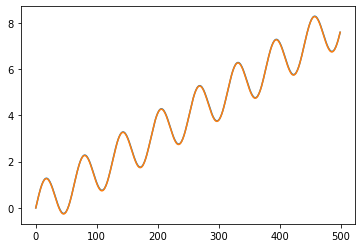

In [10]:
plt.plot(y_pred_train[0,:500,0])
plt.plot(X_train[0,:500,0])

In [11]:
# Forecast test set
size_train = X_train.shape[0]*X_train.shape[1]
y_pred_test_init = np.zeros((X_test.shape[0],1+X_test.shape[1],dim_aug))
for j in range(X_test.shape[0]):
    if j>=1:
        tmp = torch.from_numpy(y_pred_test_init[j-1,-1:,:]).double()
    else:
        tmp = inp_conc[-1:,:].clone()
    #tmp[:,:1] = (X_test[j,:1,:])
    y_pred_test_init[j,0,:] = tmp.data.numpy()
    for i in range(1,y_pred_test_init.shape[1]):
        tf = torch.from_numpy(np.array(params['dt_integration']*(size_train-1 +i +batch_size_test*(j)))).double().unsqueeze(0).unsqueeze(0)
        t0 = torch.from_numpy(np.array(params['dt_integration']*(size_train-1 +i-1+batch_size_test*(j)))).double().unsqueeze(0).unsqueeze(0)
        y_pred_test_init[j,i,:] = model(tmp,tf,t0)[0].cpu().data.numpy()
        tmp = (torch.from_numpy(np.reshape(y_pred_test_init[j,i,:],(1,dim_aug))).double())

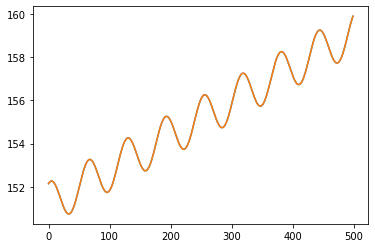

In [12]:
plt.plot(y_pred_test_init[-1,1:,0])
plt.plot(X_test[-1,:,0])

In [13]:
out_res = {}
out_res['train_data'] = X_train.detach().numpy() 
out_res['test_data'] = X_test.detach().numpy()
out_res['dt']  =dt
out_res['infered_train'] = y_pred_train
out_res['infered_test']  =y_pred_test_init

In [14]:
pickle_out = open(output_file_folder+file_name_results+".pkl","wb")
pickle.dump(out_res, pickle_out)
pickle_out.close()

In [15]:
file_to_read = open(output_file_folder+file_name_results+".pkl", "rb")
res = pickle.load(file_to_read)

In [16]:
def R_C_E(y_true, y_pred): 
    return (np.sum((y_true - (y_pred))**2)/ np.sum(y_true**2)) *100
idx = 0
test_batch = res['test_data']#[idx][:,:]
pred_batch = res['infered_test']#[idx][:res['test_data'][idx].shape[0],:2]

In [17]:
print('error first 1000 samples: ', R_C_E(test_batch[0,:,0],pred_batch[0,1:,0]))
print('error second 1000 samples: ', R_C_E(test_batch[1,:-1,0],pred_batch[1,1:-1,0]))
print('error third 1000 samples: ', R_C_E(test_batch[-1,:-1,0],pred_batch[-1,1:-1,0]))

error first 1000 samples:  3.6737472100530155e-13
error second 1000 samples:  1.8482613336795695e-13
error third 1000 samples:  8.088313518170621e-14


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


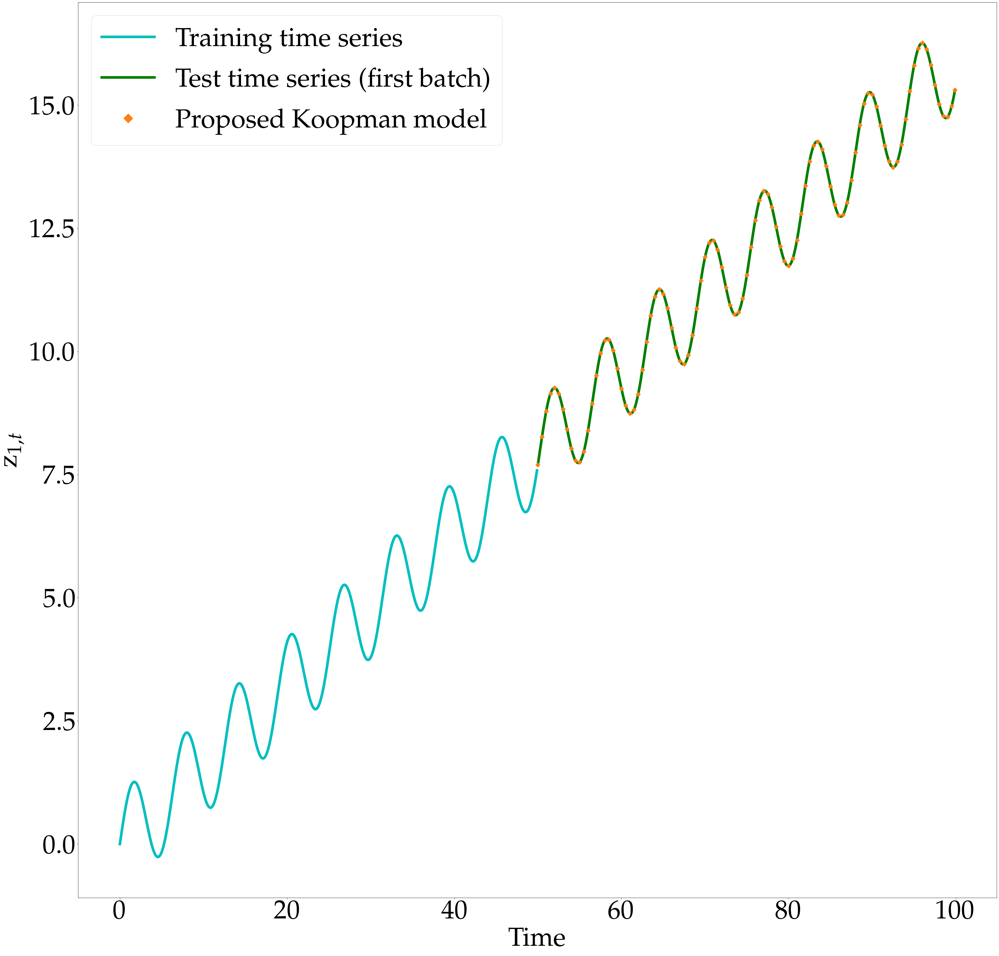

In [18]:

plt.rcParams["mathtext.fontset"] = "cm"
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 80})
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
## for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
fig=plt.figure(figsize=(50,50))

train_series     = np.zeros((500*2,1))*np.nan
test_series      = np.zeros((500*2,1))*np.nan
predicted_series = np.zeros((500*2,1))*np.nan

train_series[:500,:]     = res['train_data'][0,:,:]
test_series[500:,:]      = res['test_data'][0,:,:]
predicted_series[500:,:][::5] = res['infered_test'][0,1:,:1][::5]
predicted_series[-1,:] = res['infered_test'][0,-1,:1]
plt.plot(np.linspace(0,1000*0.1-0.1,1000),train_series,lw = 8,c = 'c',label = 'Training time series')
plt.plot(np.linspace(0,1000*0.1-0.1,1000),test_series,lw = 8,c = 'g',label = 'Test time series (first batch)')
plt.plot(np.linspace(0,1000*0.1-0.1,1000),predicted_series,"D",c = 'tab:orange',markersize=10,label = 'Proposed Koopman model')

plt.xlabel('Time')
plt.ylabel('${\mathrm{z}}_{1,t}$')
plt.legend(markerscale=2)